In [1]:
!wget -O images.zip https://www.dropbox.com/s/0vyzjcqsdl6cqi2/state-farm-distracted-driver-detection.zip?dl=0
!unzip images.zip
!rm images.zip

--2024-07-01 11:10:40--  https://www.dropbox.com/s/0vyzjcqsdl6cqi2/state-farm-distracted-driver-detection.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6027:18::a27d:4812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/z1ltom72vfkw424wgxwvg/state-farm-distracted-driver-detection.zip?rlkey=bydwgjsezgyf0eki4ecb0oeti&dl=0 [following]
--2024-07-01 11:10:41--  https://www.dropbox.com/scl/fi/z1ltom72vfkw424wgxwvg/state-farm-distracted-driver-detection.zip?rlkey=bydwgjsezgyf0eki4ecb0oeti&dl=0
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc11ca29f4ae84e787d72fa360d9.dl.dropboxusercontent.com/cd/0/inline/CV2ikXOnPTaIw4G2ONJgvxfLdjJz2xDNXsgIGCyfxLL01F0mK-tr0c3pDRH77CpNNM2cbD2JhixleeVMQ8ZLJapBlWYl-nZZ5_H_hy4snLWYECtX6Tsqsrilsahjlq1I9bg/file# [following]
--2024-07-01 1

In [2]:
ls

driver_imgs_list.csv  imgs.zip  sample_data/  sample_submission.csv


In [3]:
!unzip /content/imgs.zip

!rm /content/imgs.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/c7/img_56661.jpg  
  inflating: train/c7/img_56699.jpg  
  inflating: train/c7/img_56717.jpg  
  inflating: train/c7/img_56724.jpg  
  inflating: train/c7/img_56768.jpg  
  inflating: train/c7/img_56779.jpg  
  inflating: train/c7/img_56849.jpg  
  inflating: train/c7/img_56899.jpg  
  inflating: train/c7/img_56938.jpg  
  inflating: train/c7/img_5706.jpg   
  inflating: train/c7/img_57076.jpg  
  inflating: train/c7/img_57122.jpg  
  inflating: train/c7/img_57137.jpg  
  inflating: train/c7/img_5715.jpg   
  inflating: train/c7/img_57278.jpg  
  inflating: train/c7/img_57321.jpg  
  inflating: train/c7/img_57345.jpg  
  inflating: train/c7/img_57355.jpg  
  inflating: train/c7/img_5741.jpg   
  inflating: train/c7/img_57433.jpg  
  inflating: train/c7/img_5753.jpg   
  inflating: train/c7/img_57559.jpg  
  inflating: train/c7/img_57594.jpg  
  inflating: train/c7/img_5771.jpg   
  inflating: train/c7/img_57712.jpg  

In [4]:
import pandas as pd
import numpy as np
import os
from tqdm import tqdm
from keras.utils import to_categorical, Sequence
from sklearn.model_selection import train_test_split
from keras.applications import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input
from keras.models import Model
from keras.layers import GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.optimizers import Adam
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score

In [5]:
data= pd.read_csv('driver_imgs_list.csv')
data

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg
...,...,...,...
22419,p081,c9,img_56936.jpg
22420,p081,c9,img_46218.jpg
22421,p081,c9,img_25946.jpg
22422,p081,c9,img_67850.jpg


Image preprocessing

In [6]:
data['classname'].value_counts()

classname
c0    2489
c3    2346
c4    2326
c6    2325
c2    2317
c5    2312
c1    2267
c9    2129
c7    2002
c8    1911
Name: count, dtype: int64

In [7]:
num_classes= data['classname'].nunique()

In [8]:
train_dir= '/content/train'
test_dir= '/content/test'

train_img= []
for item in os.listdir(train_dir):
  path= os.path.join(train_dir, item)
  train_img.extend(os.listdir(path))

train_data= data[data['img'].isin(train_img)]

train_data.shape

(22424, 3)

In [9]:
train_data.drop(columns= ['subject'], inplace= True)
train_data

,classname,img
0,c0,img_44733.jpg
1,c0,img_72999.jpg
2,c0,img_25094.jpg
3,c0,img_69092.jpg
4,c0,img_92629.jpg
...,...,...
22419,c9,img_56936.jpg
22420,c9,img_46218.jpg
22421,c9,img_25946.jpg
22422,c9,img_67850.jpg


In [10]:
# Creating training and validation dataset

train, val= train_test_split(train_data, test_size= 0.1, random_state= 9, stratify= train_data['classname'])

train.shape, val.shape

((20181, 2), (2243, 2))

In [11]:
for item in [train, val]:
  item.reset_index(drop= True, inplace= True)

train

,classname,img
0,c4,img_81249.jpg
1,c0,img_7608.jpg
2,c3,img_2381.jpg
3,c9,img_43540.jpg
4,c9,img_42779.jpg
...,...,...
20176,c5,img_80030.jpg
20177,c3,img_88859.jpg
20178,c2,img_80176.jpg
20179,c3,img_38717.jpg


In [12]:
#  Function to load image
def img_extractor(img_path):
    try:
      img= image.load_img(img_path, target_size=(224, 224))
      x= image.img_to_array(img)
      x= preprocess_input(x)
      return x
    except:
      print('Failed to extract image feature')
      return None

In [13]:
#  Creating a generator class
class DataGenerator(Sequence):
  def __init__(self, data, batch_size, num_classes= num_classes, dir= train_dir, img_loader=img_extractor):
    self.data= data
    self.batch_size= batch_size
    self.num_classes= num_classes
    if 'classname' in self.data.columns and not self.data['classname'].empty:
      self.classnames= sorted(self.data['classname'].unique())
      self.class_to_onehot = {cls: idx for idx, cls in enumerate(self.classnames)}
    else:
      self.classnames= None
    self.indices= np.arange(len(self.data))
    self.on_epoch_end()
    self.dir= dir
    self.img_extractor= img_loader

  def __len__(self):
    return int(np.ceil(len(self.data) / self.batch_size))

  def on_epoch_end(self):
    np.random.shuffle(self.indices)

  def __getitem__(self, index):
    batch_indices= self.indices[index * self.batch_size: (index + 1) * self.batch_size]

    x= np.empty((len(batch_indices), 224, 224, 3))
    if self.classnames is not None:
      y= np.empty((len(batch_indices),), dtype=int)

    for i, index in enumerate(batch_indices):
      if self.classnames is not None:
        img_path= os.path.join(self.dir, self.data.iloc[index]['classname'], self.data.iloc[index]['img'])
      else:
        img_path= os.path.join(self.dir, self.data.iloc[index]['img'])
      image= self.img_extractor(img_path)
      if image is not None:
        x[i,] = image
        if self.classnames is not None:
          y[i] = self.class_to_onehot[self.data.iloc[index]['classname']]
    if self.classnames is not None:
      return x, y
    else:
      return x, batch_indices

In [14]:
train_data= DataGenerator(train, batch_size= 10, num_classes= num_classes)
val_data= DataGenerator(val, batch_size= 10, num_classes= num_classes)

In [15]:
base_model= ResNet50(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False
x= base_model.output
x= GlobalAveragePooling2D()(x)
x= Flatten()(x)
x= Dense(1024, activation='relu')(x)
x= Dropout(0.2)(x)
x= Dense(512, activation='relu')(x)
x= Dropout(0.2)(x)
output= Dense(num_classes, activation='softmax', name='classifier')(x)

model= Model(inputs= base_model.input, outputs= output)

model.summary()

94765736/94765736 [==============================] - 3s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                         

In [16]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics = ['accuracy'])

In [17]:
#  Training the model
model.fit(train_data,
          epochs= 5,
          validation_data= val_data,
          verbose=1)

Epoch 1/5
2019/2019 [==============================] - 150s 69ms/step - loss: 0.8625 - accuracy: 0.7011 - val_loss: 0.2430 - val_accuracy: 0.9215
Epoch 2/5
2019/2019 [==============================] - 156s 77ms/step - loss: 0.3700 - accuracy: 0.8776 - val_loss: 0.1829 - val_accuracy: 0.9416
Epoch 3/5
2019/2019 [==============================] - 141s 70ms/step - loss: 0.2988 - accuracy: 0.9037 - val_loss: 0.2031 - val_accuracy: 0.9273
Epoch 4/5
2019/2019 [==============================] - 135s 67ms/step - loss: 0.2609 - accuracy: 0.9179 - val_loss: 0.2012 - val_accuracy: 0.9309
Epoch 5/5
2019/2019 [==============================] - 133s 66ms/step - loss: 0.2255 - accuracy: 0.9284 - val_loss: 0.1440 - val_accuracy: 0.9554


In [18]:
#  Testing performance on the validation dataset itself as no actual prediction available for test data
val_preds= []
val_labels= []

for i in range(len(val_data)):
  x, y= val_data[i]
  val_preds.extend(model.predict(x))
  val_labels.extend(y)

val_preds= np.array(val_preds)
val_labels= np.array(val_labels)

pred_labels = np.argmax(val_preds, axis=1)

1/1 [==============================] - 0s 49ms/step


In [19]:
#  For class wise performance on validation dataset
roc_auc = roc_auc_score(val_labels, val_preds, multi_class='ovr')
precision = precision_score(val_labels, pred_labels, average=None)
recall = recall_score(val_labels, pred_labels, average=None)
f1 = f1_score(val_labels, pred_labels, average=None)

for i, classname in enumerate(val_data.classnames):
  print(f'Class: {classname}')
  print(f'\tROC-AUC: {roc_auc:.4f}')
  print(f'\tPrecision: {precision[i]:.4f}')
  print(f'\tRecall: {recall[i]:.4f}')
  print(f'\tF1 Score: {f1[i]:.4f}\n')

Class: c0
	ROC-AUC: 0.9990
	Precision: 0.9833
	Recall: 0.9438
	F1 Score: 0.9631

Class: c1
	ROC-AUC: 0.9990
	Precision: 0.9730
	Recall: 0.9515
	F1 Score: 0.9621

Class: c2
	ROC-AUC: 0.9990
	Precision: 0.9912
	Recall: 0.9741
	F1 Score: 0.9826

Class: c3
	ROC-AUC: 0.9990
	Precision: 0.9031
	Recall: 0.9915
	F1 Score: 0.9452

Class: c4
	ROC-AUC: 0.9990
	Precision: 0.9821
	Recall: 0.9399
	F1 Score: 0.9605

Class: c5
	ROC-AUC: 0.9990
	Precision: 0.9955
	Recall: 0.9610
	F1 Score: 0.9780

Class: c6
	ROC-AUC: 0.9990
	Precision: 0.9016
	Recall: 0.9871
	F1 Score: 0.9424

Class: c7
	ROC-AUC: 0.9990
	Precision: 1.0000
	Recall: 0.9100
	F1 Score: 0.9529

Class: c8
	ROC-AUC: 0.9990
	Precision: 0.8894
	Recall: 0.9686
	F1 Score: 0.9273

Class: c9
	ROC-AUC: 0.9990
	Precision: 0.9515
	Recall: 0.9202
	F1 Score: 0.9356



In [20]:
# For overall performance on validation dataset
roc_auc = roc_auc_score(val_labels, val_preds, multi_class='ovr')
precision = precision_score(val_labels, pred_labels, average='macro')
recall = recall_score(val_labels, pred_labels, average='macro')
f1 = f1_score(val_labels, pred_labels, average='macro')

print('Average Metrics:')
print(f'\tROC-AUC: {roc_auc:.4f}')
print(f'\tPrecision: {precision:.4f}')
print(f'\tRecall: {recall:.4f}')
print(f'\tF1 Score: {f1:.4f}')

Average Metrics:
	ROC-AUC: 0.9990
	Precision: 0.9571
	Recall: 0.9548
	F1 Score: 0.9550


In [21]:
test_imgs= pd.DataFrame({'img': os.listdir(test_dir)})
test_gen= DataGenerator(test_imgs, batch_size= 10, dir= test_dir)

test_predictions = []
test_imgs_list = []

for i in tqdm(range(len(test_gen)), desc='Predicting', unit='batch'):
  batch_imgs, batch_indices= test_gen[i]
  batch_predictions = model.predict(batch_imgs)

  test_predictions.extend(batch_predictions)
  test_imgs_list.extend(test_imgs.iloc[batch_indices]['img'].tolist())

#  Creating a dataframe of all the predictions
results= pd.DataFrame(test_predictions, columns= [f'c{i}' for i in range(num_classes)])
results['img']= test_imgs_list
results.insert(0, 'img', results.pop('img'))

results

Predicting:   0%|          | 0/7973 [00:00<?, ?batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:   0%|          | 1/7973 [00:00<35:03,  3.79batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:   0%|          | 2/7973 [00:00<35:46,  3.71batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:   0%|          | 3/7973 [00:00<35:09,  3.78batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   0%|          | 4/7973 [00:01<37:11,  3.57batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:   0%|          | 5/7973 [00:01<37:05,  3.58batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:   0%|          | 6/7973 [00:01<39:35,  3.35batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:   0%|          | 7/7973 [00:02<41:19,  3.21batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:   0%|          | 8/7973 [00:02<39:55,  3.32batch/s]

1/1 [==============================] - 0s 96ms/step


Predicting:   0%|          | 9/7973 [00:02<40:42,  3.26batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:   0%|          | 10/7973 [00:02<39:49,  3.33batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:   0%|          | 11/7973 [00:03<39:19,  3.37batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   0%|          | 12/7973 [00:03<39:09,  3.39batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   0%|          | 13/7973 [00:03<38:57,  3.41batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:   0%|          | 14/7973 [00:04<37:10,  3.57batch/s]

1/1 [==============================] - 0s 89ms/step


Predicting:   0%|          | 15/7973 [00:04<40:08,  3.30batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:   0%|          | 16/7973 [00:04<39:02,  3.40batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:   0%|          | 17/7973 [00:05<42:48,  3.10batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:   0%|          | 18/7973 [00:05<41:22,  3.20batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:   0%|          | 19/7973 [00:05<39:49,  3.33batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:   0%|          | 20/7973 [00:05<38:33,  3.44batch/s]

1/1 [==============================] - 0s 97ms/step


Predicting:   0%|          | 21/7973 [00:06<40:11,  3.30batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:   0%|          | 22/7973 [00:06<38:54,  3.41batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:   0%|          | 23/7973 [00:06<37:32,  3.53batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   0%|          | 24/7973 [00:07<36:17,  3.65batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:   0%|          | 25/7973 [00:07<35:42,  3.71batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:   0%|          | 26/7973 [00:07<37:14,  3.56batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   0%|          | 27/7973 [00:07<36:03,  3.67batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:   0%|          | 28/7973 [00:08<36:31,  3.63batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   0%|          | 29/7973 [00:08<36:05,  3.67batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:   0%|          | 30/7973 [00:08<36:20,  3.64batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:   0%|          | 31/7973 [00:08<37:34,  3.52batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:   0%|          | 32/7973 [00:09<37:41,  3.51batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:   0%|          | 33/7973 [00:09<38:39,  3.42batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   0%|          | 34/7973 [00:09<36:19,  3.64batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   0%|          | 35/7973 [00:10<35:53,  3.69batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   0%|          | 36/7973 [00:10<37:22,  3.54batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:   0%|          | 37/7973 [00:10<37:22,  3.54batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:   0%|          | 38/7973 [00:10<35:42,  3.70batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   0%|          | 39/7973 [00:11<34:18,  3.85batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   1%|          | 40/7973 [00:11<34:32,  3.83batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   1%|          | 41/7973 [00:11<32:59,  4.01batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   1%|          | 42/7973 [00:11<31:47,  4.16batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   1%|          | 43/7973 [00:12<31:16,  4.23batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:   1%|          | 44/7973 [00:12<31:12,  4.23batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   1%|          | 45/7973 [00:12<30:39,  4.31batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   1%|          | 46/7973 [00:12<30:11,  4.38batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:   1%|          | 47/7973 [00:12<29:56,  4.41batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   1%|          | 48/7973 [00:13<30:17,  4.36batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   1%|          | 49/7973 [00:13<31:02,  4.25batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   1%|          | 50/7973 [00:13<30:46,  4.29batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   1%|          | 51/7973 [00:13<30:59,  4.26batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 52/7973 [00:14<29:55,  4.41batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 53/7973 [00:14<28:49,  4.58batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   1%|          | 54/7973 [00:14<27:06,  4.87batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 55/7973 [00:14<25:23,  5.20batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   1%|          | 56/7973 [00:14<24:41,  5.35batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   1%|          | 57/7973 [00:15<24:39,  5.35batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 58/7973 [00:15<24:32,  5.38batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   1%|          | 59/7973 [00:15<24:53,  5.30batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 60/7973 [00:15<24:03,  5.48batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 61/7973 [00:15<23:08,  5.70batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 62/7973 [00:15<23:24,  5.63batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 63/7973 [00:16<23:42,  5.56batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   1%|          | 64/7973 [00:16<24:08,  5.46batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 65/7973 [00:16<23:43,  5.56batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 66/7973 [00:16<23:17,  5.66batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 67/7973 [00:16<23:35,  5.59batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 68/7973 [00:16<22:46,  5.79batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 69/7973 [00:17<23:20,  5.64batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 70/7973 [00:17<24:25,  5.39batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   1%|          | 71/7973 [00:17<24:11,  5.44batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 72/7973 [00:17<23:23,  5.63batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 73/7973 [00:17<23:16,  5.66batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   1%|          | 74/7973 [00:18<23:14,  5.66batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   1%|          | 75/7973 [00:18<24:08,  5.45batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 76/7973 [00:18<25:09,  5.23batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   1%|          | 77/7973 [00:18<24:01,  5.48batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 78/7973 [00:18<23:58,  5.49batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 79/7973 [00:18<23:32,  5.59batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 80/7973 [00:19<23:12,  5.67batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 81/7973 [00:19<23:55,  5.50batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 82/7973 [00:19<24:04,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   1%|          | 83/7973 [00:19<23:30,  5.59batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 84/7973 [00:19<23:02,  5.71batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   1%|          | 85/7973 [00:20<23:13,  5.66batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 86/7973 [00:20<22:50,  5.75batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   1%|          | 87/7973 [00:20<23:42,  5.55batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   1%|          | 88/7973 [00:20<23:15,  5.65batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 89/7973 [00:20<22:53,  5.74batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   1%|          | 90/7973 [00:20<23:05,  5.69batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 91/7973 [00:21<22:46,  5.77batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:   1%|          | 92/7973 [00:21<23:20,  5.63batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   1%|          | 93/7973 [00:21<23:20,  5.63batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 94/7973 [00:21<23:39,  5.55batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   1%|          | 95/7973 [00:21<23:10,  5.67batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|          | 96/7973 [00:21<23:01,  5.70batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   1%|          | 97/7973 [00:22<22:48,  5.75batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 98/7973 [00:22<23:09,  5.67batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|          | 99/7973 [00:22<23:36,  5.56batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:   1%|▏         | 100/7973 [00:22<23:18,  5.63batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   1%|▏         | 101/7973 [00:22<22:46,  5.76batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|▏         | 102/7973 [00:23<22:54,  5.73batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   1%|▏         | 103/7973 [00:23<23:41,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|▏         | 104/7973 [00:23<23:17,  5.63batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   1%|▏         | 105/7973 [00:23<23:49,  5.50batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   1%|▏         | 106/7973 [00:23<23:11,  5.65batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   1%|▏         | 107/7973 [00:23<22:33,  5.81batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   1%|▏         | 108/7973 [00:24<23:33,  5.56batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   1%|▏         | 109/7973 [00:24<25:38,  5.11batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:   1%|▏         | 110/7973 [00:24<27:55,  4.69batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   1%|▏         | 111/7973 [00:24<28:44,  4.56batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   1%|▏         | 112/7973 [00:25<28:39,  4.57batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:   1%|▏         | 113/7973 [00:25<29:45,  4.40batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   1%|▏         | 114/7973 [00:25<29:32,  4.43batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   1%|▏         | 115/7973 [00:25<29:48,  4.39batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   1%|▏         | 116/7973 [00:25<30:19,  4.32batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   1%|▏         | 117/7973 [00:26<29:31,  4.44batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   1%|▏         | 118/7973 [00:26<29:43,  4.41batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   1%|▏         | 119/7973 [00:26<29:54,  4.38batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:   2%|▏         | 120/7973 [00:26<31:19,  4.18batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   2%|▏         | 121/7973 [00:27<31:18,  4.18batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   2%|▏         | 122/7973 [00:27<31:52,  4.11batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   2%|▏         | 123/7973 [00:27<31:02,  4.22batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   2%|▏         | 124/7973 [00:27<30:57,  4.23batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   2%|▏         | 125/7973 [00:28<30:04,  4.35batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   2%|▏         | 126/7973 [00:28<30:00,  4.36batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   2%|▏         | 127/7973 [00:28<30:00,  4.36batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:   2%|▏         | 128/7973 [00:28<30:27,  4.29batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:   2%|▏         | 129/7973 [00:29<29:38,  4.41batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:   2%|▏         | 130/7973 [00:29<29:49,  4.38batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:   2%|▏         | 131/7973 [00:29<30:45,  4.25batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   2%|▏         | 132/7973 [00:29<30:27,  4.29batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   2%|▏         | 133/7973 [00:29<30:57,  4.22batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   2%|▏         | 134/7973 [00:30<30:46,  4.24batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   2%|▏         | 135/7973 [00:30<30:31,  4.28batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   2%|▏         | 136/7973 [00:30<30:15,  4.32batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   2%|▏         | 137/7973 [00:30<29:40,  4.40batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:   2%|▏         | 138/7973 [00:31<29:39,  4.40batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   2%|▏         | 139/7973 [00:31<31:22,  4.16batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:   2%|▏         | 140/7973 [00:31<31:13,  4.18batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   2%|▏         | 141/7973 [00:31<30:22,  4.30batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:   2%|▏         | 142/7973 [00:32<30:47,  4.24batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:   2%|▏         | 143/7973 [00:32<32:01,  4.07batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   2%|▏         | 144/7973 [00:32<31:07,  4.19batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:   2%|▏         | 145/7973 [00:32<30:23,  4.29batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 146/7973 [00:32<29:08,  4.48batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   2%|▏         | 147/7973 [00:33<27:02,  4.82batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 148/7973 [00:33<26:26,  4.93batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 149/7973 [00:33<25:23,  5.13batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 150/7973 [00:33<24:20,  5.36batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 151/7973 [00:33<23:24,  5.57batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 152/7973 [00:34<23:21,  5.58batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   2%|▏         | 153/7973 [00:34<23:10,  5.63batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 154/7973 [00:34<23:06,  5.64batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   2%|▏         | 155/7973 [00:34<22:53,  5.69batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 156/7973 [00:34<22:16,  5.85batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 157/7973 [00:34<22:09,  5.88batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   2%|▏         | 158/7973 [00:35<23:08,  5.63batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:   2%|▏         | 159/7973 [00:35<23:05,  5.64batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 160/7973 [00:35<23:16,  5.60batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   2%|▏         | 161/7973 [00:35<23:27,  5.55batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 162/7973 [00:35<22:51,  5.70batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 163/7973 [00:35<22:23,  5.81batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   2%|▏         | 164/7973 [00:36<23:18,  5.58batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 165/7973 [00:36<24:01,  5.42batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   2%|▏         | 166/7973 [00:36<23:12,  5.61batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 167/7973 [00:36<23:25,  5.56batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 168/7973 [00:36<22:46,  5.71batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 169/7973 [00:37<22:41,  5.73batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 170/7973 [00:37<22:54,  5.68batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 171/7973 [00:37<23:32,  5.52batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 172/7973 [00:37<23:01,  5.64batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 173/7973 [00:37<22:56,  5.67batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 174/7973 [00:37<22:44,  5.72batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   2%|▏         | 175/7973 [00:38<22:31,  5.77batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:   2%|▏         | 176/7973 [00:38<23:42,  5.48batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 177/7973 [00:38<23:38,  5.50batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   2%|▏         | 178/7973 [00:38<23:28,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 179/7973 [00:38<23:20,  5.56batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 180/7973 [00:38<22:47,  5.70batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 181/7973 [00:39<22:23,  5.80batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 182/7973 [00:39<23:03,  5.63batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 183/7973 [00:39<23:36,  5.50batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 184/7973 [00:39<23:08,  5.61batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 185/7973 [00:39<23:21,  5.56batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   2%|▏         | 186/7973 [00:40<22:36,  5.74batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:   2%|▏         | 187/7973 [00:40<23:25,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 188/7973 [00:40<23:47,  5.45batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 189/7973 [00:40<23:33,  5.51batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 190/7973 [00:40<23:00,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   2%|▏         | 191/7973 [00:40<22:24,  5.79batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 192/7973 [00:41<22:39,  5.72batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   2%|▏         | 193/7973 [00:41<23:37,  5.49batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 194/7973 [00:41<24:48,  5.22batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 195/7973 [00:41<23:58,  5.41batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 196/7973 [00:41<23:21,  5.55batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   2%|▏         | 197/7973 [00:42<22:46,  5.69batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   2%|▏         | 198/7973 [00:42<22:40,  5.71batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   2%|▏         | 199/7973 [00:42<23:29,  5.52batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 200/7973 [00:42<23:26,  5.53batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 201/7973 [00:42<23:01,  5.63batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   3%|▎         | 202/7973 [00:42<23:40,  5.47batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   3%|▎         | 203/7973 [00:43<25:50,  5.01batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   3%|▎         | 204/7973 [00:43<27:07,  4.77batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   3%|▎         | 205/7973 [00:43<27:30,  4.71batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   3%|▎         | 206/7973 [00:43<27:38,  4.68batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   3%|▎         | 207/7973 [00:44<27:30,  4.71batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   3%|▎         | 208/7973 [00:44<27:45,  4.66batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   3%|▎         | 209/7973 [00:44<29:04,  4.45batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   3%|▎         | 210/7973 [00:44<29:07,  4.44batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   3%|▎         | 211/7973 [00:44<29:06,  4.45batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   3%|▎         | 212/7973 [00:45<29:51,  4.33batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   3%|▎         | 213/7973 [00:45<29:18,  4.41batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   3%|▎         | 214/7973 [00:45<30:19,  4.27batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:   3%|▎         | 215/7973 [00:45<29:35,  4.37batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   3%|▎         | 216/7973 [00:46<29:33,  4.37batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   3%|▎         | 217/7973 [00:46<30:01,  4.31batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   3%|▎         | 218/7973 [00:46<30:06,  4.29batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   3%|▎         | 219/7973 [00:46<29:27,  4.39batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   3%|▎         | 220/7973 [00:47<30:08,  4.29batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   3%|▎         | 221/7973 [00:47<30:22,  4.25batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   3%|▎         | 222/7973 [00:47<29:49,  4.33batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   3%|▎         | 223/7973 [00:47<29:14,  4.42batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:   3%|▎         | 224/7973 [00:47<29:21,  4.40batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   3%|▎         | 225/7973 [00:48<28:33,  4.52batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:   3%|▎         | 226/7973 [00:48<30:48,  4.19batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:   3%|▎         | 227/7973 [00:48<31:24,  4.11batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   3%|▎         | 228/7973 [00:48<30:44,  4.20batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   3%|▎         | 229/7973 [00:49<30:18,  4.26batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   3%|▎         | 230/7973 [00:49<31:36,  4.08batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:   3%|▎         | 231/7973 [00:49<30:56,  4.17batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   3%|▎         | 232/7973 [00:49<30:04,  4.29batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:   3%|▎         | 233/7973 [00:50<29:39,  4.35batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   3%|▎         | 234/7973 [00:50<29:23,  4.39batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:   3%|▎         | 235/7973 [00:50<28:31,  4.52batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:   3%|▎         | 236/7973 [00:50<29:00,  4.44batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   3%|▎         | 237/7973 [00:50<28:16,  4.56batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   3%|▎         | 238/7973 [00:51<28:11,  4.57batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   3%|▎         | 239/7973 [00:51<29:16,  4.40batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   3%|▎         | 240/7973 [00:51<28:29,  4.52batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 241/7973 [00:51<28:18,  4.55batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 242/7973 [00:52<25:56,  4.97batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 243/7973 [00:52<24:43,  5.21batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 244/7973 [00:52<24:20,  5.29batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:   3%|▎         | 245/7973 [00:52<23:21,  5.52batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   3%|▎         | 246/7973 [00:52<23:35,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   3%|▎         | 247/7973 [00:52<22:46,  5.65batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 248/7973 [00:53<23:11,  5.55batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:   3%|▎         | 249/7973 [00:53<22:41,  5.67batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   3%|▎         | 250/7973 [00:53<22:48,  5.64batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   3%|▎         | 251/7973 [00:53<22:05,  5.82batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 252/7973 [00:53<21:49,  5.90batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 253/7973 [00:53<21:46,  5.91batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 254/7973 [00:54<22:18,  5.77batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:   3%|▎         | 255/7973 [00:54<22:28,  5.72batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 256/7973 [00:54<21:54,  5.87batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 257/7973 [00:54<22:26,  5.73batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 258/7973 [00:54<22:05,  5.82batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 259/7973 [00:54<22:07,  5.81batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 260/7973 [00:55<22:18,  5.76batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   3%|▎         | 261/7973 [00:55<22:46,  5.64batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 262/7973 [00:55<22:46,  5.64batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 263/7973 [00:55<22:44,  5.65batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 264/7973 [00:55<22:00,  5.84batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   3%|▎         | 265/7973 [00:56<22:22,  5.74batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 266/7973 [00:56<22:52,  5.62batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   3%|▎         | 267/7973 [00:56<22:33,  5.69batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 268/7973 [00:56<21:58,  5.84batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 269/7973 [00:56<21:59,  5.84batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 270/7973 [00:56<21:57,  5.85batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   3%|▎         | 271/7973 [00:57<22:13,  5.78batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 272/7973 [00:57<22:16,  5.76batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   3%|▎         | 273/7973 [00:57<22:44,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   3%|▎         | 274/7973 [00:57<22:10,  5.79batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   3%|▎         | 275/7973 [00:57<22:36,  5.67batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   3%|▎         | 276/7973 [00:57<22:31,  5.69batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   3%|▎         | 277/7973 [00:58<22:07,  5.80batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:   3%|▎         | 278/7973 [00:58<22:31,  5.70batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   3%|▎         | 279/7973 [00:58<22:02,  5.82batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   4%|▎         | 280/7973 [00:58<21:54,  5.85batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▎         | 281/7973 [00:58<21:46,  5.89batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   4%|▎         | 282/7973 [00:58<21:40,  5.91batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   4%|▎         | 283/7973 [00:59<21:00,  6.10batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:   4%|▎         | 284/7973 [00:59<21:58,  5.83batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   4%|▎         | 285/7973 [00:59<21:27,  5.97batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▎         | 286/7973 [00:59<21:34,  5.94batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▎         | 287/7973 [00:59<21:01,  6.09batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   4%|▎         | 288/7973 [00:59<20:32,  6.24batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   4%|▎         | 289/7973 [01:00<20:51,  6.14batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:   4%|▎         | 290/7973 [01:00<20:36,  6.21batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   4%|▎         | 291/7973 [01:00<20:16,  6.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   4%|▎         | 292/7973 [01:00<20:44,  6.17batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▎         | 293/7973 [01:00<21:04,  6.07batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   4%|▎         | 294/7973 [01:00<20:31,  6.24batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▎         | 295/7973 [01:01<21:29,  5.96batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:   4%|▎         | 296/7973 [01:01<21:49,  5.86batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▎         | 297/7973 [01:01<21:57,  5.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   4%|▎         | 298/7973 [01:01<22:04,  5.79batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▍         | 299/7973 [01:01<22:12,  5.76batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   4%|▍         | 300/7973 [01:02<23:51,  5.36batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:   4%|▍         | 301/7973 [01:02<25:45,  4.96batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   4%|▍         | 302/7973 [01:02<26:42,  4.79batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   4%|▍         | 303/7973 [01:02<26:54,  4.75batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   4%|▍         | 304/7973 [01:02<26:32,  4.82batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   4%|▍         | 305/7973 [01:03<26:20,  4.85batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:   4%|▍         | 306/7973 [01:03<27:34,  4.63batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   4%|▍         | 307/7973 [01:03<28:06,  4.54batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   4%|▍         | 308/7973 [01:03<28:55,  4.42batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   4%|▍         | 309/7973 [01:04<28:49,  4.43batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:   4%|▍         | 310/7973 [01:04<31:01,  4.12batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   4%|▍         | 311/7973 [01:04<32:21,  3.95batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   4%|▍         | 312/7973 [01:04<31:27,  4.06batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:   4%|▍         | 313/7973 [01:05<30:33,  4.18batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   4%|▍         | 314/7973 [01:05<29:42,  4.30batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   4%|▍         | 315/7973 [01:05<28:52,  4.42batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:   4%|▍         | 316/7973 [01:05<28:29,  4.48batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   4%|▍         | 317/7973 [01:05<28:16,  4.51batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   4%|▍         | 318/7973 [01:06<28:54,  4.41batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   4%|▍         | 319/7973 [01:06<30:14,  4.22batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   4%|▍         | 320/7973 [01:06<31:36,  4.03batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   4%|▍         | 321/7973 [01:06<30:22,  4.20batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:   4%|▍         | 322/7973 [01:07<29:46,  4.28batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:   4%|▍         | 323/7973 [01:07<30:33,  4.17batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   4%|▍         | 324/7973 [01:07<30:48,  4.14batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   4%|▍         | 325/7973 [01:07<29:45,  4.28batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   4%|▍         | 326/7973 [01:08<29:15,  4.36batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:   4%|▍         | 327/7973 [01:08<30:00,  4.25batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   4%|▍         | 328/7973 [01:08<30:02,  4.24batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   4%|▍         | 329/7973 [01:08<30:09,  4.22batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   4%|▍         | 330/7973 [01:09<48:55,  2.60batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   4%|▍         | 331/7973 [01:09<42:33,  2.99batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   4%|▍         | 332/7973 [01:09<38:26,  3.31batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   4%|▍         | 333/7973 [01:10<35:12,  3.62batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   4%|▍         | 334/7973 [01:10<34:00,  3.74batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   4%|▍         | 335/7973 [01:10<32:11,  3.95batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   4%|▍         | 336/7973 [01:10<31:00,  4.10batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   4%|▍         | 337/7973 [01:11<28:01,  4.54batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   4%|▍         | 338/7973 [01:11<26:31,  4.80batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   4%|▍         | 339/7973 [01:11<25:37,  4.97batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:   4%|▍         | 340/7973 [01:11<24:22,  5.22batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   4%|▍         | 341/7973 [01:11<23:14,  5.47batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▍         | 342/7973 [01:11<22:54,  5.55batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   4%|▍         | 343/7973 [01:12<22:39,  5.61batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   4%|▍         | 344/7973 [01:12<22:27,  5.66batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   4%|▍         | 345/7973 [01:12<22:45,  5.59batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:   4%|▍         | 346/7973 [01:12<22:48,  5.57batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   4%|▍         | 347/7973 [01:12<22:53,  5.55batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   4%|▍         | 348/7973 [01:12<22:44,  5.59batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   4%|▍         | 349/7973 [01:13<22:14,  5.72batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   4%|▍         | 350/7973 [01:13<23:00,  5.52batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:   4%|▍         | 351/7973 [01:13<22:56,  5.54batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   4%|▍         | 352/7973 [01:13<22:50,  5.56batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▍         | 353/7973 [01:13<22:44,  5.59batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   4%|▍         | 354/7973 [01:14<22:27,  5.65batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   4%|▍         | 355/7973 [01:14<22:51,  5.55batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   4%|▍         | 356/7973 [01:14<22:47,  5.57batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   4%|▍         | 357/7973 [01:14<22:54,  5.54batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   4%|▍         | 358/7973 [01:14<23:10,  5.48batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   5%|▍         | 359/7973 [01:14<22:23,  5.67batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   5%|▍         | 360/7973 [01:15<21:55,  5.79batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   5%|▍         | 361/7973 [01:15<22:01,  5.76batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 362/7973 [01:15<21:56,  5.78batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   5%|▍         | 363/7973 [01:15<22:08,  5.73batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 364/7973 [01:15<23:01,  5.51batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 365/7973 [01:15<22:16,  5.69batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 366/7973 [01:16<22:08,  5.73batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:   5%|▍         | 367/7973 [01:16<23:08,  5.48batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   5%|▍         | 368/7973 [01:16<22:53,  5.54batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   5%|▍         | 369/7973 [01:16<22:43,  5.58batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 370/7973 [01:16<22:11,  5.71batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   5%|▍         | 371/7973 [01:17<22:17,  5.69batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 372/7973 [01:17<22:23,  5.66batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   5%|▍         | 373/7973 [01:17<23:29,  5.39batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   5%|▍         | 374/7973 [01:17<23:14,  5.45batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   5%|▍         | 375/7973 [01:17<23:10,  5.46batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   5%|▍         | 376/7973 [01:17<22:40,  5.58batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   5%|▍         | 377/7973 [01:18<22:59,  5.51batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:   5%|▍         | 378/7973 [01:18<23:28,  5.39batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 379/7973 [01:18<23:16,  5.44batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 380/7973 [01:18<22:32,  5.62batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 381/7973 [01:18<23:05,  5.48batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   5%|▍         | 382/7973 [01:19<22:58,  5.51batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 383/7973 [01:19<22:24,  5.65batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 384/7973 [01:19<22:53,  5.53batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   5%|▍         | 385/7973 [01:19<22:14,  5.68batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 386/7973 [01:19<22:07,  5.71batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   5%|▍         | 387/7973 [01:19<22:38,  5.58batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 388/7973 [01:20<22:23,  5.64batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:   5%|▍         | 389/7973 [01:20<22:22,  5.65batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▍         | 390/7973 [01:20<22:33,  5.60batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   5%|▍         | 391/7973 [01:20<23:08,  5.46batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   5%|▍         | 392/7973 [01:20<23:00,  5.49batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   5%|▍         | 393/7973 [01:21<24:17,  5.20batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:   5%|▍         | 394/7973 [01:21<26:07,  4.83batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   5%|▍         | 395/7973 [01:21<27:14,  4.63batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   5%|▍         | 396/7973 [01:21<27:17,  4.63batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   5%|▍         | 397/7973 [01:21<27:52,  4.53batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   5%|▍         | 398/7973 [01:22<27:36,  4.57batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   5%|▌         | 399/7973 [01:22<28:20,  4.45batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   5%|▌         | 400/7973 [01:22<28:26,  4.44batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   5%|▌         | 401/7973 [01:22<27:58,  4.51batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   5%|▌         | 402/7973 [01:23<28:41,  4.40batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   5%|▌         | 403/7973 [01:23<28:46,  4.38batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   5%|▌         | 404/7973 [01:23<28:10,  4.48batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   5%|▌         | 405/7973 [01:23<28:19,  4.45batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   5%|▌         | 406/7973 [01:23<28:14,  4.46batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   5%|▌         | 407/7973 [01:24<28:33,  4.42batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   5%|▌         | 408/7973 [01:24<28:46,  4.38batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   5%|▌         | 409/7973 [01:24<28:48,  4.38batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   5%|▌         | 410/7973 [01:24<28:19,  4.45batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   5%|▌         | 411/7973 [01:25<28:53,  4.36batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   5%|▌         | 412/7973 [01:25<28:38,  4.40batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   5%|▌         | 413/7973 [01:25<28:54,  4.36batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   5%|▌         | 414/7973 [01:25<28:27,  4.43batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   5%|▌         | 415/7973 [01:26<27:27,  4.59batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   5%|▌         | 416/7973 [01:26<27:54,  4.51batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:   5%|▌         | 417/7973 [01:26<28:00,  4.50batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   5%|▌         | 418/7973 [01:26<27:55,  4.51batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   5%|▌         | 419/7973 [01:26<27:22,  4.60batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   5%|▌         | 420/7973 [01:27<27:31,  4.57batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   5%|▌         | 421/7973 [01:27<27:54,  4.51batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   5%|▌         | 422/7973 [01:27<27:44,  4.54batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   5%|▌         | 423/7973 [01:27<27:13,  4.62batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   5%|▌         | 424/7973 [01:27<27:18,  4.61batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   5%|▌         | 425/7973 [01:28<27:41,  4.54batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   5%|▌         | 426/7973 [01:28<28:34,  4.40batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   5%|▌         | 427/7973 [01:28<28:19,  4.44batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   5%|▌         | 428/7973 [01:28<27:34,  4.56batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   5%|▌         | 429/7973 [01:29<27:14,  4.62batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:   5%|▌         | 430/7973 [01:29<29:10,  4.31batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   5%|▌         | 431/7973 [01:29<29:09,  4.31batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   5%|▌         | 432/7973 [01:29<28:30,  4.41batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   5%|▌         | 433/7973 [01:30<27:34,  4.56batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   5%|▌         | 434/7973 [01:30<25:50,  4.86batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   5%|▌         | 435/7973 [01:30<24:36,  5.11batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   5%|▌         | 436/7973 [01:30<24:06,  5.21batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   5%|▌         | 437/7973 [01:30<22:59,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   5%|▌         | 438/7973 [01:30<22:40,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 439/7973 [01:31<21:47,  5.76batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   6%|▌         | 440/7973 [01:31<21:19,  5.89batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   6%|▌         | 441/7973 [01:31<21:31,  5.83batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   6%|▌         | 442/7973 [01:31<21:53,  5.73batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 443/7973 [01:31<21:48,  5.75batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 444/7973 [01:31<21:43,  5.78batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 445/7973 [01:32<22:05,  5.68batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:   6%|▌         | 446/7973 [01:32<21:59,  5.70batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 447/7973 [01:32<21:49,  5.75batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   6%|▌         | 448/7973 [01:32<21:34,  5.81batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   6%|▌         | 449/7973 [01:32<21:04,  5.95batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   6%|▌         | 450/7973 [01:32<21:13,  5.91batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 451/7973 [01:33<21:05,  5.94batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:   6%|▌         | 452/7973 [01:33<21:03,  5.95batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 453/7973 [01:33<20:43,  6.05batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 454/7973 [01:33<21:12,  5.91batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 455/7973 [01:33<21:15,  5.89batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   6%|▌         | 456/7973 [01:33<20:44,  6.04batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 457/7973 [01:34<21:07,  5.93batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:   6%|▌         | 458/7973 [01:34<21:07,  5.93batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   6%|▌         | 459/7973 [01:34<20:47,  6.02batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   6%|▌         | 460/7973 [01:34<20:46,  6.03batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 461/7973 [01:34<20:31,  6.10batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 462/7973 [01:34<20:47,  6.02batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 463/7973 [01:35<21:00,  5.96batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:   6%|▌         | 464/7973 [01:35<21:48,  5.74batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 465/7973 [01:35<21:38,  5.78batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 466/7973 [01:35<21:55,  5.71batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   6%|▌         | 467/7973 [01:35<21:52,  5.72batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   6%|▌         | 468/7973 [01:35<21:13,  5.89batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 469/7973 [01:36<21:13,  5.89batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   6%|▌         | 470/7973 [01:36<21:06,  5.93batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   6%|▌         | 471/7973 [01:36<21:15,  5.88batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   6%|▌         | 472/7973 [01:36<21:56,  5.70batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 473/7973 [01:36<21:04,  5.93batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   6%|▌         | 474/7973 [01:36<21:14,  5.89batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   6%|▌         | 475/7973 [01:37<21:05,  5.93batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   6%|▌         | 476/7973 [01:37<21:14,  5.88batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   6%|▌         | 477/7973 [01:37<21:36,  5.78batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   6%|▌         | 478/7973 [01:37<21:19,  5.86batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   6%|▌         | 479/7973 [01:37<21:19,  5.86batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   6%|▌         | 480/7973 [01:38<21:01,  5.94batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 481/7973 [01:38<21:24,  5.83batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 482/7973 [01:38<21:59,  5.68batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 483/7973 [01:38<21:33,  5.79batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   6%|▌         | 484/7973 [01:38<21:34,  5.78batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   6%|▌         | 485/7973 [01:38<21:04,  5.92batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 486/7973 [01:39<21:07,  5.91batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 487/7973 [01:39<21:20,  5.85batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 488/7973 [01:39<21:40,  5.76batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   6%|▌         | 489/7973 [01:39<21:35,  5.78batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   6%|▌         | 490/7973 [01:39<22:16,  5.60batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   6%|▌         | 491/7973 [01:39<22:06,  5.64batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   6%|▌         | 492/7973 [01:40<23:40,  5.27batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   6%|▌         | 493/7973 [01:40<25:50,  4.83batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   6%|▌         | 494/7973 [01:40<26:40,  4.67batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   6%|▌         | 495/7973 [01:40<27:15,  4.57batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   6%|▌         | 496/7973 [01:41<27:21,  4.55batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   6%|▌         | 497/7973 [01:41<27:24,  4.55batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:   6%|▌         | 498/7973 [01:41<28:55,  4.31batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:   6%|▋         | 499/7973 [01:41<30:15,  4.12batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   6%|▋         | 500/7973 [01:42<30:04,  4.14batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   6%|▋         | 501/7973 [01:42<29:54,  4.16batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   6%|▋         | 502/7973 [01:42<29:36,  4.20batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   6%|▋         | 503/7973 [01:42<29:00,  4.29batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:   6%|▋         | 504/7973 [01:43<29:23,  4.24batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   6%|▋         | 505/7973 [01:43<28:53,  4.31batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:   6%|▋         | 506/7973 [01:43<28:57,  4.30batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:   6%|▋         | 507/7973 [01:43<28:28,  4.37batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   6%|▋         | 508/7973 [01:43<29:22,  4.23batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   6%|▋         | 509/7973 [01:44<28:33,  4.36batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:   6%|▋         | 510/7973 [01:44<29:02,  4.28batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   6%|▋         | 511/7973 [01:44<28:29,  4.36batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   6%|▋         | 512/7973 [01:44<28:20,  4.39batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   6%|▋         | 513/7973 [01:45<28:19,  4.39batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:   6%|▋         | 514/7973 [01:45<28:00,  4.44batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:   6%|▋         | 515/7973 [01:45<27:49,  4.47batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   6%|▋         | 516/7973 [01:45<28:12,  4.41batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   6%|▋         | 517/7973 [01:45<28:17,  4.39batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   6%|▋         | 518/7973 [01:46<28:20,  4.38batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   7%|▋         | 519/7973 [01:46<28:54,  4.30batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   7%|▋         | 520/7973 [01:46<28:13,  4.40batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   7%|▋         | 521/7973 [01:46<27:21,  4.54batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:   7%|▋         | 522/7973 [01:47<27:23,  4.53batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   7%|▋         | 523/7973 [01:47<27:31,  4.51batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   7%|▋         | 524/7973 [01:47<27:21,  4.54batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   7%|▋         | 525/7973 [01:47<27:27,  4.52batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   7%|▋         | 526/7973 [01:47<27:08,  4.57batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:   7%|▋         | 527/7973 [01:48<27:23,  4.53batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   7%|▋         | 528/7973 [01:48<27:47,  4.46batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   7%|▋         | 529/7973 [01:48<27:30,  4.51batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   7%|▋         | 530/7973 [01:48<26:56,  4.60batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   7%|▋         | 531/7973 [01:49<27:35,  4.50batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   7%|▋         | 532/7973 [01:49<26:20,  4.71batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   7%|▋         | 533/7973 [01:49<24:20,  5.09batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   7%|▋         | 534/7973 [01:49<22:56,  5.40batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   7%|▋         | 535/7973 [01:49<22:37,  5.48batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 536/7973 [01:49<21:42,  5.71batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 537/7973 [01:50<21:33,  5.75batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   7%|▋         | 538/7973 [01:50<22:05,  5.61batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 539/7973 [01:50<21:56,  5.65batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 540/7973 [01:50<21:43,  5.70batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 541/7973 [01:50<20:58,  5.91batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   7%|▋         | 542/7973 [01:50<20:54,  5.92batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 543/7973 [01:51<20:42,  5.98batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   7%|▋         | 544/7973 [01:51<21:27,  5.77batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   7%|▋         | 545/7973 [01:51<21:01,  5.89batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 546/7973 [01:51<21:14,  5.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 547/7973 [01:51<21:10,  5.85batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 548/7973 [01:51<21:13,  5.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 549/7973 [01:52<20:48,  5.94batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:   7%|▋         | 550/7973 [01:52<21:42,  5.70batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:   7%|▋         | 551/7973 [01:52<20:58,  5.90batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 552/7973 [01:52<21:10,  5.84batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 553/7973 [01:52<21:23,  5.78batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 554/7973 [01:52<20:49,  5.94batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   7%|▋         | 555/7973 [01:53<20:38,  5.99batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:   7%|▋         | 556/7973 [01:53<21:57,  5.63batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 557/7973 [01:53<21:43,  5.69batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   7%|▋         | 558/7973 [01:53<21:32,  5.74batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 559/7973 [01:53<21:28,  5.76batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   7%|▋         | 560/7973 [01:54<21:06,  5.85batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 561/7973 [01:54<20:34,  6.01batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 562/7973 [01:54<21:25,  5.76batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 563/7973 [01:54<21:07,  5.85batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 564/7973 [01:54<21:18,  5.80batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   7%|▋         | 565/7973 [01:54<20:46,  5.94batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 566/7973 [01:55<20:46,  5.94batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   7%|▋         | 567/7973 [01:55<20:50,  5.92batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:   7%|▋         | 568/7973 [01:55<21:33,  5.73batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 569/7973 [01:55<21:19,  5.78batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 570/7973 [01:55<21:37,  5.71batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   7%|▋         | 571/7973 [01:55<21:57,  5.62batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 572/7973 [01:56<21:12,  5.82batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:   7%|▋         | 573/7973 [01:56<21:33,  5.72batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 574/7973 [01:56<21:20,  5.78batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   7%|▋         | 575/7973 [01:56<21:26,  5.75batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 576/7973 [01:56<21:19,  5.78batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 577/7973 [01:56<20:52,  5.90batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 578/7973 [01:57<20:55,  5.89batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:   7%|▋         | 579/7973 [01:57<21:53,  5.63batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 580/7973 [01:57<22:26,  5.49batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 581/7973 [01:57<21:53,  5.63batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   7%|▋         | 582/7973 [01:57<21:40,  5.68batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 583/7973 [01:58<21:20,  5.77batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   7%|▋         | 584/7973 [01:58<21:27,  5.74batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 585/7973 [01:58<21:51,  5.63batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   7%|▋         | 586/7973 [01:58<21:43,  5.67batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 587/7973 [01:58<21:34,  5.71batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   7%|▋         | 588/7973 [01:58<21:00,  5.86batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   7%|▋         | 589/7973 [01:59<21:20,  5.77batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:   7%|▋         | 590/7973 [01:59<22:28,  5.48batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:   7%|▋         | 591/7973 [01:59<23:16,  5.29batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   7%|▋         | 592/7973 [01:59<24:28,  5.03batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   7%|▋         | 593/7973 [01:59<24:39,  4.99batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   7%|▋         | 594/7973 [02:00<25:13,  4.87batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   7%|▋         | 595/7973 [02:00<25:53,  4.75batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:   7%|▋         | 596/7973 [02:00<26:09,  4.70batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   7%|▋         | 597/7973 [02:00<26:37,  4.62batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   8%|▊         | 598/7973 [02:01<26:43,  4.60batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   8%|▊         | 599/7973 [02:01<26:17,  4.67batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   8%|▊         | 600/7973 [02:01<26:09,  4.70batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:   8%|▊         | 601/7973 [02:01<26:39,  4.61batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:   8%|▊         | 602/7973 [02:01<27:43,  4.43batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:   8%|▊         | 603/7973 [02:02<27:14,  4.51batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   8%|▊         | 604/7973 [02:02<27:23,  4.48batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   8%|▊         | 605/7973 [02:02<27:20,  4.49batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:   8%|▊         | 606/7973 [02:02<27:16,  4.50batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   8%|▊         | 607/7973 [02:03<27:23,  4.48batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   8%|▊         | 608/7973 [02:03<26:57,  4.55batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   8%|▊         | 609/7973 [02:03<26:47,  4.58batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:   8%|▊         | 610/7973 [02:03<26:37,  4.61batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   8%|▊         | 611/7973 [02:03<27:07,  4.52batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   8%|▊         | 612/7973 [02:04<26:43,  4.59batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   8%|▊         | 613/7973 [02:04<27:21,  4.49batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   8%|▊         | 614/7973 [02:04<27:16,  4.50batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   8%|▊         | 615/7973 [02:04<26:50,  4.57batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   8%|▊         | 616/7973 [02:04<27:22,  4.48batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   8%|▊         | 617/7973 [02:05<27:21,  4.48batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   8%|▊         | 618/7973 [02:05<27:43,  4.42batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   8%|▊         | 619/7973 [02:05<27:18,  4.49batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:   8%|▊         | 620/7973 [02:05<27:18,  4.49batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:   8%|▊         | 621/7973 [02:06<26:57,  4.55batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   8%|▊         | 622/7973 [02:06<27:32,  4.45batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   8%|▊         | 623/7973 [02:06<26:56,  4.55batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   8%|▊         | 624/7973 [02:06<26:47,  4.57batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   8%|▊         | 625/7973 [02:07<28:07,  4.35batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   8%|▊         | 626/7973 [02:07<27:37,  4.43batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   8%|▊         | 627/7973 [02:07<27:07,  4.51batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   8%|▊         | 628/7973 [02:07<26:55,  4.55batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:   8%|▊         | 629/7973 [02:07<27:35,  4.44batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   8%|▊         | 630/7973 [02:08<27:43,  4.41batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   8%|▊         | 631/7973 [02:08<28:01,  4.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 632/7973 [02:08<25:37,  4.77batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:   8%|▊         | 633/7973 [02:08<24:39,  4.96batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   8%|▊         | 634/7973 [02:08<23:44,  5.15batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:   8%|▊         | 635/7973 [02:09<22:58,  5.32batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 636/7973 [02:09<22:04,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 637/7973 [02:09<21:46,  5.62batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   8%|▊         | 638/7973 [02:09<21:08,  5.78batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 639/7973 [02:09<20:46,  5.88batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 640/7973 [02:09<20:41,  5.91batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 641/7973 [02:10<20:56,  5.84batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 642/7973 [02:10<20:38,  5.92batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   8%|▊         | 643/7973 [02:10<21:45,  5.62batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 644/7973 [02:10<21:11,  5.76batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 645/7973 [02:10<20:49,  5.87batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 646/7973 [02:10<20:21,  6.00batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   8%|▊         | 647/7973 [02:11<20:26,  5.97batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:   8%|▊         | 648/7973 [02:11<20:36,  5.93batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 649/7973 [02:11<20:35,  5.93batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   8%|▊         | 650/7973 [02:11<20:44,  5.88batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 651/7973 [02:11<20:17,  6.02batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 652/7973 [02:11<20:50,  5.85batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 653/7973 [02:12<20:43,  5.89batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:   8%|▊         | 654/7973 [02:12<21:08,  5.77batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 655/7973 [02:12<20:48,  5.86batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 656/7973 [02:12<20:55,  5.83batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   8%|▊         | 657/7973 [02:12<20:55,  5.83batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   8%|▊         | 658/7973 [02:12<20:55,  5.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 659/7973 [02:13<20:58,  5.81batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:   8%|▊         | 660/7973 [02:13<21:31,  5.66batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 661/7973 [02:13<21:19,  5.72batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 662/7973 [02:13<21:15,  5.73batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   8%|▊         | 663/7973 [02:13<20:27,  5.95batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 664/7973 [02:13<20:48,  5.85batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 665/7973 [02:14<20:19,  5.99batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   8%|▊         | 666/7973 [02:14<20:25,  5.96batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   8%|▊         | 667/7973 [02:14<20:32,  5.93batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 668/7973 [02:14<20:07,  6.05batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 669/7973 [02:14<20:07,  6.05batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:   8%|▊         | 670/7973 [02:14<19:59,  6.09batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   8%|▊         | 671/7973 [02:15<20:00,  6.08batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:   8%|▊         | 672/7973 [02:15<20:42,  5.88batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   8%|▊         | 673/7973 [02:15<20:28,  5.94batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 674/7973 [02:15<20:40,  5.88batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   8%|▊         | 675/7973 [02:15<20:17,  5.99batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   8%|▊         | 676/7973 [02:15<20:34,  5.91batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   8%|▊         | 677/7973 [02:16<20:51,  5.83batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▊         | 678/7973 [02:16<21:48,  5.58batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▊         | 679/7973 [02:16<21:52,  5.56batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   9%|▊         | 680/7973 [02:16<21:17,  5.71batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   9%|▊         | 681/7973 [02:16<20:58,  5.79batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   9%|▊         | 682/7973 [02:17<20:56,  5.80batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   9%|▊         | 683/7973 [02:17<20:35,  5.90batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   9%|▊         | 684/7973 [02:17<21:25,  5.67batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▊         | 685/7973 [02:17<21:08,  5.75batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   9%|▊         | 686/7973 [02:17<20:35,  5.90batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▊         | 687/7973 [02:17<20:35,  5.90batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   9%|▊         | 688/7973 [02:18<20:35,  5.90batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:   9%|▊         | 689/7973 [02:18<21:03,  5.77batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   9%|▊         | 690/7973 [02:18<22:58,  5.28batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:   9%|▊         | 691/7973 [02:18<23:49,  5.09batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   9%|▊         | 692/7973 [02:18<24:26,  4.96batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   9%|▊         | 693/7973 [02:19<24:52,  4.88batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   9%|▊         | 694/7973 [02:19<26:04,  4.65batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:   9%|▊         | 695/7973 [02:19<26:15,  4.62batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   9%|▊         | 696/7973 [02:19<26:02,  4.66batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:   9%|▊         | 697/7973 [02:20<26:31,  4.57batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   9%|▉         | 698/7973 [02:20<26:34,  4.56batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:   9%|▉         | 699/7973 [02:20<29:48,  4.07batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   9%|▉         | 700/7973 [02:20<28:55,  4.19batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   9%|▉         | 701/7973 [02:20<27:47,  4.36batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:   9%|▉         | 702/7973 [02:21<27:37,  4.39batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   9%|▉         | 703/7973 [02:21<27:29,  4.41batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:   9%|▉         | 704/7973 [02:21<27:09,  4.46batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   9%|▉         | 705/7973 [02:21<26:40,  4.54batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   9%|▉         | 706/7973 [02:22<27:23,  4.42batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   9%|▉         | 707/7973 [02:22<27:26,  4.41batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:   9%|▉         | 708/7973 [02:22<26:51,  4.51batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   9%|▉         | 709/7973 [02:22<26:26,  4.58batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   9%|▉         | 710/7973 [02:22<26:17,  4.60batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   9%|▉         | 711/7973 [02:23<26:29,  4.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:   9%|▉         | 712/7973 [02:23<26:36,  4.55batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:   9%|▉         | 713/7973 [02:23<26:39,  4.54batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:   9%|▉         | 714/7973 [02:23<26:20,  4.59batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   9%|▉         | 715/7973 [02:24<26:24,  4.58batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:   9%|▉         | 716/7973 [02:24<27:31,  4.39batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:   9%|▉         | 717/7973 [02:24<27:51,  4.34batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:   9%|▉         | 718/7973 [02:24<27:49,  4.35batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:   9%|▉         | 719/7973 [02:24<27:23,  4.41batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:   9%|▉         | 720/7973 [02:25<26:58,  4.48batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:   9%|▉         | 721/7973 [02:25<26:19,  4.59batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:   9%|▉         | 722/7973 [02:25<26:15,  4.60batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   9%|▉         | 723/7973 [02:25<26:59,  4.48batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:   9%|▉         | 724/7973 [02:26<26:46,  4.51batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:   9%|▉         | 725/7973 [02:26<27:23,  4.41batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:   9%|▉         | 726/7973 [02:26<26:31,  4.55batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:   9%|▉         | 727/7973 [02:26<25:58,  4.65batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:   9%|▉         | 728/7973 [02:26<25:55,  4.66batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:   9%|▉         | 729/7973 [02:27<25:56,  4.65batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:   9%|▉         | 730/7973 [02:27<25:35,  4.72batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▉         | 731/7973 [02:27<24:40,  4.89batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▉         | 732/7973 [02:27<23:05,  5.23batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:   9%|▉         | 733/7973 [02:27<22:12,  5.43batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 734/7973 [02:28<21:45,  5.55batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▉         | 735/7973 [02:28<20:46,  5.81batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 736/7973 [02:28<21:04,  5.72batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:   9%|▉         | 737/7973 [02:28<20:49,  5.79batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 738/7973 [02:28<20:05,  6.00batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▉         | 739/7973 [02:28<20:16,  5.95batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 740/7973 [02:29<20:32,  5.87batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▉         | 741/7973 [02:29<20:38,  5.84batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 742/7973 [02:29<21:03,  5.72batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 743/7973 [02:29<20:33,  5.86batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   9%|▉         | 744/7973 [02:29<20:06,  5.99batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 745/7973 [02:29<20:23,  5.91batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 746/7973 [02:30<20:22,  5.91batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:   9%|▉         | 747/7973 [02:30<20:39,  5.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 748/7973 [02:30<20:37,  5.84batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▉         | 749/7973 [02:30<20:13,  5.95batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 750/7973 [02:30<20:11,  5.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 751/7973 [02:30<20:29,  5.87batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:   9%|▉         | 752/7973 [02:31<20:34,  5.85batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:   9%|▉         | 753/7973 [02:31<20:54,  5.75batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▉         | 754/7973 [02:31<20:11,  5.96batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:   9%|▉         | 755/7973 [02:31<20:15,  5.94batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▉         | 756/7973 [02:31<20:19,  5.92batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:   9%|▉         | 757/7973 [02:31<20:06,  5.98batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  10%|▉         | 758/7973 [02:32<20:16,  5.93batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  10%|▉         | 759/7973 [02:32<20:21,  5.90batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  10%|▉         | 760/7973 [02:32<20:30,  5.86batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  10%|▉         | 761/7973 [02:32<20:18,  5.92batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 762/7973 [02:32<19:52,  6.05batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  10%|▉         | 763/7973 [02:32<19:57,  6.02batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 764/7973 [02:33<20:30,  5.86batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  10%|▉         | 765/7973 [02:33<20:31,  5.85batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 766/7973 [02:33<20:24,  5.89batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 767/7973 [02:33<19:54,  6.03batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  10%|▉         | 768/7973 [02:33<19:52,  6.04batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  10%|▉         | 769/7973 [02:33<19:31,  6.15batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  10%|▉         | 770/7973 [02:34<20:13,  5.94batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  10%|▉         | 771/7973 [02:34<20:42,  5.79batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  10%|▉         | 772/7973 [02:34<20:02,  5.99batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 773/7973 [02:34<20:18,  5.91batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 774/7973 [02:34<20:09,  5.95batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  10%|▉         | 775/7973 [02:34<19:41,  6.09batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  10%|▉         | 776/7973 [02:35<20:25,  5.87batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  10%|▉         | 777/7973 [02:35<20:38,  5.81batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 778/7973 [02:35<21:25,  5.60batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  10%|▉         | 779/7973 [02:35<21:17,  5.63batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  10%|▉         | 780/7973 [02:35<20:57,  5.72batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  10%|▉         | 781/7973 [02:36<20:23,  5.88batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 782/7973 [02:36<20:44,  5.78batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  10%|▉         | 783/7973 [02:36<20:54,  5.73batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  10%|▉         | 784/7973 [02:36<20:27,  5.86batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  10%|▉         | 785/7973 [02:36<20:20,  5.89batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 786/7973 [02:36<20:09,  5.94batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  10%|▉         | 787/7973 [02:37<21:08,  5.66batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|▉         | 788/7973 [02:37<21:11,  5.65batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  10%|▉         | 789/7973 [02:37<20:45,  5.77batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  10%|▉         | 790/7973 [02:37<21:37,  5.53batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  10%|▉         | 791/7973 [02:37<22:29,  5.32batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  10%|▉         | 792/7973 [02:38<23:09,  5.17batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  10%|▉         | 793/7973 [02:38<23:57,  4.99batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  10%|▉         | 794/7973 [02:38<25:10,  4.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  10%|▉         | 795/7973 [02:38<25:29,  4.69batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  10%|▉         | 796/7973 [02:38<25:58,  4.61batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  10%|▉         | 797/7973 [02:39<25:43,  4.65batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  10%|█         | 798/7973 [02:39<26:52,  4.45batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  10%|█         | 799/7973 [02:39<26:37,  4.49batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  10%|█         | 800/7973 [02:39<26:11,  4.57batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  10%|█         | 801/7973 [02:40<26:21,  4.53batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  10%|█         | 802/7973 [02:40<25:56,  4.61batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  10%|█         | 803/7973 [02:40<26:00,  4.59batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  10%|█         | 804/7973 [02:40<25:47,  4.63batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  10%|█         | 805/7973 [02:40<26:56,  4.43batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  10%|█         | 806/7973 [02:41<26:14,  4.55batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  10%|█         | 807/7973 [02:41<26:14,  4.55batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  10%|█         | 808/7973 [02:41<26:31,  4.50batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  10%|█         | 809/7973 [02:41<25:59,  4.59batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  10%|█         | 810/7973 [02:41<25:56,  4.60batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  10%|█         | 811/7973 [02:42<26:12,  4.55batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  10%|█         | 812/7973 [02:42<26:46,  4.46batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  10%|█         | 813/7973 [02:42<27:01,  4.42batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  10%|█         | 814/7973 [02:42<27:05,  4.40batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  10%|█         | 815/7973 [02:43<26:31,  4.50batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  10%|█         | 816/7973 [02:43<26:39,  4.48batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  10%|█         | 817/7973 [02:43<27:17,  4.37batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  10%|█         | 818/7973 [02:43<27:33,  4.33batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  10%|█         | 819/7973 [02:44<27:13,  4.38batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  10%|█         | 820/7973 [02:44<26:59,  4.42batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  10%|█         | 821/7973 [02:44<26:59,  4.42batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  10%|█         | 822/7973 [02:44<26:55,  4.43batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  10%|█         | 823/7973 [02:44<26:35,  4.48batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  10%|█         | 824/7973 [02:45<26:32,  4.49batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  10%|█         | 825/7973 [02:45<26:17,  4.53batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  10%|█         | 826/7973 [02:45<25:48,  4.62batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  10%|█         | 827/7973 [02:45<25:35,  4.66batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  10%|█         | 828/7973 [02:45<25:00,  4.76batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  10%|█         | 829/7973 [02:46<25:13,  4.72batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  10%|█         | 830/7973 [02:46<25:57,  4.59batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  10%|█         | 831/7973 [02:46<25:30,  4.67batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|█         | 832/7973 [02:46<26:04,  4.56batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|█         | 833/7973 [02:47<24:13,  4.91batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|█         | 834/7973 [02:47<22:47,  5.22batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  10%|█         | 835/7973 [02:47<22:00,  5.41batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  10%|█         | 836/7973 [02:47<21:22,  5.56batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  10%|█         | 837/7973 [02:47<21:03,  5.65batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 838/7973 [02:47<20:37,  5.77batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  11%|█         | 839/7973 [02:48<20:20,  5.85batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 840/7973 [02:48<20:02,  5.93batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 841/7973 [02:48<21:28,  5.54batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 842/7973 [02:48<20:54,  5.69batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  11%|█         | 843/7973 [02:48<20:48,  5.71batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  11%|█         | 844/7973 [02:48<20:46,  5.72batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 845/7973 [02:49<20:17,  5.85batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  11%|█         | 846/7973 [02:49<20:12,  5.88batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 847/7973 [02:49<20:05,  5.91batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 848/7973 [02:49<21:21,  5.56batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  11%|█         | 849/7973 [02:49<21:16,  5.58batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 850/7973 [02:49<20:58,  5.66batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 851/7973 [02:50<21:02,  5.64batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  11%|█         | 852/7973 [02:50<21:14,  5.59batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  11%|█         | 853/7973 [02:50<21:05,  5.63batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 854/7973 [02:50<20:57,  5.66batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  11%|█         | 855/7973 [02:50<20:50,  5.69batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  11%|█         | 856/7973 [02:51<20:44,  5.72batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  11%|█         | 857/7973 [02:51<20:41,  5.73batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 858/7973 [02:51<20:50,  5.69batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  11%|█         | 859/7973 [02:51<21:27,  5.53batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 860/7973 [02:51<21:15,  5.58batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  11%|█         | 861/7973 [02:51<21:17,  5.57batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 862/7973 [02:52<20:48,  5.70batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  11%|█         | 863/7973 [02:52<20:45,  5.71batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 864/7973 [02:52<20:27,  5.79batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 865/7973 [02:52<20:16,  5.84batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 866/7973 [02:52<19:57,  5.93batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  11%|█         | 867/7973 [02:52<20:41,  5.72batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 868/7973 [02:53<21:25,  5.53batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  11%|█         | 869/7973 [02:53<21:54,  5.40batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  11%|█         | 870/7973 [02:53<20:59,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 871/7973 [02:53<20:14,  5.85batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 872/7973 [02:53<19:41,  6.01batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  11%|█         | 873/7973 [02:53<20:10,  5.86batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  11%|█         | 874/7973 [02:54<20:45,  5.70batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 875/7973 [02:54<21:17,  5.56batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 876/7973 [02:54<21:00,  5.63batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 877/7973 [02:54<20:35,  5.74batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 878/7973 [02:54<20:08,  5.87batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 879/7973 [02:55<20:08,  5.87batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 880/7973 [02:55<20:03,  5.89batch/s]

1/1 [==============================] - 0s 26ms/step


Predicting:  11%|█         | 881/7973 [02:55<20:19,  5.82batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  11%|█         | 882/7973 [02:55<20:20,  5.81batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  11%|█         | 883/7973 [02:55<20:23,  5.80batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 884/7973 [02:55<19:51,  5.95batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 885/7973 [02:56<20:22,  5.80batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  11%|█         | 886/7973 [02:56<20:23,  5.79batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  11%|█         | 887/7973 [02:56<20:32,  5.75batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  11%|█         | 888/7973 [02:56<19:59,  5.91batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  11%|█         | 889/7973 [02:56<19:20,  6.11batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  11%|█         | 890/7973 [02:56<20:25,  5.78batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  11%|█         | 891/7973 [02:57<21:39,  5.45batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  11%|█         | 892/7973 [02:57<22:30,  5.24batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  11%|█         | 893/7973 [02:57<23:29,  5.02batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  11%|█         | 894/7973 [02:57<24:12,  4.87batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  11%|█         | 895/7973 [02:58<25:10,  4.69batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  11%|█         | 896/7973 [02:58<25:30,  4.62batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  11%|█▏        | 897/7973 [02:58<26:16,  4.49batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  11%|█▏        | 898/7973 [02:58<26:18,  4.48batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  11%|█▏        | 899/7973 [02:58<26:19,  4.48batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  11%|█▏        | 900/7973 [02:59<25:54,  4.55batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  11%|█▏        | 901/7973 [02:59<26:48,  4.40batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  11%|█▏        | 902/7973 [02:59<26:31,  4.44batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  11%|█▏        | 903/7973 [02:59<26:21,  4.47batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  11%|█▏        | 904/7973 [03:00<27:04,  4.35batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  11%|█▏        | 905/7973 [03:00<27:41,  4.25batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  11%|█▏        | 906/7973 [03:00<27:11,  4.33batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  11%|█▏        | 907/7973 [03:00<26:59,  4.36batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  11%|█▏        | 908/7973 [03:00<26:23,  4.46batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  11%|█▏        | 909/7973 [03:01<25:44,  4.57batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  11%|█▏        | 910/7973 [03:01<27:18,  4.31batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  11%|█▏        | 911/7973 [03:01<27:22,  4.30batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  11%|█▏        | 912/7973 [03:01<27:09,  4.33batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  11%|█▏        | 913/7973 [03:02<26:49,  4.39batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  11%|█▏        | 914/7973 [03:02<27:14,  4.32batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  11%|█▏        | 915/7973 [03:02<26:43,  4.40batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  11%|█▏        | 916/7973 [03:02<26:32,  4.43batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  12%|█▏        | 917/7973 [03:03<26:41,  4.41batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  12%|█▏        | 918/7973 [03:03<26:13,  4.48batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  12%|█▏        | 919/7973 [03:03<27:02,  4.35batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  12%|█▏        | 920/7973 [03:03<27:05,  4.34batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  12%|█▏        | 921/7973 [03:03<27:13,  4.32batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  12%|█▏        | 922/7973 [03:04<27:03,  4.34batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  12%|█▏        | 923/7973 [03:04<27:07,  4.33batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  12%|█▏        | 924/7973 [03:04<27:05,  4.34batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  12%|█▏        | 925/7973 [03:04<26:27,  4.44batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  12%|█▏        | 926/7973 [03:05<25:59,  4.52batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  12%|█▏        | 927/7973 [03:05<26:09,  4.49batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  12%|█▏        | 928/7973 [03:05<26:07,  4.49batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  12%|█▏        | 929/7973 [03:05<25:48,  4.55batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  12%|█▏        | 930/7973 [03:05<26:03,  4.51batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  12%|█▏        | 931/7973 [03:06<26:31,  4.42batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  12%|█▏        | 932/7973 [03:06<26:49,  4.38batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  12%|█▏        | 933/7973 [03:06<25:15,  4.64batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  12%|█▏        | 934/7973 [03:06<23:25,  5.01batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 935/7973 [03:06<22:12,  5.28batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  12%|█▏        | 936/7973 [03:07<21:50,  5.37batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  12%|█▏        | 937/7973 [03:07<21:23,  5.48batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 938/7973 [03:07<21:14,  5.52batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  12%|█▏        | 939/7973 [03:07<21:10,  5.54batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 940/7973 [03:07<21:18,  5.50batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 941/7973 [03:08<20:51,  5.62batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  12%|█▏        | 942/7973 [03:08<20:43,  5.66batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 943/7973 [03:08<21:06,  5.55batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 944/7973 [03:08<21:00,  5.57batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 945/7973 [03:08<21:36,  5.42batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  12%|█▏        | 946/7973 [03:08<21:02,  5.56batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 947/7973 [03:09<20:44,  5.64batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  12%|█▏        | 948/7973 [03:09<20:51,  5.62batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 949/7973 [03:09<21:19,  5.49batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 950/7973 [03:09<20:59,  5.58batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 951/7973 [03:09<21:12,  5.52batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  12%|█▏        | 952/7973 [03:09<20:49,  5.62batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 953/7973 [03:10<20:35,  5.68batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  12%|█▏        | 954/7973 [03:10<20:57,  5.58batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 955/7973 [03:10<20:27,  5.72batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 956/7973 [03:10<20:20,  5.75batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  12%|█▏        | 957/7973 [03:10<21:08,  5.53batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 958/7973 [03:11<20:56,  5.58batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 959/7973 [03:11<20:26,  5.72batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 960/7973 [03:11<20:10,  5.79batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 961/7973 [03:11<20:09,  5.80batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 962/7973 [03:11<20:15,  5.77batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 963/7973 [03:11<19:53,  5.87batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 964/7973 [03:12<19:47,  5.90batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 965/7973 [03:12<19:50,  5.89batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  12%|█▏        | 966/7973 [03:12<20:12,  5.78batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 967/7973 [03:12<20:34,  5.68batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 968/7973 [03:12<20:11,  5.78batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 969/7973 [03:12<20:22,  5.73batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 970/7973 [03:13<20:28,  5.70batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  12%|█▏        | 971/7973 [03:13<20:51,  5.59batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  12%|█▏        | 972/7973 [03:13<21:05,  5.53batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 973/7973 [03:13<20:26,  5.71batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 974/7973 [03:13<20:17,  5.75batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 975/7973 [03:14<20:32,  5.68batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  12%|█▏        | 976/7973 [03:14<20:59,  5.56batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  12%|█▏        | 977/7973 [03:14<21:00,  5.55batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 978/7973 [03:14<20:47,  5.61batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 979/7973 [03:14<20:46,  5.61batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  12%|█▏        | 980/7973 [03:14<20:56,  5.57batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 981/7973 [03:15<20:30,  5.68batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  12%|█▏        | 982/7973 [03:15<20:47,  5.61batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 983/7973 [03:15<20:15,  5.75batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 984/7973 [03:15<20:50,  5.59batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  12%|█▏        | 985/7973 [03:15<20:52,  5.58batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 986/7973 [03:15<20:50,  5.59batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  12%|█▏        | 987/7973 [03:16<20:20,  5.72batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  12%|█▏        | 988/7973 [03:16<20:33,  5.66batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  12%|█▏        | 989/7973 [03:16<21:20,  5.45batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  12%|█▏        | 990/7973 [03:16<22:56,  5.07batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  12%|█▏        | 991/7973 [03:16<24:13,  4.80batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  12%|█▏        | 992/7973 [03:17<25:18,  4.60batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  12%|█▏        | 993/7973 [03:17<25:44,  4.52batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  12%|█▏        | 994/7973 [03:17<25:59,  4.47batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  12%|█▏        | 995/7973 [03:17<25:32,  4.55batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  12%|█▏        | 996/7973 [03:18<26:25,  4.40batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  13%|█▎        | 997/7973 [03:18<26:33,  4.38batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  13%|█▎        | 998/7973 [03:18<27:02,  4.30batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  13%|█▎        | 999/7973 [03:18<26:46,  4.34batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  13%|█▎        | 1000/7973 [03:19<26:30,  4.38batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  13%|█▎        | 1001/7973 [03:19<27:06,  4.29batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  13%|█▎        | 1002/7973 [03:19<27:24,  4.24batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  13%|█▎        | 1003/7973 [03:19<28:58,  4.01batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  13%|█▎        | 1004/7973 [03:20<28:11,  4.12batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  13%|█▎        | 1005/7973 [03:20<28:29,  4.08batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  13%|█▎        | 1006/7973 [03:20<28:15,  4.11batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  13%|█▎        | 1007/7973 [03:20<27:43,  4.19batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  13%|█▎        | 1008/7973 [03:20<27:14,  4.26batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  13%|█▎        | 1009/7973 [03:21<26:57,  4.31batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  13%|█▎        | 1010/7973 [03:21<27:42,  4.19batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  13%|█▎        | 1011/7973 [03:21<27:46,  4.18batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  13%|█▎        | 1012/7973 [03:21<27:52,  4.16batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  13%|█▎        | 1013/7973 [03:22<27:17,  4.25batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  13%|█▎        | 1014/7973 [03:22<27:09,  4.27batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  13%|█▎        | 1015/7973 [03:22<27:19,  4.24batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  13%|█▎        | 1016/7973 [03:22<26:58,  4.30batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  13%|█▎        | 1017/7973 [03:23<26:54,  4.31batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  13%|█▎        | 1018/7973 [03:23<27:36,  4.20batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  13%|█▎        | 1019/7973 [03:23<26:55,  4.31batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  13%|█▎        | 1020/7973 [03:23<26:50,  4.32batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  13%|█▎        | 1021/7973 [03:24<27:09,  4.27batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  13%|█▎        | 1022/7973 [03:24<27:08,  4.27batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  13%|█▎        | 1023/7973 [03:24<27:05,  4.27batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  13%|█▎        | 1024/7973 [03:24<26:48,  4.32batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  13%|█▎        | 1025/7973 [03:24<25:56,  4.46batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  13%|█▎        | 1026/7973 [03:25<26:05,  4.44batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  13%|█▎        | 1027/7973 [03:25<26:53,  4.30batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  13%|█▎        | 1028/7973 [03:25<27:14,  4.25batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  13%|█▎        | 1029/7973 [03:25<26:31,  4.36batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  13%|█▎        | 1030/7973 [03:26<26:56,  4.29batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  13%|█▎        | 1031/7973 [03:26<25:19,  4.57batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  13%|█▎        | 1032/7973 [03:26<23:40,  4.89batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1033/7973 [03:26<22:05,  5.24batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1034/7973 [03:26<21:14,  5.44batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1035/7973 [03:26<20:55,  5.53batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1036/7973 [03:27<20:31,  5.63batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  13%|█▎        | 1037/7973 [03:27<20:59,  5.51batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  13%|█▎        | 1038/7973 [03:27<20:38,  5.60batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1039/7973 [03:27<20:55,  5.53batch/s]

1/1 [==============================] - 0s 26ms/step


Predicting:  13%|█▎        | 1040/7973 [03:27<20:25,  5.66batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  13%|█▎        | 1041/7973 [03:28<19:48,  5.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1042/7973 [03:28<19:49,  5.83batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1043/7973 [03:28<19:54,  5.80batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  13%|█▎        | 1044/7973 [03:28<20:13,  5.71batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  13%|█▎        | 1045/7973 [03:28<20:27,  5.64batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1046/7973 [03:28<20:14,  5.70batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1047/7973 [03:29<20:24,  5.66batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  13%|█▎        | 1048/7973 [03:29<20:38,  5.59batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1049/7973 [03:29<20:16,  5.69batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  13%|█▎        | 1050/7973 [03:29<20:12,  5.71batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  13%|█▎        | 1051/7973 [03:29<19:50,  5.82batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1052/7973 [03:29<19:48,  5.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1053/7973 [03:30<20:08,  5.72batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  13%|█▎        | 1054/7973 [03:30<20:09,  5.72batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1055/7973 [03:30<19:53,  5.80batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  13%|█▎        | 1056/7973 [03:30<20:10,  5.71batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1057/7973 [03:30<20:40,  5.58batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1058/7973 [03:31<20:26,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1059/7973 [03:31<19:49,  5.81batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1060/7973 [03:31<20:36,  5.59batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1061/7973 [03:31<19:55,  5.78batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1062/7973 [03:31<20:12,  5.70batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1063/7973 [03:31<19:41,  5.85batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1064/7973 [03:32<19:36,  5.87batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1065/7973 [03:32<19:37,  5.87batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1066/7973 [03:32<20:52,  5.51batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1067/7973 [03:32<20:39,  5.57batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  13%|█▎        | 1068/7973 [03:32<20:44,  5.55batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1069/7973 [03:32<20:22,  5.65batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  13%|█▎        | 1070/7973 [03:33<20:10,  5.70batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  13%|█▎        | 1071/7973 [03:33<20:50,  5.52batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  13%|█▎        | 1072/7973 [03:33<20:10,  5.70batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1073/7973 [03:33<19:53,  5.78batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1074/7973 [03:33<20:34,  5.59batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  13%|█▎        | 1075/7973 [03:34<20:34,  5.59batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  13%|█▎        | 1076/7973 [03:34<20:08,  5.71batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  14%|█▎        | 1077/7973 [03:34<20:30,  5.60batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  14%|█▎        | 1078/7973 [03:34<20:09,  5.70batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  14%|█▎        | 1079/7973 [03:34<20:17,  5.66batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  14%|█▎        | 1080/7973 [03:34<20:09,  5.70batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  14%|█▎        | 1081/7973 [03:35<20:18,  5.65batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  14%|█▎        | 1082/7973 [03:35<20:13,  5.68batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  14%|█▎        | 1083/7973 [03:35<20:33,  5.59batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  14%|█▎        | 1084/7973 [03:35<20:36,  5.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  14%|█▎        | 1085/7973 [03:35<20:43,  5.54batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  14%|█▎        | 1086/7973 [03:35<20:23,  5.63batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  14%|█▎        | 1087/7973 [03:36<20:54,  5.49batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  14%|█▎        | 1088/7973 [03:36<24:04,  4.77batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  14%|█▎        | 1089/7973 [03:36<25:51,  4.44batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  14%|█▎        | 1090/7973 [03:36<26:14,  4.37batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  14%|█▎        | 1091/7973 [03:37<27:07,  4.23batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  14%|█▎        | 1092/7973 [03:37<28:11,  4.07batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  14%|█▎        | 1093/7973 [03:37<27:55,  4.11batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  14%|█▎        | 1094/7973 [03:37<28:06,  4.08batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  14%|█▎        | 1095/7973 [03:38<28:08,  4.07batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  14%|█▎        | 1096/7973 [03:38<28:50,  3.97batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  14%|█▍        | 1097/7973 [03:38<27:59,  4.09batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  14%|█▍        | 1098/7973 [03:38<27:45,  4.13batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  14%|█▍        | 1099/7973 [03:39<28:09,  4.07batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  14%|█▍        | 1100/7973 [03:39<28:36,  4.00batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  14%|█▍        | 1101/7973 [03:39<29:32,  3.88batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  14%|█▍        | 1102/7973 [03:39<29:56,  3.83batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  14%|█▍        | 1103/7973 [03:40<28:54,  3.96batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  14%|█▍        | 1104/7973 [03:40<28:38,  4.00batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  14%|█▍        | 1105/7973 [03:40<29:22,  3.90batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  14%|█▍        | 1106/7973 [03:40<29:10,  3.92batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  14%|█▍        | 1107/7973 [03:41<29:30,  3.88batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  14%|█▍        | 1108/7973 [03:41<33:33,  3.41batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  14%|█▍        | 1109/7973 [03:41<33:38,  3.40batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  14%|█▍        | 1110/7973 [03:42<32:43,  3.50batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  14%|█▍        | 1111/7973 [03:42<31:18,  3.65batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  14%|█▍        | 1112/7973 [03:42<29:43,  3.85batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  14%|█▍        | 1113/7973 [03:42<29:11,  3.92batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  14%|█▍        | 1114/7973 [03:43<28:10,  4.06batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  14%|█▍        | 1115/7973 [03:43<29:20,  3.90batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  14%|█▍        | 1116/7973 [03:43<29:55,  3.82batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  14%|█▍        | 1117/7973 [03:43<30:02,  3.80batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  14%|█▍        | 1118/7973 [03:44<30:14,  3.78batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  14%|█▍        | 1119/7973 [03:44<29:10,  3.91batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  14%|█▍        | 1120/7973 [03:44<29:05,  3.93batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  14%|█▍        | 1121/7973 [03:44<28:25,  4.02batch/s]

1/1 [==============================] - 0s 92ms/step


Predicting:  14%|█▍        | 1122/7973 [03:45<29:18,  3.90batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  14%|█▍        | 1123/7973 [03:45<30:39,  3.72batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  14%|█▍        | 1124/7973 [03:45<29:15,  3.90batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  14%|█▍        | 1125/7973 [03:45<28:48,  3.96batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  14%|█▍        | 1126/7973 [03:46<28:15,  4.04batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  14%|█▍        | 1127/7973 [03:46<27:53,  4.09batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  14%|█▍        | 1128/7973 [03:46<28:07,  4.06batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  14%|█▍        | 1129/7973 [03:46<29:27,  3.87batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  14%|█▍        | 1130/7973 [03:47<29:09,  3.91batch/s]

1/1 [==============================] - 0s 94ms/step


Predicting:  14%|█▍        | 1131/7973 [03:47<30:25,  3.75batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  14%|█▍        | 1132/7973 [03:47<29:58,  3.80batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  14%|█▍        | 1133/7973 [03:48<29:02,  3.93batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  14%|█▍        | 1134/7973 [03:48<28:50,  3.95batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  14%|█▍        | 1135/7973 [03:48<29:12,  3.90batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  14%|█▍        | 1136/7973 [03:48<29:30,  3.86batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  14%|█▍        | 1137/7973 [03:49<28:26,  4.01batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  14%|█▍        | 1138/7973 [03:49<32:03,  3.55batch/s]

1/1 [==============================] - 0s 94ms/step


Predicting:  14%|█▍        | 1139/7973 [03:49<33:13,  3.43batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  14%|█▍        | 1140/7973 [03:49<31:01,  3.67batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  14%|█▍        | 1141/7973 [03:50<30:12,  3.77batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  14%|█▍        | 1142/7973 [03:50<29:11,  3.90batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  14%|█▍        | 1143/7973 [03:50<28:30,  3.99batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  14%|█▍        | 1144/7973 [03:50<30:11,  3.77batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  14%|█▍        | 1145/7973 [03:51<30:06,  3.78batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  14%|█▍        | 1146/7973 [03:51<31:10,  3.65batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  14%|█▍        | 1147/7973 [03:51<31:23,  3.62batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  14%|█▍        | 1148/7973 [03:52<30:06,  3.78batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  14%|█▍        | 1149/7973 [03:52<29:05,  3.91batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  14%|█▍        | 1150/7973 [03:52<30:44,  3.70batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  14%|█▍        | 1151/7973 [03:52<30:06,  3.78batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  14%|█▍        | 1152/7973 [03:53<28:34,  3.98batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  14%|█▍        | 1153/7973 [03:53<27:54,  4.07batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  14%|█▍        | 1154/7973 [03:53<25:25,  4.47batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  14%|█▍        | 1155/7973 [03:53<23:23,  4.86batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  14%|█▍        | 1156/7973 [03:53<22:52,  4.97batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1157/7973 [03:53<21:29,  5.28batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1158/7973 [03:54<20:36,  5.51batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  15%|█▍        | 1159/7973 [03:54<21:03,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  15%|█▍        | 1160/7973 [03:54<20:28,  5.54batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1161/7973 [03:54<20:10,  5.63batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  15%|█▍        | 1162/7973 [03:54<20:00,  5.67batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1163/7973 [03:54<19:28,  5.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1164/7973 [03:55<19:50,  5.72batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  15%|█▍        | 1165/7973 [03:55<21:01,  5.40batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  15%|█▍        | 1166/7973 [03:55<20:29,  5.54batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1167/7973 [03:55<19:59,  5.67batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  15%|█▍        | 1168/7973 [03:55<19:53,  5.70batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1169/7973 [03:56<19:32,  5.80batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  15%|█▍        | 1170/7973 [03:56<20:03,  5.65batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  15%|█▍        | 1171/7973 [03:56<19:48,  5.73batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  15%|█▍        | 1172/7973 [03:56<20:05,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1173/7973 [03:56<19:51,  5.71batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  15%|█▍        | 1174/7973 [03:56<20:07,  5.63batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  15%|█▍        | 1175/7973 [03:57<19:41,  5.76batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  15%|█▍        | 1176/7973 [03:57<20:44,  5.46batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  15%|█▍        | 1177/7973 [03:57<20:20,  5.57batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1178/7973 [03:57<20:14,  5.60batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1179/7973 [03:57<20:41,  5.47batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  15%|█▍        | 1180/7973 [03:58<20:56,  5.40batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  15%|█▍        | 1181/7973 [03:58<20:43,  5.46batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  15%|█▍        | 1182/7973 [03:58<21:24,  5.29batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  15%|█▍        | 1183/7973 [03:58<21:19,  5.31batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  15%|█▍        | 1184/7973 [03:58<20:45,  5.45batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  15%|█▍        | 1185/7973 [03:58<20:20,  5.56batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1186/7973 [03:59<20:10,  5.61batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  15%|█▍        | 1187/7973 [03:59<20:29,  5.52batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  15%|█▍        | 1188/7973 [03:59<20:03,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1189/7973 [03:59<19:33,  5.78batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  15%|█▍        | 1190/7973 [03:59<19:42,  5.74batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1191/7973 [03:59<19:34,  5.77batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1192/7973 [04:00<20:15,  5.58batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  15%|█▍        | 1193/7973 [04:00<20:53,  5.41batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1194/7973 [04:00<20:33,  5.50batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▍        | 1195/7973 [04:00<19:50,  5.70batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▌        | 1196/7973 [04:00<19:10,  5.89batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  15%|█▌        | 1197/7973 [04:01<19:16,  5.86batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  15%|█▌        | 1198/7973 [04:01<19:27,  5.80batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  15%|█▌        | 1199/7973 [04:01<19:43,  5.72batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  15%|█▌        | 1200/7973 [04:01<19:28,  5.79batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  15%|█▌        | 1201/7973 [04:01<20:01,  5.64batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  15%|█▌        | 1202/7973 [04:01<19:48,  5.70batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▌        | 1203/7973 [04:02<19:43,  5.72batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  15%|█▌        | 1204/7973 [04:02<19:49,  5.69batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  15%|█▌        | 1205/7973 [04:02<19:37,  5.75batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  15%|█▌        | 1206/7973 [04:02<19:13,  5.87batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▌        | 1207/7973 [04:02<19:24,  5.81batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  15%|█▌        | 1208/7973 [04:02<19:06,  5.90batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  15%|█▌        | 1209/7973 [04:03<20:24,  5.52batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  15%|█▌        | 1210/7973 [04:03<22:46,  4.95batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  15%|█▌        | 1211/7973 [04:03<24:06,  4.68batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  15%|█▌        | 1212/7973 [04:03<24:10,  4.66batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  15%|█▌        | 1213/7973 [04:04<26:19,  4.28batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  15%|█▌        | 1214/7973 [04:04<27:39,  4.07batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  15%|█▌        | 1215/7973 [04:04<28:04,  4.01batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  15%|█▌        | 1216/7973 [04:04<27:18,  4.12batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  15%|█▌        | 1217/7973 [04:05<27:15,  4.13batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  15%|█▌        | 1218/7973 [04:05<28:05,  4.01batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  15%|█▌        | 1219/7973 [04:05<27:11,  4.14batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  15%|█▌        | 1220/7973 [04:05<26:54,  4.18batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  15%|█▌        | 1221/7973 [04:06<27:11,  4.14batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  15%|█▌        | 1222/7973 [04:06<27:13,  4.13batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  15%|█▌        | 1223/7973 [04:06<26:42,  4.21batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  15%|█▌        | 1224/7973 [04:06<26:05,  4.31batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  15%|█▌        | 1225/7973 [04:07<26:58,  4.17batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  15%|█▌        | 1226/7973 [04:07<26:49,  4.19batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  15%|█▌        | 1227/7973 [04:07<27:12,  4.13batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  15%|█▌        | 1228/7973 [04:07<26:47,  4.19batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  15%|█▌        | 1229/7973 [04:08<26:19,  4.27batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  15%|█▌        | 1230/7973 [04:08<26:40,  4.21batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  15%|█▌        | 1231/7973 [04:08<26:14,  4.28batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  15%|█▌        | 1232/7973 [04:08<25:40,  4.37batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  15%|█▌        | 1233/7973 [04:08<25:32,  4.40batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  15%|█▌        | 1234/7973 [04:09<25:41,  4.37batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  15%|█▌        | 1235/7973 [04:09<25:10,  4.46batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  16%|█▌        | 1236/7973 [04:09<25:42,  4.37batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  16%|█▌        | 1237/7973 [04:09<25:25,  4.42batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  16%|█▌        | 1238/7973 [04:10<25:22,  4.42batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  16%|█▌        | 1239/7973 [04:10<26:03,  4.31batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  16%|█▌        | 1240/7973 [04:10<26:30,  4.23batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  16%|█▌        | 1241/7973 [04:10<25:52,  4.34batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  16%|█▌        | 1242/7973 [04:10<25:30,  4.40batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  16%|█▌        | 1243/7973 [04:11<25:19,  4.43batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  16%|█▌        | 1244/7973 [04:11<25:10,  4.46batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  16%|█▌        | 1245/7973 [04:11<25:32,  4.39batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  16%|█▌        | 1246/7973 [04:11<25:15,  4.44batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  16%|█▌        | 1247/7973 [04:12<25:25,  4.41batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  16%|█▌        | 1248/7973 [04:12<26:30,  4.23batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  16%|█▌        | 1249/7973 [04:12<25:56,  4.32batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  16%|█▌        | 1250/7973 [04:12<25:38,  4.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1251/7973 [04:12<23:44,  4.72batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  16%|█▌        | 1252/7973 [04:13<22:21,  5.01batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  16%|█▌        | 1253/7973 [04:13<22:05,  5.07batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1254/7973 [04:13<21:50,  5.13batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1255/7973 [04:13<21:00,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1256/7973 [04:13<20:35,  5.44batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  16%|█▌        | 1257/7973 [04:14<20:20,  5.50batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  16%|█▌        | 1258/7973 [04:14<19:48,  5.65batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1259/7973 [04:14<20:20,  5.50batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1260/7973 [04:14<19:49,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1261/7973 [04:14<20:03,  5.58batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▌        | 1262/7973 [04:14<19:50,  5.63batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  16%|█▌        | 1263/7973 [04:15<20:08,  5.55batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  16%|█▌        | 1264/7973 [04:15<20:24,  5.48batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  16%|█▌        | 1265/7973 [04:15<19:52,  5.62batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  16%|█▌        | 1266/7973 [04:15<21:03,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1267/7973 [04:15<20:24,  5.47batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▌        | 1268/7973 [04:16<19:55,  5.61batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1269/7973 [04:16<20:05,  5.56batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▌        | 1270/7973 [04:16<20:28,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1271/7973 [04:16<20:07,  5.55batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1272/7973 [04:16<19:52,  5.62batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  16%|█▌        | 1273/7973 [04:16<19:51,  5.62batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1274/7973 [04:17<21:36,  5.17batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▌        | 1275/7973 [04:17<20:52,  5.35batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  16%|█▌        | 1276/7973 [04:17<21:22,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1277/7973 [04:17<21:49,  5.11batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1278/7973 [04:17<21:05,  5.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1279/7973 [04:18<20:01,  5.57batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  16%|█▌        | 1280/7973 [04:18<20:42,  5.39batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▌        | 1281/7973 [04:18<20:45,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  16%|█▌        | 1282/7973 [04:18<20:27,  5.45batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1283/7973 [04:18<20:11,  5.52batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1284/7973 [04:18<20:12,  5.52batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  16%|█▌        | 1285/7973 [04:19<20:10,  5.52batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▌        | 1286/7973 [04:19<20:51,  5.34batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▌        | 1287/7973 [04:19<20:15,  5.50batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▌        | 1288/7973 [04:19<20:02,  5.56batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1289/7973 [04:19<20:07,  5.54batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  16%|█▌        | 1290/7973 [04:20<20:33,  5.42batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  16%|█▌        | 1291/7973 [04:20<20:15,  5.50batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▌        | 1292/7973 [04:20<22:27,  4.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1293/7973 [04:20<21:24,  5.20batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  16%|█▌        | 1294/7973 [04:20<22:18,  4.99batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▌        | 1295/7973 [04:21<21:44,  5.12batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  16%|█▋        | 1296/7973 [04:21<21:31,  5.17batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  16%|█▋        | 1297/7973 [04:21<21:04,  5.28batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▋        | 1298/7973 [04:21<20:25,  5.45batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▋        | 1299/7973 [04:21<20:27,  5.44batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▋        | 1300/7973 [04:21<19:59,  5.56batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  16%|█▋        | 1301/7973 [04:22<19:38,  5.66batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▋        | 1302/7973 [04:22<19:48,  5.61batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  16%|█▋        | 1303/7973 [04:22<19:56,  5.57batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  16%|█▋        | 1304/7973 [04:22<19:12,  5.79batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  16%|█▋        | 1305/7973 [04:22<20:05,  5.53batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  16%|█▋        | 1306/7973 [04:23<22:33,  4.93batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  16%|█▋        | 1307/7973 [04:23<24:14,  4.58batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  16%|█▋        | 1308/7973 [04:23<24:39,  4.50batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  16%|█▋        | 1309/7973 [04:23<24:20,  4.56batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  16%|█▋        | 1310/7973 [04:24<23:52,  4.65batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  16%|█▋        | 1311/7973 [04:24<24:09,  4.60batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  16%|█▋        | 1312/7973 [04:24<24:40,  4.50batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  16%|█▋        | 1313/7973 [04:24<24:35,  4.51batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  16%|█▋        | 1314/7973 [04:24<24:39,  4.50batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  16%|█▋        | 1315/7973 [04:25<25:01,  4.43batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  17%|█▋        | 1316/7973 [04:25<24:57,  4.44batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  17%|█▋        | 1317/7973 [04:25<26:13,  4.23batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  17%|█▋        | 1318/7973 [04:25<25:55,  4.28batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  17%|█▋        | 1319/7973 [04:26<26:34,  4.17batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  17%|█▋        | 1320/7973 [04:26<26:24,  4.20batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  17%|█▋        | 1321/7973 [04:26<25:51,  4.29batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  17%|█▋        | 1322/7973 [04:26<25:39,  4.32batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  17%|█▋        | 1323/7973 [04:27<25:23,  4.37batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  17%|█▋        | 1324/7973 [04:27<25:17,  4.38batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  17%|█▋        | 1325/7973 [04:27<26:28,  4.19batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  17%|█▋        | 1326/7973 [04:27<27:03,  4.09batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  17%|█▋        | 1327/7973 [04:28<26:50,  4.13batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  17%|█▋        | 1328/7973 [04:28<26:33,  4.17batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  17%|█▋        | 1329/7973 [04:28<25:35,  4.33batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  17%|█▋        | 1330/7973 [04:28<24:55,  4.44batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  17%|█▋        | 1331/7973 [04:28<25:03,  4.42batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  17%|█▋        | 1332/7973 [04:29<24:51,  4.45batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  17%|█▋        | 1333/7973 [04:29<25:42,  4.31batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  17%|█▋        | 1334/7973 [04:29<25:42,  4.30batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  17%|█▋        | 1335/7973 [04:29<27:14,  4.06batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  17%|█▋        | 1336/7973 [04:30<26:22,  4.19batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  17%|█▋        | 1337/7973 [04:30<26:21,  4.20batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  17%|█▋        | 1338/7973 [04:30<26:53,  4.11batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  17%|█▋        | 1339/7973 [04:30<26:13,  4.22batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  17%|█▋        | 1340/7973 [04:31<26:03,  4.24batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  17%|█▋        | 1341/7973 [04:31<26:38,  4.15batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  17%|█▋        | 1342/7973 [04:31<26:49,  4.12batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  17%|█▋        | 1343/7973 [04:31<26:34,  4.16batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  17%|█▋        | 1344/7973 [04:32<26:55,  4.10batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  17%|█▋        | 1345/7973 [04:32<26:11,  4.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1346/7973 [04:32<26:29,  4.17batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1347/7973 [04:32<24:31,  4.50batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1348/7973 [04:32<22:29,  4.91batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  17%|█▋        | 1349/7973 [04:33<21:33,  5.12batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1350/7973 [04:33<20:45,  5.32batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1351/7973 [04:33<21:06,  5.23batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1352/7973 [04:33<21:38,  5.10batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1353/7973 [04:33<21:22,  5.16batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1354/7973 [04:33<20:12,  5.46batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1355/7973 [04:34<20:15,  5.44batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  17%|█▋        | 1356/7973 [04:34<20:43,  5.32batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  17%|█▋        | 1357/7973 [04:34<20:11,  5.46batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1358/7973 [04:34<19:36,  5.62batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1359/7973 [04:34<19:29,  5.66batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1360/7973 [04:35<19:17,  5.71batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1361/7973 [04:35<20:10,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1362/7973 [04:35<19:32,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1363/7973 [04:35<18:57,  5.81batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  17%|█▋        | 1364/7973 [04:35<18:24,  5.98batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1365/7973 [04:35<18:13,  6.04batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1366/7973 [04:36<18:23,  5.99batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1367/7973 [04:36<18:46,  5.87batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  17%|█▋        | 1368/7973 [04:36<19:02,  5.78batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1369/7973 [04:36<18:33,  5.93batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1370/7973 [04:36<19:03,  5.77batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1371/7973 [04:36<19:05,  5.76batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1372/7973 [04:37<18:34,  5.92batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  17%|█▋        | 1373/7973 [04:37<18:41,  5.88batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1374/7973 [04:37<18:52,  5.82batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  17%|█▋        | 1375/7973 [04:37<19:06,  5.76batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  17%|█▋        | 1376/7973 [04:37<19:06,  5.76batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1377/7973 [04:37<19:08,  5.74batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  17%|█▋        | 1378/7973 [04:38<18:48,  5.84batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  17%|█▋        | 1379/7973 [04:38<19:39,  5.59batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  17%|█▋        | 1380/7973 [04:38<19:20,  5.68batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1381/7973 [04:38<18:56,  5.80batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1382/7973 [04:38<18:46,  5.85batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1383/7973 [04:38<18:44,  5.86batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  17%|█▋        | 1384/7973 [04:39<18:52,  5.82batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  17%|█▋        | 1385/7973 [04:39<19:26,  5.65batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1386/7973 [04:39<19:18,  5.69batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1387/7973 [04:39<19:06,  5.74batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1388/7973 [04:39<19:17,  5.69batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1389/7973 [04:40<19:08,  5.73batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  17%|█▋        | 1390/7973 [04:40<18:53,  5.81batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  17%|█▋        | 1391/7973 [04:40<19:27,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1392/7973 [04:40<19:27,  5.63batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  17%|█▋        | 1393/7973 [04:40<19:10,  5.72batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1394/7973 [04:40<18:30,  5.93batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  17%|█▋        | 1395/7973 [04:41<18:35,  5.90batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1396/7973 [04:41<18:40,  5.87batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  18%|█▊        | 1397/7973 [04:41<19:27,  5.63batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  18%|█▊        | 1398/7973 [04:41<18:53,  5.80batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  18%|█▊        | 1399/7973 [04:41<18:53,  5.80batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1400/7973 [04:41<18:49,  5.82batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  18%|█▊        | 1401/7973 [04:42<18:47,  5.83batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  18%|█▊        | 1402/7973 [04:42<18:56,  5.78batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1403/7973 [04:42<19:18,  5.67batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  18%|█▊        | 1404/7973 [04:42<21:48,  5.02batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  18%|█▊        | 1405/7973 [04:42<22:31,  4.86batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  18%|█▊        | 1406/7973 [04:43<23:29,  4.66batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  18%|█▊        | 1407/7973 [04:43<27:09,  4.03batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  18%|█▊        | 1408/7973 [04:43<26:24,  4.14batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  18%|█▊        | 1409/7973 [04:43<25:16,  4.33batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  18%|█▊        | 1410/7973 [04:44<25:16,  4.33batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  18%|█▊        | 1411/7973 [04:44<25:37,  4.27batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  18%|█▊        | 1412/7973 [04:44<25:30,  4.29batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  18%|█▊        | 1413/7973 [04:44<24:53,  4.39batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  18%|█▊        | 1414/7973 [04:45<24:50,  4.40batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  18%|█▊        | 1415/7973 [04:45<25:39,  4.26batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  18%|█▊        | 1416/7973 [04:45<26:58,  4.05batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  18%|█▊        | 1417/7973 [04:45<26:19,  4.15batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  18%|█▊        | 1418/7973 [04:46<25:47,  4.24batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  18%|█▊        | 1419/7973 [04:46<26:42,  4.09batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  18%|█▊        | 1420/7973 [04:46<26:18,  4.15batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  18%|█▊        | 1421/7973 [04:46<25:38,  4.26batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  18%|█▊        | 1422/7973 [04:46<25:03,  4.36batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  18%|█▊        | 1423/7973 [04:47<24:38,  4.43batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  18%|█▊        | 1424/7973 [04:47<25:37,  4.26batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  18%|█▊        | 1425/7973 [04:47<25:25,  4.29batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  18%|█▊        | 1426/7973 [04:47<24:49,  4.40batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  18%|█▊        | 1427/7973 [04:48<25:13,  4.33batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  18%|█▊        | 1428/7973 [04:48<24:56,  4.37batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  18%|█▊        | 1429/7973 [04:48<24:52,  4.38batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  18%|█▊        | 1430/7973 [04:48<25:32,  4.27batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  18%|█▊        | 1431/7973 [04:49<25:46,  4.23batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  18%|█▊        | 1432/7973 [04:49<26:36,  4.10batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  18%|█▊        | 1433/7973 [04:49<27:19,  3.99batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  18%|█▊        | 1434/7973 [04:49<27:45,  3.93batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  18%|█▊        | 1435/7973 [04:50<26:43,  4.08batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  18%|█▊        | 1436/7973 [04:50<26:26,  4.12batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  18%|█▊        | 1437/7973 [04:50<26:23,  4.13batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  18%|█▊        | 1438/7973 [04:50<25:23,  4.29batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  18%|█▊        | 1439/7973 [04:51<25:34,  4.26batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  18%|█▊        | 1440/7973 [04:51<25:15,  4.31batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  18%|█▊        | 1441/7973 [04:51<26:23,  4.12batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  18%|█▊        | 1442/7973 [04:51<26:30,  4.11batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  18%|█▊        | 1443/7973 [04:52<26:41,  4.08batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  18%|█▊        | 1444/7973 [04:52<25:49,  4.21batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1445/7973 [04:52<24:17,  4.48batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  18%|█▊        | 1446/7973 [04:52<22:25,  4.85batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  18%|█▊        | 1447/7973 [04:52<21:22,  5.09batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  18%|█▊        | 1448/7973 [04:52<20:19,  5.35batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  18%|█▊        | 1449/7973 [04:53<20:15,  5.37batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  18%|█▊        | 1450/7973 [04:53<20:44,  5.24batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1451/7973 [04:53<21:46,  4.99batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  18%|█▊        | 1452/7973 [04:53<20:49,  5.22batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  18%|█▊        | 1453/7973 [04:53<20:19,  5.35batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  18%|█▊        | 1454/7973 [04:54<20:03,  5.42batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  18%|█▊        | 1455/7973 [04:54<19:16,  5.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1456/7973 [04:54<19:35,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  18%|█▊        | 1457/7973 [04:54<19:30,  5.57batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1458/7973 [04:54<19:24,  5.60batch/s]

1/1 [==============================] - 0s 26ms/step


Predicting:  18%|█▊        | 1459/7973 [04:54<19:07,  5.68batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1460/7973 [04:55<19:24,  5.59batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  18%|█▊        | 1461/7973 [04:55<19:37,  5.53batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  18%|█▊        | 1462/7973 [04:55<19:48,  5.48batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  18%|█▊        | 1463/7973 [04:55<19:27,  5.58batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  18%|█▊        | 1464/7973 [04:55<19:17,  5.62batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  18%|█▊        | 1465/7973 [04:56<20:47,  5.22batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  18%|█▊        | 1466/7973 [04:56<20:20,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1467/7973 [04:56<20:00,  5.42batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  18%|█▊        | 1468/7973 [04:56<19:46,  5.48batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1469/7973 [04:56<19:37,  5.53batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  18%|█▊        | 1470/7973 [04:56<19:22,  5.59batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  18%|█▊        | 1471/7973 [04:57<19:35,  5.53batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  18%|█▊        | 1472/7973 [04:57<19:41,  5.50batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  18%|█▊        | 1473/7973 [04:57<19:37,  5.52batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  18%|█▊        | 1474/7973 [04:57<19:08,  5.66batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  18%|█▊        | 1475/7973 [04:57<20:03,  5.40batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▊        | 1476/7973 [04:58<20:16,  5.34batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  19%|█▊        | 1477/7973 [04:58<20:18,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▊        | 1478/7973 [04:58<20:00,  5.41batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  19%|█▊        | 1479/7973 [04:58<19:43,  5.49batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  19%|█▊        | 1480/7973 [04:58<19:30,  5.55batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▊        | 1481/7973 [04:58<19:22,  5.58batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  19%|█▊        | 1482/7973 [04:59<18:57,  5.70batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  19%|█▊        | 1483/7973 [04:59<19:54,  5.43batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  19%|█▊        | 1484/7973 [04:59<19:23,  5.58batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  19%|█▊        | 1485/7973 [04:59<19:25,  5.57batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▊        | 1486/7973 [04:59<19:23,  5.57batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  19%|█▊        | 1487/7973 [05:00<19:09,  5.64batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  19%|█▊        | 1488/7973 [05:00<19:03,  5.67batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  19%|█▊        | 1489/7973 [05:00<19:15,  5.61batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▊        | 1490/7973 [05:00<19:13,  5.62batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  19%|█▊        | 1491/7973 [05:00<20:04,  5.38batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  19%|█▊        | 1492/7973 [05:00<19:45,  5.47batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  19%|█▊        | 1493/7973 [05:01<19:33,  5.52batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  19%|█▊        | 1494/7973 [05:01<20:01,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  19%|█▉        | 1495/7973 [05:01<20:04,  5.38batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▉        | 1496/7973 [05:01<19:20,  5.58batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  19%|█▉        | 1497/7973 [05:01<18:53,  5.71batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▉        | 1498/7973 [05:01<18:23,  5.87batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  19%|█▉        | 1499/7973 [05:02<18:31,  5.82batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  19%|█▉        | 1500/7973 [05:02<19:58,  5.40batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  19%|█▉        | 1501/7973 [05:02<21:38,  4.98batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  19%|█▉        | 1502/7973 [05:02<23:12,  4.65batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  19%|█▉        | 1503/7973 [05:03<23:49,  4.53batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  19%|█▉        | 1504/7973 [05:03<25:35,  4.21batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  19%|█▉        | 1505/7973 [05:03<25:07,  4.29batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  19%|█▉        | 1506/7973 [05:03<24:50,  4.34batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  19%|█▉        | 1507/7973 [05:04<24:32,  4.39batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  19%|█▉        | 1508/7973 [05:04<24:53,  4.33batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  19%|█▉        | 1509/7973 [05:04<25:03,  4.30batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  19%|█▉        | 1510/7973 [05:04<24:53,  4.33batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  19%|█▉        | 1511/7973 [05:04<25:07,  4.29batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  19%|█▉        | 1512/7973 [05:05<24:26,  4.40batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  19%|█▉        | 1513/7973 [05:05<24:48,  4.34batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  19%|█▉        | 1514/7973 [05:05<24:33,  4.38batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  19%|█▉        | 1515/7973 [05:05<24:26,  4.40batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  19%|█▉        | 1516/7973 [05:06<24:54,  4.32batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  19%|█▉        | 1517/7973 [05:06<25:39,  4.19batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  19%|█▉        | 1518/7973 [05:06<25:57,  4.14batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  19%|█▉        | 1519/7973 [05:06<26:59,  3.99batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  19%|█▉        | 1520/7973 [05:07<27:09,  3.96batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  19%|█▉        | 1521/7973 [05:07<29:47,  3.61batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  19%|█▉        | 1522/7973 [05:07<29:04,  3.70batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  19%|█▉        | 1523/7973 [05:07<27:26,  3.92batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  19%|█▉        | 1524/7973 [05:08<26:56,  3.99batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  19%|█▉        | 1525/7973 [05:08<26:22,  4.07batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  19%|█▉        | 1526/7973 [05:08<26:49,  4.01batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  19%|█▉        | 1527/7973 [05:08<26:09,  4.11batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  19%|█▉        | 1528/7973 [05:09<25:33,  4.20batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  19%|█▉        | 1529/7973 [05:09<26:54,  3.99batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  19%|█▉        | 1530/7973 [05:09<26:09,  4.10batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  19%|█▉        | 1531/7973 [05:09<26:59,  3.98batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  19%|█▉        | 1532/7973 [05:10<26:31,  4.05batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  19%|█▉        | 1533/7973 [05:10<26:04,  4.12batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  19%|█▉        | 1534/7973 [05:10<25:28,  4.21batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  19%|█▉        | 1535/7973 [05:10<25:43,  4.17batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  19%|█▉        | 1536/7973 [05:11<25:17,  4.24batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  19%|█▉        | 1537/7973 [05:11<25:42,  4.17batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  19%|█▉        | 1538/7973 [05:11<25:43,  4.17batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  19%|█▉        | 1539/7973 [05:11<25:41,  4.17batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  19%|█▉        | 1540/7973 [05:12<26:01,  4.12batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  19%|█▉        | 1541/7973 [05:12<25:45,  4.16batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▉        | 1542/7973 [05:12<25:10,  4.26batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▉        | 1543/7973 [05:12<23:18,  4.60batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  19%|█▉        | 1544/7973 [05:12<22:02,  4.86batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▉        | 1545/7973 [05:13<21:21,  5.02batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  19%|█▉        | 1546/7973 [05:13<20:58,  5.11batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▉        | 1547/7973 [05:13<20:29,  5.23batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▉        | 1548/7973 [05:13<20:00,  5.35batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  19%|█▉        | 1549/7973 [05:13<19:51,  5.39batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  19%|█▉        | 1550/7973 [05:13<19:22,  5.53batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  19%|█▉        | 1551/7973 [05:14<19:19,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  19%|█▉        | 1552/7973 [05:14<20:54,  5.12batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  19%|█▉        | 1553/7973 [05:14<20:06,  5.32batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  19%|█▉        | 1554/7973 [05:14<20:19,  5.26batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  20%|█▉        | 1555/7973 [05:14<20:02,  5.34batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1556/7973 [05:15<20:06,  5.32batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  20%|█▉        | 1557/7973 [05:15<21:04,  5.07batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1558/7973 [05:15<20:37,  5.18batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  20%|█▉        | 1559/7973 [05:15<20:07,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1560/7973 [05:15<19:47,  5.40batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  20%|█▉        | 1561/7973 [05:16<20:00,  5.34batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  20%|█▉        | 1562/7973 [05:16<19:49,  5.39batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1563/7973 [05:16<19:32,  5.47batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  20%|█▉        | 1564/7973 [05:16<19:27,  5.49batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  20%|█▉        | 1565/7973 [05:16<19:59,  5.34batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  20%|█▉        | 1566/7973 [05:16<19:27,  5.49batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1567/7973 [05:17<19:51,  5.38batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  20%|█▉        | 1568/7973 [05:17<19:51,  5.37batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  20%|█▉        | 1569/7973 [05:17<19:34,  5.45batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  20%|█▉        | 1570/7973 [05:17<19:42,  5.42batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1571/7973 [05:17<19:40,  5.43batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  20%|█▉        | 1572/7973 [05:18<20:46,  5.14batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  20%|█▉        | 1573/7973 [05:18<21:17,  5.01batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  20%|█▉        | 1574/7973 [05:18<20:29,  5.20batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  20%|█▉        | 1575/7973 [05:18<20:30,  5.20batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  20%|█▉        | 1576/7973 [05:18<20:35,  5.18batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1577/7973 [05:19<20:13,  5.27batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  20%|█▉        | 1578/7973 [05:19<20:05,  5.30batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  20%|█▉        | 1579/7973 [05:19<19:35,  5.44batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  20%|█▉        | 1580/7973 [05:19<18:56,  5.62batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1581/7973 [05:19<18:34,  5.73batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  20%|█▉        | 1582/7973 [05:19<18:49,  5.66batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  20%|█▉        | 1583/7973 [05:20<19:27,  5.47batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  20%|█▉        | 1584/7973 [05:20<20:02,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1585/7973 [05:20<20:03,  5.31batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  20%|█▉        | 1586/7973 [05:20<19:39,  5.41batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  20%|█▉        | 1587/7973 [05:20<19:20,  5.50batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  20%|█▉        | 1588/7973 [05:21<19:37,  5.42batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  20%|█▉        | 1589/7973 [05:21<19:53,  5.35batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  20%|█▉        | 1590/7973 [05:21<19:47,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  20%|█▉        | 1591/7973 [05:21<19:32,  5.44batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  20%|█▉        | 1592/7973 [05:21<19:15,  5.52batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1593/7973 [05:22<20:37,  5.16batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  20%|█▉        | 1594/7973 [05:22<20:22,  5.22batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  20%|██        | 1595/7973 [05:22<21:44,  4.89batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  20%|██        | 1596/7973 [05:22<25:37,  4.15batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  20%|██        | 1597/7973 [05:23<25:14,  4.21batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  20%|██        | 1598/7973 [05:23<24:45,  4.29batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  20%|██        | 1599/7973 [05:23<25:53,  4.10batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  20%|██        | 1600/7973 [05:23<25:35,  4.15batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  20%|██        | 1601/7973 [05:23<25:29,  4.17batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  20%|██        | 1602/7973 [05:24<25:12,  4.21batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  20%|██        | 1603/7973 [05:24<26:18,  4.03batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  20%|██        | 1604/7973 [05:24<26:56,  3.94batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  20%|██        | 1605/7973 [05:25<27:20,  3.88batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  20%|██        | 1606/7973 [05:25<27:14,  3.90batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  20%|██        | 1607/7973 [05:25<26:04,  4.07batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  20%|██        | 1608/7973 [05:25<25:41,  4.13batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  20%|██        | 1609/7973 [05:25<25:41,  4.13batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  20%|██        | 1610/7973 [05:26<26:07,  4.06batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  20%|██        | 1611/7973 [05:26<26:14,  4.04batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  20%|██        | 1612/7973 [05:26<26:43,  3.97batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  20%|██        | 1613/7973 [05:26<26:03,  4.07batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  20%|██        | 1614/7973 [05:27<25:36,  4.14batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  20%|██        | 1615/7973 [05:27<26:03,  4.07batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  20%|██        | 1616/7973 [05:27<25:59,  4.08batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  20%|██        | 1617/7973 [05:27<25:49,  4.10batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  20%|██        | 1618/7973 [05:28<25:23,  4.17batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  20%|██        | 1619/7973 [05:28<25:29,  4.16batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  20%|██        | 1620/7973 [05:28<25:51,  4.10batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  20%|██        | 1621/7973 [05:28<26:05,  4.06batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  20%|██        | 1622/7973 [05:29<25:15,  4.19batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  20%|██        | 1623/7973 [05:29<25:29,  4.15batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  20%|██        | 1624/7973 [05:29<25:15,  4.19batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  20%|██        | 1625/7973 [05:29<25:30,  4.15batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  20%|██        | 1626/7973 [05:30<25:00,  4.23batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  20%|██        | 1627/7973 [05:30<25:23,  4.17batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  20%|██        | 1628/7973 [05:30<25:01,  4.23batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  20%|██        | 1629/7973 [05:30<26:00,  4.07batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  20%|██        | 1630/7973 [05:31<26:18,  4.02batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  20%|██        | 1631/7973 [05:31<26:24,  4.00batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  20%|██        | 1632/7973 [05:31<25:20,  4.17batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  20%|██        | 1633/7973 [05:31<24:49,  4.26batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  20%|██        | 1634/7973 [05:32<24:46,  4.27batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  21%|██        | 1635/7973 [05:32<24:32,  4.30batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  21%|██        | 1636/7973 [05:32<25:55,  4.07batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  21%|██        | 1637/7973 [05:32<23:57,  4.41batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  21%|██        | 1638/7973 [05:32<21:51,  4.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1639/7973 [05:33<21:20,  4.94batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  21%|██        | 1640/7973 [05:33<20:42,  5.10batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  21%|██        | 1641/7973 [05:33<20:04,  5.26batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  21%|██        | 1642/7973 [05:33<19:33,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  21%|██        | 1643/7973 [05:33<19:15,  5.48batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  21%|██        | 1644/7973 [05:33<19:16,  5.47batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  21%|██        | 1645/7973 [05:34<19:22,  5.44batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  21%|██        | 1646/7973 [05:34<19:18,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1647/7973 [05:34<19:52,  5.30batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  21%|██        | 1648/7973 [05:34<20:11,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1649/7973 [05:34<19:28,  5.41batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  21%|██        | 1650/7973 [05:35<19:47,  5.32batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  21%|██        | 1651/7973 [05:35<19:24,  5.43batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1652/7973 [05:35<19:34,  5.38batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  21%|██        | 1653/7973 [05:35<19:44,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1654/7973 [05:35<19:46,  5.32batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  21%|██        | 1655/7973 [05:35<19:33,  5.39batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1656/7973 [05:36<19:43,  5.34batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  21%|██        | 1657/7973 [05:36<20:09,  5.22batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  21%|██        | 1658/7973 [05:36<19:50,  5.30batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  21%|██        | 1659/7973 [05:36<19:46,  5.32batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  21%|██        | 1660/7973 [05:36<19:42,  5.34batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1661/7973 [05:37<19:52,  5.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1662/7973 [05:37<20:17,  5.18batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1663/7973 [05:37<20:23,  5.16batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  21%|██        | 1664/7973 [05:37<19:49,  5.31batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  21%|██        | 1665/7973 [05:37<19:14,  5.46batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  21%|██        | 1666/7973 [05:38<19:46,  5.31batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  21%|██        | 1667/7973 [05:38<19:12,  5.47batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  21%|██        | 1668/7973 [05:38<21:26,  4.90batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1669/7973 [05:38<20:46,  5.06batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  21%|██        | 1670/7973 [05:38<20:46,  5.06batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1671/7973 [05:39<19:50,  5.30batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  21%|██        | 1672/7973 [05:39<19:33,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1673/7973 [05:39<19:30,  5.38batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  21%|██        | 1674/7973 [05:39<19:18,  5.44batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  21%|██        | 1675/7973 [05:39<19:52,  5.28batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1676/7973 [05:39<19:15,  5.45batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  21%|██        | 1677/7973 [05:40<19:26,  5.40batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  21%|██        | 1678/7973 [05:40<19:37,  5.35batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  21%|██        | 1679/7973 [05:40<19:03,  5.50batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1680/7973 [05:40<19:04,  5.50batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1681/7973 [05:40<18:39,  5.62batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  21%|██        | 1682/7973 [05:41<18:48,  5.57batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  21%|██        | 1683/7973 [05:41<18:37,  5.63batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1684/7973 [05:41<19:26,  5.39batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  21%|██        | 1685/7973 [05:41<19:01,  5.51batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  21%|██        | 1686/7973 [05:41<19:07,  5.48batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1687/7973 [05:41<19:19,  5.42batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  21%|██        | 1688/7973 [05:42<18:57,  5.52batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  21%|██        | 1689/7973 [05:42<19:00,  5.51batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  21%|██        | 1690/7973 [05:42<20:08,  5.20batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  21%|██        | 1691/7973 [05:42<21:25,  4.89batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  21%|██        | 1692/7973 [05:43<25:41,  4.08batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  21%|██        | 1693/7973 [05:43<26:55,  3.89batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  21%|██        | 1694/7973 [05:43<26:12,  3.99batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  21%|██▏       | 1695/7973 [05:43<25:36,  4.09batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  21%|██▏       | 1696/7973 [05:44<25:24,  4.12batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  21%|██▏       | 1697/7973 [05:44<26:15,  3.98batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  21%|██▏       | 1698/7973 [05:44<26:23,  3.96batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  21%|██▏       | 1699/7973 [05:44<25:50,  4.05batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  21%|██▏       | 1700/7973 [05:45<25:39,  4.07batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  21%|██▏       | 1701/7973 [05:45<25:54,  4.03batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  21%|██▏       | 1702/7973 [05:45<26:33,  3.94batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  21%|██▏       | 1703/7973 [05:45<25:58,  4.02batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  21%|██▏       | 1704/7973 [05:46<25:24,  4.11batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  21%|██▏       | 1705/7973 [05:46<26:06,  4.00batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  21%|██▏       | 1706/7973 [05:46<25:49,  4.04batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  21%|██▏       | 1707/7973 [05:46<25:07,  4.16batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  21%|██▏       | 1708/7973 [05:47<25:32,  4.09batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  21%|██▏       | 1709/7973 [05:47<25:37,  4.08batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  21%|██▏       | 1710/7973 [05:47<25:27,  4.10batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  21%|██▏       | 1711/7973 [05:47<25:55,  4.03batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  21%|██▏       | 1712/7973 [05:48<25:20,  4.12batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  21%|██▏       | 1713/7973 [05:48<25:38,  4.07batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  21%|██▏       | 1714/7973 [05:48<25:50,  4.04batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  22%|██▏       | 1715/7973 [05:48<25:38,  4.07batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  22%|██▏       | 1716/7973 [05:49<26:29,  3.94batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  22%|██▏       | 1717/7973 [05:49<26:25,  3.95batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  22%|██▏       | 1718/7973 [05:49<26:05,  4.00batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  22%|██▏       | 1719/7973 [05:49<25:58,  4.01batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  22%|██▏       | 1720/7973 [05:50<26:13,  3.97batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  22%|██▏       | 1721/7973 [05:50<27:04,  3.85batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  22%|██▏       | 1722/7973 [05:50<29:21,  3.55batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  22%|██▏       | 1723/7973 [05:50<28:52,  3.61batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  22%|██▏       | 1724/7973 [05:51<28:50,  3.61batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  22%|██▏       | 1725/7973 [05:51<27:53,  3.73batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  22%|██▏       | 1726/7973 [05:51<27:10,  3.83batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  22%|██▏       | 1727/7973 [05:51<26:44,  3.89batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  22%|██▏       | 1728/7973 [05:52<26:23,  3.94batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  22%|██▏       | 1729/7973 [05:52<25:58,  4.01batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  22%|██▏       | 1730/7973 [05:52<27:01,  3.85batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  22%|██▏       | 1731/7973 [05:52<26:47,  3.88batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  22%|██▏       | 1732/7973 [05:53<24:48,  4.19batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1733/7973 [05:53<23:04,  4.51batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1734/7973 [05:53<21:35,  4.82batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  22%|██▏       | 1735/7973 [05:53<20:41,  5.02batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  22%|██▏       | 1736/7973 [05:53<20:11,  5.15batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  22%|██▏       | 1737/7973 [05:54<19:48,  5.25batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  22%|██▏       | 1738/7973 [05:54<19:33,  5.31batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  22%|██▏       | 1739/7973 [05:54<19:51,  5.23batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1740/7973 [05:54<19:55,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1741/7973 [05:54<19:53,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1742/7973 [05:55<19:54,  5.22batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  22%|██▏       | 1743/7973 [05:55<19:59,  5.19batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  22%|██▏       | 1744/7973 [05:55<19:54,  5.22batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  22%|██▏       | 1745/7973 [05:55<20:08,  5.15batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  22%|██▏       | 1746/7973 [05:55<19:41,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  22%|██▏       | 1747/7973 [05:56<19:54,  5.21batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  22%|██▏       | 1748/7973 [05:56<19:54,  5.21batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  22%|██▏       | 1749/7973 [05:56<19:38,  5.28batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  22%|██▏       | 1750/7973 [05:56<19:31,  5.31batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  22%|██▏       | 1751/7973 [05:56<19:19,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1752/7973 [05:56<18:58,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1753/7973 [05:57<19:18,  5.37batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  22%|██▏       | 1754/7973 [05:57<19:49,  5.23batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  22%|██▏       | 1755/7973 [05:57<20:27,  5.06batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  22%|██▏       | 1756/7973 [05:57<20:25,  5.07batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1757/7973 [05:57<20:05,  5.16batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1758/7973 [05:58<19:50,  5.22batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  22%|██▏       | 1759/7973 [05:58<20:27,  5.06batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  22%|██▏       | 1760/7973 [05:58<20:09,  5.14batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1761/7973 [05:58<20:25,  5.07batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1762/7973 [05:58<19:37,  5.27batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  22%|██▏       | 1763/7973 [05:59<19:38,  5.27batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  22%|██▏       | 1764/7973 [05:59<20:10,  5.13batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  22%|██▏       | 1765/7973 [05:59<20:15,  5.11batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1766/7973 [05:59<20:00,  5.17batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  22%|██▏       | 1767/7973 [05:59<19:43,  5.24batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  22%|██▏       | 1768/7973 [06:00<19:21,  5.34batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  22%|██▏       | 1769/7973 [06:00<19:56,  5.18batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1770/7973 [06:00<19:23,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1771/7973 [06:00<19:31,  5.29batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  22%|██▏       | 1772/7973 [06:00<19:22,  5.34batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1773/7973 [06:00<19:11,  5.38batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  22%|██▏       | 1774/7973 [06:01<19:07,  5.40batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  22%|██▏       | 1775/7973 [06:01<20:00,  5.16batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  22%|██▏       | 1776/7973 [06:01<19:33,  5.28batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  22%|██▏       | 1777/7973 [06:01<18:47,  5.50batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  22%|██▏       | 1778/7973 [06:01<18:25,  5.60batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1779/7973 [06:02<18:17,  5.64batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  22%|██▏       | 1780/7973 [06:02<18:26,  5.60batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1781/7973 [06:02<18:21,  5.62batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  22%|██▏       | 1782/7973 [06:02<18:30,  5.58batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  22%|██▏       | 1783/7973 [06:02<18:36,  5.54batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  22%|██▏       | 1784/7973 [06:02<19:43,  5.23batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  22%|██▏       | 1785/7973 [06:03<20:47,  4.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  22%|██▏       | 1786/7973 [06:03<21:42,  4.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  22%|██▏       | 1787/7973 [06:03<22:00,  4.68batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  22%|██▏       | 1788/7973 [06:03<22:08,  4.66batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  22%|██▏       | 1789/7973 [06:04<22:14,  4.63batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  22%|██▏       | 1790/7973 [06:04<24:05,  4.28batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  22%|██▏       | 1791/7973 [06:04<24:14,  4.25batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  22%|██▏       | 1792/7973 [06:04<25:17,  4.07batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  22%|██▏       | 1793/7973 [06:05<26:27,  3.89batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  23%|██▎       | 1794/7973 [06:05<25:56,  3.97batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  23%|██▎       | 1795/7973 [06:05<24:57,  4.13batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  23%|██▎       | 1796/7973 [06:05<24:56,  4.13batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  23%|██▎       | 1797/7973 [06:06<24:18,  4.24batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  23%|██▎       | 1798/7973 [06:06<24:31,  4.20batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  23%|██▎       | 1799/7973 [06:06<24:35,  4.19batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  23%|██▎       | 1800/7973 [06:06<24:53,  4.13batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  23%|██▎       | 1801/7973 [06:07<25:11,  4.08batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  23%|██▎       | 1802/7973 [06:07<27:18,  3.77batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  23%|██▎       | 1803/7973 [06:07<26:21,  3.90batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  23%|██▎       | 1804/7973 [06:07<25:11,  4.08batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  23%|██▎       | 1805/7973 [06:08<24:29,  4.20batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  23%|██▎       | 1806/7973 [06:08<24:14,  4.24batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  23%|██▎       | 1807/7973 [06:08<24:26,  4.21batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  23%|██▎       | 1808/7973 [06:08<24:59,  4.11batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  23%|██▎       | 1809/7973 [06:09<25:44,  3.99batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  23%|██▎       | 1810/7973 [06:09<25:16,  4.06batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  23%|██▎       | 1811/7973 [06:09<26:55,  3.81batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  23%|██▎       | 1812/7973 [06:09<25:57,  3.95batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  23%|██▎       | 1813/7973 [06:10<25:22,  4.05batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  23%|██▎       | 1814/7973 [06:10<24:58,  4.11batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  23%|██▎       | 1815/7973 [06:10<24:36,  4.17batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  23%|██▎       | 1816/7973 [06:10<25:02,  4.10batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  23%|██▎       | 1817/7973 [06:11<24:56,  4.11batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  23%|██▎       | 1818/7973 [06:11<24:14,  4.23batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  23%|██▎       | 1819/7973 [06:11<24:29,  4.19batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  23%|██▎       | 1820/7973 [06:11<25:43,  3.99batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  23%|██▎       | 1821/7973 [06:11<24:46,  4.14batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  23%|██▎       | 1822/7973 [06:12<24:39,  4.16batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  23%|██▎       | 1823/7973 [06:12<25:10,  4.07batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  23%|██▎       | 1824/7973 [06:12<25:03,  4.09batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  23%|██▎       | 1825/7973 [06:12<24:41,  4.15batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  23%|██▎       | 1826/7973 [06:13<24:09,  4.24batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  23%|██▎       | 1827/7973 [06:13<25:45,  3.98batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  23%|██▎       | 1828/7973 [06:13<25:00,  4.09batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1829/7973 [06:13<24:10,  4.24batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  23%|██▎       | 1830/7973 [06:14<22:32,  4.54batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  23%|██▎       | 1831/7973 [06:14<21:10,  4.84batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  23%|██▎       | 1832/7973 [06:14<20:18,  5.04batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  23%|██▎       | 1833/7973 [06:14<19:17,  5.30batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1834/7973 [06:14<19:03,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1835/7973 [06:14<18:43,  5.46batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  23%|██▎       | 1836/7973 [06:15<18:54,  5.41batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1837/7973 [06:15<19:13,  5.32batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1838/7973 [06:15<19:23,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  23%|██▎       | 1839/7973 [06:15<18:54,  5.41batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1840/7973 [06:15<18:42,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1841/7973 [06:16<18:30,  5.52batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  23%|██▎       | 1842/7973 [06:16<18:10,  5.62batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  23%|██▎       | 1843/7973 [06:16<19:17,  5.29batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  23%|██▎       | 1844/7973 [06:16<19:13,  5.31batch/s]

1/1 [==============================] - 0s 26ms/step


Predicting:  23%|██▎       | 1845/7973 [06:16<18:52,  5.41batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  23%|██▎       | 1846/7973 [06:17<18:35,  5.49batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  23%|██▎       | 1847/7973 [06:17<19:06,  5.34batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1848/7973 [06:17<18:44,  5.45batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1849/7973 [06:17<18:20,  5.57batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  23%|██▎       | 1850/7973 [06:17<18:05,  5.64batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  23%|██▎       | 1851/7973 [06:17<17:50,  5.72batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  23%|██▎       | 1852/7973 [06:18<17:44,  5.75batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  23%|██▎       | 1853/7973 [06:18<17:52,  5.70batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  23%|██▎       | 1854/7973 [06:18<17:53,  5.70batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1855/7973 [06:18<18:03,  5.65batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1856/7973 [06:18<18:25,  5.53batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  23%|██▎       | 1857/7973 [06:18<18:27,  5.52batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1858/7973 [06:19<18:40,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1859/7973 [06:19<19:23,  5.26batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  23%|██▎       | 1860/7973 [06:19<19:16,  5.29batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  23%|██▎       | 1861/7973 [06:19<19:21,  5.26batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1862/7973 [06:19<19:00,  5.36batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  23%|██▎       | 1863/7973 [06:20<19:04,  5.34batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  23%|██▎       | 1864/7973 [06:20<19:20,  5.27batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  23%|██▎       | 1865/7973 [06:20<19:16,  5.28batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1866/7973 [06:20<18:21,  5.54batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1867/7973 [06:20<18:17,  5.57batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  23%|██▎       | 1868/7973 [06:21<17:51,  5.70batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  23%|██▎       | 1869/7973 [06:21<18:27,  5.51batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  23%|██▎       | 1870/7973 [06:21<19:19,  5.26batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1871/7973 [06:21<19:30,  5.21batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  23%|██▎       | 1872/7973 [06:21<19:00,  5.35batch/s]

1/1 [==============================] - 0s 26ms/step


Predicting:  23%|██▎       | 1873/7973 [06:21<18:48,  5.40batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  24%|██▎       | 1874/7973 [06:22<19:59,  5.08batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▎       | 1875/7973 [06:22<19:31,  5.20batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▎       | 1876/7973 [06:22<19:06,  5.32batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▎       | 1877/7973 [06:22<18:32,  5.48batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  24%|██▎       | 1878/7973 [06:22<17:57,  5.66batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  24%|██▎       | 1879/7973 [06:23<17:50,  5.69batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  24%|██▎       | 1880/7973 [06:23<17:55,  5.67batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  24%|██▎       | 1881/7973 [06:23<18:31,  5.48batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▎       | 1882/7973 [06:23<18:43,  5.42batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  24%|██▎       | 1883/7973 [06:23<19:06,  5.31batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  24%|██▎       | 1884/7973 [06:24<20:04,  5.05batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  24%|██▎       | 1885/7973 [06:24<21:50,  4.65batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  24%|██▎       | 1886/7973 [06:24<22:47,  4.45batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  24%|██▎       | 1887/7973 [06:24<23:14,  4.37batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  24%|██▎       | 1888/7973 [06:25<23:32,  4.31batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  24%|██▎       | 1889/7973 [06:25<24:02,  4.22batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  24%|██▎       | 1890/7973 [06:25<24:06,  4.20batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  24%|██▎       | 1891/7973 [06:25<23:48,  4.26batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  24%|██▎       | 1892/7973 [06:25<23:52,  4.24batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  24%|██▎       | 1893/7973 [06:26<23:37,  4.29batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  24%|██▍       | 1894/7973 [06:26<23:43,  4.27batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  24%|██▍       | 1895/7973 [06:26<23:31,  4.31batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  24%|██▍       | 1896/7973 [06:26<24:13,  4.18batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  24%|██▍       | 1897/7973 [06:27<24:40,  4.10batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  24%|██▍       | 1898/7973 [06:27<28:55,  3.50batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  24%|██▍       | 1899/7973 [06:27<27:48,  3.64batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  24%|██▍       | 1900/7973 [06:28<26:31,  3.82batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  24%|██▍       | 1901/7973 [06:28<27:27,  3.69batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  24%|██▍       | 1902/7973 [06:28<26:32,  3.81batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  24%|██▍       | 1903/7973 [06:28<25:48,  3.92batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  24%|██▍       | 1904/7973 [06:29<25:12,  4.01batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  24%|██▍       | 1905/7973 [06:29<25:34,  3.95batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  24%|██▍       | 1906/7973 [06:29<28:02,  3.61batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  24%|██▍       | 1907/7973 [06:29<26:33,  3.81batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  24%|██▍       | 1908/7973 [06:30<25:19,  3.99batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  24%|██▍       | 1909/7973 [06:30<25:12,  4.01batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  24%|██▍       | 1910/7973 [06:30<25:07,  4.02batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  24%|██▍       | 1911/7973 [06:30<24:24,  4.14batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  24%|██▍       | 1912/7973 [06:31<23:46,  4.25batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  24%|██▍       | 1913/7973 [06:31<23:49,  4.24batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  24%|██▍       | 1914/7973 [06:31<23:39,  4.27batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  24%|██▍       | 1915/7973 [06:31<23:43,  4.26batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  24%|██▍       | 1916/7973 [06:31<23:54,  4.22batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  24%|██▍       | 1917/7973 [06:32<23:47,  4.24batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  24%|██▍       | 1918/7973 [06:32<23:38,  4.27batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  24%|██▍       | 1919/7973 [06:32<24:29,  4.12batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  24%|██▍       | 1920/7973 [06:32<23:46,  4.24batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  24%|██▍       | 1921/7973 [06:33<23:26,  4.30batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  24%|██▍       | 1922/7973 [06:33<23:31,  4.29batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  24%|██▍       | 1923/7973 [06:33<23:38,  4.26batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  24%|██▍       | 1924/7973 [06:33<24:26,  4.12batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  24%|██▍       | 1925/7973 [06:34<24:40,  4.08batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  24%|██▍       | 1926/7973 [06:34<24:18,  4.15batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▍       | 1927/7973 [06:34<23:44,  4.24batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  24%|██▍       | 1928/7973 [06:34<22:24,  4.50batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  24%|██▍       | 1929/7973 [06:34<21:16,  4.73batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  24%|██▍       | 1930/7973 [06:35<19:49,  5.08batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  24%|██▍       | 1931/7973 [06:35<19:55,  5.05batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  24%|██▍       | 1932/7973 [06:35<19:05,  5.28batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▍       | 1933/7973 [06:35<18:21,  5.49batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  24%|██▍       | 1934/7973 [06:35<18:34,  5.42batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▍       | 1935/7973 [06:36<18:23,  5.47batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  24%|██▍       | 1936/7973 [06:36<18:43,  5.38batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  24%|██▍       | 1937/7973 [06:36<18:41,  5.38batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▍       | 1938/7973 [06:36<18:21,  5.48batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  24%|██▍       | 1939/7973 [06:36<18:12,  5.52batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▍       | 1940/7973 [06:36<17:52,  5.62batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  24%|██▍       | 1941/7973 [06:37<17:27,  5.76batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  24%|██▍       | 1942/7973 [06:37<17:33,  5.73batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  24%|██▍       | 1943/7973 [06:37<17:49,  5.64batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▍       | 1944/7973 [06:37<17:53,  5.61batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  24%|██▍       | 1945/7973 [06:37<17:43,  5.67batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  24%|██▍       | 1946/7973 [06:37<18:13,  5.51batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  24%|██▍       | 1947/7973 [06:38<35:04,  2.86batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  24%|██▍       | 1948/7973 [06:38<30:15,  3.32batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  24%|██▍       | 1949/7973 [06:39<26:51,  3.74batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  24%|██▍       | 1950/7973 [06:39<24:32,  4.09batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  24%|██▍       | 1951/7973 [06:39<22:35,  4.44batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  24%|██▍       | 1952/7973 [06:39<20:54,  4.80batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  24%|██▍       | 1953/7973 [06:39<20:12,  4.97batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  25%|██▍       | 1954/7973 [06:40<19:53,  5.04batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  25%|██▍       | 1955/7973 [06:40<20:03,  5.00batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  25%|██▍       | 1956/7973 [06:40<19:36,  5.11batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  25%|██▍       | 1957/7973 [06:40<19:20,  5.18batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  25%|██▍       | 1958/7973 [06:40<18:58,  5.28batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  25%|██▍       | 1959/7973 [06:40<19:08,  5.24batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1960/7973 [06:41<18:20,  5.46batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1961/7973 [06:41<18:51,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  25%|██▍       | 1962/7973 [06:41<18:32,  5.40batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1963/7973 [06:41<18:05,  5.53batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  25%|██▍       | 1964/7973 [06:41<18:39,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1965/7973 [06:42<18:20,  5.46batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  25%|██▍       | 1966/7973 [06:42<18:20,  5.46batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1967/7973 [06:42<18:37,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1968/7973 [06:42<18:14,  5.49batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  25%|██▍       | 1969/7973 [06:42<18:03,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1970/7973 [06:42<18:04,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1971/7973 [06:43<18:12,  5.50batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  25%|██▍       | 1972/7973 [06:43<18:53,  5.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  25%|██▍       | 1973/7973 [06:43<18:43,  5.34batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1974/7973 [06:43<18:24,  5.43batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  25%|██▍       | 1975/7973 [06:43<18:15,  5.48batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  25%|██▍       | 1976/7973 [06:44<18:31,  5.40batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  25%|██▍       | 1977/7973 [06:44<18:28,  5.41batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▍       | 1978/7973 [06:44<18:18,  5.46batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  25%|██▍       | 1979/7973 [06:44<19:17,  5.18batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  25%|██▍       | 1980/7973 [06:44<20:56,  4.77batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  25%|██▍       | 1981/7973 [06:45<22:02,  4.53batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  25%|██▍       | 1982/7973 [06:45<23:05,  4.32batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  25%|██▍       | 1983/7973 [06:45<23:20,  4.28batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  25%|██▍       | 1984/7973 [06:45<23:47,  4.19batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  25%|██▍       | 1985/7973 [06:46<23:34,  4.23batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  25%|██▍       | 1986/7973 [06:46<23:57,  4.17batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  25%|██▍       | 1987/7973 [06:46<23:35,  4.23batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  25%|██▍       | 1988/7973 [06:46<23:50,  4.18batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  25%|██▍       | 1989/7973 [06:47<24:05,  4.14batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  25%|██▍       | 1990/7973 [06:47<24:57,  4.00batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  25%|██▍       | 1991/7973 [06:47<26:03,  3.83batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  25%|██▍       | 1992/7973 [06:47<25:41,  3.88batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  25%|██▍       | 1993/7973 [06:48<25:01,  3.98batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  25%|██▌       | 1994/7973 [06:48<24:37,  4.05batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  25%|██▌       | 1995/7973 [06:48<24:17,  4.10batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  25%|██▌       | 1996/7973 [06:48<23:39,  4.21batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  25%|██▌       | 1997/7973 [06:49<23:16,  4.28batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  25%|██▌       | 1998/7973 [06:49<24:13,  4.11batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  25%|██▌       | 1999/7973 [06:49<25:32,  3.90batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  25%|██▌       | 2000/7973 [06:49<25:00,  3.98batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  25%|██▌       | 2001/7973 [06:50<25:24,  3.92batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  25%|██▌       | 2002/7973 [06:50<25:22,  3.92batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  25%|██▌       | 2003/7973 [06:50<24:47,  4.01batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  25%|██▌       | 2004/7973 [06:50<24:12,  4.11batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  25%|██▌       | 2005/7973 [06:51<24:20,  4.09batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  25%|██▌       | 2006/7973 [06:51<27:04,  3.67batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  25%|██▌       | 2007/7973 [06:51<26:19,  3.78batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  25%|██▌       | 2008/7973 [06:51<25:46,  3.86batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  25%|██▌       | 2009/7973 [06:52<25:06,  3.96batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  25%|██▌       | 2010/7973 [06:52<25:48,  3.85batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  25%|██▌       | 2011/7973 [06:52<25:30,  3.89batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  25%|██▌       | 2012/7973 [06:52<24:38,  4.03batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  25%|██▌       | 2013/7973 [06:53<23:49,  4.17batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  25%|██▌       | 2014/7973 [06:53<24:23,  4.07batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  25%|██▌       | 2015/7973 [06:53<24:24,  4.07batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  25%|██▌       | 2016/7973 [06:53<24:25,  4.07batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  25%|██▌       | 2017/7973 [06:54<24:20,  4.08batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  25%|██▌       | 2018/7973 [06:54<24:34,  4.04batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  25%|██▌       | 2019/7973 [06:54<24:30,  4.05batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  25%|██▌       | 2020/7973 [06:54<24:45,  4.01batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  25%|██▌       | 2021/7973 [06:55<24:19,  4.08batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  25%|██▌       | 2022/7973 [06:55<24:25,  4.06batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  25%|██▌       | 2023/7973 [06:55<22:43,  4.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  25%|██▌       | 2024/7973 [06:55<21:13,  4.67batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▌       | 2025/7973 [06:55<20:27,  4.84batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  25%|██▌       | 2026/7973 [06:56<20:10,  4.91batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  25%|██▌       | 2027/7973 [06:56<19:52,  4.98batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▌       | 2028/7973 [06:56<19:18,  5.13batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  25%|██▌       | 2029/7973 [06:56<18:31,  5.35batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  25%|██▌       | 2030/7973 [06:56<18:25,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  25%|██▌       | 2031/7973 [06:57<18:20,  5.40batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  25%|██▌       | 2032/7973 [06:57<17:50,  5.55batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  25%|██▌       | 2033/7973 [06:57<18:00,  5.50batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  26%|██▌       | 2034/7973 [06:57<17:51,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2035/7973 [06:57<18:08,  5.46batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2036/7973 [06:57<18:11,  5.44batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  26%|██▌       | 2037/7973 [06:58<17:54,  5.53batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  26%|██▌       | 2038/7973 [06:58<18:31,  5.34batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2039/7973 [06:58<18:21,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2040/7973 [06:58<18:05,  5.46batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2041/7973 [06:58<18:12,  5.43batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  26%|██▌       | 2042/7973 [06:59<18:08,  5.45batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  26%|██▌       | 2043/7973 [06:59<19:33,  5.05batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2044/7973 [06:59<18:40,  5.29batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  26%|██▌       | 2045/7973 [06:59<18:27,  5.35batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2046/7973 [06:59<17:55,  5.51batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  26%|██▌       | 2047/7973 [06:59<17:54,  5.52batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  26%|██▌       | 2048/7973 [07:00<18:10,  5.43batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2049/7973 [07:00<18:04,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  26%|██▌       | 2050/7973 [07:00<18:04,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  26%|██▌       | 2051/7973 [07:00<17:48,  5.54batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2052/7973 [07:00<17:41,  5.58batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  26%|██▌       | 2053/7973 [07:01<18:10,  5.43batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  26%|██▌       | 2054/7973 [07:01<18:18,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2055/7973 [07:01<18:12,  5.42batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2056/7973 [07:01<18:02,  5.46batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2057/7973 [07:01<17:49,  5.53batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  26%|██▌       | 2058/7973 [07:01<17:38,  5.59batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  26%|██▌       | 2059/7973 [07:02<17:56,  5.49batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  26%|██▌       | 2060/7973 [07:02<18:15,  5.40batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  26%|██▌       | 2061/7973 [07:02<17:40,  5.57batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  26%|██▌       | 2062/7973 [07:02<18:02,  5.46batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2063/7973 [07:02<17:49,  5.53batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2064/7973 [07:03<17:50,  5.52batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  26%|██▌       | 2065/7973 [07:03<17:48,  5.53batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2066/7973 [07:03<18:06,  5.44batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2067/7973 [07:03<17:53,  5.50batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  26%|██▌       | 2068/7973 [07:03<17:41,  5.56batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  26%|██▌       | 2069/7973 [07:03<17:42,  5.56batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  26%|██▌       | 2070/7973 [07:04<17:47,  5.53batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2071/7973 [07:04<18:11,  5.41batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2072/7973 [07:04<17:58,  5.47batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  26%|██▌       | 2073/7973 [07:04<17:43,  5.55batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  26%|██▌       | 2074/7973 [07:04<17:40,  5.56batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  26%|██▌       | 2075/7973 [07:05<17:23,  5.65batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  26%|██▌       | 2076/7973 [07:05<17:55,  5.48batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  26%|██▌       | 2077/7973 [07:05<19:00,  5.17batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  26%|██▌       | 2078/7973 [07:05<19:35,  5.02batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  26%|██▌       | 2079/7973 [07:05<20:53,  4.70batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  26%|██▌       | 2080/7973 [07:06<22:05,  4.45batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  26%|██▌       | 2081/7973 [07:06<22:24,  4.38batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  26%|██▌       | 2082/7973 [07:06<22:26,  4.38batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  26%|██▌       | 2083/7973 [07:06<22:15,  4.41batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  26%|██▌       | 2084/7973 [07:07<22:30,  4.36batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  26%|██▌       | 2085/7973 [07:07<23:04,  4.25batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  26%|██▌       | 2086/7973 [07:07<23:01,  4.26batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  26%|██▌       | 2087/7973 [07:07<22:46,  4.31batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  26%|██▌       | 2088/7973 [07:08<22:29,  4.36batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  26%|██▌       | 2089/7973 [07:08<23:48,  4.12batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  26%|██▌       | 2090/7973 [07:08<23:27,  4.18batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  26%|██▌       | 2091/7973 [07:08<23:31,  4.17batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  26%|██▌       | 2092/7973 [07:09<23:20,  4.20batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  26%|██▋       | 2093/7973 [07:09<23:47,  4.12batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  26%|██▋       | 2094/7973 [07:09<23:54,  4.10batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  26%|██▋       | 2095/7973 [07:09<23:32,  4.16batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  26%|██▋       | 2096/7973 [07:10<23:52,  4.10batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  26%|██▋       | 2097/7973 [07:10<24:50,  3.94batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  26%|██▋       | 2098/7973 [07:10<26:07,  3.75batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  26%|██▋       | 2099/7973 [07:10<25:21,  3.86batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  26%|██▋       | 2100/7973 [07:11<24:25,  4.01batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  26%|██▋       | 2101/7973 [07:11<24:47,  3.95batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  26%|██▋       | 2102/7973 [07:11<24:26,  4.00batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  26%|██▋       | 2103/7973 [07:11<23:52,  4.10batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  26%|██▋       | 2104/7973 [07:12<23:48,  4.11batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  26%|██▋       | 2105/7973 [07:12<24:07,  4.05batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  26%|██▋       | 2106/7973 [07:12<24:10,  4.05batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  26%|██▋       | 2107/7973 [07:12<24:31,  3.99batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  26%|██▋       | 2108/7973 [07:13<23:53,  4.09batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  26%|██▋       | 2109/7973 [07:13<24:08,  4.05batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  26%|██▋       | 2110/7973 [07:13<24:21,  4.01batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  26%|██▋       | 2111/7973 [07:13<24:29,  3.99batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  26%|██▋       | 2112/7973 [07:14<23:54,  4.09batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  27%|██▋       | 2113/7973 [07:14<23:57,  4.08batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  27%|██▋       | 2114/7973 [07:14<24:51,  3.93batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  27%|██▋       | 2115/7973 [07:14<25:06,  3.89batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  27%|██▋       | 2116/7973 [07:15<25:20,  3.85batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  27%|██▋       | 2117/7973 [07:15<25:38,  3.81batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  27%|██▋       | 2118/7973 [07:15<25:03,  3.89batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  27%|██▋       | 2119/7973 [07:15<25:29,  3.83batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  27%|██▋       | 2120/7973 [07:16<25:29,  3.83batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  27%|██▋       | 2121/7973 [07:16<25:44,  3.79batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  27%|██▋       | 2122/7973 [07:16<25:33,  3.82batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  27%|██▋       | 2123/7973 [07:16<25:10,  3.87batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  27%|██▋       | 2124/7973 [07:17<25:29,  3.82batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  27%|██▋       | 2125/7973 [07:17<26:31,  3.67batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  27%|██▋       | 2126/7973 [07:17<25:45,  3.78batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  27%|██▋       | 2127/7973 [07:17<24:46,  3.93batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  27%|██▋       | 2128/7973 [07:18<24:27,  3.98batch/s]

1/1 [==============================] - 0s 95ms/step


Predicting:  27%|██▋       | 2129/7973 [07:18<25:59,  3.75batch/s]

1/1 [==============================] - 0s 90ms/step


Predicting:  27%|██▋       | 2130/7973 [07:18<26:55,  3.62batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  27%|██▋       | 2131/7973 [07:19<26:26,  3.68batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  27%|██▋       | 2132/7973 [07:19<25:55,  3.76batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  27%|██▋       | 2133/7973 [07:19<25:58,  3.75batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  27%|██▋       | 2134/7973 [07:19<25:55,  3.75batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  27%|██▋       | 2135/7973 [07:20<26:17,  3.70batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  27%|██▋       | 2136/7973 [07:20<25:37,  3.80batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  27%|██▋       | 2137/7973 [07:20<25:05,  3.88batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  27%|██▋       | 2138/7973 [07:20<24:38,  3.95batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  27%|██▋       | 2139/7973 [07:21<25:08,  3.87batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  27%|██▋       | 2140/7973 [07:21<25:01,  3.88batch/s]

1/1 [==============================] - 0s 91ms/step


Predicting:  27%|██▋       | 2141/7973 [07:21<25:51,  3.76batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  27%|██▋       | 2142/7973 [07:21<25:31,  3.81batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  27%|██▋       | 2143/7973 [07:22<25:15,  3.85batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  27%|██▋       | 2144/7973 [07:22<24:24,  3.98batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  27%|██▋       | 2145/7973 [07:22<26:44,  3.63batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  27%|██▋       | 2146/7973 [07:22<26:15,  3.70batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  27%|██▋       | 2147/7973 [07:23<26:20,  3.69batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  27%|██▋       | 2148/7973 [07:23<25:15,  3.84batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  27%|██▋       | 2149/7973 [07:23<24:54,  3.90batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  27%|██▋       | 2150/7973 [07:23<24:40,  3.93batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  27%|██▋       | 2151/7973 [07:24<24:13,  4.01batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  27%|██▋       | 2152/7973 [07:24<24:31,  3.96batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  27%|██▋       | 2153/7973 [07:24<24:17,  3.99batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  27%|██▋       | 2154/7973 [07:24<23:36,  4.11batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  27%|██▋       | 2155/7973 [07:25<23:22,  4.15batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  27%|██▋       | 2156/7973 [07:25<23:56,  4.05batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  27%|██▋       | 2157/7973 [07:25<23:29,  4.13batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  27%|██▋       | 2158/7973 [07:25<23:26,  4.14batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  27%|██▋       | 2159/7973 [07:26<22:56,  4.23batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  27%|██▋       | 2160/7973 [07:26<23:01,  4.21batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  27%|██▋       | 2161/7973 [07:26<23:05,  4.20batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  27%|██▋       | 2162/7973 [07:26<25:48,  3.75batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  27%|██▋       | 2163/7973 [07:27<25:09,  3.85batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  27%|██▋       | 2164/7973 [07:27<24:32,  3.94batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2165/7973 [07:27<22:44,  4.26batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  27%|██▋       | 2166/7973 [07:27<21:01,  4.60batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  27%|██▋       | 2167/7973 [07:27<19:53,  4.87batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2168/7973 [07:28<18:54,  5.12batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2169/7973 [07:28<19:08,  5.06batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  27%|██▋       | 2170/7973 [07:28<18:49,  5.14batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2171/7973 [07:28<18:21,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2172/7973 [07:28<18:09,  5.32batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2173/7973 [07:29<18:13,  5.31batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  27%|██▋       | 2174/7973 [07:29<18:09,  5.32batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  27%|██▋       | 2175/7973 [07:29<18:00,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2176/7973 [07:29<17:55,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2177/7973 [07:29<17:48,  5.42batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  27%|██▋       | 2178/7973 [07:30<17:39,  5.47batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  27%|██▋       | 2179/7973 [07:30<17:49,  5.42batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  27%|██▋       | 2180/7973 [07:30<17:49,  5.42batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2181/7973 [07:30<17:43,  5.44batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2182/7973 [07:30<17:50,  5.41batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  27%|██▋       | 2183/7973 [07:30<17:52,  5.40batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2184/7973 [07:31<18:01,  5.35batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2185/7973 [07:31<18:24,  5.24batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  27%|██▋       | 2186/7973 [07:31<18:58,  5.08batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  27%|██▋       | 2187/7973 [07:31<18:36,  5.18batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  27%|██▋       | 2188/7973 [07:31<18:10,  5.31batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  27%|██▋       | 2189/7973 [07:32<18:49,  5.12batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  27%|██▋       | 2190/7973 [07:32<18:54,  5.10batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  27%|██▋       | 2191/7973 [07:32<18:27,  5.22batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  27%|██▋       | 2192/7973 [07:32<19:12,  5.01batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  28%|██▊       | 2193/7973 [07:32<20:00,  4.81batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  28%|██▊       | 2194/7973 [07:33<20:53,  4.61batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  28%|██▊       | 2195/7973 [07:33<21:28,  4.49batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  28%|██▊       | 2196/7973 [07:33<21:29,  4.48batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  28%|██▊       | 2197/7973 [07:33<21:31,  4.47batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  28%|██▊       | 2198/7973 [07:34<22:02,  4.37batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  28%|██▊       | 2199/7973 [07:34<22:55,  4.20batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  28%|██▊       | 2200/7973 [07:34<22:41,  4.24batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  28%|██▊       | 2201/7973 [07:34<21:57,  4.38batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  28%|██▊       | 2202/7973 [07:35<21:50,  4.40batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  28%|██▊       | 2203/7973 [07:35<22:11,  4.33batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  28%|██▊       | 2204/7973 [07:35<22:49,  4.21batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  28%|██▊       | 2205/7973 [07:35<22:32,  4.26batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  28%|██▊       | 2206/7973 [07:36<23:14,  4.13batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  28%|██▊       | 2207/7973 [07:36<22:59,  4.18batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  28%|██▊       | 2208/7973 [07:36<22:52,  4.20batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  28%|██▊       | 2209/7973 [07:36<22:58,  4.18batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  28%|██▊       | 2210/7973 [07:36<23:19,  4.12batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  28%|██▊       | 2211/7973 [07:37<22:52,  4.20batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  28%|██▊       | 2212/7973 [07:37<23:05,  4.16batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  28%|██▊       | 2213/7973 [07:37<23:18,  4.12batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  28%|██▊       | 2214/7973 [07:37<23:03,  4.16batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  28%|██▊       | 2215/7973 [07:38<23:12,  4.13batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  28%|██▊       | 2216/7973 [07:38<23:03,  4.16batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  28%|██▊       | 2217/7973 [07:38<23:17,  4.12batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  28%|██▊       | 2218/7973 [07:38<23:29,  4.08batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  28%|██▊       | 2219/7973 [07:39<23:34,  4.07batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  28%|██▊       | 2220/7973 [07:39<24:24,  3.93batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  28%|██▊       | 2221/7973 [07:39<24:04,  3.98batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  28%|██▊       | 2222/7973 [07:39<23:39,  4.05batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  28%|██▊       | 2223/7973 [07:40<23:39,  4.05batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  28%|██▊       | 2224/7973 [07:40<23:44,  4.03batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  28%|██▊       | 2225/7973 [07:40<24:17,  3.95batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  28%|██▊       | 2226/7973 [07:40<23:49,  4.02batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  28%|██▊       | 2227/7973 [07:41<23:18,  4.11batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  28%|██▊       | 2228/7973 [07:41<23:20,  4.10batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  28%|██▊       | 2229/7973 [07:41<23:07,  4.14batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  28%|██▊       | 2230/7973 [07:41<23:11,  4.13batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  28%|██▊       | 2231/7973 [07:42<23:36,  4.05batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  28%|██▊       | 2232/7973 [07:42<23:44,  4.03batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  28%|██▊       | 2233/7973 [07:42<23:50,  4.01batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  28%|██▊       | 2234/7973 [07:42<23:21,  4.10batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  28%|██▊       | 2235/7973 [07:43<23:30,  4.07batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  28%|██▊       | 2236/7973 [07:43<24:07,  3.96batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  28%|██▊       | 2237/7973 [07:43<23:54,  4.00batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  28%|██▊       | 2238/7973 [07:43<23:26,  4.08batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  28%|██▊       | 2239/7973 [07:44<22:55,  4.17batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  28%|██▊       | 2240/7973 [07:44<21:31,  4.44batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2241/7973 [07:44<20:20,  4.69batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  28%|██▊       | 2242/7973 [07:44<19:36,  4.87batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  28%|██▊       | 2243/7973 [07:44<18:43,  5.10batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  28%|██▊       | 2244/7973 [07:45<18:24,  5.19batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  28%|██▊       | 2245/7973 [07:45<17:53,  5.34batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  28%|██▊       | 2246/7973 [07:45<18:14,  5.23batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2247/7973 [07:45<18:03,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2248/7973 [07:45<17:43,  5.38batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  28%|██▊       | 2249/7973 [07:45<17:49,  5.35batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2250/7973 [07:46<17:37,  5.41batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  28%|██▊       | 2251/7973 [07:46<18:25,  5.18batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  28%|██▊       | 2252/7973 [07:46<18:04,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2253/7973 [07:46<17:51,  5.34batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  28%|██▊       | 2254/7973 [07:46<17:07,  5.57batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  28%|██▊       | 2255/7973 [07:47<17:10,  5.55batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2256/7973 [07:47<17:25,  5.47batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  28%|██▊       | 2257/7973 [07:47<17:39,  5.40batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  28%|██▊       | 2258/7973 [07:47<17:37,  5.41batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2259/7973 [07:47<17:31,  5.43batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  28%|██▊       | 2260/7973 [07:47<18:02,  5.28batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  28%|██▊       | 2261/7973 [07:48<17:42,  5.38batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  28%|██▊       | 2262/7973 [07:48<17:46,  5.36batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2263/7973 [07:48<17:47,  5.35batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2264/7973 [07:48<17:44,  5.36batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  28%|██▊       | 2265/7973 [07:48<17:31,  5.43batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2266/7973 [07:49<17:41,  5.38batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  28%|██▊       | 2267/7973 [07:49<17:54,  5.31batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  28%|██▊       | 2268/7973 [07:49<17:22,  5.47batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  28%|██▊       | 2269/7973 [07:49<17:37,  5.39batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  28%|██▊       | 2270/7973 [07:49<17:36,  5.40batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  28%|██▊       | 2271/7973 [07:50<17:19,  5.49batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  28%|██▊       | 2272/7973 [07:50<17:27,  5.44batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  29%|██▊       | 2273/7973 [07:50<17:39,  5.38batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▊       | 2274/7973 [07:50<17:21,  5.47batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  29%|██▊       | 2275/7973 [07:50<17:08,  5.54batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  29%|██▊       | 2276/7973 [07:50<17:11,  5.52batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  29%|██▊       | 2277/7973 [07:51<17:11,  5.52batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  29%|██▊       | 2278/7973 [07:51<18:03,  5.26batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  29%|██▊       | 2279/7973 [07:51<18:00,  5.27batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▊       | 2280/7973 [07:51<17:50,  5.32batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  29%|██▊       | 2281/7973 [07:51<17:49,  5.32batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▊       | 2282/7973 [07:52<17:37,  5.38batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  29%|██▊       | 2283/7973 [07:52<17:24,  5.45batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  29%|██▊       | 2284/7973 [07:52<18:10,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▊       | 2285/7973 [07:52<17:53,  5.30batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▊       | 2286/7973 [07:52<17:34,  5.39batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▊       | 2287/7973 [07:52<17:23,  5.45batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  29%|██▊       | 2288/7973 [07:53<17:48,  5.32batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  29%|██▊       | 2289/7973 [07:53<17:51,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▊       | 2290/7973 [07:53<17:49,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▊       | 2291/7973 [07:53<17:40,  5.36batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  29%|██▊       | 2292/7973 [07:53<17:34,  5.39batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  29%|██▉       | 2293/7973 [07:54<18:02,  5.25batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  29%|██▉       | 2294/7973 [07:54<19:58,  4.74batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  29%|██▉       | 2295/7973 [07:54<20:32,  4.61batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  29%|██▉       | 2296/7973 [07:54<21:47,  4.34batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  29%|██▉       | 2297/7973 [07:55<22:27,  4.21batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  29%|██▉       | 2298/7973 [07:55<22:38,  4.18batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  29%|██▉       | 2299/7973 [07:55<22:25,  4.22batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  29%|██▉       | 2300/7973 [07:55<22:07,  4.27batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  29%|██▉       | 2301/7973 [07:56<22:05,  4.28batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  29%|██▉       | 2302/7973 [07:56<23:05,  4.09batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  29%|██▉       | 2303/7973 [07:56<22:42,  4.16batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  29%|██▉       | 2304/7973 [07:56<22:10,  4.26batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  29%|██▉       | 2305/7973 [07:57<22:43,  4.16batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  29%|██▉       | 2306/7973 [07:57<23:23,  4.04batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  29%|██▉       | 2307/7973 [07:57<22:53,  4.13batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  29%|██▉       | 2308/7973 [07:57<22:54,  4.12batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  29%|██▉       | 2309/7973 [07:58<23:11,  4.07batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  29%|██▉       | 2310/7973 [07:58<22:37,  4.17batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  29%|██▉       | 2311/7973 [07:58<23:21,  4.04batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  29%|██▉       | 2312/7973 [07:58<23:43,  3.98batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  29%|██▉       | 2313/7973 [07:59<22:40,  4.16batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  29%|██▉       | 2314/7973 [07:59<22:26,  4.20batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  29%|██▉       | 2315/7973 [07:59<22:36,  4.17batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  29%|██▉       | 2316/7973 [07:59<22:32,  4.18batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  29%|██▉       | 2317/7973 [07:59<22:13,  4.24batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  29%|██▉       | 2318/7973 [08:00<22:22,  4.21batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  29%|██▉       | 2319/7973 [08:00<22:10,  4.25batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  29%|██▉       | 2320/7973 [08:00<23:03,  4.09batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  29%|██▉       | 2321/7973 [08:00<22:22,  4.21batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  29%|██▉       | 2322/7973 [08:01<22:16,  4.23batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  29%|██▉       | 2323/7973 [08:01<23:17,  4.04batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  29%|██▉       | 2324/7973 [08:01<23:16,  4.04batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  29%|██▉       | 2325/7973 [08:01<22:48,  4.13batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  29%|██▉       | 2326/7973 [08:02<22:30,  4.18batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  29%|██▉       | 2327/7973 [08:02<23:33,  3.99batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  29%|██▉       | 2328/7973 [08:02<23:12,  4.06batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  29%|██▉       | 2329/7973 [08:02<22:48,  4.13batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  29%|██▉       | 2330/7973 [08:03<23:03,  4.08batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  29%|██▉       | 2331/7973 [08:03<23:20,  4.03batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  29%|██▉       | 2332/7973 [08:03<22:43,  4.14batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  29%|██▉       | 2333/7973 [08:03<23:28,  4.00batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  29%|██▉       | 2334/7973 [08:04<23:22,  4.02batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  29%|██▉       | 2335/7973 [08:04<23:22,  4.02batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  29%|██▉       | 2336/7973 [08:04<23:41,  3.96batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  29%|██▉       | 2337/7973 [08:04<23:04,  4.07batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  29%|██▉       | 2338/7973 [08:05<22:54,  4.10batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  29%|██▉       | 2339/7973 [08:05<21:48,  4.30batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  29%|██▉       | 2340/7973 [08:05<20:16,  4.63batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2341/7973 [08:05<19:32,  4.81batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  29%|██▉       | 2342/7973 [08:05<19:11,  4.89batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  29%|██▉       | 2343/7973 [08:06<18:41,  5.02batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2344/7973 [08:06<17:43,  5.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2345/7973 [08:06<17:57,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2346/7973 [08:06<17:41,  5.30batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2347/7973 [08:06<16:58,  5.52batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2348/7973 [08:06<17:32,  5.34batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2349/7973 [08:07<17:20,  5.40batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2350/7973 [08:07<17:48,  5.26batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2351/7973 [08:07<17:34,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  29%|██▉       | 2352/7973 [08:07<17:23,  5.39batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  30%|██▉       | 2353/7973 [08:07<17:20,  5.40batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  30%|██▉       | 2354/7973 [08:08<16:54,  5.54batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  30%|██▉       | 2355/7973 [08:08<16:51,  5.55batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2356/7973 [08:08<16:57,  5.52batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  30%|██▉       | 2357/7973 [08:08<16:47,  5.58batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2358/7973 [08:08<16:34,  5.65batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2359/7973 [08:08<17:00,  5.50batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2360/7973 [08:09<16:59,  5.51batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  30%|██▉       | 2361/7973 [08:09<17:30,  5.34batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2362/7973 [08:09<17:37,  5.31batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2363/7973 [08:09<17:26,  5.36batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  30%|██▉       | 2364/7973 [08:09<17:09,  5.45batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  30%|██▉       | 2365/7973 [08:10<17:17,  5.40batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  30%|██▉       | 2366/7973 [08:10<17:36,  5.31batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  30%|██▉       | 2367/7973 [08:10<17:57,  5.20batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2368/7973 [08:10<17:52,  5.23batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2369/7973 [08:10<17:33,  5.32batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2370/7973 [08:11<17:49,  5.24batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2371/7973 [08:11<17:23,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2372/7973 [08:11<17:36,  5.30batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  30%|██▉       | 2373/7973 [08:11<17:08,  5.45batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2374/7973 [08:11<17:12,  5.42batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2375/7973 [08:11<17:03,  5.47batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2376/7973 [08:12<17:22,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2377/7973 [08:12<17:53,  5.21batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2378/7973 [08:12<17:33,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2379/7973 [08:12<17:24,  5.36batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2380/7973 [08:12<17:15,  5.40batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  30%|██▉       | 2381/7973 [08:13<17:14,  5.40batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  30%|██▉       | 2382/7973 [08:13<17:18,  5.38batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2383/7973 [08:13<17:28,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2384/7973 [08:13<17:10,  5.42batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2385/7973 [08:13<17:05,  5.45batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  30%|██▉       | 2386/7973 [08:14<17:08,  5.43batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  30%|██▉       | 2387/7973 [08:14<17:27,  5.33batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2388/7973 [08:14<17:40,  5.27batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  30%|██▉       | 2389/7973 [08:14<17:28,  5.33batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  30%|██▉       | 2390/7973 [08:14<17:03,  5.45batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|██▉       | 2391/7973 [08:14<16:49,  5.53batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  30%|███       | 2392/7973 [08:15<16:36,  5.60batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  30%|███       | 2393/7973 [08:15<18:10,  5.12batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  30%|███       | 2394/7973 [08:15<19:36,  4.74batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  30%|███       | 2395/7973 [08:15<20:41,  4.49batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  30%|███       | 2396/7973 [08:16<21:31,  4.32batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  30%|███       | 2397/7973 [08:16<22:05,  4.21batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  30%|███       | 2398/7973 [08:16<21:44,  4.27batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  30%|███       | 2399/7973 [08:16<22:16,  4.17batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  30%|███       | 2400/7973 [08:17<22:27,  4.14batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  30%|███       | 2401/7973 [08:17<22:49,  4.07batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  30%|███       | 2402/7973 [08:17<22:30,  4.12batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  30%|███       | 2403/7973 [08:17<22:32,  4.12batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  30%|███       | 2404/7973 [08:18<23:16,  3.99batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  30%|███       | 2405/7973 [08:18<22:38,  4.10batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  30%|███       | 2406/7973 [08:18<22:46,  4.07batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  30%|███       | 2407/7973 [08:18<22:50,  4.06batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  30%|███       | 2408/7973 [08:19<22:32,  4.11batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  30%|███       | 2409/7973 [08:19<22:35,  4.10batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  30%|███       | 2410/7973 [08:19<22:29,  4.12batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  30%|███       | 2411/7973 [08:19<22:39,  4.09batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  30%|███       | 2412/7973 [08:19<22:25,  4.13batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  30%|███       | 2413/7973 [08:20<22:51,  4.05batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  30%|███       | 2414/7973 [08:20<25:22,  3.65batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  30%|███       | 2415/7973 [08:20<23:52,  3.88batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  30%|███       | 2416/7973 [08:21<23:29,  3.94batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  30%|███       | 2417/7973 [08:21<23:22,  3.96batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  30%|███       | 2418/7973 [08:21<23:31,  3.94batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  30%|███       | 2419/7973 [08:21<23:18,  3.97batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  30%|███       | 2420/7973 [08:22<22:51,  4.05batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  30%|███       | 2421/7973 [08:22<23:40,  3.91batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  30%|███       | 2422/7973 [08:22<23:50,  3.88batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  30%|███       | 2423/7973 [08:22<22:55,  4.03batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  30%|███       | 2424/7973 [08:23<22:46,  4.06batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  30%|███       | 2425/7973 [08:23<23:25,  3.95batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  30%|███       | 2426/7973 [08:23<24:06,  3.83batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  30%|███       | 2427/7973 [08:23<23:09,  3.99batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  30%|███       | 2428/7973 [08:24<22:54,  4.04batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  30%|███       | 2429/7973 [08:24<22:49,  4.05batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  30%|███       | 2430/7973 [08:24<23:01,  4.01batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  30%|███       | 2431/7973 [08:24<23:06,  4.00batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  31%|███       | 2432/7973 [08:25<23:15,  3.97batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  31%|███       | 2433/7973 [08:25<22:50,  4.04batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  31%|███       | 2434/7973 [08:25<22:42,  4.07batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  31%|███       | 2435/7973 [08:25<22:42,  4.06batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  31%|███       | 2436/7973 [08:26<22:27,  4.11batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  31%|███       | 2437/7973 [08:26<22:12,  4.15batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  31%|███       | 2438/7973 [08:26<22:10,  4.16batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  31%|███       | 2439/7973 [08:26<20:14,  4.56batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2440/7973 [08:26<19:42,  4.68batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2441/7973 [08:27<18:50,  4.89batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  31%|███       | 2442/7973 [08:27<18:02,  5.11batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2443/7973 [08:27<17:54,  5.15batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2444/7973 [08:27<17:14,  5.34batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  31%|███       | 2445/7973 [08:27<17:10,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2446/7973 [08:27<17:09,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2447/7973 [08:28<17:03,  5.40batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  31%|███       | 2448/7973 [08:28<17:19,  5.31batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2449/7973 [08:28<17:37,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2450/7973 [08:28<17:14,  5.34batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  31%|███       | 2451/7973 [08:28<17:15,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2452/7973 [08:29<16:47,  5.48batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  31%|███       | 2453/7973 [08:29<17:00,  5.41batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2454/7973 [08:29<17:00,  5.41batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2455/7973 [08:29<16:42,  5.51batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2456/7973 [08:29<16:33,  5.55batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2457/7973 [08:30<16:58,  5.42batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  31%|███       | 2458/7973 [08:30<17:05,  5.38batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  31%|███       | 2459/7973 [08:30<16:53,  5.44batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2460/7973 [08:30<17:01,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2461/7973 [08:30<16:37,  5.53batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2462/7973 [08:30<16:33,  5.55batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2463/7973 [08:31<16:50,  5.46batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  31%|███       | 2464/7973 [08:31<16:49,  5.46batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2465/7973 [08:31<16:48,  5.46batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2466/7973 [08:31<16:33,  5.54batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2467/7973 [08:31<16:51,  5.44batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2468/7973 [08:32<16:44,  5.48batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2469/7973 [08:32<16:43,  5.48batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2470/7973 [08:32<17:20,  5.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2471/7973 [08:32<17:19,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2472/7973 [08:32<16:57,  5.41batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2473/7973 [08:32<16:36,  5.52batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2474/7973 [08:33<17:10,  5.34batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2475/7973 [08:33<17:44,  5.17batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  31%|███       | 2476/7973 [08:33<17:14,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2477/7973 [08:33<16:49,  5.44batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2478/7973 [08:33<17:01,  5.38batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  31%|███       | 2479/7973 [08:34<16:51,  5.43batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  31%|███       | 2480/7973 [08:34<17:02,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2481/7973 [08:34<16:46,  5.45batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2482/7973 [08:34<16:49,  5.44batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  31%|███       | 2483/7973 [08:34<16:48,  5.45batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2484/7973 [08:34<17:01,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2485/7973 [08:35<16:49,  5.44batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  31%|███       | 2486/7973 [08:35<17:21,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  31%|███       | 2487/7973 [08:35<16:49,  5.44batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2488/7973 [08:35<16:29,  5.54batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2489/7973 [08:35<16:37,  5.50batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  31%|███       | 2490/7973 [08:36<17:26,  5.24batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  31%|███       | 2491/7973 [08:36<17:41,  5.17batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  31%|███▏      | 2492/7973 [08:36<17:48,  5.13batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  31%|███▏      | 2493/7973 [08:36<21:29,  4.25batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  31%|███▏      | 2494/7973 [08:37<20:50,  4.38batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  31%|███▏      | 2495/7973 [08:37<21:14,  4.30batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  31%|███▏      | 2496/7973 [08:37<21:30,  4.24batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  31%|███▏      | 2497/7973 [08:37<21:37,  4.22batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  31%|███▏      | 2498/7973 [08:38<21:14,  4.29batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  31%|███▏      | 2499/7973 [08:38<20:51,  4.38batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  31%|███▏      | 2500/7973 [08:38<21:37,  4.22batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  31%|███▏      | 2501/7973 [08:38<21:27,  4.25batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  31%|███▏      | 2502/7973 [08:38<21:48,  4.18batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  31%|███▏      | 2503/7973 [08:39<21:55,  4.16batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  31%|███▏      | 2504/7973 [08:39<21:40,  4.21batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  31%|███▏      | 2505/7973 [08:39<21:57,  4.15batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  31%|███▏      | 2506/7973 [08:39<21:31,  4.23batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  31%|███▏      | 2507/7973 [08:40<21:38,  4.21batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  31%|███▏      | 2508/7973 [08:40<21:46,  4.18batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  31%|███▏      | 2509/7973 [08:40<22:40,  4.02batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  31%|███▏      | 2510/7973 [08:40<22:50,  3.99batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  31%|███▏      | 2511/7973 [08:41<23:09,  3.93batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  32%|███▏      | 2512/7973 [08:41<22:59,  3.96batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  32%|███▏      | 2513/7973 [08:41<23:02,  3.95batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  32%|███▏      | 2514/7973 [08:41<22:19,  4.08batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  32%|███▏      | 2515/7973 [08:42<21:44,  4.18batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  32%|███▏      | 2516/7973 [08:42<22:07,  4.11batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  32%|███▏      | 2517/7973 [08:42<22:19,  4.07batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  32%|███▏      | 2518/7973 [08:42<21:53,  4.15batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  32%|███▏      | 2519/7973 [08:43<21:29,  4.23batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  32%|███▏      | 2520/7973 [08:43<22:39,  4.01batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  32%|███▏      | 2521/7973 [08:43<22:31,  4.03batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  32%|███▏      | 2522/7973 [08:43<22:27,  4.05batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  32%|███▏      | 2523/7973 [08:44<22:26,  4.05batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  32%|███▏      | 2524/7973 [08:44<22:19,  4.07batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  32%|███▏      | 2525/7973 [08:44<23:04,  3.93batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  32%|███▏      | 2526/7973 [08:44<22:03,  4.11batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  32%|███▏      | 2527/7973 [08:45<21:33,  4.21batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  32%|███▏      | 2528/7973 [08:45<22:04,  4.11batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  32%|███▏      | 2529/7973 [08:45<22:09,  4.10batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  32%|███▏      | 2530/7973 [08:45<22:47,  3.98batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  32%|███▏      | 2531/7973 [08:46<22:07,  4.10batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  32%|███▏      | 2532/7973 [08:46<22:35,  4.01batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  32%|███▏      | 2533/7973 [08:46<22:58,  3.95batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  32%|███▏      | 2534/7973 [08:46<22:50,  3.97batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  32%|███▏      | 2535/7973 [08:47<23:00,  3.94batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  32%|███▏      | 2536/7973 [08:47<22:45,  3.98batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  32%|███▏      | 2537/7973 [08:47<23:01,  3.94batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  32%|███▏      | 2538/7973 [08:47<23:40,  3.83batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  32%|███▏      | 2539/7973 [08:48<23:19,  3.88batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  32%|███▏      | 2540/7973 [08:48<23:42,  3.82batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  32%|███▏      | 2541/7973 [08:48<22:16,  4.06batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  32%|███▏      | 2542/7973 [08:48<20:25,  4.43batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  32%|███▏      | 2543/7973 [08:48<19:44,  4.59batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  32%|███▏      | 2544/7973 [08:49<18:40,  4.85batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2545/7973 [08:49<18:36,  4.86batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  32%|███▏      | 2546/7973 [08:49<17:59,  5.03batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  32%|███▏      | 2547/7973 [08:49<17:51,  5.07batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  32%|███▏      | 2548/7973 [08:49<17:21,  5.21batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  32%|███▏      | 2549/7973 [08:50<17:22,  5.20batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  32%|███▏      | 2550/7973 [08:50<17:39,  5.12batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  32%|███▏      | 2551/7973 [08:50<17:06,  5.28batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  32%|███▏      | 2552/7973 [08:50<16:55,  5.34batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2553/7973 [08:50<16:38,  5.43batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  32%|███▏      | 2554/7973 [08:51<16:47,  5.38batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  32%|███▏      | 2555/7973 [08:51<16:43,  5.40batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2556/7973 [08:51<17:03,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  32%|███▏      | 2557/7973 [08:51<17:00,  5.31batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  32%|███▏      | 2558/7973 [08:51<16:52,  5.35batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  32%|███▏      | 2559/7973 [08:51<16:44,  5.39batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  32%|███▏      | 2560/7973 [08:52<17:03,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  32%|███▏      | 2561/7973 [08:52<17:03,  5.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2562/7973 [08:52<16:58,  5.31batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  32%|███▏      | 2563/7973 [08:52<16:36,  5.43batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  32%|███▏      | 2564/7973 [08:52<17:09,  5.25batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  32%|███▏      | 2565/7973 [08:53<18:00,  5.00batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  32%|███▏      | 2566/7973 [08:53<17:56,  5.02batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2567/7973 [08:53<17:20,  5.20batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2568/7973 [08:53<17:04,  5.28batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  32%|███▏      | 2569/7973 [08:53<16:51,  5.34batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  32%|███▏      | 2570/7973 [08:54<16:43,  5.38batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  32%|███▏      | 2571/7973 [08:54<16:53,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2572/7973 [08:54<17:00,  5.29batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  32%|███▏      | 2573/7973 [08:54<16:49,  5.35batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  32%|███▏      | 2574/7973 [08:54<16:49,  5.35batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2575/7973 [08:55<16:41,  5.39batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  32%|███▏      | 2576/7973 [08:55<16:55,  5.31batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  32%|███▏      | 2577/7973 [08:55<17:13,  5.22batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  32%|███▏      | 2578/7973 [08:55<16:56,  5.31batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  32%|███▏      | 2579/7973 [08:55<16:37,  5.41batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2580/7973 [08:55<16:47,  5.35batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  32%|███▏      | 2581/7973 [08:56<16:48,  5.35batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  32%|███▏      | 2582/7973 [08:56<17:10,  5.23batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  32%|███▏      | 2583/7973 [08:56<17:09,  5.23batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2584/7973 [08:56<16:59,  5.28batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2585/7973 [08:56<16:35,  5.41batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  32%|███▏      | 2586/7973 [08:57<16:48,  5.34batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  32%|███▏      | 2587/7973 [08:57<17:11,  5.22batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  32%|███▏      | 2588/7973 [08:57<16:58,  5.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  32%|███▏      | 2589/7973 [08:57<16:50,  5.33batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  32%|███▏      | 2590/7973 [08:57<16:42,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  32%|███▏      | 2591/7973 [08:58<16:21,  5.48batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  33%|███▎      | 2592/7973 [08:58<16:49,  5.33batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  33%|███▎      | 2593/7973 [08:58<16:57,  5.29batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  33%|███▎      | 2594/7973 [08:58<18:05,  4.95batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  33%|███▎      | 2595/7973 [08:58<19:07,  4.69batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  33%|███▎      | 2596/7973 [08:59<19:34,  4.58batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  33%|███▎      | 2597/7973 [08:59<21:09,  4.24batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  33%|███▎      | 2598/7973 [08:59<21:30,  4.17batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  33%|███▎      | 2599/7973 [08:59<21:15,  4.21batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  33%|███▎      | 2600/7973 [09:00<21:37,  4.14batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  33%|███▎      | 2601/7973 [09:00<21:56,  4.08batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  33%|███▎      | 2602/7973 [09:00<21:31,  4.16batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  33%|███▎      | 2603/7973 [09:00<20:42,  4.32batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  33%|███▎      | 2604/7973 [09:01<21:08,  4.23batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  33%|███▎      | 2605/7973 [09:01<21:45,  4.11batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  33%|███▎      | 2606/7973 [09:01<22:02,  4.06batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  33%|███▎      | 2607/7973 [09:01<21:46,  4.11batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  33%|███▎      | 2608/7973 [09:02<23:35,  3.79batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  33%|███▎      | 2609/7973 [09:02<23:16,  3.84batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  33%|███▎      | 2610/7973 [09:02<23:34,  3.79batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  33%|███▎      | 2611/7973 [09:02<22:59,  3.89batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  33%|███▎      | 2612/7973 [09:03<22:59,  3.89batch/s]

1/1 [==============================] - 0s 95ms/step


Predicting:  33%|███▎      | 2613/7973 [09:03<23:59,  3.72batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  33%|███▎      | 2614/7973 [09:03<24:00,  3.72batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  33%|███▎      | 2615/7973 [09:03<22:55,  3.90batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  33%|███▎      | 2616/7973 [09:04<22:06,  4.04batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  33%|███▎      | 2617/7973 [09:04<21:48,  4.09batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  33%|███▎      | 2618/7973 [09:04<21:47,  4.09batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  33%|███▎      | 2619/7973 [09:04<22:02,  4.05batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  33%|███▎      | 2620/7973 [09:05<21:43,  4.11batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  33%|███▎      | 2621/7973 [09:05<22:38,  3.94batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  33%|███▎      | 2622/7973 [09:05<22:10,  4.02batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  33%|███▎      | 2623/7973 [09:05<22:07,  4.03batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  33%|███▎      | 2624/7973 [09:06<21:48,  4.09batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  33%|███▎      | 2625/7973 [09:06<21:08,  4.22batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  33%|███▎      | 2626/7973 [09:06<20:59,  4.24batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  33%|███▎      | 2627/7973 [09:06<21:14,  4.19batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  33%|███▎      | 2628/7973 [09:07<21:00,  4.24batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  33%|███▎      | 2629/7973 [09:07<20:47,  4.29batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  33%|███▎      | 2630/7973 [09:07<20:42,  4.30batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  33%|███▎      | 2631/7973 [09:07<20:38,  4.31batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  33%|███▎      | 2632/7973 [09:07<21:10,  4.20batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  33%|███▎      | 2633/7973 [09:08<22:06,  4.03batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  33%|███▎      | 2634/7973 [09:08<21:47,  4.08batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  33%|███▎      | 2635/7973 [09:08<22:07,  4.02batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  33%|███▎      | 2636/7973 [09:09<22:05,  4.03batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  33%|███▎      | 2637/7973 [09:09<22:15,  4.00batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  33%|███▎      | 2638/7973 [09:09<22:36,  3.93batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  33%|███▎      | 2639/7973 [09:09<22:04,  4.03batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  33%|███▎      | 2640/7973 [09:10<22:02,  4.03batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  33%|███▎      | 2641/7973 [09:10<21:35,  4.12batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2642/7973 [09:10<20:13,  4.39batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2643/7973 [09:10<19:03,  4.66batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  33%|███▎      | 2644/7973 [09:10<17:55,  4.96batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  33%|███▎      | 2645/7973 [09:10<17:38,  5.03batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  33%|███▎      | 2646/7973 [09:11<17:45,  5.00batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2647/7973 [09:11<17:52,  4.96batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  33%|███▎      | 2648/7973 [09:11<17:09,  5.17batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2649/7973 [09:11<16:44,  5.30batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  33%|███▎      | 2650/7973 [09:11<16:28,  5.39batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2651/7973 [09:12<16:56,  5.23batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  33%|███▎      | 2652/7973 [09:12<16:53,  5.25batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  33%|███▎      | 2653/7973 [09:12<16:38,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2654/7973 [09:12<16:50,  5.26batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  33%|███▎      | 2655/7973 [09:12<16:53,  5.25batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  33%|███▎      | 2656/7973 [09:13<16:49,  5.27batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  33%|███▎      | 2657/7973 [09:13<17:15,  5.14batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  33%|███▎      | 2658/7973 [09:13<16:56,  5.23batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  33%|███▎      | 2659/7973 [09:13<16:55,  5.23batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2660/7973 [09:13<16:59,  5.21batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  33%|███▎      | 2661/7973 [09:14<16:45,  5.28batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2662/7973 [09:14<17:02,  5.20batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2663/7973 [09:14<17:27,  5.07batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  33%|███▎      | 2664/7973 [09:14<17:01,  5.20batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2665/7973 [09:14<16:47,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  33%|███▎      | 2666/7973 [09:14<16:21,  5.40batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  33%|███▎      | 2667/7973 [09:15<16:16,  5.43batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2668/7973 [09:15<17:07,  5.16batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  33%|███▎      | 2669/7973 [09:15<16:28,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  33%|███▎      | 2670/7973 [09:15<16:40,  5.30batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  34%|███▎      | 2671/7973 [09:15<16:32,  5.34batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▎      | 2672/7973 [09:16<16:27,  5.37batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  34%|███▎      | 2673/7973 [09:16<17:07,  5.16batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  34%|███▎      | 2674/7973 [09:16<16:51,  5.24batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▎      | 2675/7973 [09:16<16:29,  5.35batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▎      | 2676/7973 [09:16<16:27,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  34%|███▎      | 2677/7973 [09:17<16:23,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  34%|███▎      | 2678/7973 [09:17<16:05,  5.48batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▎      | 2679/7973 [09:17<16:40,  5.29batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  34%|███▎      | 2680/7973 [09:17<16:51,  5.23batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▎      | 2681/7973 [09:17<16:51,  5.23batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▎      | 2682/7973 [09:17<16:38,  5.30batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  34%|███▎      | 2683/7973 [09:18<16:39,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  34%|███▎      | 2684/7973 [09:18<17:18,  5.09batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  34%|███▎      | 2685/7973 [09:18<17:10,  5.13batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  34%|███▎      | 2686/7973 [09:18<16:57,  5.20batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▎      | 2687/7973 [09:18<16:41,  5.28batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▎      | 2688/7973 [09:19<16:26,  5.36batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  34%|███▎      | 2689/7973 [09:19<16:50,  5.23batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▎      | 2690/7973 [09:19<16:55,  5.20batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▍      | 2691/7973 [09:19<16:31,  5.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▍      | 2692/7973 [09:19<16:22,  5.38batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  34%|███▍      | 2693/7973 [09:20<16:20,  5.39batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  34%|███▍      | 2694/7973 [09:20<17:05,  5.15batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  34%|███▍      | 2695/7973 [09:20<18:34,  4.73batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  34%|███▍      | 2696/7973 [09:20<19:09,  4.59batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  34%|███▍      | 2697/7973 [09:21<19:36,  4.48batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  34%|███▍      | 2698/7973 [09:21<20:27,  4.30batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  34%|███▍      | 2699/7973 [09:21<21:27,  4.10batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  34%|███▍      | 2700/7973 [09:21<21:25,  4.10batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  34%|███▍      | 2701/7973 [09:22<20:59,  4.19batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  34%|███▍      | 2702/7973 [09:22<21:14,  4.14batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  34%|███▍      | 2703/7973 [09:22<21:25,  4.10batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  34%|███▍      | 2704/7973 [09:22<21:06,  4.16batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  34%|███▍      | 2705/7973 [09:22<20:44,  4.23batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  34%|███▍      | 2706/7973 [09:23<21:17,  4.12batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  34%|███▍      | 2707/7973 [09:23<21:55,  4.00batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  34%|███▍      | 2708/7973 [09:23<21:56,  4.00batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  34%|███▍      | 2709/7973 [09:23<21:54,  4.00batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  34%|███▍      | 2710/7973 [09:24<21:32,  4.07batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  34%|███▍      | 2711/7973 [09:24<21:27,  4.09batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  34%|███▍      | 2712/7973 [09:24<21:50,  4.02batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  34%|███▍      | 2713/7973 [09:24<22:03,  3.97batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  34%|███▍      | 2714/7973 [09:25<22:06,  3.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  34%|███▍      | 2715/7973 [09:25<22:14,  3.94batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  34%|███▍      | 2716/7973 [09:25<21:26,  4.09batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  34%|███▍      | 2717/7973 [09:25<21:42,  4.03batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  34%|███▍      | 2718/7973 [09:26<21:59,  3.98batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  34%|███▍      | 2719/7973 [09:26<22:02,  3.97batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  34%|███▍      | 2720/7973 [09:26<21:53,  4.00batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  34%|███▍      | 2721/7973 [09:26<21:45,  4.02batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  34%|███▍      | 2722/7973 [09:27<22:03,  3.97batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  34%|███▍      | 2723/7973 [09:27<21:34,  4.06batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  34%|███▍      | 2724/7973 [09:27<22:01,  3.97batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  34%|███▍      | 2725/7973 [09:27<21:56,  3.99batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  34%|███▍      | 2726/7973 [09:28<22:07,  3.95batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  34%|███▍      | 2727/7973 [09:28<22:02,  3.97batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  34%|███▍      | 2728/7973 [09:28<22:17,  3.92batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  34%|███▍      | 2729/7973 [09:29<22:41,  3.85batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  34%|███▍      | 2730/7973 [09:29<22:01,  3.97batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  34%|███▍      | 2731/7973 [09:29<21:26,  4.07batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  34%|███▍      | 2732/7973 [09:29<21:30,  4.06batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  34%|███▍      | 2733/7973 [09:29<20:42,  4.22batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  34%|███▍      | 2734/7973 [09:30<21:22,  4.08batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  34%|███▍      | 2735/7973 [09:30<21:27,  4.07batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  34%|███▍      | 2736/7973 [09:30<20:56,  4.17batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  34%|███▍      | 2737/7973 [09:30<22:01,  3.96batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  34%|███▍      | 2738/7973 [09:31<22:07,  3.94batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  34%|███▍      | 2739/7973 [09:31<21:54,  3.98batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  34%|███▍      | 2740/7973 [09:31<21:38,  4.03batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  34%|███▍      | 2741/7973 [09:31<21:17,  4.09batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  34%|███▍      | 2742/7973 [09:32<21:02,  4.14batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  34%|███▍      | 2743/7973 [09:32<22:11,  3.93batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  34%|███▍      | 2744/7973 [09:32<22:02,  3.95batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  34%|███▍      | 2745/7973 [09:32<21:43,  4.01batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  34%|███▍      | 2746/7973 [09:33<20:06,  4.33batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▍      | 2747/7973 [09:33<19:30,  4.46batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  34%|███▍      | 2748/7973 [09:33<18:35,  4.68batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  34%|███▍      | 2749/7973 [09:33<17:25,  5.00batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  34%|███▍      | 2750/7973 [09:33<16:49,  5.17batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  35%|███▍      | 2751/7973 [09:34<16:35,  5.24batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  35%|███▍      | 2752/7973 [09:34<16:34,  5.25batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2753/7973 [09:34<16:34,  5.25batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2754/7973 [09:34<16:24,  5.30batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2755/7973 [09:34<16:08,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2756/7973 [09:35<16:04,  5.41batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2757/7973 [09:35<16:16,  5.34batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2758/7973 [09:35<17:01,  5.10batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  35%|███▍      | 2759/7973 [09:35<16:26,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2760/7973 [09:35<16:13,  5.36batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2761/7973 [09:35<16:23,  5.30batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2762/7973 [09:36<16:07,  5.39batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  35%|███▍      | 2763/7973 [09:36<17:08,  5.07batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2764/7973 [09:36<16:53,  5.14batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  35%|███▍      | 2765/7973 [09:36<16:27,  5.28batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2766/7973 [09:36<16:17,  5.33batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  35%|███▍      | 2767/7973 [09:37<16:25,  5.28batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  35%|███▍      | 2768/7973 [09:37<16:13,  5.35batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  35%|███▍      | 2769/7973 [09:37<16:44,  5.18batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2770/7973 [09:37<16:29,  5.26batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2771/7973 [09:37<16:13,  5.34batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2772/7973 [09:38<16:27,  5.27batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  35%|███▍      | 2773/7973 [09:38<16:06,  5.38batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  35%|███▍      | 2774/7973 [09:38<16:19,  5.31batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  35%|███▍      | 2775/7973 [09:38<16:11,  5.35batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  35%|███▍      | 2776/7973 [09:38<16:17,  5.32batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  35%|███▍      | 2777/7973 [09:38<16:03,  5.39batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2778/7973 [09:39<16:00,  5.41batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2779/7973 [09:39<16:07,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2780/7973 [09:39<16:49,  5.14batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  35%|███▍      | 2781/7973 [09:39<16:42,  5.18batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2782/7973 [09:39<16:33,  5.23batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2783/7973 [09:40<16:07,  5.37batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  35%|███▍      | 2784/7973 [09:40<16:20,  5.29batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  35%|███▍      | 2785/7973 [09:40<16:18,  5.30batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▍      | 2786/7973 [09:40<16:00,  5.40batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  35%|███▍      | 2787/7973 [09:40<16:06,  5.37batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2788/7973 [09:41<16:14,  5.32batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  35%|███▍      | 2789/7973 [09:41<16:19,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▍      | 2790/7973 [09:41<16:08,  5.35batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▌      | 2791/7973 [09:41<16:33,  5.22batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  35%|███▌      | 2792/7973 [09:41<16:26,  5.25batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▌      | 2793/7973 [09:42<16:18,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▌      | 2794/7973 [09:42<16:08,  5.35batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  35%|███▌      | 2795/7973 [09:42<16:00,  5.39batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  35%|███▌      | 2796/7973 [09:42<16:07,  5.35batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  35%|███▌      | 2797/7973 [09:42<15:55,  5.42batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  35%|███▌      | 2798/7973 [09:42<16:02,  5.38batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  35%|███▌      | 2799/7973 [09:43<17:05,  5.04batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  35%|███▌      | 2800/7973 [09:43<18:25,  4.68batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  35%|███▌      | 2801/7973 [09:43<19:09,  4.50batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  35%|███▌      | 2802/7973 [09:43<19:30,  4.42batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  35%|███▌      | 2803/7973 [09:44<19:46,  4.36batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  35%|███▌      | 2804/7973 [09:44<20:27,  4.21batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  35%|███▌      | 2805/7973 [09:44<20:30,  4.20batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  35%|███▌      | 2806/7973 [09:44<21:30,  4.00batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  35%|███▌      | 2807/7973 [09:45<21:43,  3.96batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  35%|███▌      | 2808/7973 [09:45<22:10,  3.88batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  35%|███▌      | 2809/7973 [09:45<21:37,  3.98batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  35%|███▌      | 2810/7973 [09:45<21:48,  3.95batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  35%|███▌      | 2811/7973 [09:46<21:23,  4.02batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  35%|███▌      | 2812/7973 [09:46<20:57,  4.10batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  35%|███▌      | 2813/7973 [09:46<21:48,  3.94batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  35%|███▌      | 2814/7973 [09:46<20:59,  4.10batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  35%|███▌      | 2815/7973 [09:47<20:51,  4.12batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  35%|███▌      | 2816/7973 [09:47<20:56,  4.10batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  35%|███▌      | 2817/7973 [09:47<20:58,  4.10batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  35%|███▌      | 2818/7973 [09:47<21:08,  4.06batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  35%|███▌      | 2819/7973 [09:48<21:19,  4.03batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  35%|███▌      | 2820/7973 [09:48<21:45,  3.95batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  35%|███▌      | 2821/7973 [09:48<21:05,  4.07batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  35%|███▌      | 2822/7973 [09:48<20:55,  4.10batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  35%|███▌      | 2823/7973 [09:49<21:22,  4.01batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  35%|███▌      | 2824/7973 [09:49<21:44,  3.95batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  35%|███▌      | 2825/7973 [09:49<21:26,  4.00batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  35%|███▌      | 2826/7973 [09:49<21:38,  3.96batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  35%|███▌      | 2827/7973 [09:50<22:04,  3.89batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  35%|███▌      | 2828/7973 [09:50<22:10,  3.87batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  35%|███▌      | 2829/7973 [09:50<22:38,  3.79batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  35%|███▌      | 2830/7973 [09:50<22:16,  3.85batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  36%|███▌      | 2831/7973 [09:51<21:19,  4.02batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  36%|███▌      | 2832/7973 [09:51<21:29,  3.99batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  36%|███▌      | 2833/7973 [09:51<21:26,  3.99batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  36%|███▌      | 2834/7973 [09:51<21:24,  4.00batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  36%|███▌      | 2835/7973 [09:52<20:38,  4.15batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  36%|███▌      | 2836/7973 [09:52<20:44,  4.13batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  36%|███▌      | 2837/7973 [09:52<21:20,  4.01batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  36%|███▌      | 2838/7973 [09:52<21:25,  4.00batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  36%|███▌      | 2839/7973 [09:53<21:51,  3.91batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  36%|███▌      | 2840/7973 [09:53<21:54,  3.91batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  36%|███▌      | 2841/7973 [09:53<21:40,  3.95batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  36%|███▌      | 2842/7973 [09:53<20:51,  4.10batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  36%|███▌      | 2843/7973 [09:54<21:36,  3.96batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  36%|███▌      | 2844/7973 [09:54<21:49,  3.92batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  36%|███▌      | 2845/7973 [09:54<21:17,  4.01batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2846/7973 [09:54<21:12,  4.03batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2847/7973 [09:55<19:22,  4.41batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  36%|███▌      | 2848/7973 [09:55<18:11,  4.69batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  36%|███▌      | 2849/7973 [09:55<18:01,  4.74batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2850/7973 [09:55<17:12,  4.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2851/7973 [09:55<16:48,  5.08batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2852/7973 [09:56<16:41,  5.11batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2853/7973 [09:56<16:15,  5.25batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2854/7973 [09:56<16:20,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2855/7973 [09:56<16:17,  5.23batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2856/7973 [09:56<15:51,  5.38batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2857/7973 [09:56<15:49,  5.39batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  36%|███▌      | 2858/7973 [09:57<15:54,  5.36batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  36%|███▌      | 2859/7973 [09:57<16:24,  5.20batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  36%|███▌      | 2860/7973 [09:57<16:27,  5.18batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2861/7973 [09:57<16:03,  5.30batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2862/7973 [09:57<16:06,  5.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2863/7973 [09:58<15:42,  5.42batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  36%|███▌      | 2864/7973 [09:58<15:42,  5.42batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  36%|███▌      | 2865/7973 [09:58<15:30,  5.49batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  36%|███▌      | 2866/7973 [09:58<15:52,  5.36batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2867/7973 [09:58<15:44,  5.41batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2868/7973 [09:59<15:49,  5.38batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  36%|███▌      | 2869/7973 [09:59<16:02,  5.30batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2870/7973 [09:59<16:31,  5.14batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  36%|███▌      | 2871/7973 [09:59<16:08,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2872/7973 [09:59<16:06,  5.28batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2873/7973 [09:59<15:58,  5.32batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  36%|███▌      | 2874/7973 [10:00<16:04,  5.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2875/7973 [10:00<16:13,  5.24batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2876/7973 [10:00<16:00,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2877/7973 [10:00<16:10,  5.25batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2878/7973 [10:00<16:05,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2879/7973 [10:01<16:14,  5.23batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  36%|███▌      | 2880/7973 [10:01<16:21,  5.19batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  36%|███▌      | 2881/7973 [10:01<16:17,  5.21batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  36%|███▌      | 2882/7973 [10:01<16:06,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2883/7973 [10:01<15:44,  5.39batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  36%|███▌      | 2884/7973 [10:02<15:50,  5.35batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2885/7973 [10:02<15:48,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2886/7973 [10:02<15:55,  5.32batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2887/7973 [10:02<16:04,  5.28batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▌      | 2888/7973 [10:02<16:21,  5.18batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▌      | 2889/7973 [10:03<16:15,  5.21batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  36%|███▌      | 2890/7973 [10:03<15:49,  5.36batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  36%|███▋      | 2891/7973 [10:03<15:54,  5.32batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▋      | 2892/7973 [10:03<16:01,  5.28batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  36%|███▋      | 2893/7973 [10:03<16:16,  5.20batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  36%|███▋      | 2894/7973 [10:03<15:45,  5.37batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  36%|███▋      | 2895/7973 [10:04<15:47,  5.36batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  36%|███▋      | 2896/7973 [10:04<16:05,  5.26batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  36%|███▋      | 2897/7973 [10:04<16:11,  5.23batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  36%|███▋      | 2898/7973 [10:04<15:39,  5.40batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  36%|███▋      | 2899/7973 [10:04<16:51,  5.01batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  36%|███▋      | 2900/7973 [10:05<18:00,  4.70batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  36%|███▋      | 2901/7973 [10:05<18:25,  4.59batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  36%|███▋      | 2902/7973 [10:05<19:43,  4.28batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  36%|███▋      | 2903/7973 [10:05<20:17,  4.16batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  36%|███▋      | 2904/7973 [10:06<20:21,  4.15batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  36%|███▋      | 2905/7973 [10:06<20:08,  4.19batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  36%|███▋      | 2906/7973 [10:06<20:27,  4.13batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  36%|███▋      | 2907/7973 [10:06<20:15,  4.17batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  36%|███▋      | 2908/7973 [10:07<20:23,  4.14batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  36%|███▋      | 2909/7973 [10:07<20:17,  4.16batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  36%|███▋      | 2910/7973 [10:07<20:41,  4.08batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  37%|███▋      | 2911/7973 [10:07<20:33,  4.10batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  37%|███▋      | 2912/7973 [10:08<20:25,  4.13batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  37%|███▋      | 2913/7973 [10:08<20:37,  4.09batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  37%|███▋      | 2914/7973 [10:08<20:40,  4.08batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  37%|███▋      | 2915/7973 [10:08<20:41,  4.07batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  37%|███▋      | 2916/7973 [10:09<21:35,  3.90batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  37%|███▋      | 2917/7973 [10:09<21:54,  3.85batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  37%|███▋      | 2918/7973 [10:09<21:33,  3.91batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  37%|███▋      | 2919/7973 [10:09<21:53,  3.85batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  37%|███▋      | 2920/7973 [10:10<21:39,  3.89batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  37%|███▋      | 2921/7973 [10:10<22:48,  3.69batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  37%|███▋      | 2922/7973 [10:10<21:56,  3.84batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  37%|███▋      | 2923/7973 [10:10<21:52,  3.85batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  37%|███▋      | 2924/7973 [10:11<22:09,  3.80batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  37%|███▋      | 2925/7973 [10:11<21:48,  3.86batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  37%|███▋      | 2926/7973 [10:11<21:17,  3.95batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  37%|███▋      | 2927/7973 [10:11<20:52,  4.03batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  37%|███▋      | 2928/7973 [10:12<21:21,  3.94batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  37%|███▋      | 2929/7973 [10:12<20:42,  4.06batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  37%|███▋      | 2930/7973 [10:12<20:17,  4.14batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  37%|███▋      | 2931/7973 [10:12<20:37,  4.07batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  37%|███▋      | 2932/7973 [10:13<20:17,  4.14batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  37%|███▋      | 2933/7973 [10:13<20:40,  4.06batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  37%|███▋      | 2934/7973 [10:13<20:47,  4.04batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  37%|███▋      | 2935/7973 [10:13<19:52,  4.23batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  37%|███▋      | 2936/7973 [10:14<20:19,  4.13batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  37%|███▋      | 2937/7973 [10:14<20:24,  4.11batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  37%|███▋      | 2938/7973 [10:14<21:13,  3.95batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  37%|███▋      | 2939/7973 [10:14<20:39,  4.06batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  37%|███▋      | 2940/7973 [10:15<19:43,  4.25batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  37%|███▋      | 2941/7973 [10:15<19:49,  4.23batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  37%|███▋      | 2942/7973 [10:15<20:13,  4.15batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  37%|███▋      | 2943/7973 [10:15<19:54,  4.21batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  37%|███▋      | 2944/7973 [10:16<19:37,  4.27batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  37%|███▋      | 2945/7973 [10:16<19:38,  4.26batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  37%|███▋      | 2946/7973 [10:16<20:05,  4.17batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  37%|███▋      | 2947/7973 [10:16<20:14,  4.14batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  37%|███▋      | 2948/7973 [10:17<20:00,  4.18batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  37%|███▋      | 2949/7973 [10:17<20:51,  4.02batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  37%|███▋      | 2950/7973 [10:17<19:32,  4.28batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  37%|███▋      | 2951/7973 [10:17<19:22,  4.32batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2952/7973 [10:17<17:56,  4.67batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2953/7973 [10:18<17:22,  4.82batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  37%|███▋      | 2954/7973 [10:18<17:01,  4.91batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2955/7973 [10:18<16:21,  5.11batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2956/7973 [10:18<16:18,  5.13batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2957/7973 [10:18<15:56,  5.24batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2958/7973 [10:18<15:35,  5.36batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2959/7973 [10:19<15:28,  5.40batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  37%|███▋      | 2960/7973 [10:19<16:10,  5.17batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2961/7973 [10:19<15:50,  5.27batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2962/7973 [10:19<16:04,  5.20batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2963/7973 [10:19<15:54,  5.25batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  37%|███▋      | 2964/7973 [10:20<15:49,  5.28batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2965/7973 [10:20<16:00,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2966/7973 [10:20<15:59,  5.22batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  37%|███▋      | 2967/7973 [10:20<16:07,  5.18batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  37%|███▋      | 2968/7973 [10:20<16:07,  5.17batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2969/7973 [10:21<15:48,  5.28batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  37%|███▋      | 2970/7973 [10:21<16:23,  5.09batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  37%|███▋      | 2971/7973 [10:21<16:06,  5.17batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  37%|███▋      | 2972/7973 [10:21<15:51,  5.25batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  37%|███▋      | 2973/7973 [10:21<15:35,  5.35batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2974/7973 [10:22<15:38,  5.32batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2975/7973 [10:22<15:22,  5.42batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2976/7973 [10:22<15:46,  5.28batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2977/7973 [10:22<15:34,  5.34batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  37%|███▋      | 2978/7973 [10:22<16:15,  5.12batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  37%|███▋      | 2979/7973 [10:23<15:43,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2980/7973 [10:23<15:44,  5.29batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2981/7973 [10:23<16:06,  5.16batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2982/7973 [10:23<15:57,  5.21batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  37%|███▋      | 2983/7973 [10:23<15:27,  5.38batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  37%|███▋      | 2984/7973 [10:23<16:23,  5.07batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  37%|███▋      | 2985/7973 [10:24<16:04,  5.17batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  37%|███▋      | 2986/7973 [10:24<16:27,  5.05batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  37%|███▋      | 2987/7973 [10:24<15:47,  5.26batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  37%|███▋      | 2988/7973 [10:24<15:35,  5.33batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  37%|███▋      | 2989/7973 [10:24<15:49,  5.25batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  38%|███▊      | 2990/7973 [10:25<15:45,  5.27batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  38%|███▊      | 2991/7973 [10:25<15:44,  5.27batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  38%|███▊      | 2992/7973 [10:25<15:41,  5.29batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  38%|███▊      | 2993/7973 [10:25<15:21,  5.40batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  38%|███▊      | 2994/7973 [10:25<15:37,  5.31batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  38%|███▊      | 2995/7973 [10:26<15:49,  5.24batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  38%|███▊      | 2996/7973 [10:26<15:36,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 2997/7973 [10:26<15:45,  5.26batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 2998/7973 [10:26<15:49,  5.24batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 2999/7973 [10:26<15:36,  5.31batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 3000/7973 [10:27<15:50,  5.23batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  38%|███▊      | 3001/7973 [10:27<15:55,  5.20batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  38%|███▊      | 3002/7973 [10:27<17:11,  4.82batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  38%|███▊      | 3003/7973 [10:27<17:59,  4.61batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  38%|███▊      | 3004/7973 [10:27<20:20,  4.07batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  38%|███▊      | 3005/7973 [10:28<20:38,  4.01batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  38%|███▊      | 3006/7973 [10:28<20:20,  4.07batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  38%|███▊      | 3007/7973 [10:28<19:30,  4.24batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  38%|███▊      | 3008/7973 [10:28<19:35,  4.22batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  38%|███▊      | 3009/7973 [10:29<19:35,  4.22batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  38%|███▊      | 3010/7973 [10:29<19:49,  4.17batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  38%|███▊      | 3011/7973 [10:29<19:40,  4.20batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  38%|███▊      | 3012/7973 [10:29<19:42,  4.20batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  38%|███▊      | 3013/7973 [10:30<20:15,  4.08batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  38%|███▊      | 3014/7973 [10:30<20:50,  3.97batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  38%|███▊      | 3015/7973 [10:30<19:57,  4.14batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  38%|███▊      | 3016/7973 [10:30<19:56,  4.14batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  38%|███▊      | 3017/7973 [10:31<20:11,  4.09batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  38%|███▊      | 3018/7973 [10:31<20:04,  4.11batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  38%|███▊      | 3019/7973 [10:31<19:51,  4.16batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  38%|███▊      | 3020/7973 [10:31<20:37,  4.00batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  38%|███▊      | 3021/7973 [10:32<20:11,  4.09batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  38%|███▊      | 3022/7973 [10:32<20:31,  4.02batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  38%|███▊      | 3023/7973 [10:32<20:21,  4.05batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  38%|███▊      | 3024/7973 [10:32<19:39,  4.20batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  38%|███▊      | 3025/7973 [10:33<19:32,  4.22batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  38%|███▊      | 3026/7973 [10:33<20:12,  4.08batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  38%|███▊      | 3027/7973 [10:33<20:27,  4.03batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  38%|███▊      | 3028/7973 [10:33<20:18,  4.06batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  38%|███▊      | 3029/7973 [10:34<19:51,  4.15batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  38%|███▊      | 3030/7973 [10:34<20:40,  3.99batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  38%|███▊      | 3031/7973 [10:34<20:17,  4.06batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  38%|███▊      | 3032/7973 [10:34<20:18,  4.06batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  38%|███▊      | 3033/7973 [10:35<19:37,  4.20batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  38%|███▊      | 3034/7973 [10:35<19:02,  4.32batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  38%|███▊      | 3035/7973 [10:35<19:33,  4.21batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  38%|███▊      | 3036/7973 [10:35<20:03,  4.10batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  38%|███▊      | 3037/7973 [10:35<19:44,  4.17batch/s]

1/1 [==============================] - 0s 96ms/step


Predicting:  38%|███▊      | 3038/7973 [10:36<21:04,  3.90batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  38%|███▊      | 3039/7973 [10:36<20:14,  4.06batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  38%|███▊      | 3040/7973 [10:36<20:31,  4.01batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  38%|███▊      | 3041/7973 [10:37<20:33,  4.00batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  38%|███▊      | 3042/7973 [10:37<20:12,  4.07batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  38%|███▊      | 3043/7973 [10:37<20:13,  4.06batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  38%|███▊      | 3044/7973 [10:37<19:25,  4.23batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  38%|███▊      | 3045/7973 [10:37<19:56,  4.12batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  38%|███▊      | 3046/7973 [10:38<19:56,  4.12batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  38%|███▊      | 3047/7973 [10:38<20:00,  4.10batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  38%|███▊      | 3048/7973 [10:38<20:14,  4.06batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  38%|███▊      | 3049/7973 [10:38<19:40,  4.17batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  38%|███▊      | 3050/7973 [10:39<19:28,  4.21batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  38%|███▊      | 3051/7973 [10:39<20:37,  3.98batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  38%|███▊      | 3052/7973 [10:39<20:47,  3.95batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  38%|███▊      | 3053/7973 [10:39<20:47,  3.94batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  38%|███▊      | 3054/7973 [10:40<20:47,  3.94batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  38%|███▊      | 3055/7973 [10:40<19:39,  4.17batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 3056/7973 [10:40<17:59,  4.55batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 3057/7973 [10:40<17:30,  4.68batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  38%|███▊      | 3058/7973 [10:40<16:40,  4.91batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  38%|███▊      | 3059/7973 [10:41<16:31,  4.96batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  38%|███▊      | 3060/7973 [10:41<16:24,  4.99batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 3061/7973 [10:41<15:56,  5.14batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  38%|███▊      | 3062/7973 [10:41<15:30,  5.28batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  38%|███▊      | 3063/7973 [10:41<15:36,  5.24batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  38%|███▊      | 3064/7973 [10:42<15:30,  5.27batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  38%|███▊      | 3065/7973 [10:42<15:50,  5.16batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  38%|███▊      | 3066/7973 [10:42<15:59,  5.12batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 3067/7973 [10:42<15:50,  5.16batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 3068/7973 [10:42<15:56,  5.13batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  38%|███▊      | 3069/7973 [10:43<15:59,  5.11batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  39%|███▊      | 3070/7973 [10:43<16:00,  5.10batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  39%|███▊      | 3071/7973 [10:43<15:59,  5.11batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  39%|███▊      | 3072/7973 [10:43<15:41,  5.21batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  39%|███▊      | 3073/7973 [10:43<15:29,  5.27batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  39%|███▊      | 3074/7973 [10:44<15:37,  5.23batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  39%|███▊      | 3075/7973 [10:44<15:37,  5.22batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  39%|███▊      | 3076/7973 [10:44<15:43,  5.19batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  39%|███▊      | 3077/7973 [10:44<15:48,  5.16batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  39%|███▊      | 3078/7973 [10:44<15:49,  5.16batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  39%|███▊      | 3079/7973 [10:45<16:01,  5.09batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  39%|███▊      | 3080/7973 [10:45<15:45,  5.17batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  39%|███▊      | 3081/7973 [10:45<15:46,  5.17batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  39%|███▊      | 3082/7973 [10:45<15:46,  5.17batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  39%|███▊      | 3083/7973 [10:45<15:28,  5.26batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  39%|███▊      | 3084/7973 [10:45<15:51,  5.14batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  39%|███▊      | 3085/7973 [10:46<15:44,  5.18batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  39%|███▊      | 3086/7973 [10:46<16:24,  4.97batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  39%|███▊      | 3087/7973 [10:46<17:11,  4.74batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  39%|███▊      | 3088/7973 [10:46<18:04,  4.50batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  39%|███▊      | 3089/7973 [10:47<18:43,  4.35batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  39%|███▉      | 3090/7973 [10:47<19:06,  4.26batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  39%|███▉      | 3091/7973 [10:47<18:54,  4.30batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  39%|███▉      | 3092/7973 [10:47<19:04,  4.27batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  39%|███▉      | 3093/7973 [10:48<19:22,  4.20batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  39%|███▉      | 3094/7973 [10:48<19:40,  4.13batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  39%|███▉      | 3095/7973 [10:48<20:29,  3.97batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  39%|███▉      | 3096/7973 [10:48<19:50,  4.10batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  39%|███▉      | 3097/7973 [10:49<19:23,  4.19batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  39%|███▉      | 3098/7973 [10:49<20:13,  4.02batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  39%|███▉      | 3099/7973 [10:49<20:23,  3.98batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  39%|███▉      | 3100/7973 [10:49<20:17,  4.00batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  39%|███▉      | 3101/7973 [10:50<20:39,  3.93batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  39%|███▉      | 3102/7973 [10:50<20:48,  3.90batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  39%|███▉      | 3103/7973 [10:50<21:04,  3.85batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  39%|███▉      | 3104/7973 [10:50<21:11,  3.83batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  39%|███▉      | 3105/7973 [10:51<20:57,  3.87batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  39%|███▉      | 3106/7973 [10:51<20:29,  3.96batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  39%|███▉      | 3107/7973 [10:51<20:04,  4.04batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  39%|███▉      | 3108/7973 [10:51<20:00,  4.05batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  39%|███▉      | 3109/7973 [10:52<19:32,  4.15batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  39%|███▉      | 3110/7973 [10:52<21:12,  3.82batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  39%|███▉      | 3111/7973 [10:52<20:29,  3.96batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  39%|███▉      | 3112/7973 [10:52<19:53,  4.07batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  39%|███▉      | 3113/7973 [10:53<20:17,  3.99batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  39%|███▉      | 3114/7973 [10:53<20:09,  4.02batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  39%|███▉      | 3115/7973 [10:53<20:21,  3.98batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  39%|███▉      | 3116/7973 [10:53<20:34,  3.93batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  39%|███▉      | 3117/7973 [10:54<21:28,  3.77batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  39%|███▉      | 3118/7973 [10:54<21:09,  3.82batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  39%|███▉      | 3119/7973 [10:54<21:11,  3.82batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  39%|███▉      | 3120/7973 [10:54<21:36,  3.74batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  39%|███▉      | 3121/7973 [10:55<20:30,  3.94batch/s]

1/1 [==============================] - 0s 97ms/step


Predicting:  39%|███▉      | 3122/7973 [10:55<21:30,  3.76batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  39%|███▉      | 3123/7973 [10:55<21:01,  3.85batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  39%|███▉      | 3124/7973 [10:55<20:02,  4.03batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  39%|███▉      | 3125/7973 [10:56<19:40,  4.11batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  39%|███▉      | 3126/7973 [10:56<19:04,  4.23batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  39%|███▉      | 3127/7973 [10:56<19:25,  4.16batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  39%|███▉      | 3128/7973 [10:56<19:11,  4.21batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  39%|███▉      | 3129/7973 [10:57<19:16,  4.19batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  39%|███▉      | 3130/7973 [10:57<21:18,  3.79batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  39%|███▉      | 3131/7973 [10:57<21:24,  3.77batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  39%|███▉      | 3132/7973 [10:57<21:07,  3.82batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  39%|███▉      | 3133/7973 [10:58<21:24,  3.77batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  39%|███▉      | 3134/7973 [10:58<22:58,  3.51batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  39%|███▉      | 3135/7973 [10:58<22:21,  3.61batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  39%|███▉      | 3136/7973 [10:59<22:07,  3.64batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  39%|███▉      | 3137/7973 [10:59<22:07,  3.64batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  39%|███▉      | 3138/7973 [10:59<21:46,  3.70batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  39%|███▉      | 3139/7973 [10:59<20:48,  3.87batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  39%|███▉      | 3140/7973 [11:00<20:40,  3.89batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  39%|███▉      | 3141/7973 [11:00<20:59,  3.84batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  39%|███▉      | 3142/7973 [11:00<20:53,  3.85batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  39%|███▉      | 3143/7973 [11:00<20:37,  3.90batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  39%|███▉      | 3144/7973 [11:01<20:26,  3.94batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  39%|███▉      | 3145/7973 [11:01<20:40,  3.89batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  39%|███▉      | 3146/7973 [11:01<19:52,  4.05batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  39%|███▉      | 3147/7973 [11:01<19:40,  4.09batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  39%|███▉      | 3148/7973 [11:02<19:21,  4.16batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  39%|███▉      | 3149/7973 [11:02<20:07,  3.99batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  40%|███▉      | 3150/7973 [11:02<21:55,  3.67batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  40%|███▉      | 3151/7973 [11:02<22:01,  3.65batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  40%|███▉      | 3152/7973 [11:03<21:07,  3.80batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  40%|███▉      | 3153/7973 [11:03<20:39,  3.89batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  40%|███▉      | 3154/7973 [11:03<21:07,  3.80batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  40%|███▉      | 3155/7973 [11:04<20:57,  3.83batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  40%|███▉      | 3156/7973 [11:04<20:29,  3.92batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  40%|███▉      | 3157/7973 [11:04<19:40,  4.08batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  40%|███▉      | 3158/7973 [11:04<19:24,  4.13batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  40%|███▉      | 3159/7973 [11:04<19:25,  4.13batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  40%|███▉      | 3160/7973 [11:05<19:00,  4.22batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  40%|███▉      | 3161/7973 [11:05<20:36,  3.89batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  40%|███▉      | 3162/7973 [11:05<20:55,  3.83batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  40%|███▉      | 3163/7973 [11:06<20:57,  3.82batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  40%|███▉      | 3164/7973 [11:06<21:02,  3.81batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  40%|███▉      | 3165/7973 [11:06<21:04,  3.80batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  40%|███▉      | 3166/7973 [11:06<20:47,  3.85batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  40%|███▉      | 3167/7973 [11:07<20:14,  3.96batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  40%|███▉      | 3168/7973 [11:07<19:47,  4.05batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  40%|███▉      | 3169/7973 [11:07<20:47,  3.85batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  40%|███▉      | 3170/7973 [11:07<21:07,  3.79batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  40%|███▉      | 3171/7973 [11:08<20:53,  3.83batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  40%|███▉      | 3172/7973 [11:08<19:53,  4.02batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  40%|███▉      | 3173/7973 [11:08<18:59,  4.21batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  40%|███▉      | 3174/7973 [11:08<18:17,  4.37batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  40%|███▉      | 3175/7973 [11:08<17:48,  4.49batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  40%|███▉      | 3176/7973 [11:09<17:43,  4.51batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  40%|███▉      | 3177/7973 [11:09<17:42,  4.52batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  40%|███▉      | 3178/7973 [11:09<17:24,  4.59batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  40%|███▉      | 3179/7973 [11:09<17:04,  4.68batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  40%|███▉      | 3180/7973 [11:09<16:51,  4.74batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  40%|███▉      | 3181/7973 [11:10<17:07,  4.66batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  40%|███▉      | 3182/7973 [11:10<17:12,  4.64batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  40%|███▉      | 3183/7973 [11:10<17:05,  4.67batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  40%|███▉      | 3184/7973 [11:10<16:51,  4.73batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  40%|███▉      | 3185/7973 [11:11<16:53,  4.72batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  40%|███▉      | 3186/7973 [11:11<17:17,  4.61batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  40%|███▉      | 3187/7973 [11:11<17:21,  4.60batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  40%|███▉      | 3188/7973 [11:11<17:05,  4.66batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  40%|███▉      | 3189/7973 [11:11<17:06,  4.66batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  40%|████      | 3190/7973 [11:12<16:49,  4.74batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  40%|████      | 3191/7973 [11:12<17:22,  4.59batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  40%|████      | 3192/7973 [11:12<17:10,  4.64batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  40%|████      | 3193/7973 [11:12<17:00,  4.68batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  40%|████      | 3194/7973 [11:13<17:44,  4.49batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  40%|████      | 3195/7973 [11:13<17:39,  4.51batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  40%|████      | 3196/7973 [11:13<17:33,  4.53batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  40%|████      | 3197/7973 [11:13<17:04,  4.66batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  40%|████      | 3198/7973 [11:13<16:57,  4.69batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  40%|████      | 3199/7973 [11:14<16:59,  4.68batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  40%|████      | 3200/7973 [11:14<17:09,  4.64batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  40%|████      | 3201/7973 [11:14<17:02,  4.67batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  40%|████      | 3202/7973 [11:14<16:41,  4.76batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  40%|████      | 3203/7973 [11:14<16:37,  4.78batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  40%|████      | 3204/7973 [11:15<16:50,  4.72batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  40%|████      | 3205/7973 [11:15<17:17,  4.60batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  40%|████      | 3206/7973 [11:15<16:49,  4.72batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  40%|████      | 3207/7973 [11:15<16:01,  4.96batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  40%|████      | 3208/7973 [11:15<15:48,  5.02batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  40%|████      | 3209/7973 [11:16<15:59,  4.97batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  40%|████      | 3210/7973 [11:16<15:44,  5.04batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  40%|████      | 3211/7973 [11:16<15:34,  5.10batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  40%|████      | 3212/7973 [11:16<15:37,  5.08batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  40%|████      | 3213/7973 [11:16<15:24,  5.15batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  40%|████      | 3214/7973 [11:17<14:45,  5.37batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  40%|████      | 3215/7973 [11:17<15:25,  5.14batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  40%|████      | 3216/7973 [11:17<15:28,  5.12batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  40%|████      | 3217/7973 [11:17<15:20,  5.17batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  40%|████      | 3218/7973 [11:17<15:26,  5.13batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  40%|████      | 3219/7973 [11:18<15:15,  5.19batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  40%|████      | 3220/7973 [11:18<16:27,  4.81batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  40%|████      | 3221/7973 [11:18<17:10,  4.61batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  40%|████      | 3222/7973 [11:18<17:42,  4.47batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  40%|████      | 3223/7973 [11:19<18:05,  4.37batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  40%|████      | 3224/7973 [11:19<18:29,  4.28batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  40%|████      | 3225/7973 [11:19<18:48,  4.21batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  40%|████      | 3226/7973 [11:19<18:38,  4.24batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  40%|████      | 3227/7973 [11:19<18:30,  4.27batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  40%|████      | 3228/7973 [11:20<18:39,  4.24batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  40%|████      | 3229/7973 [11:20<19:11,  4.12batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  41%|████      | 3230/7973 [11:20<19:48,  3.99batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  41%|████      | 3231/7973 [11:21<19:42,  4.01batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  41%|████      | 3232/7973 [11:21<19:29,  4.05batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  41%|████      | 3233/7973 [11:21<20:23,  3.87batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  41%|████      | 3234/7973 [11:21<19:48,  3.99batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  41%|████      | 3235/7973 [11:22<20:12,  3.91batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  41%|████      | 3236/7973 [11:22<20:02,  3.94batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  41%|████      | 3237/7973 [11:22<20:18,  3.89batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  41%|████      | 3238/7973 [11:22<20:29,  3.85batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  41%|████      | 3239/7973 [11:23<20:25,  3.86batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  41%|████      | 3240/7973 [11:23<20:42,  3.81batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  41%|████      | 3241/7973 [11:23<20:11,  3.90batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  41%|████      | 3242/7973 [11:23<20:11,  3.90batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  41%|████      | 3243/7973 [11:24<20:22,  3.87batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  41%|████      | 3244/7973 [11:24<20:06,  3.92batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  41%|████      | 3245/7973 [11:24<19:40,  4.00batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  41%|████      | 3246/7973 [11:24<19:21,  4.07batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  41%|████      | 3247/7973 [11:25<19:19,  4.08batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  41%|████      | 3248/7973 [11:25<19:32,  4.03batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  41%|████      | 3249/7973 [11:25<20:15,  3.89batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  41%|████      | 3250/7973 [11:25<20:13,  3.89batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  41%|████      | 3251/7973 [11:26<20:30,  3.84batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  41%|████      | 3252/7973 [11:26<20:58,  3.75batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  41%|████      | 3253/7973 [11:26<20:46,  3.79batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  41%|████      | 3254/7973 [11:26<19:56,  3.94batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  41%|████      | 3255/7973 [11:27<19:49,  3.97batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  41%|████      | 3256/7973 [11:27<19:56,  3.94batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  41%|████      | 3257/7973 [11:27<19:58,  3.94batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  41%|████      | 3258/7973 [11:27<20:37,  3.81batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  41%|████      | 3259/7973 [11:28<20:28,  3.84batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  41%|████      | 3260/7973 [11:28<19:42,  3.99batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  41%|████      | 3261/7973 [11:28<19:34,  4.01batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  41%|████      | 3262/7973 [11:28<19:25,  4.04batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  41%|████      | 3263/7973 [11:29<22:17,  3.52batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  41%|████      | 3264/7973 [11:29<21:08,  3.71batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  41%|████      | 3265/7973 [11:29<22:15,  3.53batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  41%|████      | 3266/7973 [11:30<21:35,  3.63batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  41%|████      | 3267/7973 [11:30<21:10,  3.70batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  41%|████      | 3268/7973 [11:30<20:55,  3.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  41%|████      | 3269/7973 [11:30<20:30,  3.82batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  41%|████      | 3270/7973 [11:31<20:33,  3.81batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  41%|████      | 3271/7973 [11:31<19:56,  3.93batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3272/7973 [11:31<18:14,  4.29batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3273/7973 [11:31<17:19,  4.52batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3274/7973 [11:31<16:28,  4.75batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████      | 3275/7973 [11:32<16:57,  4.62batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████      | 3276/7973 [11:32<16:23,  4.77batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3277/7973 [11:32<16:04,  4.87batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3278/7973 [11:32<15:41,  4.99batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  41%|████      | 3279/7973 [11:32<15:22,  5.09batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  41%|████      | 3280/7973 [11:33<15:10,  5.16batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  41%|████      | 3281/7973 [11:33<16:02,  4.87batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3282/7973 [11:33<15:46,  4.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3283/7973 [11:33<15:45,  4.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3284/7973 [11:33<15:48,  4.94batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  41%|████      | 3285/7973 [11:34<15:19,  5.10batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3286/7973 [11:34<15:44,  4.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████      | 3287/7973 [11:34<15:32,  5.03batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  41%|████      | 3288/7973 [11:34<15:09,  5.15batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████▏     | 3289/7973 [11:34<14:57,  5.22batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████▏     | 3290/7973 [11:35<15:02,  5.19batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  41%|████▏     | 3291/7973 [11:35<15:06,  5.17batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  41%|████▏     | 3292/7973 [11:35<14:57,  5.22batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  41%|████▏     | 3293/7973 [11:35<15:12,  5.13batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████▏     | 3294/7973 [11:35<15:05,  5.17batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████▏     | 3295/7973 [11:36<14:41,  5.30batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████▏     | 3296/7973 [11:36<14:27,  5.39batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████▏     | 3297/7973 [11:36<16:03,  4.85batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  41%|████▏     | 3298/7973 [11:36<15:25,  5.05batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  41%|████▏     | 3299/7973 [11:36<15:21,  5.07batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████▏     | 3300/7973 [11:37<14:59,  5.19batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  41%|████▏     | 3301/7973 [11:37<15:01,  5.18batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████▏     | 3302/7973 [11:37<15:41,  4.96batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████▏     | 3303/7973 [11:37<15:33,  5.00batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████▏     | 3304/7973 [11:37<15:16,  5.10batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  41%|████▏     | 3305/7973 [11:38<15:14,  5.10batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  41%|████▏     | 3306/7973 [11:38<15:10,  5.13batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  41%|████▏     | 3307/7973 [11:38<15:48,  4.92batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  41%|████▏     | 3308/7973 [11:38<15:31,  5.01batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3309/7973 [11:38<15:21,  5.06batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  42%|████▏     | 3310/7973 [11:39<15:06,  5.14batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  42%|████▏     | 3311/7973 [11:39<15:20,  5.06batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  42%|████▏     | 3312/7973 [11:39<15:38,  4.97batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3313/7973 [11:39<15:31,  5.00batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  42%|████▏     | 3314/7973 [11:39<15:06,  5.14batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  42%|████▏     | 3315/7973 [11:39<15:08,  5.13batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  42%|████▏     | 3316/7973 [11:40<14:55,  5.20batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3317/7973 [11:40<15:39,  4.96batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  42%|████▏     | 3318/7973 [11:40<15:30,  5.00batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  42%|████▏     | 3319/7973 [11:40<15:24,  5.03batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  42%|████▏     | 3320/7973 [11:40<15:31,  4.99batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  42%|████▏     | 3321/7973 [11:41<15:15,  5.08batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  42%|████▏     | 3322/7973 [11:41<16:24,  4.72batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  42%|████▏     | 3323/7973 [11:41<17:10,  4.51batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  42%|████▏     | 3324/7973 [11:41<17:33,  4.41batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  42%|████▏     | 3325/7973 [11:42<18:20,  4.22batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  42%|████▏     | 3326/7973 [11:42<19:03,  4.06batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  42%|████▏     | 3327/7973 [11:42<19:29,  3.97batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  42%|████▏     | 3328/7973 [11:42<19:23,  3.99batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  42%|████▏     | 3329/7973 [11:43<19:11,  4.03batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  42%|████▏     | 3330/7973 [11:43<19:31,  3.96batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  42%|████▏     | 3331/7973 [11:43<19:28,  3.97batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  42%|████▏     | 3332/7973 [11:43<19:02,  4.06batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  42%|████▏     | 3333/7973 [11:44<19:23,  3.99batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  42%|████▏     | 3334/7973 [11:44<19:44,  3.92batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  42%|████▏     | 3335/7973 [11:44<19:38,  3.93batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  42%|████▏     | 3336/7973 [11:44<19:34,  3.95batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  42%|████▏     | 3337/7973 [11:45<19:25,  3.98batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  42%|████▏     | 3338/7973 [11:45<20:02,  3.85batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  42%|████▏     | 3339/7973 [11:45<19:39,  3.93batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  42%|████▏     | 3340/7973 [11:46<20:03,  3.85batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  42%|████▏     | 3341/7973 [11:46<20:17,  3.80batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  42%|████▏     | 3342/7973 [11:46<20:49,  3.71batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  42%|████▏     | 3343/7973 [11:46<20:17,  3.80batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  42%|████▏     | 3344/7973 [11:47<19:47,  3.90batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  42%|████▏     | 3345/7973 [11:47<21:41,  3.56batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  42%|████▏     | 3346/7973 [11:47<20:44,  3.72batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  42%|████▏     | 3347/7973 [11:47<21:09,  3.64batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  42%|████▏     | 3348/7973 [11:48<20:41,  3.73batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  42%|████▏     | 3349/7973 [11:48<20:28,  3.76batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  42%|████▏     | 3350/7973 [11:48<20:32,  3.75batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  42%|████▏     | 3351/7973 [11:48<19:46,  3.90batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  42%|████▏     | 3352/7973 [11:49<19:05,  4.03batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  42%|████▏     | 3353/7973 [11:49<18:58,  4.06batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  42%|████▏     | 3354/7973 [11:49<21:29,  3.58batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  42%|████▏     | 3355/7973 [11:50<20:40,  3.72batch/s]

1/1 [==============================] - 0s 89ms/step


Predicting:  42%|████▏     | 3356/7973 [11:50<21:16,  3.62batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  42%|████▏     | 3357/7973 [11:50<21:03,  3.65batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  42%|████▏     | 3358/7973 [11:50<21:35,  3.56batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  42%|████▏     | 3359/7973 [11:51<21:10,  3.63batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  42%|████▏     | 3360/7973 [11:51<21:58,  3.50batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  42%|████▏     | 3361/7973 [11:51<22:04,  3.48batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  42%|████▏     | 3362/7973 [11:51<21:29,  3.58batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  42%|████▏     | 3363/7973 [11:52<20:58,  3.66batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  42%|████▏     | 3364/7973 [11:52<20:21,  3.77batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  42%|████▏     | 3365/7973 [11:52<22:50,  3.36batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  42%|████▏     | 3366/7973 [11:53<21:23,  3.59batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  42%|████▏     | 3367/7973 [11:53<20:25,  3.76batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  42%|████▏     | 3368/7973 [11:53<19:45,  3.88batch/s]

1/1 [==============================] - 0s 87ms/step


Predicting:  42%|████▏     | 3369/7973 [11:53<20:08,  3.81batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  42%|████▏     | 3370/7973 [11:54<19:58,  3.84batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  42%|████▏     | 3371/7973 [11:54<18:52,  4.06batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  42%|████▏     | 3372/7973 [11:54<18:01,  4.25batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3373/7973 [11:54<16:59,  4.51batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  42%|████▏     | 3374/7973 [11:54<16:48,  4.56batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3375/7973 [11:55<16:23,  4.67batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  42%|████▏     | 3376/7973 [11:55<16:29,  4.65batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  42%|████▏     | 3377/7973 [11:55<16:18,  4.70batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  42%|████▏     | 3378/7973 [11:55<15:46,  4.86batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  42%|████▏     | 3379/7973 [11:55<15:15,  5.02batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3380/7973 [11:56<14:50,  5.16batch/s]

1/1 [==============================] - 0s 26ms/step


Predicting:  42%|████▏     | 3381/7973 [11:56<15:28,  4.94batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3382/7973 [11:56<15:35,  4.91batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  42%|████▏     | 3383/7973 [11:56<15:14,  5.02batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3384/7973 [11:56<14:50,  5.15batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  42%|████▏     | 3385/7973 [11:57<14:49,  5.16batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  42%|████▏     | 3386/7973 [11:57<14:57,  5.11batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3387/7973 [11:57<14:56,  5.11batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  42%|████▏     | 3388/7973 [11:57<15:12,  5.03batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3389/7973 [11:57<15:17,  4.99batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  43%|████▎     | 3390/7973 [11:58<15:05,  5.06batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  43%|████▎     | 3391/7973 [11:58<15:24,  4.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3392/7973 [11:58<15:25,  4.95batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  43%|████▎     | 3393/7973 [11:58<15:21,  4.97batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3394/7973 [11:58<15:25,  4.95batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  43%|████▎     | 3395/7973 [11:59<15:10,  5.03batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  43%|████▎     | 3396/7973 [11:59<15:47,  4.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3397/7973 [11:59<15:27,  4.94batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  43%|████▎     | 3398/7973 [11:59<15:17,  4.99batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  43%|████▎     | 3399/7973 [11:59<15:15,  5.00batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  43%|████▎     | 3400/7973 [12:00<15:28,  4.92batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3401/7973 [12:00<15:46,  4.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3402/7973 [12:00<15:26,  4.93batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3403/7973 [12:00<15:26,  4.93batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  43%|████▎     | 3404/7973 [12:00<15:09,  5.02batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  43%|████▎     | 3405/7973 [12:01<15:12,  5.01batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  43%|████▎     | 3406/7973 [12:01<15:21,  4.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3407/7973 [12:01<15:29,  4.91batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  43%|████▎     | 3408/7973 [12:01<15:28,  4.91batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  43%|████▎     | 3409/7973 [12:01<15:11,  5.00batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3410/7973 [12:02<14:56,  5.09batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3411/7973 [12:02<14:52,  5.11batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3412/7973 [12:02<14:40,  5.18batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  43%|████▎     | 3413/7973 [12:02<15:03,  5.05batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  43%|████▎     | 3414/7973 [12:02<15:35,  4.87batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  43%|████▎     | 3415/7973 [12:03<15:24,  4.93batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  43%|████▎     | 3416/7973 [12:03<15:56,  4.76batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  43%|████▎     | 3417/7973 [12:03<15:39,  4.85batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  43%|████▎     | 3418/7973 [12:03<15:43,  4.83batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  43%|████▎     | 3419/7973 [12:03<15:52,  4.78batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  43%|████▎     | 3420/7973 [12:04<15:59,  4.75batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  43%|████▎     | 3421/7973 [12:04<16:57,  4.47batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  43%|████▎     | 3422/7973 [12:04<17:41,  4.29batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  43%|████▎     | 3423/7973 [12:04<17:35,  4.31batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  43%|████▎     | 3424/7973 [12:05<18:04,  4.20batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  43%|████▎     | 3425/7973 [12:05<18:27,  4.11batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  43%|████▎     | 3426/7973 [12:05<18:29,  4.10batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  43%|████▎     | 3427/7973 [12:05<19:27,  3.89batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  43%|████▎     | 3428/7973 [12:06<19:45,  3.84batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  43%|████▎     | 3429/7973 [12:06<19:50,  3.82batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  43%|████▎     | 3430/7973 [12:06<20:09,  3.76batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  43%|████▎     | 3431/7973 [12:07<20:06,  3.76batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  43%|████▎     | 3432/7973 [12:07<19:42,  3.84batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  43%|████▎     | 3433/7973 [12:07<19:07,  3.96batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  43%|████▎     | 3434/7973 [12:07<18:57,  3.99batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  43%|████▎     | 3435/7973 [12:08<18:40,  4.05batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  43%|████▎     | 3436/7973 [12:08<19:13,  3.93batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  43%|████▎     | 3437/7973 [12:08<20:24,  3.71batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  43%|████▎     | 3438/7973 [12:08<20:04,  3.76batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  43%|████▎     | 3439/7973 [12:09<19:59,  3.78batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  43%|████▎     | 3440/7973 [12:09<20:14,  3.73batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  43%|████▎     | 3441/7973 [12:09<19:32,  3.86batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  43%|████▎     | 3442/7973 [12:09<19:53,  3.80batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  43%|████▎     | 3443/7973 [12:10<19:21,  3.90batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  43%|████▎     | 3444/7973 [12:10<19:58,  3.78batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  43%|████▎     | 3445/7973 [12:10<19:30,  3.87batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  43%|████▎     | 3446/7973 [12:10<19:48,  3.81batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  43%|████▎     | 3447/7973 [12:11<20:04,  3.76batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  43%|████▎     | 3448/7973 [12:11<19:48,  3.81batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  43%|████▎     | 3449/7973 [12:11<20:07,  3.75batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  43%|████▎     | 3450/7973 [12:11<19:18,  3.90batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  43%|████▎     | 3451/7973 [12:12<19:34,  3.85batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  43%|████▎     | 3452/7973 [12:12<19:17,  3.91batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  43%|████▎     | 3453/7973 [12:12<20:41,  3.64batch/s]

1/1 [==============================] - 0s 87ms/step


Predicting:  43%|████▎     | 3454/7973 [12:13<21:07,  3.56batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  43%|████▎     | 3455/7973 [12:13<20:59,  3.59batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  43%|████▎     | 3456/7973 [12:13<20:17,  3.71batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  43%|████▎     | 3457/7973 [12:13<19:20,  3.89batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  43%|████▎     | 3458/7973 [12:14<18:46,  4.01batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  43%|████▎     | 3459/7973 [12:14<19:39,  3.83batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  43%|████▎     | 3460/7973 [12:14<19:19,  3.89batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  43%|████▎     | 3461/7973 [12:14<19:02,  3.95batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  43%|████▎     | 3462/7973 [12:15<20:06,  3.74batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  43%|████▎     | 3463/7973 [12:15<19:48,  3.79batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  43%|████▎     | 3464/7973 [12:15<19:00,  3.95batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  43%|████▎     | 3465/7973 [12:15<18:51,  3.98batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  43%|████▎     | 3466/7973 [12:16<19:29,  3.85batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  43%|████▎     | 3467/7973 [12:16<19:46,  3.80batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  43%|████▎     | 3468/7973 [12:16<19:28,  3.86batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  44%|████▎     | 3469/7973 [12:16<18:40,  4.02batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  44%|████▎     | 3470/7973 [12:17<17:55,  4.19batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  44%|████▎     | 3471/7973 [12:17<17:50,  4.20batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  44%|████▎     | 3472/7973 [12:17<17:29,  4.29batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  44%|████▎     | 3473/7973 [12:17<17:08,  4.38batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▎     | 3474/7973 [12:18<16:08,  4.65batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▎     | 3475/7973 [12:18<15:49,  4.74batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▎     | 3476/7973 [12:18<15:44,  4.76batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▎     | 3477/7973 [12:18<15:59,  4.69batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▎     | 3478/7973 [12:18<16:41,  4.49batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▎     | 3479/7973 [12:19<16:04,  4.66batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  44%|████▎     | 3480/7973 [12:19<16:13,  4.61batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▎     | 3481/7973 [12:19<16:01,  4.67batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▎     | 3482/7973 [12:19<15:37,  4.79batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▎     | 3483/7973 [12:19<15:37,  4.79batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▎     | 3484/7973 [12:20<15:19,  4.88batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▎     | 3485/7973 [12:20<15:38,  4.78batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  44%|████▎     | 3486/7973 [12:20<15:36,  4.79batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▎     | 3487/7973 [12:20<15:08,  4.94batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▎     | 3488/7973 [12:20<15:24,  4.85batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▍     | 3489/7973 [12:21<15:15,  4.90batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▍     | 3490/7973 [12:21<15:32,  4.81batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  44%|████▍     | 3491/7973 [12:21<14:51,  5.03batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▍     | 3492/7973 [12:21<14:49,  5.04batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  44%|████▍     | 3493/7973 [12:21<14:30,  5.15batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  44%|████▍     | 3494/7973 [12:22<14:29,  5.15batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  44%|████▍     | 3495/7973 [12:22<14:43,  5.07batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▍     | 3496/7973 [12:22<14:53,  5.01batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  44%|████▍     | 3497/7973 [12:22<14:45,  5.05batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▍     | 3498/7973 [12:22<14:31,  5.14batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  44%|████▍     | 3499/7973 [12:23<14:43,  5.07batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  44%|████▍     | 3500/7973 [12:23<15:12,  4.90batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▍     | 3501/7973 [12:23<15:01,  4.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▍     | 3502/7973 [12:23<14:49,  5.03batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▍     | 3503/7973 [12:23<15:02,  4.95batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  44%|████▍     | 3504/7973 [12:24<15:16,  4.88batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  44%|████▍     | 3505/7973 [12:24<15:21,  4.85batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▍     | 3506/7973 [12:24<15:06,  4.93batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  44%|████▍     | 3507/7973 [12:24<14:52,  5.00batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  44%|████▍     | 3508/7973 [12:24<14:21,  5.18batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  44%|████▍     | 3509/7973 [12:25<15:10,  4.90batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  44%|████▍     | 3510/7973 [12:25<15:18,  4.86batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  44%|████▍     | 3511/7973 [12:25<15:19,  4.85batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  44%|████▍     | 3512/7973 [12:25<15:02,  4.94batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  44%|████▍     | 3513/7973 [12:25<14:41,  5.06batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  44%|████▍     | 3514/7973 [12:26<14:55,  4.98batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▍     | 3515/7973 [12:26<14:46,  5.03batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  44%|████▍     | 3516/7973 [12:26<14:40,  5.06batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  44%|████▍     | 3517/7973 [12:26<14:41,  5.06batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  44%|████▍     | 3518/7973 [12:26<15:17,  4.86batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  44%|████▍     | 3519/7973 [12:27<16:21,  4.54batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  44%|████▍     | 3520/7973 [12:27<17:06,  4.34batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  44%|████▍     | 3521/7973 [12:27<16:46,  4.42batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  44%|████▍     | 3522/7973 [12:27<17:41,  4.19batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  44%|████▍     | 3523/7973 [12:28<18:42,  3.96batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  44%|████▍     | 3524/7973 [12:28<20:07,  3.69batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  44%|████▍     | 3525/7973 [12:28<19:33,  3.79batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  44%|████▍     | 3526/7973 [12:29<19:22,  3.82batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  44%|████▍     | 3527/7973 [12:29<19:37,  3.77batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  44%|████▍     | 3528/7973 [12:29<18:45,  3.95batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  44%|████▍     | 3529/7973 [12:29<18:56,  3.91batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  44%|████▍     | 3530/7973 [12:30<18:56,  3.91batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  44%|████▍     | 3531/7973 [12:30<18:23,  4.03batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  44%|████▍     | 3532/7973 [12:30<19:19,  3.83batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  44%|████▍     | 3533/7973 [12:30<19:23,  3.81batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  44%|████▍     | 3534/7973 [12:31<19:17,  3.84batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  44%|████▍     | 3535/7973 [12:31<19:19,  3.83batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  44%|████▍     | 3536/7973 [12:31<19:18,  3.83batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  44%|████▍     | 3537/7973 [12:31<18:44,  3.95batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  44%|████▍     | 3538/7973 [12:32<18:15,  4.05batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  44%|████▍     | 3539/7973 [12:32<18:49,  3.93batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  44%|████▍     | 3540/7973 [12:32<19:02,  3.88batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  44%|████▍     | 3541/7973 [12:32<18:35,  3.97batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  44%|████▍     | 3542/7973 [12:33<18:28,  4.00batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  44%|████▍     | 3543/7973 [12:33<19:21,  3.81batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  44%|████▍     | 3544/7973 [12:33<18:58,  3.89batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  44%|████▍     | 3545/7973 [12:33<19:46,  3.73batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  44%|████▍     | 3546/7973 [12:34<19:47,  3.73batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  44%|████▍     | 3547/7973 [12:34<18:58,  3.89batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  45%|████▍     | 3548/7973 [12:34<19:51,  3.72batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  45%|████▍     | 3549/7973 [12:35<20:11,  3.65batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  45%|████▍     | 3550/7973 [12:35<19:14,  3.83batch/s]

1/1 [==============================] - 0s 91ms/step


Predicting:  45%|████▍     | 3551/7973 [12:35<19:54,  3.70batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  45%|████▍     | 3552/7973 [12:35<20:57,  3.52batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  45%|████▍     | 3553/7973 [12:36<19:53,  3.70batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  45%|████▍     | 3554/7973 [12:36<20:20,  3.62batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  45%|████▍     | 3555/7973 [12:36<19:33,  3.76batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  45%|████▍     | 3556/7973 [12:36<19:12,  3.83batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  45%|████▍     | 3557/7973 [12:37<19:36,  3.75batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  45%|████▍     | 3558/7973 [12:37<19:49,  3.71batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  45%|████▍     | 3559/7973 [12:37<19:13,  3.83batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  45%|████▍     | 3560/7973 [12:37<19:25,  3.79batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  45%|████▍     | 3561/7973 [12:38<19:43,  3.73batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  45%|████▍     | 3562/7973 [12:38<19:41,  3.73batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  45%|████▍     | 3563/7973 [12:38<19:10,  3.83batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  45%|████▍     | 3564/7973 [12:39<18:55,  3.88batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  45%|████▍     | 3565/7973 [12:39<19:29,  3.77batch/s]

1/1 [==============================] - 0s 90ms/step


Predicting:  45%|████▍     | 3566/7973 [12:39<21:26,  3.43batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  45%|████▍     | 3567/7973 [12:39<20:18,  3.61batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  45%|████▍     | 3568/7973 [12:40<18:59,  3.86batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  45%|████▍     | 3569/7973 [12:40<18:42,  3.92batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  45%|████▍     | 3570/7973 [12:40<17:55,  4.10batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  45%|████▍     | 3571/7973 [12:40<17:17,  4.24batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  45%|████▍     | 3572/7973 [12:41<17:17,  4.24batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3573/7973 [12:41<16:12,  4.53batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3574/7973 [12:41<15:58,  4.59batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3575/7973 [12:41<15:28,  4.74batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3576/7973 [12:41<15:01,  4.88batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3577/7973 [12:41<14:35,  5.02batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▍     | 3578/7973 [12:42<14:52,  4.93batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3579/7973 [12:42<15:06,  4.85batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3580/7973 [12:42<14:48,  4.95batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3581/7973 [12:42<14:44,  4.97batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▍     | 3582/7973 [12:42<14:25,  5.07batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  45%|████▍     | 3583/7973 [12:43<15:02,  4.86batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3584/7973 [12:43<15:28,  4.73batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  45%|████▍     | 3585/7973 [12:43<16:13,  4.51batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▍     | 3586/7973 [12:43<15:45,  4.64batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▍     | 3587/7973 [12:44<15:33,  4.70batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  45%|████▌     | 3588/7973 [12:44<15:33,  4.70batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  45%|████▌     | 3589/7973 [12:44<15:24,  4.74batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▌     | 3590/7973 [12:44<14:55,  4.89batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▌     | 3591/7973 [12:44<14:49,  4.93batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  45%|████▌     | 3592/7973 [12:45<14:46,  4.94batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  45%|████▌     | 3593/7973 [12:45<15:00,  4.86batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▌     | 3594/7973 [12:45<14:47,  4.93batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  45%|████▌     | 3595/7973 [12:45<14:41,  4.97batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▌     | 3596/7973 [12:45<14:36,  5.00batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▌     | 3597/7973 [12:46<14:15,  5.11batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  45%|████▌     | 3598/7973 [12:46<14:48,  4.93batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▌     | 3599/7973 [12:46<15:23,  4.74batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▌     | 3600/7973 [12:46<15:01,  4.85batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▌     | 3601/7973 [12:46<14:36,  4.99batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  45%|████▌     | 3602/7973 [12:47<14:37,  4.98batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▌     | 3603/7973 [12:47<15:19,  4.75batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▌     | 3604/7973 [12:47<15:11,  4.79batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▌     | 3605/7973 [12:47<15:00,  4.85batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▌     | 3606/7973 [12:47<14:34,  5.00batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▌     | 3607/7973 [12:48<14:19,  5.08batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  45%|████▌     | 3608/7973 [12:48<15:12,  4.78batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  45%|████▌     | 3609/7973 [12:48<14:55,  4.87batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  45%|████▌     | 3610/7973 [12:48<14:39,  4.96batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▌     | 3611/7973 [12:48<14:28,  5.02batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  45%|████▌     | 3612/7973 [12:49<14:17,  5.09batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  45%|████▌     | 3613/7973 [12:49<14:54,  4.87batch/s]

1/1 [==============================] - 0s 27ms/step


Predicting:  45%|████▌     | 3614/7973 [12:49<14:49,  4.90batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  45%|████▌     | 3615/7973 [12:49<14:49,  4.90batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  45%|████▌     | 3616/7973 [12:50<15:54,  4.56batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  45%|████▌     | 3617/7973 [12:50<17:15,  4.21batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  45%|████▌     | 3618/7973 [12:51<33:08,  2.19batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  45%|████▌     | 3619/7973 [12:51<28:58,  2.50batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  45%|████▌     | 3620/7973 [12:51<25:29,  2.85batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  45%|████▌     | 3621/7973 [12:52<23:42,  3.06batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  45%|████▌     | 3622/7973 [12:52<22:33,  3.22batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  45%|████▌     | 3623/7973 [12:52<21:40,  3.34batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  45%|████▌     | 3624/7973 [12:52<20:05,  3.61batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  45%|████▌     | 3625/7973 [12:53<19:45,  3.67batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  45%|████▌     | 3626/7973 [12:53<20:22,  3.56batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  45%|████▌     | 3627/7973 [12:53<20:12,  3.58batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  46%|████▌     | 3628/7973 [12:53<19:37,  3.69batch/s]

1/1 [==============================] - 0s 101ms/step


Predicting:  46%|████▌     | 3629/7973 [12:54<19:59,  3.62batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  46%|████▌     | 3630/7973 [12:54<20:07,  3.60batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  46%|████▌     | 3631/7973 [12:54<19:31,  3.71batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  46%|████▌     | 3632/7973 [12:54<18:46,  3.86batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  46%|████▌     | 3633/7973 [12:55<18:51,  3.84batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  46%|████▌     | 3634/7973 [12:55<18:54,  3.82batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  46%|████▌     | 3635/7973 [12:55<18:31,  3.90batch/s]

1/1 [==============================] - 0s 99ms/step


Predicting:  46%|████▌     | 3636/7973 [12:56<19:15,  3.75batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  46%|████▌     | 3637/7973 [12:56<19:53,  3.63batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  46%|████▌     | 3638/7973 [12:56<19:16,  3.75batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  46%|████▌     | 3639/7973 [12:56<18:57,  3.81batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  46%|████▌     | 3640/7973 [12:57<18:59,  3.80batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  46%|████▌     | 3641/7973 [12:57<18:39,  3.87batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  46%|████▌     | 3642/7973 [12:57<19:14,  3.75batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  46%|████▌     | 3643/7973 [12:57<19:48,  3.64batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  46%|████▌     | 3644/7973 [12:58<19:51,  3.63batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  46%|████▌     | 3645/7973 [12:58<20:07,  3.59batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  46%|████▌     | 3646/7973 [12:58<19:20,  3.73batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  46%|████▌     | 3647/7973 [12:58<18:55,  3.81batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  46%|████▌     | 3648/7973 [12:59<18:59,  3.80batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  46%|████▌     | 3649/7973 [12:59<19:37,  3.67batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  46%|████▌     | 3650/7973 [12:59<18:49,  3.83batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  46%|████▌     | 3651/7973 [13:00<18:53,  3.81batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  46%|████▌     | 3652/7973 [13:00<20:00,  3.60batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  46%|████▌     | 3653/7973 [13:00<19:53,  3.62batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  46%|████▌     | 3654/7973 [13:00<19:50,  3.63batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  46%|████▌     | 3655/7973 [13:01<19:42,  3.65batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  46%|████▌     | 3656/7973 [13:01<18:49,  3.82batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  46%|████▌     | 3657/7973 [13:01<18:43,  3.84batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  46%|████▌     | 3658/7973 [13:01<17:40,  4.07batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  46%|████▌     | 3659/7973 [13:02<16:56,  4.24batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  46%|████▌     | 3660/7973 [13:02<16:57,  4.24batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  46%|████▌     | 3661/7973 [13:02<16:59,  4.23batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  46%|████▌     | 3662/7973 [13:02<16:34,  4.33batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  46%|████▌     | 3663/7973 [13:02<15:57,  4.50batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  46%|████▌     | 3664/7973 [13:03<15:21,  4.68batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  46%|████▌     | 3665/7973 [13:03<15:31,  4.62batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  46%|████▌     | 3666/7973 [13:03<15:10,  4.73batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  46%|████▌     | 3667/7973 [13:03<14:48,  4.85batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  46%|████▌     | 3668/7973 [13:03<14:32,  4.94batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  46%|████▌     | 3669/7973 [13:04<14:16,  5.03batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  46%|████▌     | 3670/7973 [13:04<15:10,  4.73batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  46%|████▌     | 3671/7973 [13:04<14:54,  4.81batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  46%|████▌     | 3672/7973 [13:04<14:29,  4.95batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  46%|████▌     | 3673/7973 [13:05<14:28,  4.95batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  46%|████▌     | 3674/7973 [13:05<14:08,  5.07batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  46%|████▌     | 3675/7973 [13:05<14:50,  4.82batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  46%|████▌     | 3676/7973 [13:05<14:31,  4.93batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  46%|████▌     | 3677/7973 [13:05<14:24,  4.97batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  46%|████▌     | 3678/7973 [13:06<14:12,  5.04batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  46%|████▌     | 3679/7973 [13:06<14:20,  4.99batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  46%|████▌     | 3680/7973 [13:06<14:30,  4.93batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  46%|████▌     | 3681/7973 [13:06<14:37,  4.89batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  46%|████▌     | 3682/7973 [13:06<14:21,  4.98batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  46%|████▌     | 3683/7973 [13:07<14:12,  5.03batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  46%|████▌     | 3684/7973 [13:07<14:01,  5.09batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  46%|████▌     | 3685/7973 [13:07<14:27,  4.94batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  46%|████▌     | 3686/7973 [13:07<14:45,  4.84batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  46%|████▌     | 3687/7973 [13:07<14:29,  4.93batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  46%|████▋     | 3688/7973 [13:08<14:17,  5.00batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  46%|████▋     | 3689/7973 [13:08<14:28,  4.93batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  46%|████▋     | 3690/7973 [13:08<14:30,  4.92batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  46%|████▋     | 3691/7973 [13:08<14:32,  4.91batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  46%|████▋     | 3692/7973 [13:08<14:32,  4.91batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  46%|████▋     | 3693/7973 [13:09<14:17,  4.99batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  46%|████▋     | 3694/7973 [13:09<14:14,  5.01batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  46%|████▋     | 3695/7973 [13:09<14:18,  4.98batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  46%|████▋     | 3696/7973 [13:09<14:39,  4.86batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  46%|████▋     | 3697/7973 [13:09<14:27,  4.93batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  46%|████▋     | 3698/7973 [13:10<14:28,  4.92batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  46%|████▋     | 3699/7973 [13:10<14:29,  4.92batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  46%|████▋     | 3700/7973 [13:10<14:29,  4.92batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  46%|████▋     | 3701/7973 [13:10<14:36,  4.87batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  46%|████▋     | 3702/7973 [13:10<14:31,  4.90batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  46%|████▋     | 3703/7973 [13:11<14:04,  5.06batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  46%|████▋     | 3704/7973 [13:11<14:08,  5.03batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  46%|████▋     | 3705/7973 [13:11<14:15,  4.99batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  46%|████▋     | 3706/7973 [13:11<14:39,  4.85batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  46%|████▋     | 3707/7973 [13:11<15:26,  4.60batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  47%|████▋     | 3708/7973 [13:12<16:25,  4.33batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  47%|████▋     | 3709/7973 [13:12<16:41,  4.26batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  47%|████▋     | 3710/7973 [13:12<18:47,  3.78batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  47%|████▋     | 3711/7973 [13:13<18:13,  3.90batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  47%|████▋     | 3712/7973 [13:13<18:17,  3.88batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  47%|████▋     | 3713/7973 [13:13<17:24,  4.08batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  47%|████▋     | 3714/7973 [13:13<18:20,  3.87batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  47%|████▋     | 3715/7973 [13:14<18:52,  3.76batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  47%|████▋     | 3716/7973 [13:14<18:07,  3.91batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  47%|████▋     | 3717/7973 [13:14<18:09,  3.91batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  47%|████▋     | 3718/7973 [13:14<18:47,  3.78batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  47%|████▋     | 3719/7973 [13:15<18:02,  3.93batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  47%|████▋     | 3720/7973 [13:15<19:54,  3.56batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  47%|████▋     | 3721/7973 [13:15<18:54,  3.75batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  47%|████▋     | 3722/7973 [13:15<18:47,  3.77batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  47%|████▋     | 3723/7973 [13:16<18:47,  3.77batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  47%|████▋     | 3724/7973 [13:16<18:31,  3.82batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  47%|████▋     | 3725/7973 [13:16<18:27,  3.84batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  47%|████▋     | 3726/7973 [13:16<19:32,  3.62batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  47%|████▋     | 3727/7973 [13:17<18:35,  3.81batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  47%|████▋     | 3728/7973 [13:17<19:24,  3.65batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  47%|████▋     | 3729/7973 [13:17<19:32,  3.62batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  47%|████▋     | 3730/7973 [13:18<19:06,  3.70batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  47%|████▋     | 3731/7973 [13:18<20:41,  3.42batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  47%|████▋     | 3732/7973 [13:18<19:39,  3.59batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  47%|████▋     | 3733/7973 [13:18<19:00,  3.72batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  47%|████▋     | 3734/7973 [13:19<18:53,  3.74batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  47%|████▋     | 3735/7973 [13:19<18:50,  3.75batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  47%|████▋     | 3736/7973 [13:19<18:12,  3.88batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  47%|████▋     | 3737/7973 [13:19<17:54,  3.94batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  47%|████▋     | 3738/7973 [13:20<17:21,  4.07batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  47%|████▋     | 3739/7973 [13:20<17:34,  4.02batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  47%|████▋     | 3740/7973 [13:20<18:17,  3.86batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  47%|████▋     | 3741/7973 [13:20<18:01,  3.91batch/s]

1/1 [==============================] - 0s 97ms/step


Predicting:  47%|████▋     | 3742/7973 [13:21<19:21,  3.64batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  47%|████▋     | 3743/7973 [13:21<18:30,  3.81batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  47%|████▋     | 3744/7973 [13:21<18:20,  3.84batch/s]

1/1 [==============================] - 0s 93ms/step


Predicting:  47%|████▋     | 3745/7973 [13:22<19:06,  3.69batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  47%|████▋     | 3746/7973 [13:22<17:58,  3.92batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  47%|████▋     | 3747/7973 [13:22<18:12,  3.87batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  47%|████▋     | 3748/7973 [13:22<17:46,  3.96batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  47%|████▋     | 3749/7973 [13:22<17:14,  4.08batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  47%|████▋     | 3750/7973 [13:23<17:13,  4.09batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  47%|████▋     | 3751/7973 [13:23<17:48,  3.95batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  47%|████▋     | 3752/7973 [13:23<17:31,  4.01batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  47%|████▋     | 3753/7973 [13:23<17:02,  4.13batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  47%|████▋     | 3754/7973 [13:24<18:06,  3.88batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  47%|████▋     | 3755/7973 [13:24<18:42,  3.76batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  47%|████▋     | 3756/7973 [13:24<18:03,  3.89batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  47%|████▋     | 3757/7973 [13:25<18:02,  3.90batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  47%|████▋     | 3758/7973 [13:25<17:15,  4.07batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  47%|████▋     | 3759/7973 [13:25<16:14,  4.32batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  47%|████▋     | 3760/7973 [13:25<16:04,  4.37batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  47%|████▋     | 3761/7973 [13:25<15:47,  4.44batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  47%|████▋     | 3762/7973 [13:26<15:19,  4.58batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  47%|████▋     | 3763/7973 [13:26<15:51,  4.42batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  47%|████▋     | 3764/7973 [13:26<15:34,  4.50batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  47%|████▋     | 3765/7973 [13:26<15:28,  4.53batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  47%|████▋     | 3766/7973 [13:26<14:57,  4.69batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  47%|████▋     | 3767/7973 [13:27<14:51,  4.72batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  47%|████▋     | 3768/7973 [13:27<14:57,  4.69batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  47%|████▋     | 3769/7973 [13:27<14:57,  4.68batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  47%|████▋     | 3770/7973 [13:27<14:38,  4.78batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  47%|████▋     | 3771/7973 [13:27<14:23,  4.86batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  47%|████▋     | 3772/7973 [13:28<14:01,  4.99batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  47%|████▋     | 3773/7973 [13:28<14:43,  4.75batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  47%|████▋     | 3774/7973 [13:28<14:13,  4.92batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  47%|████▋     | 3775/7973 [13:28<14:18,  4.89batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  47%|████▋     | 3776/7973 [13:28<13:57,  5.01batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  47%|████▋     | 3777/7973 [13:29<13:41,  5.11batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  47%|████▋     | 3778/7973 [13:29<13:58,  5.00batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  47%|████▋     | 3779/7973 [13:29<13:48,  5.06batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  47%|████▋     | 3780/7973 [13:29<14:17,  4.89batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  47%|████▋     | 3781/7973 [13:29<13:49,  5.05batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  47%|████▋     | 3782/7973 [13:30<14:01,  4.98batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  47%|████▋     | 3783/7973 [13:30<14:27,  4.83batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  47%|████▋     | 3784/7973 [13:30<14:17,  4.89batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  47%|████▋     | 3785/7973 [13:30<14:26,  4.83batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  47%|████▋     | 3786/7973 [13:31<14:02,  4.97batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  47%|████▋     | 3787/7973 [13:31<14:16,  4.89batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  48%|████▊     | 3788/7973 [13:31<14:25,  4.84batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  48%|████▊     | 3789/7973 [13:31<14:09,  4.93batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  48%|████▊     | 3790/7973 [13:31<14:09,  4.92batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  48%|████▊     | 3791/7973 [13:32<13:43,  5.08batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  48%|████▊     | 3792/7973 [13:32<13:46,  5.06batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  48%|████▊     | 3793/7973 [13:32<13:58,  4.99batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  48%|████▊     | 3794/7973 [13:32<13:45,  5.06batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  48%|████▊     | 3795/7973 [13:32<13:34,  5.13batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  48%|████▊     | 3796/7973 [13:33<13:58,  4.98batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  48%|████▊     | 3797/7973 [13:33<13:46,  5.05batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  48%|████▊     | 3798/7973 [13:33<14:07,  4.93batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  48%|████▊     | 3799/7973 [13:33<13:58,  4.98batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  48%|████▊     | 3800/7973 [13:33<13:40,  5.09batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  48%|████▊     | 3801/7973 [13:34<13:46,  5.05batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  48%|████▊     | 3802/7973 [13:34<13:43,  5.06batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  48%|████▊     | 3803/7973 [13:34<13:48,  5.03batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  48%|████▊     | 3804/7973 [13:34<13:42,  5.07batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  48%|████▊     | 3805/7973 [13:34<13:49,  5.03batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  48%|████▊     | 3806/7973 [13:35<14:00,  4.96batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  48%|████▊     | 3807/7973 [13:35<15:01,  4.62batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  48%|████▊     | 3808/7973 [13:35<15:51,  4.38batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  48%|████▊     | 3809/7973 [13:35<16:28,  4.21batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  48%|████▊     | 3810/7973 [13:36<17:23,  3.99batch/s]

1/1 [==============================] - 0s 100ms/step


Predicting:  48%|████▊     | 3811/7973 [13:36<18:40,  3.71batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  48%|████▊     | 3812/7973 [13:36<17:39,  3.93batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  48%|████▊     | 3813/7973 [13:36<17:28,  3.97batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  48%|████▊     | 3814/7973 [13:37<19:01,  3.64batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  48%|████▊     | 3815/7973 [13:37<18:42,  3.70batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  48%|████▊     | 3816/7973 [13:37<17:55,  3.87batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  48%|████▊     | 3817/7973 [13:37<17:58,  3.85batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  48%|████▊     | 3818/7973 [13:38<18:01,  3.84batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  48%|████▊     | 3819/7973 [13:38<17:21,  3.99batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  48%|████▊     | 3820/7973 [13:38<17:13,  4.02batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  48%|████▊     | 3821/7973 [13:38<17:15,  4.01batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  48%|████▊     | 3822/7973 [13:39<16:51,  4.10batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  48%|████▊     | 3823/7973 [13:39<17:25,  3.97batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  48%|████▊     | 3824/7973 [13:39<16:54,  4.09batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  48%|████▊     | 3825/7973 [13:39<16:43,  4.14batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  48%|████▊     | 3826/7973 [13:40<16:53,  4.09batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  48%|████▊     | 3827/7973 [13:40<17:34,  3.93batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  48%|████▊     | 3828/7973 [13:40<17:18,  3.99batch/s]

1/1 [==============================] - 0s 93ms/step


Predicting:  48%|████▊     | 3829/7973 [13:40<17:46,  3.88batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  48%|████▊     | 3830/7973 [13:41<17:17,  3.99batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  48%|████▊     | 3831/7973 [13:41<17:27,  3.95batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  48%|████▊     | 3832/7973 [13:41<18:01,  3.83batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  48%|████▊     | 3833/7973 [13:41<18:10,  3.80batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  48%|████▊     | 3834/7973 [13:42<18:09,  3.80batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  48%|████▊     | 3835/7973 [13:42<17:23,  3.97batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  48%|████▊     | 3836/7973 [13:42<19:02,  3.62batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  48%|████▊     | 3837/7973 [13:43<18:32,  3.72batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  48%|████▊     | 3838/7973 [13:43<17:43,  3.89batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  48%|████▊     | 3839/7973 [13:43<17:27,  3.95batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  48%|████▊     | 3840/7973 [13:43<17:03,  4.04batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  48%|████▊     | 3841/7973 [13:43<17:22,  3.96batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  48%|████▊     | 3842/7973 [13:44<17:26,  3.95batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  48%|████▊     | 3843/7973 [13:44<17:15,  3.99batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  48%|████▊     | 3844/7973 [13:44<17:29,  3.94batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  48%|████▊     | 3845/7973 [13:44<17:15,  3.99batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  48%|████▊     | 3846/7973 [13:45<17:22,  3.96batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  48%|████▊     | 3847/7973 [13:45<19:11,  3.58batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  48%|████▊     | 3848/7973 [13:45<19:02,  3.61batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  48%|████▊     | 3849/7973 [13:46<18:09,  3.78batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  48%|████▊     | 3850/7973 [13:46<18:38,  3.69batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  48%|████▊     | 3851/7973 [13:46<18:28,  3.72batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  48%|████▊     | 3852/7973 [13:46<17:52,  3.84batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  48%|████▊     | 3853/7973 [13:47<17:32,  3.91batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  48%|████▊     | 3854/7973 [13:47<16:55,  4.06batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  48%|████▊     | 3855/7973 [13:47<16:51,  4.07batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  48%|████▊     | 3856/7973 [13:47<16:28,  4.17batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  48%|████▊     | 3857/7973 [13:48<16:13,  4.23batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  48%|████▊     | 3858/7973 [13:48<17:02,  4.02batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  48%|████▊     | 3859/7973 [13:48<16:52,  4.06batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  48%|████▊     | 3860/7973 [13:48<16:00,  4.28batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  48%|████▊     | 3861/7973 [13:49<15:49,  4.33batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  48%|████▊     | 3862/7973 [13:49<15:35,  4.40batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  48%|████▊     | 3863/7973 [13:49<15:02,  4.56batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  48%|████▊     | 3864/7973 [13:49<14:44,  4.65batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  48%|████▊     | 3865/7973 [13:49<14:30,  4.72batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  48%|████▊     | 3866/7973 [13:50<14:46,  4.63batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  49%|████▊     | 3867/7973 [13:50<14:37,  4.68batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  49%|████▊     | 3868/7973 [13:50<14:40,  4.66batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  49%|████▊     | 3869/7973 [13:50<14:19,  4.78batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  49%|████▊     | 3870/7973 [13:50<14:23,  4.75batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  49%|████▊     | 3871/7973 [13:51<14:45,  4.63batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  49%|████▊     | 3872/7973 [13:51<15:17,  4.47batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  49%|████▊     | 3873/7973 [13:51<15:00,  4.55batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  49%|████▊     | 3874/7973 [13:51<14:56,  4.57batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  49%|████▊     | 3875/7973 [13:51<14:26,  4.73batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  49%|████▊     | 3876/7973 [13:52<14:27,  4.72batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  49%|████▊     | 3877/7973 [13:52<14:36,  4.67batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  49%|████▊     | 3878/7973 [13:52<14:27,  4.72batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  49%|████▊     | 3879/7973 [13:52<14:27,  4.72batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  49%|████▊     | 3880/7973 [13:53<14:10,  4.81batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  49%|████▊     | 3881/7973 [13:53<14:07,  4.83batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  49%|████▊     | 3882/7973 [13:53<13:58,  4.88batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  49%|████▊     | 3883/7973 [13:53<13:51,  4.92batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  49%|████▊     | 3884/7973 [13:53<13:49,  4.93batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  49%|████▊     | 3885/7973 [13:54<13:41,  4.98batch/s]

1/1 [==============================] - 0s 34ms/step


Predicting:  49%|████▊     | 3886/7973 [13:54<14:00,  4.86batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  49%|████▉     | 3887/7973 [13:54<13:55,  4.89batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  49%|████▉     | 3888/7973 [13:54<13:52,  4.90batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  49%|████▉     | 3889/7973 [13:54<13:41,  4.97batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  49%|████▉     | 3890/7973 [13:55<13:29,  5.04batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  49%|████▉     | 3891/7973 [13:55<14:00,  4.86batch/s]

1/1 [==============================] - 0s 33ms/step


Predicting:  49%|████▉     | 3892/7973 [13:55<13:44,  4.95batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  49%|████▉     | 3893/7973 [13:55<13:47,  4.93batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  49%|████▉     | 3894/7973 [13:55<13:47,  4.93batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  49%|████▉     | 3895/7973 [13:56<13:37,  4.99batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  49%|████▉     | 3896/7973 [13:56<13:49,  4.91batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  49%|████▉     | 3897/7973 [13:56<14:33,  4.67batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  49%|████▉     | 3898/7973 [13:56<14:14,  4.77batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  49%|████▉     | 3899/7973 [13:56<13:59,  4.85batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  49%|████▉     | 3900/7973 [13:57<13:53,  4.89batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  49%|████▉     | 3901/7973 [13:57<14:10,  4.79batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  49%|████▉     | 3902/7973 [13:57<13:56,  4.87batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  49%|████▉     | 3903/7973 [13:57<13:39,  4.97batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  49%|████▉     | 3904/7973 [13:57<13:37,  4.98batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  49%|████▉     | 3905/7973 [13:58<13:39,  4.97batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  49%|████▉     | 3906/7973 [13:58<14:03,  4.82batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  49%|████▉     | 3907/7973 [13:58<14:17,  4.74batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  49%|████▉     | 3908/7973 [13:58<15:16,  4.44batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  49%|████▉     | 3909/7973 [13:59<16:07,  4.20batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  49%|████▉     | 3910/7973 [13:59<16:39,  4.06batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  49%|████▉     | 3911/7973 [13:59<16:46,  4.03batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  49%|████▉     | 3912/7973 [13:59<16:31,  4.10batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  49%|████▉     | 3913/7973 [14:00<16:41,  4.05batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  49%|████▉     | 3914/7973 [14:00<16:53,  4.00batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  49%|████▉     | 3915/7973 [14:00<17:11,  3.93batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  49%|████▉     | 3916/7973 [14:00<16:44,  4.04batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  49%|████▉     | 3917/7973 [14:01<17:06,  3.95batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  49%|████▉     | 3918/7973 [14:01<17:33,  3.85batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  49%|████▉     | 3919/7973 [14:01<17:27,  3.87batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  49%|████▉     | 3920/7973 [14:01<17:45,  3.80batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  49%|████▉     | 3921/7973 [14:02<17:36,  3.84batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  49%|████▉     | 3922/7973 [14:02<17:29,  3.86batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  49%|████▉     | 3923/7973 [14:02<16:57,  3.98batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  49%|████▉     | 3924/7973 [14:02<16:29,  4.09batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  49%|████▉     | 3925/7973 [14:03<16:19,  4.13batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  49%|████▉     | 3926/7973 [14:03<16:26,  4.10batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  49%|████▉     | 3927/7973 [14:03<16:29,  4.09batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  49%|████▉     | 3928/7973 [14:03<16:25,  4.10batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  49%|████▉     | 3929/7973 [14:04<16:33,  4.07batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  49%|████▉     | 3930/7973 [14:04<18:53,  3.57batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  49%|████▉     | 3931/7973 [14:04<18:16,  3.69batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  49%|████▉     | 3932/7973 [14:05<18:23,  3.66batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  49%|████▉     | 3933/7973 [14:05<17:42,  3.80batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  49%|████▉     | 3934/7973 [14:05<17:33,  3.83batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  49%|████▉     | 3935/7973 [14:05<17:52,  3.76batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  49%|████▉     | 3936/7973 [14:06<17:28,  3.85batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  49%|████▉     | 3937/7973 [14:06<17:15,  3.90batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  49%|████▉     | 3938/7973 [14:06<17:38,  3.81batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  49%|████▉     | 3939/7973 [14:06<17:57,  3.74batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  49%|████▉     | 3940/7973 [14:07<17:54,  3.75batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  49%|████▉     | 3941/7973 [14:07<18:22,  3.66batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  49%|████▉     | 3942/7973 [14:07<17:30,  3.84batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  49%|████▉     | 3943/7973 [14:07<17:08,  3.92batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  49%|████▉     | 3944/7973 [14:08<17:07,  3.92batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  49%|████▉     | 3945/7973 [14:08<18:04,  3.71batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  49%|████▉     | 3946/7973 [14:08<17:53,  3.75batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  50%|████▉     | 3947/7973 [14:08<17:24,  3.86batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  50%|████▉     | 3948/7973 [14:09<17:26,  3.85batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  50%|████▉     | 3949/7973 [14:09<17:17,  3.88batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  50%|████▉     | 3950/7973 [14:09<16:48,  3.99batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  50%|████▉     | 3951/7973 [14:09<16:54,  3.96batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  50%|████▉     | 3952/7973 [14:10<16:38,  4.03batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  50%|████▉     | 3953/7973 [14:10<17:01,  3.94batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  50%|████▉     | 3954/7973 [14:10<17:14,  3.88batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  50%|████▉     | 3955/7973 [14:10<17:16,  3.88batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  50%|████▉     | 3956/7973 [14:11<17:46,  3.77batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  50%|████▉     | 3957/7973 [14:11<17:04,  3.92batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  50%|████▉     | 3958/7973 [14:11<17:32,  3.82batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  50%|████▉     | 3959/7973 [14:11<16:53,  3.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  50%|████▉     | 3960/7973 [14:12<16:08,  4.14batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  50%|████▉     | 3961/7973 [14:12<15:56,  4.19batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  50%|████▉     | 3962/7973 [14:12<15:18,  4.37batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  50%|████▉     | 3963/7973 [14:12<14:54,  4.48batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  50%|████▉     | 3964/7973 [14:13<14:32,  4.59batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  50%|████▉     | 3965/7973 [14:13<14:27,  4.62batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  50%|████▉     | 3966/7973 [14:13<14:54,  4.48batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  50%|████▉     | 3967/7973 [14:13<14:45,  4.52batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  50%|████▉     | 3968/7973 [14:13<14:36,  4.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  50%|████▉     | 3969/7973 [14:14<14:28,  4.61batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  50%|████▉     | 3970/7973 [14:14<14:52,  4.49batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  50%|████▉     | 3971/7973 [14:14<14:56,  4.46batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  50%|████▉     | 3972/7973 [14:14<14:27,  4.61batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  50%|████▉     | 3973/7973 [14:15<14:27,  4.61batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  50%|████▉     | 3974/7973 [14:15<13:59,  4.76batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  50%|████▉     | 3975/7973 [14:15<14:12,  4.69batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  50%|████▉     | 3976/7973 [14:15<14:34,  4.57batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  50%|████▉     | 3977/7973 [14:15<14:14,  4.68batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  50%|████▉     | 3978/7973 [14:16<14:12,  4.69batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  50%|████▉     | 3979/7973 [14:16<14:14,  4.68batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  50%|████▉     | 3980/7973 [14:16<14:22,  4.63batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  50%|████▉     | 3981/7973 [14:16<13:59,  4.75batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  50%|████▉     | 3982/7973 [14:16<13:54,  4.78batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  50%|████▉     | 3983/7973 [14:17<13:50,  4.81batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  50%|████▉     | 3984/7973 [14:17<14:00,  4.75batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  50%|████▉     | 3985/7973 [14:17<14:17,  4.65batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  50%|████▉     | 3986/7973 [14:17<14:16,  4.66batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  50%|█████     | 3987/7973 [14:17<14:14,  4.67batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  50%|█████     | 3988/7973 [14:18<14:17,  4.65batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  50%|█████     | 3989/7973 [14:18<14:06,  4.71batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  50%|█████     | 3990/7973 [14:18<14:11,  4.68batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  50%|█████     | 3991/7973 [14:18<14:11,  4.68batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  50%|█████     | 3992/7973 [14:19<14:14,  4.66batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  50%|█████     | 3993/7973 [14:19<14:19,  4.63batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  50%|█████     | 3994/7973 [14:19<14:12,  4.66batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  50%|█████     | 3995/7973 [14:19<14:00,  4.73batch/s]

1/1 [==============================] - 0s 28ms/step


Predicting:  50%|█████     | 3996/7973 [14:19<13:35,  4.88batch/s]

1/1 [==============================] - 0s 31ms/step


Predicting:  50%|█████     | 3997/7973 [14:20<13:25,  4.94batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  50%|█████     | 3998/7973 [14:20<13:44,  4.82batch/s]

1/1 [==============================] - 0s 30ms/step


Predicting:  50%|█████     | 3999/7973 [14:20<13:36,  4.87batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  50%|█████     | 4000/7973 [14:20<13:42,  4.83batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  50%|█████     | 4001/7973 [14:20<13:53,  4.77batch/s]

1/1 [==============================] - 0s 35ms/step


Predicting:  50%|█████     | 4002/7973 [14:21<13:33,  4.88batch/s]

1/1 [==============================] - 0s 29ms/step


Predicting:  50%|█████     | 4003/7973 [14:21<14:15,  4.64batch/s]

1/1 [==============================] - 0s 32ms/step


Predicting:  50%|█████     | 4004/7973 [14:21<13:53,  4.76batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  50%|█████     | 4005/7973 [14:21<14:08,  4.68batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  50%|█████     | 4006/7973 [14:22<14:32,  4.54batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  50%|█████     | 4007/7973 [14:22<15:24,  4.29batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  50%|█████     | 4008/7973 [14:22<16:17,  4.06batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  50%|█████     | 4009/7973 [14:22<16:31,  4.00batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  50%|█████     | 4010/7973 [14:23<16:03,  4.11batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  50%|█████     | 4011/7973 [14:23<18:05,  3.65batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  50%|█████     | 4012/7973 [14:23<17:18,  3.81batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  50%|█████     | 4013/7973 [14:23<17:16,  3.82batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  50%|█████     | 4014/7973 [14:24<16:46,  3.93batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  50%|█████     | 4015/7973 [14:24<16:42,  3.95batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  50%|█████     | 4016/7973 [14:24<16:31,  3.99batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  50%|█████     | 4017/7973 [14:24<16:19,  4.04batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  50%|█████     | 4018/7973 [14:25<16:22,  4.02batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  50%|█████     | 4019/7973 [14:25<16:34,  3.97batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  50%|█████     | 4020/7973 [14:25<17:00,  3.87batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  50%|█████     | 4021/7973 [14:25<17:17,  3.81batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  50%|█████     | 4022/7973 [14:26<16:58,  3.88batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  50%|█████     | 4023/7973 [14:26<17:10,  3.83batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  50%|█████     | 4024/7973 [14:26<16:51,  3.91batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  50%|█████     | 4025/7973 [14:26<16:30,  3.98batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  50%|█████     | 4026/7973 [14:27<16:28,  3.99batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  51%|█████     | 4027/7973 [14:27<16:23,  4.01batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  51%|█████     | 4028/7973 [14:27<16:39,  3.95batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  51%|█████     | 4029/7973 [14:27<16:38,  3.95batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  51%|█████     | 4030/7973 [14:28<16:41,  3.94batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  51%|█████     | 4031/7973 [14:28<16:39,  3.94batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  51%|█████     | 4032/7973 [14:28<16:22,  4.01batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  51%|█████     | 4033/7973 [14:28<15:56,  4.12batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  51%|█████     | 4034/7973 [14:29<16:12,  4.05batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  51%|█████     | 4035/7973 [14:29<16:09,  4.06batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  51%|█████     | 4036/7973 [14:29<15:53,  4.13batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  51%|█████     | 4037/7973 [14:29<15:33,  4.22batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  51%|█████     | 4038/7973 [14:30<15:46,  4.16batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  51%|█████     | 4039/7973 [14:30<16:04,  4.08batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  51%|█████     | 4040/7973 [14:30<16:45,  3.91batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  51%|█████     | 4041/7973 [14:30<18:32,  3.53batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  51%|█████     | 4042/7973 [14:31<17:34,  3.73batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  51%|█████     | 4043/7973 [14:31<17:05,  3.83batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  51%|█████     | 4044/7973 [14:31<16:47,  3.90batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  51%|█████     | 4045/7973 [14:32<17:20,  3.77batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  51%|█████     | 4046/7973 [14:32<17:04,  3.83batch/s]

1/1 [==============================] - 0s 94ms/step


Predicting:  51%|█████     | 4047/7973 [14:32<17:03,  3.84batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  51%|█████     | 4048/7973 [14:32<16:45,  3.90batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  51%|█████     | 4049/7973 [14:33<17:00,  3.85batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  51%|█████     | 4050/7973 [14:33<17:03,  3.83batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  51%|█████     | 4051/7973 [14:33<17:06,  3.82batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  51%|█████     | 4052/7973 [14:33<16:34,  3.94batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  51%|█████     | 4053/7973 [14:34<16:44,  3.90batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  51%|█████     | 4054/7973 [14:34<16:20,  4.00batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  51%|█████     | 4055/7973 [14:34<16:23,  3.98batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  51%|█████     | 4056/7973 [14:34<16:15,  4.01batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  51%|█████     | 4057/7973 [14:35<16:36,  3.93batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  51%|█████     | 4058/7973 [14:35<16:53,  3.86batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  51%|█████     | 4059/7973 [14:35<16:27,  3.96batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  51%|█████     | 4060/7973 [14:35<16:17,  4.00batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  51%|█████     | 4061/7973 [14:36<16:05,  4.05batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  51%|█████     | 4062/7973 [14:36<15:50,  4.12batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  51%|█████     | 4063/7973 [14:36<15:40,  4.16batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  51%|█████     | 4064/7973 [14:36<15:46,  4.13batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  51%|█████     | 4065/7973 [14:36<15:25,  4.22batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  51%|█████     | 4066/7973 [14:37<15:39,  4.16batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  51%|█████     | 4067/7973 [14:37<16:29,  3.95batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  51%|█████     | 4068/7973 [14:37<15:43,  4.14batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  51%|█████     | 4069/7973 [14:37<15:46,  4.13batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  51%|█████     | 4070/7973 [14:38<15:18,  4.25batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  51%|█████     | 4071/7973 [14:38<15:45,  4.13batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  51%|█████     | 4072/7973 [14:38<15:38,  4.16batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  51%|█████     | 4073/7973 [14:38<15:13,  4.27batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  51%|█████     | 4074/7973 [14:39<15:40,  4.15batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  51%|█████     | 4075/7973 [14:39<16:08,  4.03batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  51%|█████     | 4076/7973 [14:39<16:15,  3.99batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  51%|█████     | 4077/7973 [14:39<15:49,  4.10batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  51%|█████     | 4078/7973 [14:40<15:22,  4.22batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  51%|█████     | 4079/7973 [14:40<15:13,  4.26batch/s]

1/1 [==============================] - 0s 91ms/step


Predicting:  51%|█████     | 4080/7973 [14:40<16:14,  3.99batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  51%|█████     | 4081/7973 [14:40<15:52,  4.09batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  51%|█████     | 4082/7973 [14:41<15:40,  4.14batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  51%|█████     | 4083/7973 [14:41<15:15,  4.25batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  51%|█████     | 4084/7973 [14:41<15:42,  4.12batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  51%|█████     | 4085/7973 [14:41<15:41,  4.13batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  51%|█████     | 4086/7973 [14:42<16:03,  4.03batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  51%|█████▏    | 4087/7973 [14:42<16:21,  3.96batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  51%|█████▏    | 4088/7973 [14:42<16:43,  3.87batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  51%|█████▏    | 4089/7973 [14:42<16:52,  3.83batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  51%|█████▏    | 4090/7973 [14:43<17:23,  3.72batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  51%|█████▏    | 4091/7973 [14:43<16:45,  3.86batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  51%|█████▏    | 4092/7973 [14:43<16:12,  3.99batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  51%|█████▏    | 4093/7973 [14:43<15:27,  4.18batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  51%|█████▏    | 4094/7973 [14:44<14:55,  4.33batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  51%|█████▏    | 4095/7973 [14:44<14:48,  4.37batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  51%|█████▏    | 4096/7973 [14:44<14:16,  4.53batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  51%|█████▏    | 4097/7973 [14:44<14:06,  4.58batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  51%|█████▏    | 4098/7973 [14:44<13:59,  4.61batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  51%|█████▏    | 4099/7973 [14:45<13:50,  4.66batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  51%|█████▏    | 4100/7973 [14:45<14:00,  4.61batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  51%|█████▏    | 4101/7973 [14:45<13:46,  4.68batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  51%|█████▏    | 4102/7973 [14:45<13:48,  4.67batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  51%|█████▏    | 4103/7973 [14:45<13:42,  4.71batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  51%|█████▏    | 4104/7973 [14:46<13:57,  4.62batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  51%|█████▏    | 4105/7973 [14:46<13:52,  4.65batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  51%|█████▏    | 4106/7973 [14:46<13:52,  4.65batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  52%|█████▏    | 4107/7973 [14:46<13:57,  4.62batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  52%|█████▏    | 4108/7973 [14:47<13:51,  4.65batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  52%|█████▏    | 4109/7973 [14:47<13:37,  4.72batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  52%|█████▏    | 4110/7973 [14:47<13:41,  4.70batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  52%|█████▏    | 4111/7973 [14:47<13:39,  4.71batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  52%|█████▏    | 4112/7973 [14:47<13:48,  4.66batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  52%|█████▏    | 4113/7973 [14:48<13:43,  4.69batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  52%|█████▏    | 4114/7973 [14:48<14:15,  4.51batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  52%|█████▏    | 4115/7973 [14:48<13:53,  4.63batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  52%|█████▏    | 4116/7973 [14:48<13:46,  4.67batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  52%|█████▏    | 4117/7973 [14:49<13:50,  4.64batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  52%|█████▏    | 4118/7973 [14:49<14:03,  4.57batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  52%|█████▏    | 4119/7973 [14:49<13:50,  4.64batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  52%|█████▏    | 4120/7973 [14:49<13:46,  4.66batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  52%|█████▏    | 4121/7973 [14:49<13:52,  4.63batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  52%|█████▏    | 4122/7973 [14:50<13:50,  4.64batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  52%|█████▏    | 4123/7973 [14:50<14:03,  4.57batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  52%|█████▏    | 4124/7973 [14:50<14:05,  4.55batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  52%|█████▏    | 4125/7973 [14:50<13:49,  4.64batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  52%|█████▏    | 4126/7973 [14:50<14:04,  4.55batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  52%|█████▏    | 4127/7973 [14:51<13:54,  4.61batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  52%|█████▏    | 4128/7973 [14:51<14:01,  4.57batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  52%|█████▏    | 4129/7973 [14:51<13:55,  4.60batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  52%|█████▏    | 4130/7973 [14:51<14:02,  4.56batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  52%|█████▏    | 4131/7973 [14:52<14:03,  4.55batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  52%|█████▏    | 4132/7973 [14:52<14:02,  4.56batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  52%|█████▏    | 4133/7973 [14:52<14:07,  4.53batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  52%|█████▏    | 4134/7973 [14:52<14:01,  4.56batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  52%|█████▏    | 4135/7973 [14:52<13:52,  4.61batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  52%|█████▏    | 4136/7973 [14:53<13:53,  4.60batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  52%|█████▏    | 4137/7973 [14:53<14:24,  4.44batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  52%|█████▏    | 4138/7973 [14:53<14:39,  4.36batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  52%|█████▏    | 4139/7973 [14:53<15:20,  4.17batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  52%|█████▏    | 4140/7973 [14:54<15:28,  4.13batch/s]

1/1 [==============================] - 0s 91ms/step


Predicting:  52%|█████▏    | 4141/7973 [14:54<16:33,  3.86batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  52%|█████▏    | 4142/7973 [14:54<17:45,  3.60batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  52%|█████▏    | 4143/7973 [14:54<16:40,  3.83batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  52%|█████▏    | 4144/7973 [14:55<16:29,  3.87batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  52%|█████▏    | 4145/7973 [14:55<16:34,  3.85batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  52%|█████▏    | 4146/7973 [14:55<16:13,  3.93batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  52%|█████▏    | 4147/7973 [14:55<15:36,  4.09batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  52%|█████▏    | 4148/7973 [14:56<16:12,  3.93batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  52%|█████▏    | 4149/7973 [14:56<17:47,  3.58batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  52%|█████▏    | 4150/7973 [14:56<17:10,  3.71batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  52%|█████▏    | 4151/7973 [14:57<16:37,  3.83batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  52%|█████▏    | 4152/7973 [14:57<17:02,  3.74batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  52%|█████▏    | 4153/7973 [14:57<16:47,  3.79batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  52%|█████▏    | 4154/7973 [14:57<16:07,  3.95batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  52%|█████▏    | 4155/7973 [14:58<15:57,  3.99batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  52%|█████▏    | 4156/7973 [14:58<15:44,  4.04batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  52%|█████▏    | 4157/7973 [14:58<16:19,  3.89batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  52%|█████▏    | 4158/7973 [14:58<15:59,  3.98batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  52%|█████▏    | 4159/7973 [14:59<15:51,  4.01batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  52%|█████▏    | 4160/7973 [14:59<16:24,  3.87batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  52%|█████▏    | 4161/7973 [14:59<16:54,  3.76batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  52%|█████▏    | 4162/7973 [14:59<16:27,  3.86batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  52%|█████▏    | 4163/7973 [15:00<16:07,  3.94batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  52%|█████▏    | 4164/7973 [15:00<16:36,  3.82batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  52%|█████▏    | 4165/7973 [15:00<16:22,  3.87batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  52%|█████▏    | 4166/7973 [15:00<17:17,  3.67batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  52%|█████▏    | 4167/7973 [15:01<16:41,  3.80batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  52%|█████▏    | 4168/7973 [15:01<16:14,  3.90batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  52%|█████▏    | 4169/7973 [15:01<16:09,  3.92batch/s]

1/1 [==============================] - 0s 91ms/step


Predicting:  52%|█████▏    | 4170/7973 [15:01<16:30,  3.84batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  52%|█████▏    | 4171/7973 [15:02<16:33,  3.83batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  52%|█████▏    | 4172/7973 [15:02<16:09,  3.92batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  52%|█████▏    | 4173/7973 [15:02<16:04,  3.94batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  52%|█████▏    | 4174/7973 [15:02<15:40,  4.04batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  52%|█████▏    | 4175/7973 [15:03<15:24,  4.11batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  52%|█████▏    | 4176/7973 [15:03<15:37,  4.05batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  52%|█████▏    | 4177/7973 [15:03<15:37,  4.05batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  52%|█████▏    | 4178/7973 [15:03<15:56,  3.97batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  52%|█████▏    | 4179/7973 [15:04<15:44,  4.02batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  52%|█████▏    | 4180/7973 [15:04<16:51,  3.75batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  52%|█████▏    | 4181/7973 [15:04<16:29,  3.83batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  52%|█████▏    | 4182/7973 [15:04<15:58,  3.96batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  52%|█████▏    | 4183/7973 [15:05<16:22,  3.86batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  52%|█████▏    | 4184/7973 [15:05<16:27,  3.84batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  52%|█████▏    | 4185/7973 [15:05<16:08,  3.91batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  53%|█████▎    | 4186/7973 [15:06<15:51,  3.98batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  53%|█████▎    | 4187/7973 [15:06<15:47,  4.00batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  53%|█████▎    | 4188/7973 [15:06<14:46,  4.27batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  53%|█████▎    | 4189/7973 [15:06<14:17,  4.41batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  53%|█████▎    | 4190/7973 [15:06<13:55,  4.53batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  53%|█████▎    | 4191/7973 [15:07<13:46,  4.58batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  53%|█████▎    | 4192/7973 [15:07<13:44,  4.59batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  53%|█████▎    | 4193/7973 [15:07<13:40,  4.60batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  53%|█████▎    | 4194/7973 [15:07<13:12,  4.77batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  53%|█████▎    | 4195/7973 [15:07<13:12,  4.77batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  53%|█████▎    | 4196/7973 [15:08<13:46,  4.57batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  53%|█████▎    | 4197/7973 [15:08<13:45,  4.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  53%|█████▎    | 4198/7973 [15:08<13:40,  4.60batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  53%|█████▎    | 4199/7973 [15:08<13:24,  4.69batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  53%|█████▎    | 4200/7973 [15:09<13:15,  4.74batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  53%|█████▎    | 4201/7973 [15:09<13:43,  4.58batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  53%|█████▎    | 4202/7973 [15:09<13:46,  4.56batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  53%|█████▎    | 4203/7973 [15:09<13:31,  4.64batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  53%|█████▎    | 4204/7973 [15:09<13:20,  4.71batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  53%|█████▎    | 4205/7973 [15:10<13:09,  4.77batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  53%|█████▎    | 4206/7973 [15:10<14:10,  4.43batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  53%|█████▎    | 4207/7973 [15:10<13:57,  4.50batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  53%|█████▎    | 4208/7973 [15:10<13:31,  4.64batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  53%|█████▎    | 4209/7973 [15:10<13:19,  4.71batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  53%|█████▎    | 4210/7973 [15:11<13:14,  4.74batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  53%|█████▎    | 4211/7973 [15:11<14:01,  4.47batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  53%|█████▎    | 4212/7973 [15:11<13:38,  4.60batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  53%|█████▎    | 4213/7973 [15:11<13:20,  4.70batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  53%|█████▎    | 4214/7973 [15:12<13:07,  4.77batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  53%|█████▎    | 4215/7973 [15:12<13:02,  4.80batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  53%|█████▎    | 4216/7973 [15:12<13:35,  4.60batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  53%|█████▎    | 4217/7973 [15:12<13:16,  4.72batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  53%|█████▎    | 4218/7973 [15:12<13:14,  4.73batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  53%|█████▎    | 4219/7973 [15:13<13:05,  4.78batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  53%|█████▎    | 4220/7973 [15:13<13:51,  4.52batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  53%|█████▎    | 4221/7973 [15:13<13:58,  4.47batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  53%|█████▎    | 4222/7973 [15:13<13:33,  4.61batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  53%|█████▎    | 4223/7973 [15:13<13:31,  4.62batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  53%|█████▎    | 4224/7973 [15:14<13:34,  4.61batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  53%|█████▎    | 4225/7973 [15:14<13:44,  4.55batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  53%|█████▎    | 4226/7973 [15:14<13:48,  4.52batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  53%|█████▎    | 4227/7973 [15:14<13:35,  4.59batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  53%|█████▎    | 4228/7973 [15:15<13:08,  4.75batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  53%|█████▎    | 4229/7973 [15:15<13:13,  4.72batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  53%|█████▎    | 4230/7973 [15:15<13:07,  4.75batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  53%|█████▎    | 4231/7973 [15:15<13:10,  4.73batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  53%|█████▎    | 4232/7973 [15:15<13:07,  4.75batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  53%|█████▎    | 4233/7973 [15:16<13:06,  4.76batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  53%|█████▎    | 4234/7973 [15:16<13:25,  4.64batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  53%|█████▎    | 4235/7973 [15:16<13:43,  4.54batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  53%|█████▎    | 4236/7973 [15:16<14:27,  4.31batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  53%|█████▎    | 4237/7973 [15:17<14:58,  4.16batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  53%|█████▎    | 4238/7973 [15:17<15:10,  4.10batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  53%|█████▎    | 4239/7973 [15:17<15:00,  4.15batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  53%|█████▎    | 4240/7973 [15:17<16:38,  3.74batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  53%|█████▎    | 4241/7973 [15:18<15:55,  3.91batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  53%|█████▎    | 4242/7973 [15:18<16:53,  3.68batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  53%|█████▎    | 4243/7973 [15:18<16:28,  3.77batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  53%|█████▎    | 4244/7973 [15:18<15:49,  3.93batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  53%|█████▎    | 4245/7973 [15:19<16:07,  3.85batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  53%|█████▎    | 4246/7973 [15:19<16:46,  3.70batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  53%|█████▎    | 4247/7973 [15:19<16:36,  3.74batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  53%|█████▎    | 4248/7973 [15:20<16:58,  3.66batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  53%|█████▎    | 4249/7973 [15:20<16:55,  3.67batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  53%|█████▎    | 4250/7973 [15:20<16:27,  3.77batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  53%|█████▎    | 4251/7973 [15:20<15:37,  3.97batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  53%|█████▎    | 4252/7973 [15:21<15:35,  3.98batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  53%|█████▎    | 4253/7973 [15:21<15:52,  3.90batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  53%|█████▎    | 4254/7973 [15:21<15:40,  3.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  53%|█████▎    | 4255/7973 [15:21<15:20,  4.04batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  53%|█████▎    | 4256/7973 [15:22<15:50,  3.91batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  53%|█████▎    | 4257/7973 [15:22<15:31,  3.99batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  53%|█████▎    | 4258/7973 [15:22<17:18,  3.58batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  53%|█████▎    | 4259/7973 [15:22<16:44,  3.70batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  53%|█████▎    | 4260/7973 [15:23<16:30,  3.75batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  53%|█████▎    | 4261/7973 [15:23<16:34,  3.73batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  53%|█████▎    | 4262/7973 [15:23<17:06,  3.62batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  53%|█████▎    | 4263/7973 [15:24<17:45,  3.48batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  53%|█████▎    | 4264/7973 [15:24<16:53,  3.66batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  53%|█████▎    | 4265/7973 [15:24<16:44,  3.69batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  54%|█████▎    | 4266/7973 [15:24<16:04,  3.84batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  54%|█████▎    | 4267/7973 [15:25<15:58,  3.87batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  54%|█████▎    | 4268/7973 [15:25<15:48,  3.90batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  54%|█████▎    | 4269/7973 [15:25<15:26,  4.00batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  54%|█████▎    | 4270/7973 [15:25<15:03,  4.10batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  54%|█████▎    | 4271/7973 [15:25<14:57,  4.13batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  54%|█████▎    | 4272/7973 [15:26<15:11,  4.06batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  54%|█████▎    | 4273/7973 [15:26<15:05,  4.09batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  54%|█████▎    | 4274/7973 [15:26<14:58,  4.12batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  54%|█████▎    | 4275/7973 [15:27<16:19,  3.78batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  54%|█████▎    | 4276/7973 [15:27<16:03,  3.84batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  54%|█████▎    | 4277/7973 [15:27<15:29,  3.98batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  54%|█████▎    | 4278/7973 [15:27<15:24,  4.00batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  54%|█████▎    | 4279/7973 [15:28<15:35,  3.95batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  54%|█████▎    | 4280/7973 [15:28<15:51,  3.88batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  54%|█████▎    | 4281/7973 [15:28<15:32,  3.96batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  54%|█████▎    | 4282/7973 [15:28<15:22,  4.00batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  54%|█████▎    | 4283/7973 [15:28<14:49,  4.15batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  54%|█████▎    | 4284/7973 [15:29<14:03,  4.38batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  54%|█████▎    | 4285/7973 [15:29<14:13,  4.32batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  54%|█████▍    | 4286/7973 [15:29<13:56,  4.41batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  54%|█████▍    | 4287/7973 [15:29<13:35,  4.52batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  54%|█████▍    | 4288/7973 [15:30<13:16,  4.63batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  54%|█████▍    | 4289/7973 [15:30<13:57,  4.40batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  54%|█████▍    | 4290/7973 [15:30<13:48,  4.44batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  54%|█████▍    | 4291/7973 [15:30<13:25,  4.57batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  54%|█████▍    | 4292/7973 [15:30<13:21,  4.59batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  54%|█████▍    | 4293/7973 [15:31<13:11,  4.65batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  54%|█████▍    | 4294/7973 [15:31<13:22,  4.59batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  54%|█████▍    | 4295/7973 [15:31<13:17,  4.61batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  54%|█████▍    | 4296/7973 [15:31<13:14,  4.63batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  54%|█████▍    | 4297/7973 [15:32<13:15,  4.62batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  54%|█████▍    | 4298/7973 [15:32<13:15,  4.62batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  54%|█████▍    | 4299/7973 [15:32<13:07,  4.67batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  54%|█████▍    | 4300/7973 [15:32<13:00,  4.71batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  54%|█████▍    | 4301/7973 [15:32<13:03,  4.69batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  54%|█████▍    | 4302/7973 [15:33<13:06,  4.67batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  54%|█████▍    | 4303/7973 [15:33<13:13,  4.63batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  54%|█████▍    | 4304/7973 [15:33<13:17,  4.60batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  54%|█████▍    | 4305/7973 [15:33<13:09,  4.65batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  54%|█████▍    | 4306/7973 [15:33<12:58,  4.71batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  54%|█████▍    | 4307/7973 [15:34<13:00,  4.70batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  54%|█████▍    | 4308/7973 [15:34<13:10,  4.63batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  54%|█████▍    | 4309/7973 [15:34<13:12,  4.63batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  54%|█████▍    | 4310/7973 [15:34<13:12,  4.62batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  54%|█████▍    | 4311/7973 [15:35<13:08,  4.64batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  54%|█████▍    | 4312/7973 [15:35<13:02,  4.68batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  54%|█████▍    | 4313/7973 [15:35<13:14,  4.61batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  54%|█████▍    | 4314/7973 [15:35<13:13,  4.61batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  54%|█████▍    | 4315/7973 [15:35<13:05,  4.66batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  54%|█████▍    | 4316/7973 [15:36<12:51,  4.74batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  54%|█████▍    | 4317/7973 [15:36<13:04,  4.66batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  54%|█████▍    | 4318/7973 [15:36<13:02,  4.67batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  54%|█████▍    | 4319/7973 [15:36<13:22,  4.55batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  54%|█████▍    | 4320/7973 [15:36<13:12,  4.61batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  54%|█████▍    | 4321/7973 [15:37<13:26,  4.53batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  54%|█████▍    | 4322/7973 [15:37<13:26,  4.53batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  54%|█████▍    | 4323/7973 [15:37<13:17,  4.58batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  54%|█████▍    | 4324/7973 [15:37<13:25,  4.53batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  54%|█████▍    | 4325/7973 [15:38<13:27,  4.52batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  54%|█████▍    | 4326/7973 [15:38<13:14,  4.59batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  54%|█████▍    | 4327/7973 [15:38<13:02,  4.66batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  54%|█████▍    | 4328/7973 [15:38<13:17,  4.57batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  54%|█████▍    | 4329/7973 [15:38<13:32,  4.48batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  54%|█████▍    | 4330/7973 [15:39<13:45,  4.41batch/s]

1/1 [==============================] - 0s 87ms/step


Predicting:  54%|█████▍    | 4331/7973 [15:39<14:27,  4.20batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  54%|█████▍    | 4332/7973 [15:39<14:39,  4.14batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  54%|█████▍    | 4333/7973 [15:39<14:53,  4.07batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  54%|█████▍    | 4334/7973 [15:40<15:08,  4.00batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  54%|█████▍    | 4335/7973 [15:40<15:17,  3.97batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  54%|█████▍    | 4336/7973 [15:40<15:11,  3.99batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  54%|█████▍    | 4337/7973 [15:41<15:40,  3.87batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  54%|█████▍    | 4338/7973 [15:41<15:40,  3.87batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  54%|█████▍    | 4339/7973 [15:41<15:53,  3.81batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  54%|█████▍    | 4340/7973 [15:41<15:26,  3.92batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  54%|█████▍    | 4341/7973 [15:42<15:17,  3.96batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  54%|█████▍    | 4342/7973 [15:42<15:17,  3.96batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  54%|█████▍    | 4343/7973 [15:42<14:44,  4.11batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  54%|█████▍    | 4344/7973 [15:42<14:20,  4.22batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  54%|█████▍    | 4345/7973 [15:42<14:10,  4.27batch/s]

1/1 [==============================] - 0s 92ms/step


Predicting:  55%|█████▍    | 4346/7973 [15:43<15:17,  3.95batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  55%|█████▍    | 4347/7973 [15:43<17:03,  3.54batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  55%|█████▍    | 4348/7973 [15:43<16:18,  3.71batch/s]

1/1 [==============================] - 0s 87ms/step


Predicting:  55%|█████▍    | 4349/7973 [15:44<16:40,  3.62batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  55%|█████▍    | 4350/7973 [15:44<16:16,  3.71batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  55%|█████▍    | 4351/7973 [15:44<15:57,  3.78batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  55%|█████▍    | 4352/7973 [15:44<15:33,  3.88batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  55%|█████▍    | 4353/7973 [15:45<15:10,  3.98batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  55%|█████▍    | 4354/7973 [15:45<15:19,  3.94batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  55%|█████▍    | 4355/7973 [15:45<15:10,  3.97batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  55%|█████▍    | 4356/7973 [15:45<15:04,  4.00batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  55%|█████▍    | 4357/7973 [15:46<14:47,  4.07batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  55%|█████▍    | 4358/7973 [15:46<15:03,  4.00batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  55%|█████▍    | 4359/7973 [15:46<14:44,  4.08batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  55%|█████▍    | 4360/7973 [15:46<16:42,  3.61batch/s]

1/1 [==============================] - 0s 95ms/step


Predicting:  55%|█████▍    | 4361/7973 [15:47<16:57,  3.55batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  55%|█████▍    | 4362/7973 [15:47<16:45,  3.59batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  55%|█████▍    | 4363/7973 [15:47<16:23,  3.67batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  55%|█████▍    | 4364/7973 [15:48<16:01,  3.76batch/s]

1/1 [==============================] - 0s 104ms/step


Predicting:  55%|█████▍    | 4365/7973 [15:48<16:26,  3.66batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  55%|█████▍    | 4366/7973 [15:48<16:02,  3.75batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  55%|█████▍    | 4367/7973 [15:48<15:03,  3.99batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  55%|█████▍    | 4368/7973 [15:49<14:47,  4.06batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  55%|█████▍    | 4369/7973 [15:49<15:18,  3.93batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  55%|█████▍    | 4370/7973 [15:49<14:53,  4.03batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  55%|█████▍    | 4371/7973 [15:49<14:54,  4.03batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  55%|█████▍    | 4372/7973 [15:50<15:37,  3.84batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  55%|█████▍    | 4373/7973 [15:50<17:01,  3.52batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  55%|█████▍    | 4374/7973 [15:50<16:50,  3.56batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  55%|█████▍    | 4375/7973 [15:50<16:25,  3.65batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  55%|█████▍    | 4376/7973 [15:51<15:38,  3.83batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  55%|█████▍    | 4377/7973 [15:51<15:46,  3.80batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  55%|█████▍    | 4378/7973 [15:51<14:41,  4.08batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  55%|█████▍    | 4379/7973 [15:51<13:57,  4.29batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  55%|█████▍    | 4380/7973 [15:52<13:28,  4.45batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  55%|█████▍    | 4381/7973 [15:52<13:14,  4.52batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  55%|█████▍    | 4382/7973 [15:52<13:02,  4.59batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  55%|█████▍    | 4383/7973 [15:52<12:58,  4.61batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  55%|█████▍    | 4384/7973 [15:52<12:39,  4.73batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  55%|█████▍    | 4385/7973 [15:53<12:27,  4.80batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  55%|█████▌    | 4386/7973 [15:53<12:55,  4.63batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  55%|█████▌    | 4387/7973 [15:53<12:53,  4.64batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  55%|█████▌    | 4388/7973 [15:53<12:41,  4.71batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  55%|█████▌    | 4389/7973 [15:53<12:47,  4.67batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  55%|█████▌    | 4390/7973 [15:54<12:50,  4.65batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  55%|█████▌    | 4391/7973 [15:54<13:16,  4.50batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  55%|█████▌    | 4392/7973 [15:54<13:17,  4.49batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  55%|█████▌    | 4393/7973 [15:54<13:31,  4.41batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  55%|█████▌    | 4394/7973 [15:55<13:16,  4.49batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  55%|█████▌    | 4395/7973 [15:55<13:05,  4.55batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  55%|█████▌    | 4396/7973 [15:55<13:00,  4.58batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  55%|█████▌    | 4397/7973 [15:55<12:52,  4.63batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  55%|█████▌    | 4398/7973 [15:55<13:10,  4.52batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  55%|█████▌    | 4399/7973 [15:56<13:07,  4.54batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  55%|█████▌    | 4400/7973 [15:56<13:02,  4.57batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  55%|█████▌    | 4401/7973 [15:56<13:11,  4.51batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  55%|█████▌    | 4402/7973 [15:56<12:54,  4.61batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  55%|█████▌    | 4403/7973 [15:57<13:03,  4.56batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  55%|█████▌    | 4404/7973 [15:57<12:48,  4.64batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  55%|█████▌    | 4405/7973 [15:57<12:59,  4.58batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  55%|█████▌    | 4406/7973 [15:57<12:43,  4.67batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  55%|█████▌    | 4407/7973 [15:57<13:07,  4.53batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  55%|█████▌    | 4408/7973 [15:58<12:59,  4.57batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  55%|█████▌    | 4409/7973 [15:58<13:23,  4.44batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  55%|█████▌    | 4410/7973 [15:58<13:11,  4.50batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  55%|█████▌    | 4411/7973 [15:58<12:55,  4.59batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  55%|█████▌    | 4412/7973 [15:58<12:45,  4.65batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  55%|█████▌    | 4413/7973 [15:59<12:58,  4.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  55%|█████▌    | 4414/7973 [15:59<12:46,  4.64batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  55%|█████▌    | 4415/7973 [15:59<12:38,  4.69batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  55%|█████▌    | 4416/7973 [15:59<12:36,  4.70batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  55%|█████▌    | 4417/7973 [16:00<12:32,  4.72batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  55%|█████▌    | 4418/7973 [16:00<12:46,  4.64batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  55%|█████▌    | 4419/7973 [16:00<12:47,  4.63batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  55%|█████▌    | 4420/7973 [16:00<12:48,  4.62batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  55%|█████▌    | 4421/7973 [16:00<12:36,  4.70batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  55%|█████▌    | 4422/7973 [16:01<12:36,  4.70batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  55%|█████▌    | 4423/7973 [16:01<12:47,  4.62batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  55%|█████▌    | 4424/7973 [16:01<13:10,  4.49batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  55%|█████▌    | 4425/7973 [16:01<14:52,  3.97batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  56%|█████▌    | 4426/7973 [16:02<15:09,  3.90batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  56%|█████▌    | 4427/7973 [16:02<15:25,  3.83batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  56%|█████▌    | 4428/7973 [16:02<15:01,  3.93batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  56%|█████▌    | 4429/7973 [16:02<15:20,  3.85batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  56%|█████▌    | 4430/7973 [16:03<14:53,  3.96batch/s]

1/1 [==============================] - 0s 92ms/step


Predicting:  56%|█████▌    | 4431/7973 [16:03<15:40,  3.77batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  56%|█████▌    | 4432/7973 [16:03<15:29,  3.81batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  56%|█████▌    | 4433/7973 [16:04<15:22,  3.84batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  56%|█████▌    | 4434/7973 [16:04<15:35,  3.78batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  56%|█████▌    | 4435/7973 [16:04<15:31,  3.80batch/s]

1/1 [==============================] - 0s 89ms/step


Predicting:  56%|█████▌    | 4436/7973 [16:04<16:05,  3.66batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  56%|█████▌    | 4437/7973 [16:05<16:26,  3.59batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  56%|█████▌    | 4438/7973 [16:05<16:31,  3.57batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  56%|█████▌    | 4439/7973 [16:05<16:23,  3.59batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  56%|█████▌    | 4440/7973 [16:05<15:40,  3.76batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  56%|█████▌    | 4441/7973 [16:06<15:01,  3.92batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  56%|█████▌    | 4442/7973 [16:06<15:28,  3.80batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  56%|█████▌    | 4443/7973 [16:06<14:58,  3.93batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  56%|█████▌    | 4444/7973 [16:06<15:08,  3.88batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  56%|█████▌    | 4445/7973 [16:07<14:31,  4.05batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  56%|█████▌    | 4446/7973 [16:07<15:58,  3.68batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  56%|█████▌    | 4447/7973 [16:07<16:04,  3.66batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  56%|█████▌    | 4448/7973 [16:08<15:21,  3.83batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  56%|█████▌    | 4449/7973 [16:08<15:20,  3.83batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  56%|█████▌    | 4450/7973 [16:08<15:35,  3.76batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  56%|█████▌    | 4451/7973 [16:08<14:57,  3.93batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  56%|█████▌    | 4452/7973 [16:09<14:42,  3.99batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  56%|█████▌    | 4453/7973 [16:09<14:28,  4.05batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  56%|█████▌    | 4454/7973 [16:09<14:56,  3.93batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  56%|█████▌    | 4455/7973 [16:09<15:15,  3.84batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  56%|█████▌    | 4456/7973 [16:10<15:24,  3.81batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  56%|█████▌    | 4457/7973 [16:10<15:26,  3.79batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  56%|█████▌    | 4458/7973 [16:10<15:09,  3.87batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  56%|█████▌    | 4459/7973 [16:10<14:59,  3.90batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  56%|█████▌    | 4460/7973 [16:11<15:32,  3.77batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  56%|█████▌    | 4461/7973 [16:11<15:26,  3.79batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  56%|█████▌    | 4462/7973 [16:11<15:24,  3.80batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  56%|█████▌    | 4463/7973 [16:11<15:48,  3.70batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  56%|█████▌    | 4464/7973 [16:12<15:38,  3.74batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  56%|█████▌    | 4465/7973 [16:12<15:57,  3.67batch/s]

1/1 [==============================] - 0s 90ms/step


Predicting:  56%|█████▌    | 4466/7973 [16:12<16:07,  3.62batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  56%|█████▌    | 4467/7973 [16:12<15:18,  3.82batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  56%|█████▌    | 4468/7973 [16:13<15:50,  3.69batch/s]

1/1 [==============================] - 0s 87ms/step


Predicting:  56%|█████▌    | 4469/7973 [16:13<16:10,  3.61batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  56%|█████▌    | 4470/7973 [16:13<15:29,  3.77batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  56%|█████▌    | 4471/7973 [16:14<15:33,  3.75batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  56%|█████▌    | 4472/7973 [16:14<15:20,  3.81batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  56%|█████▌    | 4473/7973 [16:14<15:08,  3.85batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  56%|█████▌    | 4474/7973 [16:14<15:16,  3.82batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  56%|█████▌    | 4475/7973 [16:15<15:05,  3.86batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  56%|█████▌    | 4476/7973 [16:15<15:18,  3.81batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▌    | 4477/7973 [16:15<14:37,  3.98batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  56%|█████▌    | 4478/7973 [16:15<13:54,  4.19batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  56%|█████▌    | 4479/7973 [16:16<13:44,  4.24batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  56%|█████▌    | 4480/7973 [16:16<13:09,  4.43batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▌    | 4481/7973 [16:16<12:46,  4.55batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▌    | 4482/7973 [16:16<12:29,  4.66batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  56%|█████▌    | 4483/7973 [16:16<12:36,  4.62batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  56%|█████▌    | 4484/7973 [16:17<12:42,  4.58batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  56%|█████▋    | 4485/7973 [16:17<13:19,  4.37batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▋    | 4486/7973 [16:17<12:49,  4.53batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▋    | 4487/7973 [16:17<12:36,  4.61batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▋    | 4488/7973 [16:17<12:39,  4.59batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  56%|█████▋    | 4489/7973 [16:18<12:57,  4.48batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  56%|█████▋    | 4490/7973 [16:18<12:55,  4.49batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  56%|█████▋    | 4491/7973 [16:18<12:53,  4.50batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▋    | 4492/7973 [16:18<12:52,  4.51batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  56%|█████▋    | 4493/7973 [16:19<12:28,  4.65batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  56%|█████▋    | 4494/7973 [16:19<12:49,  4.52batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▋    | 4495/7973 [16:19<12:47,  4.53batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▋    | 4496/7973 [16:19<12:33,  4.62batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▋    | 4497/7973 [16:19<12:27,  4.65batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  56%|█████▋    | 4498/7973 [16:20<12:14,  4.73batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  56%|█████▋    | 4499/7973 [16:20<12:44,  4.54batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  56%|█████▋    | 4500/7973 [16:20<12:53,  4.49batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▋    | 4501/7973 [16:20<12:58,  4.46batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  56%|█████▋    | 4502/7973 [16:21<12:51,  4.50batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  56%|█████▋    | 4503/7973 [16:21<13:08,  4.40batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  56%|█████▋    | 4504/7973 [16:21<13:09,  4.39batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  57%|█████▋    | 4505/7973 [16:21<13:01,  4.44batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  57%|█████▋    | 4506/7973 [16:21<12:38,  4.57batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  57%|█████▋    | 4507/7973 [16:22<12:30,  4.62batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  57%|█████▋    | 4508/7973 [16:22<12:39,  4.56batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  57%|█████▋    | 4509/7973 [16:22<12:36,  4.58batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  57%|█████▋    | 4510/7973 [16:22<12:52,  4.48batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  57%|█████▋    | 4511/7973 [16:23<12:31,  4.61batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  57%|█████▋    | 4512/7973 [16:23<12:15,  4.70batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  57%|█████▋    | 4513/7973 [16:23<12:36,  4.57batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  57%|█████▋    | 4514/7973 [16:23<12:21,  4.67batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  57%|█████▋    | 4515/7973 [16:23<12:18,  4.68batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  57%|█████▋    | 4516/7973 [16:24<12:21,  4.66batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  57%|█████▋    | 4517/7973 [16:24<12:57,  4.45batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  57%|█████▋    | 4518/7973 [16:24<12:49,  4.49batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  57%|█████▋    | 4519/7973 [16:24<12:47,  4.50batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  57%|█████▋    | 4520/7973 [16:25<12:27,  4.62batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  57%|█████▋    | 4521/7973 [16:25<12:26,  4.63batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  57%|█████▋    | 4522/7973 [16:25<12:21,  4.65batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  57%|█████▋    | 4523/7973 [16:25<13:04,  4.40batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  57%|█████▋    | 4524/7973 [16:25<13:09,  4.37batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  57%|█████▋    | 4525/7973 [16:26<12:53,  4.46batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  57%|█████▋    | 4526/7973 [16:26<13:20,  4.31batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  57%|█████▋    | 4527/7973 [16:26<13:30,  4.25batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  57%|█████▋    | 4528/7973 [16:26<13:22,  4.29batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  57%|█████▋    | 4529/7973 [16:27<15:19,  3.75batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  57%|█████▋    | 4530/7973 [16:27<15:27,  3.71batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  57%|█████▋    | 4531/7973 [16:27<16:41,  3.44batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  57%|█████▋    | 4532/7973 [16:28<15:58,  3.59batch/s]

1/1 [==============================] - 0s 90ms/step


Predicting:  57%|█████▋    | 4533/7973 [16:28<16:24,  3.49batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  57%|█████▋    | 4534/7973 [16:28<15:33,  3.69batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  57%|█████▋    | 4535/7973 [16:28<15:08,  3.78batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  57%|█████▋    | 4536/7973 [16:29<14:29,  3.95batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  57%|█████▋    | 4537/7973 [16:29<14:53,  3.84batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  57%|█████▋    | 4538/7973 [16:29<14:45,  3.88batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  57%|█████▋    | 4539/7973 [16:29<14:28,  3.95batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  57%|█████▋    | 4540/7973 [16:30<13:49,  4.14batch/s]

1/1 [==============================] - 0s 94ms/step


Predicting:  57%|█████▋    | 4541/7973 [16:30<15:10,  3.77batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  57%|█████▋    | 4542/7973 [16:30<14:43,  3.89batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  57%|█████▋    | 4543/7973 [16:30<14:12,  4.03batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  57%|█████▋    | 4544/7973 [16:31<14:43,  3.88batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  57%|█████▋    | 4545/7973 [16:31<15:04,  3.79batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  57%|█████▋    | 4546/7973 [16:31<14:33,  3.92batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  57%|█████▋    | 4547/7973 [16:31<14:26,  3.95batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  57%|█████▋    | 4548/7973 [16:32<14:11,  4.02batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  57%|█████▋    | 4549/7973 [16:32<14:32,  3.92batch/s]

1/1 [==============================] - 0s 99ms/step


Predicting:  57%|█████▋    | 4550/7973 [16:32<14:58,  3.81batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  57%|█████▋    | 4551/7973 [16:32<14:40,  3.89batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  57%|█████▋    | 4552/7973 [16:33<14:29,  3.93batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  57%|█████▋    | 4553/7973 [16:33<14:20,  3.98batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  57%|█████▋    | 4554/7973 [16:33<14:49,  3.84batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  57%|█████▋    | 4555/7973 [16:33<15:08,  3.76batch/s]

1/1 [==============================] - 0s 95ms/step


Predicting:  57%|█████▋    | 4556/7973 [16:34<15:46,  3.61batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  57%|█████▋    | 4557/7973 [16:34<15:07,  3.76batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  57%|█████▋    | 4558/7973 [16:34<15:54,  3.58batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  57%|█████▋    | 4559/7973 [16:35<15:29,  3.67batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  57%|█████▋    | 4560/7973 [16:35<15:23,  3.70batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  57%|█████▋    | 4561/7973 [16:35<14:38,  3.88batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  57%|█████▋    | 4562/7973 [16:35<14:43,  3.86batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  57%|█████▋    | 4563/7973 [16:36<14:10,  4.01batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  57%|█████▋    | 4564/7973 [16:36<14:50,  3.83batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  57%|█████▋    | 4565/7973 [16:36<14:39,  3.88batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  57%|█████▋    | 4566/7973 [16:36<14:56,  3.80batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  57%|█████▋    | 4567/7973 [16:37<14:26,  3.93batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  57%|█████▋    | 4568/7973 [16:37<14:27,  3.93batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  57%|█████▋    | 4569/7973 [16:37<14:29,  3.92batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  57%|█████▋    | 4570/7973 [16:37<14:27,  3.92batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  57%|█████▋    | 4571/7973 [16:38<14:13,  3.99batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  57%|█████▋    | 4572/7973 [16:38<14:13,  3.98batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  57%|█████▋    | 4573/7973 [16:38<13:54,  4.07batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  57%|█████▋    | 4574/7973 [16:38<13:08,  4.31batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  57%|█████▋    | 4575/7973 [16:39<12:40,  4.47batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  57%|█████▋    | 4576/7973 [16:39<12:27,  4.55batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  57%|█████▋    | 4577/7973 [16:39<12:19,  4.59batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  57%|█████▋    | 4578/7973 [16:39<12:24,  4.56batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  57%|█████▋    | 4579/7973 [16:39<12:04,  4.69batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  57%|█████▋    | 4580/7973 [16:40<11:56,  4.74batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  57%|█████▋    | 4581/7973 [16:40<12:05,  4.67batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  57%|█████▋    | 4582/7973 [16:40<12:38,  4.47batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  57%|█████▋    | 4583/7973 [16:40<12:21,  4.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  57%|█████▋    | 4584/7973 [16:40<12:06,  4.66batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  58%|█████▊    | 4585/7973 [16:41<11:59,  4.71batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  58%|█████▊    | 4586/7973 [16:41<12:10,  4.64batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  58%|█████▊    | 4587/7973 [16:41<12:18,  4.59batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  58%|█████▊    | 4588/7973 [16:41<11:55,  4.73batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  58%|█████▊    | 4589/7973 [16:41<11:38,  4.84batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  58%|█████▊    | 4590/7973 [16:42<11:39,  4.83batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  58%|█████▊    | 4591/7973 [16:42<12:09,  4.63batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  58%|█████▊    | 4592/7973 [16:42<12:14,  4.60batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  58%|█████▊    | 4593/7973 [16:42<12:01,  4.69batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  58%|█████▊    | 4594/7973 [16:43<12:04,  4.66batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  58%|█████▊    | 4595/7973 [16:43<12:25,  4.53batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  58%|█████▊    | 4596/7973 [16:43<12:17,  4.58batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  58%|█████▊    | 4597/7973 [16:43<12:37,  4.46batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  58%|█████▊    | 4598/7973 [16:43<12:34,  4.48batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  58%|█████▊    | 4599/7973 [16:44<12:22,  4.55batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  58%|█████▊    | 4600/7973 [16:44<12:33,  4.48batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  58%|█████▊    | 4601/7973 [16:44<12:22,  4.54batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  58%|█████▊    | 4602/7973 [16:44<12:31,  4.49batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  58%|█████▊    | 4603/7973 [16:45<12:14,  4.59batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  58%|█████▊    | 4604/7973 [16:45<12:18,  4.56batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  58%|█████▊    | 4605/7973 [16:45<12:18,  4.56batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  58%|█████▊    | 4606/7973 [16:45<12:13,  4.59batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  58%|█████▊    | 4607/7973 [16:45<12:09,  4.62batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  58%|█████▊    | 4608/7973 [16:46<11:57,  4.69batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  58%|█████▊    | 4609/7973 [16:46<12:26,  4.51batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  58%|█████▊    | 4610/7973 [16:46<12:00,  4.67batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  58%|█████▊    | 4611/7973 [16:46<11:49,  4.74batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  58%|█████▊    | 4612/7973 [16:47<11:52,  4.72batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  58%|█████▊    | 4613/7973 [16:47<11:47,  4.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  58%|█████▊    | 4614/7973 [16:47<12:03,  4.64batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  58%|█████▊    | 4615/7973 [16:47<12:01,  4.65batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  58%|█████▊    | 4616/7973 [16:47<11:54,  4.70batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  58%|█████▊    | 4617/7973 [16:48<11:53,  4.70batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  58%|█████▊    | 4618/7973 [16:48<12:16,  4.55batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  58%|█████▊    | 4619/7973 [16:48<12:10,  4.59batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  58%|█████▊    | 4620/7973 [16:48<12:41,  4.40batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  58%|█████▊    | 4621/7973 [16:49<13:17,  4.20batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  58%|█████▊    | 4622/7973 [16:49<13:30,  4.13batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  58%|█████▊    | 4623/7973 [16:49<13:40,  4.08batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  58%|█████▊    | 4624/7973 [16:49<13:34,  4.11batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  58%|█████▊    | 4625/7973 [16:50<13:37,  4.09batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  58%|█████▊    | 4626/7973 [16:50<13:48,  4.04batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  58%|█████▊    | 4627/7973 [16:50<13:29,  4.13batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  58%|█████▊    | 4628/7973 [16:50<13:39,  4.08batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  58%|█████▊    | 4629/7973 [16:50<13:26,  4.15batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  58%|█████▊    | 4630/7973 [16:51<13:29,  4.13batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  58%|█████▊    | 4631/7973 [16:51<13:20,  4.18batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  58%|█████▊    | 4632/7973 [16:51<13:22,  4.16batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  58%|█████▊    | 4633/7973 [16:52<14:48,  3.76batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  58%|█████▊    | 4634/7973 [16:52<14:34,  3.82batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  58%|█████▊    | 4635/7973 [16:52<14:06,  3.95batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  58%|█████▊    | 4636/7973 [16:52<13:51,  4.01batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  58%|█████▊    | 4637/7973 [16:52<13:34,  4.10batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  58%|█████▊    | 4638/7973 [16:53<13:36,  4.08batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  58%|█████▊    | 4639/7973 [16:53<14:09,  3.93batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  58%|█████▊    | 4640/7973 [16:53<15:06,  3.68batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  58%|█████▊    | 4641/7973 [16:54<15:04,  3.69batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  58%|█████▊    | 4642/7973 [16:54<15:19,  3.62batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  58%|█████▊    | 4643/7973 [16:54<15:26,  3.59batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  58%|█████▊    | 4644/7973 [16:54<14:34,  3.81batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  58%|█████▊    | 4645/7973 [16:55<14:18,  3.88batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  58%|█████▊    | 4646/7973 [16:55<16:03,  3.45batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  58%|█████▊    | 4647/7973 [16:55<16:57,  3.27batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  58%|█████▊    | 4648/7973 [16:56<16:03,  3.45batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  58%|█████▊    | 4649/7973 [16:56<15:23,  3.60batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  58%|█████▊    | 4650/7973 [16:56<14:31,  3.81batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  58%|█████▊    | 4651/7973 [16:56<14:50,  3.73batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  58%|█████▊    | 4652/7973 [16:57<14:49,  3.73batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  58%|█████▊    | 4653/7973 [16:57<14:04,  3.93batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  58%|█████▊    | 4654/7973 [16:57<13:54,  3.98batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  58%|█████▊    | 4655/7973 [16:57<14:06,  3.92batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  58%|█████▊    | 4656/7973 [16:58<13:48,  4.01batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  58%|█████▊    | 4657/7973 [16:58<13:34,  4.07batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  58%|█████▊    | 4658/7973 [16:58<13:41,  4.04batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  58%|█████▊    | 4659/7973 [16:58<13:34,  4.07batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  58%|█████▊    | 4660/7973 [16:59<13:11,  4.19batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  58%|█████▊    | 4661/7973 [16:59<13:30,  4.09batch/s]

1/1 [==============================] - 0s 93ms/step


Predicting:  58%|█████▊    | 4662/7973 [16:59<14:16,  3.86batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  58%|█████▊    | 4663/7973 [16:59<14:11,  3.89batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  58%|█████▊    | 4664/7973 [17:00<14:08,  3.90batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▊    | 4665/7973 [17:00<13:42,  4.02batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  59%|█████▊    | 4666/7973 [17:00<13:54,  3.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  59%|█████▊    | 4667/7973 [17:00<13:28,  4.09batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  59%|█████▊    | 4668/7973 [17:01<13:23,  4.12batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  59%|█████▊    | 4669/7973 [17:01<13:29,  4.08batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  59%|█████▊    | 4670/7973 [17:01<13:34,  4.06batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  59%|█████▊    | 4671/7973 [17:01<13:05,  4.20batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▊    | 4672/7973 [17:01<12:22,  4.45batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  59%|█████▊    | 4673/7973 [17:02<12:13,  4.50batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▊    | 4674/7973 [17:02<12:06,  4.54batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  59%|█████▊    | 4675/7973 [17:02<11:47,  4.66batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  59%|█████▊    | 4676/7973 [17:02<11:40,  4.71batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  59%|█████▊    | 4677/7973 [17:03<11:29,  4.78batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  59%|█████▊    | 4678/7973 [17:03<11:30,  4.77batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▊    | 4679/7973 [17:03<11:34,  4.74batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  59%|█████▊    | 4680/7973 [17:03<11:26,  4.79batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  59%|█████▊    | 4681/7973 [17:03<11:22,  4.83batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  59%|█████▊    | 4682/7973 [17:04<11:33,  4.75batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  59%|█████▊    | 4683/7973 [17:04<11:59,  4.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  59%|█████▊    | 4684/7973 [17:04<11:45,  4.67batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  59%|█████▉    | 4685/7973 [17:04<11:32,  4.75batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  59%|█████▉    | 4686/7973 [17:04<11:46,  4.66batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  59%|█████▉    | 4687/7973 [17:05<11:34,  4.73batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▉    | 4688/7973 [17:05<11:56,  4.59batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  59%|█████▉    | 4689/7973 [17:05<11:40,  4.69batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▉    | 4690/7973 [17:05<11:35,  4.72batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  59%|█████▉    | 4691/7973 [17:06<11:48,  4.63batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  59%|█████▉    | 4692/7973 [17:06<11:37,  4.70batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  59%|█████▉    | 4693/7973 [17:06<11:43,  4.66batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▉    | 4694/7973 [17:06<11:46,  4.64batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  59%|█████▉    | 4695/7973 [17:06<11:41,  4.68batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  59%|█████▉    | 4696/7973 [17:07<12:19,  4.43batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  59%|█████▉    | 4697/7973 [17:07<12:28,  4.38batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  59%|█████▉    | 4698/7973 [17:07<12:12,  4.47batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▉    | 4699/7973 [17:07<11:57,  4.56batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  59%|█████▉    | 4700/7973 [17:08<12:04,  4.52batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  59%|█████▉    | 4701/7973 [17:08<12:13,  4.46batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▉    | 4702/7973 [17:08<12:06,  4.50batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▉    | 4703/7973 [17:08<11:58,  4.55batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  59%|█████▉    | 4704/7973 [17:08<11:46,  4.63batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▉    | 4705/7973 [17:09<11:36,  4.69batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  59%|█████▉    | 4706/7973 [17:09<12:20,  4.41batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  59%|█████▉    | 4707/7973 [17:09<11:57,  4.55batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  59%|█████▉    | 4708/7973 [17:09<11:50,  4.60batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  59%|█████▉    | 4709/7973 [17:09<11:58,  4.54batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  59%|█████▉    | 4710/7973 [17:10<11:42,  4.65batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  59%|█████▉    | 4711/7973 [17:10<12:01,  4.52batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  59%|█████▉    | 4712/7973 [17:10<11:45,  4.63batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  59%|█████▉    | 4713/7973 [17:10<11:40,  4.65batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▉    | 4714/7973 [17:11<11:32,  4.71batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  59%|█████▉    | 4715/7973 [17:11<11:29,  4.72batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  59%|█████▉    | 4716/7973 [17:11<11:33,  4.70batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  59%|█████▉    | 4717/7973 [17:11<11:34,  4.69batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  59%|█████▉    | 4718/7973 [17:11<12:10,  4.45batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  59%|█████▉    | 4719/7973 [17:12<12:13,  4.43batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  59%|█████▉    | 4720/7973 [17:12<12:53,  4.20batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  59%|█████▉    | 4721/7973 [17:12<12:35,  4.31batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  59%|█████▉    | 4722/7973 [17:12<12:30,  4.33batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  59%|█████▉    | 4723/7973 [17:13<12:54,  4.20batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  59%|█████▉    | 4724/7973 [17:13<13:33,  4.00batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  59%|█████▉    | 4725/7973 [17:13<13:37,  3.97batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  59%|█████▉    | 4726/7973 [17:13<13:49,  3.91batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  59%|█████▉    | 4727/7973 [17:14<13:50,  3.91batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  59%|█████▉    | 4728/7973 [17:14<13:17,  4.07batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  59%|█████▉    | 4729/7973 [17:14<13:29,  4.01batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  59%|█████▉    | 4730/7973 [17:14<13:23,  4.03batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  59%|█████▉    | 4731/7973 [17:15<13:34,  3.98batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  59%|█████▉    | 4732/7973 [17:15<13:47,  3.92batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  59%|█████▉    | 4733/7973 [17:15<13:31,  3.99batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  59%|█████▉    | 4734/7973 [17:15<13:21,  4.04batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  59%|█████▉    | 4735/7973 [17:16<12:48,  4.21batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  59%|█████▉    | 4736/7973 [17:16<13:37,  3.96batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  59%|█████▉    | 4737/7973 [17:16<13:32,  3.98batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  59%|█████▉    | 4738/7973 [17:16<13:14,  4.07batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  59%|█████▉    | 4739/7973 [17:17<12:55,  4.17batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  59%|█████▉    | 4740/7973 [17:17<12:45,  4.22batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  59%|█████▉    | 4741/7973 [17:17<12:31,  4.30batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  59%|█████▉    | 4742/7973 [17:17<12:39,  4.25batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  59%|█████▉    | 4743/7973 [17:18<13:18,  4.04batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  60%|█████▉    | 4744/7973 [17:18<13:56,  3.86batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  60%|█████▉    | 4745/7973 [17:18<13:20,  4.03batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  60%|█████▉    | 4746/7973 [17:18<13:28,  3.99batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  60%|█████▉    | 4747/7973 [17:19<14:26,  3.72batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  60%|█████▉    | 4748/7973 [17:19<14:31,  3.70batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  60%|█████▉    | 4749/7973 [17:19<14:05,  3.81batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  60%|█████▉    | 4750/7973 [17:19<14:15,  3.77batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  60%|█████▉    | 4751/7973 [17:20<14:14,  3.77batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  60%|█████▉    | 4752/7973 [17:20<13:28,  3.98batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  60%|█████▉    | 4753/7973 [17:20<13:02,  4.12batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  60%|█████▉    | 4754/7973 [17:20<13:50,  3.87batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  60%|█████▉    | 4755/7973 [17:21<13:25,  3.99batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  60%|█████▉    | 4756/7973 [17:21<13:27,  3.98batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  60%|█████▉    | 4757/7973 [17:21<13:13,  4.05batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  60%|█████▉    | 4758/7973 [17:21<13:07,  4.08batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  60%|█████▉    | 4759/7973 [17:22<13:10,  4.06batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  60%|█████▉    | 4760/7973 [17:22<14:24,  3.71batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  60%|█████▉    | 4761/7973 [17:22<14:11,  3.77batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  60%|█████▉    | 4762/7973 [17:22<13:46,  3.88batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  60%|█████▉    | 4763/7973 [17:23<13:31,  3.96batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  60%|█████▉    | 4764/7973 [17:23<14:15,  3.75batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  60%|█████▉    | 4765/7973 [17:23<13:46,  3.88batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  60%|█████▉    | 4766/7973 [17:23<13:13,  4.04batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  60%|█████▉    | 4767/7973 [17:24<13:16,  4.03batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  60%|█████▉    | 4768/7973 [17:24<13:32,  3.94batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  60%|█████▉    | 4769/7973 [17:24<13:15,  4.03batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  60%|█████▉    | 4770/7973 [17:24<13:12,  4.04batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  60%|█████▉    | 4771/7973 [17:25<12:48,  4.17batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  60%|█████▉    | 4772/7973 [17:25<12:33,  4.25batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  60%|█████▉    | 4773/7973 [17:25<12:07,  4.40batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  60%|█████▉    | 4774/7973 [17:25<11:56,  4.46batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  60%|█████▉    | 4775/7973 [17:26<11:44,  4.54batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  60%|█████▉    | 4776/7973 [17:26<11:43,  4.54batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  60%|█████▉    | 4777/7973 [17:26<11:40,  4.56batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  60%|█████▉    | 4778/7973 [17:26<11:20,  4.69batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  60%|█████▉    | 4779/7973 [17:26<11:04,  4.80batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  60%|█████▉    | 4780/7973 [17:27<10:54,  4.88batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  60%|█████▉    | 4781/7973 [17:27<11:32,  4.61batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  60%|█████▉    | 4782/7973 [17:27<11:24,  4.66batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  60%|█████▉    | 4783/7973 [17:27<11:25,  4.66batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  60%|██████    | 4784/7973 [17:27<11:09,  4.77batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  60%|██████    | 4785/7973 [17:28<11:09,  4.76batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  60%|██████    | 4786/7973 [17:28<11:25,  4.65batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  60%|██████    | 4787/7973 [17:28<11:12,  4.73batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  60%|██████    | 4788/7973 [17:28<11:14,  4.72batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  60%|██████    | 4789/7973 [17:29<11:10,  4.75batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  60%|██████    | 4790/7973 [17:29<12:04,  4.39batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  60%|██████    | 4791/7973 [17:29<12:12,  4.34batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  60%|██████    | 4792/7973 [17:29<12:00,  4.42batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  60%|██████    | 4793/7973 [17:29<11:46,  4.50batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  60%|██████    | 4794/7973 [17:30<11:31,  4.60batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  60%|██████    | 4795/7973 [17:30<11:32,  4.59batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  60%|██████    | 4796/7973 [17:30<11:33,  4.58batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  60%|██████    | 4797/7973 [17:30<11:20,  4.67batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  60%|██████    | 4798/7973 [17:31<11:14,  4.71batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  60%|██████    | 4799/7973 [17:31<11:22,  4.65batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  60%|██████    | 4800/7973 [17:31<11:29,  4.60batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  60%|██████    | 4801/7973 [17:31<11:36,  4.56batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  60%|██████    | 4802/7973 [17:31<11:23,  4.64batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  60%|██████    | 4803/7973 [17:32<11:18,  4.67batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  60%|██████    | 4804/7973 [17:32<11:36,  4.55batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  60%|██████    | 4805/7973 [17:32<11:26,  4.61batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  60%|██████    | 4806/7973 [17:32<11:22,  4.64batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  60%|██████    | 4807/7973 [17:32<11:03,  4.77batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  60%|██████    | 4808/7973 [17:33<11:12,  4.70batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  60%|██████    | 4809/7973 [17:33<11:16,  4.67batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  60%|██████    | 4810/7973 [17:33<11:22,  4.64batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  60%|██████    | 4811/7973 [17:33<11:15,  4.68batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  60%|██████    | 4812/7973 [17:34<11:10,  4.72batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  60%|██████    | 4813/7973 [17:34<11:10,  4.71batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  60%|██████    | 4814/7973 [17:34<11:02,  4.77batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  60%|██████    | 4815/7973 [17:34<11:05,  4.74batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  60%|██████    | 4816/7973 [17:34<11:07,  4.73batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  60%|██████    | 4817/7973 [17:35<11:32,  4.56batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  60%|██████    | 4818/7973 [17:35<11:42,  4.49batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  60%|██████    | 4819/7973 [17:35<12:20,  4.26batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  60%|██████    | 4820/7973 [17:35<13:46,  3.81batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  60%|██████    | 4821/7973 [17:36<13:25,  3.91batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  60%|██████    | 4822/7973 [17:36<13:20,  3.94batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  60%|██████    | 4823/7973 [17:36<12:47,  4.10batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  61%|██████    | 4824/7973 [17:36<12:49,  4.09batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  61%|██████    | 4825/7973 [17:37<12:37,  4.16batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  61%|██████    | 4826/7973 [17:37<12:54,  4.06batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  61%|██████    | 4827/7973 [17:37<12:48,  4.09batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  61%|██████    | 4828/7973 [17:37<12:55,  4.06batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  61%|██████    | 4829/7973 [17:38<12:56,  4.05batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  61%|██████    | 4830/7973 [17:38<12:57,  4.04batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  61%|██████    | 4831/7973 [17:38<12:41,  4.13batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  61%|██████    | 4832/7973 [17:38<13:17,  3.94batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  61%|██████    | 4833/7973 [17:39<12:55,  4.05batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  61%|██████    | 4834/7973 [17:39<13:28,  3.88batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  61%|██████    | 4835/7973 [17:39<13:05,  3.99batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  61%|██████    | 4836/7973 [17:39<12:36,  4.14batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  61%|██████    | 4837/7973 [17:40<12:36,  4.15batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  61%|██████    | 4838/7973 [17:40<13:15,  3.94batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  61%|██████    | 4839/7973 [17:40<13:03,  4.00batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  61%|██████    | 4840/7973 [17:40<13:06,  3.99batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  61%|██████    | 4841/7973 [17:41<12:54,  4.05batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  61%|██████    | 4842/7973 [17:41<14:09,  3.68batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  61%|██████    | 4843/7973 [17:41<13:48,  3.78batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  61%|██████    | 4844/7973 [17:41<13:47,  3.78batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  61%|██████    | 4845/7973 [17:42<13:35,  3.83batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  61%|██████    | 4846/7973 [17:42<13:15,  3.93batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  61%|██████    | 4847/7973 [17:42<13:32,  3.85batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  61%|██████    | 4848/7973 [17:42<13:09,  3.96batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  61%|██████    | 4849/7973 [17:43<14:08,  3.68batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  61%|██████    | 4850/7973 [17:43<14:01,  3.71batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  61%|██████    | 4851/7973 [17:43<13:46,  3.78batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  61%|██████    | 4852/7973 [17:44<13:28,  3.86batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  61%|██████    | 4853/7973 [17:44<13:34,  3.83batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  61%|██████    | 4854/7973 [17:44<13:41,  3.80batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  61%|██████    | 4855/7973 [17:44<13:03,  3.98batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  61%|██████    | 4856/7973 [17:45<12:50,  4.04batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  61%|██████    | 4857/7973 [17:45<12:36,  4.12batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  61%|██████    | 4858/7973 [17:45<12:41,  4.09batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  61%|██████    | 4859/7973 [17:45<13:55,  3.73batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  61%|██████    | 4860/7973 [17:46<13:29,  3.85batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  61%|██████    | 4861/7973 [17:46<13:23,  3.87batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  61%|██████    | 4862/7973 [17:46<13:05,  3.96batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  61%|██████    | 4863/7973 [17:46<12:59,  3.99batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  61%|██████    | 4864/7973 [17:47<13:01,  3.98batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  61%|██████    | 4865/7973 [17:47<13:27,  3.85batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  61%|██████    | 4866/7973 [17:47<13:05,  3.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  61%|██████    | 4867/7973 [17:47<12:45,  4.06batch/s]

1/1 [==============================] - 0s 92ms/step


Predicting:  61%|██████    | 4868/7973 [17:48<13:38,  3.80batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  61%|██████    | 4869/7973 [17:48<13:40,  3.78batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  61%|██████    | 4870/7973 [17:48<13:22,  3.87batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  61%|██████    | 4871/7973 [17:48<12:27,  4.15batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  61%|██████    | 4872/7973 [17:49<11:56,  4.33batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  61%|██████    | 4873/7973 [17:49<11:34,  4.46batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  61%|██████    | 4874/7973 [17:49<11:30,  4.49batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  61%|██████    | 4875/7973 [17:49<11:31,  4.48batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  61%|██████    | 4876/7973 [17:49<11:17,  4.57batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  61%|██████    | 4877/7973 [17:50<11:00,  4.69batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  61%|██████    | 4878/7973 [17:50<11:05,  4.65batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  61%|██████    | 4879/7973 [17:50<10:49,  4.76batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  61%|██████    | 4880/7973 [17:50<11:14,  4.58batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  61%|██████    | 4881/7973 [17:50<11:12,  4.60batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  61%|██████    | 4882/7973 [17:51<11:01,  4.68batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  61%|██████    | 4883/7973 [17:51<10:55,  4.71batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  61%|██████▏   | 4884/7973 [17:51<10:43,  4.80batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  61%|██████▏   | 4885/7973 [17:51<10:54,  4.72batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  61%|██████▏   | 4886/7973 [17:52<10:59,  4.68batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  61%|██████▏   | 4887/7973 [17:52<10:44,  4.79batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  61%|██████▏   | 4888/7973 [17:52<11:00,  4.67batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  61%|██████▏   | 4889/7973 [17:52<11:01,  4.66batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  61%|██████▏   | 4890/7973 [17:52<10:54,  4.71batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  61%|██████▏   | 4891/7973 [17:53<10:50,  4.74batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  61%|██████▏   | 4892/7973 [17:53<11:13,  4.58batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  61%|██████▏   | 4893/7973 [17:53<11:03,  4.64batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  61%|██████▏   | 4894/7973 [17:53<11:06,  4.62batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  61%|██████▏   | 4895/7973 [17:53<11:08,  4.61batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  61%|██████▏   | 4896/7973 [17:54<11:07,  4.61batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  61%|██████▏   | 4897/7973 [17:54<11:22,  4.50batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  61%|██████▏   | 4898/7973 [17:54<11:21,  4.51batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  61%|██████▏   | 4899/7973 [17:54<11:16,  4.54batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  61%|██████▏   | 4900/7973 [17:55<11:13,  4.57batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  61%|██████▏   | 4901/7973 [17:55<11:19,  4.52batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  61%|██████▏   | 4902/7973 [17:55<11:08,  4.59batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  61%|██████▏   | 4903/7973 [17:55<10:54,  4.69batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  62%|██████▏   | 4904/7973 [17:55<11:06,  4.60batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  62%|██████▏   | 4905/7973 [17:56<10:42,  4.78batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  62%|██████▏   | 4906/7973 [17:56<11:17,  4.52batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  62%|██████▏   | 4907/7973 [17:56<11:12,  4.56batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  62%|██████▏   | 4908/7973 [17:56<11:16,  4.53batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  62%|██████▏   | 4909/7973 [17:57<11:26,  4.46batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  62%|██████▏   | 4910/7973 [17:57<11:09,  4.57batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  62%|██████▏   | 4911/7973 [17:57<11:12,  4.56batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  62%|██████▏   | 4912/7973 [17:57<11:02,  4.62batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  62%|██████▏   | 4913/7973 [17:57<11:04,  4.61batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  62%|██████▏   | 4914/7973 [17:58<11:07,  4.58batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  62%|██████▏   | 4915/7973 [17:58<11:51,  4.30batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  62%|██████▏   | 4916/7973 [17:58<11:57,  4.26batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  62%|██████▏   | 4917/7973 [17:58<12:22,  4.11batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  62%|██████▏   | 4918/7973 [17:59<12:27,  4.09batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  62%|██████▏   | 4919/7973 [17:59<12:58,  3.92batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  62%|██████▏   | 4920/7973 [17:59<12:52,  3.95batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  62%|██████▏   | 4921/7973 [17:59<12:38,  4.03batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  62%|██████▏   | 4922/7973 [18:00<12:21,  4.11batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  62%|██████▏   | 4923/7973 [18:00<12:27,  4.08batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  62%|██████▏   | 4924/7973 [18:00<12:16,  4.14batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  62%|██████▏   | 4925/7973 [18:00<12:09,  4.18batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  62%|██████▏   | 4926/7973 [18:01<12:22,  4.10batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  62%|██████▏   | 4927/7973 [18:01<12:25,  4.09batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  62%|██████▏   | 4928/7973 [18:01<12:52,  3.94batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  62%|██████▏   | 4929/7973 [18:01<12:28,  4.07batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  62%|██████▏   | 4930/7973 [18:02<12:37,  4.02batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  62%|██████▏   | 4931/7973 [18:02<12:56,  3.92batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  62%|██████▏   | 4932/7973 [18:02<12:35,  4.02batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  62%|██████▏   | 4933/7973 [18:02<12:18,  4.11batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  62%|██████▏   | 4934/7973 [18:03<12:58,  3.90batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  62%|██████▏   | 4935/7973 [18:03<12:39,  4.00batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  62%|██████▏   | 4936/7973 [18:03<12:39,  4.00batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  62%|██████▏   | 4937/7973 [18:03<12:23,  4.09batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  62%|██████▏   | 4938/7973 [18:04<12:05,  4.18batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  62%|██████▏   | 4939/7973 [18:04<12:30,  4.04batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  62%|██████▏   | 4940/7973 [18:04<12:29,  4.05batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  62%|██████▏   | 4941/7973 [18:04<12:31,  4.03batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  62%|██████▏   | 4942/7973 [18:05<12:26,  4.06batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  62%|██████▏   | 4943/7973 [18:05<13:04,  3.86batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  62%|██████▏   | 4944/7973 [18:05<12:39,  3.99batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  62%|██████▏   | 4945/7973 [18:05<12:40,  3.98batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  62%|██████▏   | 4946/7973 [18:06<12:29,  4.04batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  62%|██████▏   | 4947/7973 [18:06<12:30,  4.03batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  62%|██████▏   | 4948/7973 [18:06<12:14,  4.12batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  62%|██████▏   | 4949/7973 [18:06<11:47,  4.27batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  62%|██████▏   | 4950/7973 [18:06<11:33,  4.36batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  62%|██████▏   | 4951/7973 [18:07<11:30,  4.38batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  62%|██████▏   | 4952/7973 [18:07<12:09,  4.14batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  62%|██████▏   | 4953/7973 [18:07<12:08,  4.14batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  62%|██████▏   | 4954/7973 [18:07<12:32,  4.01batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  62%|██████▏   | 4955/7973 [18:08<12:12,  4.12batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  62%|██████▏   | 4956/7973 [18:08<12:31,  4.01batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  62%|██████▏   | 4957/7973 [18:08<13:04,  3.84batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  62%|██████▏   | 4958/7973 [18:09<13:07,  3.83batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  62%|██████▏   | 4959/7973 [18:09<14:06,  3.56batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  62%|██████▏   | 4960/7973 [18:09<13:47,  3.64batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  62%|██████▏   | 4961/7973 [18:09<13:37,  3.69batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  62%|██████▏   | 4962/7973 [18:10<13:19,  3.77batch/s]

1/1 [==============================] - 0s 95ms/step


Predicting:  62%|██████▏   | 4963/7973 [18:10<13:24,  3.74batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  62%|██████▏   | 4964/7973 [18:10<12:43,  3.94batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  62%|██████▏   | 4965/7973 [18:10<12:38,  3.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  62%|██████▏   | 4966/7973 [18:11<12:20,  4.06batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  62%|██████▏   | 4967/7973 [18:11<12:24,  4.04batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  62%|██████▏   | 4968/7973 [18:11<12:07,  4.13batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  62%|██████▏   | 4969/7973 [18:11<12:07,  4.13batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  62%|██████▏   | 4970/7973 [18:12<12:40,  3.95batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  62%|██████▏   | 4971/7973 [18:12<12:34,  3.98batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  62%|██████▏   | 4972/7973 [18:12<12:55,  3.87batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  62%|██████▏   | 4973/7973 [18:12<12:35,  3.97batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  62%|██████▏   | 4974/7973 [18:13<12:19,  4.06batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  62%|██████▏   | 4975/7973 [18:13<12:10,  4.11batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  62%|██████▏   | 4976/7973 [18:13<12:19,  4.05batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  62%|██████▏   | 4977/7973 [18:13<11:58,  4.17batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  62%|██████▏   | 4978/7973 [18:14<12:02,  4.15batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  62%|██████▏   | 4979/7973 [18:14<12:20,  4.05batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  62%|██████▏   | 4980/7973 [18:14<12:02,  4.14batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  62%|██████▏   | 4981/7973 [18:14<11:55,  4.18batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  62%|██████▏   | 4982/7973 [18:15<12:06,  4.11batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  62%|██████▏   | 4983/7973 [18:15<11:51,  4.20batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  63%|██████▎   | 4984/7973 [18:15<11:53,  4.19batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  63%|██████▎   | 4985/7973 [18:15<12:00,  4.15batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  63%|██████▎   | 4986/7973 [18:16<13:21,  3.73batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  63%|██████▎   | 4987/7973 [18:16<13:21,  3.73batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  63%|██████▎   | 4988/7973 [18:16<13:09,  3.78batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  63%|██████▎   | 4989/7973 [18:16<12:58,  3.83batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  63%|██████▎   | 4990/7973 [18:17<12:46,  3.89batch/s]

1/1 [==============================] - 0s 94ms/step


Predicting:  63%|██████▎   | 4991/7973 [18:17<13:02,  3.81batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  63%|██████▎   | 4992/7973 [18:17<12:48,  3.88batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  63%|██████▎   | 4993/7973 [18:17<12:20,  4.02batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  63%|██████▎   | 4994/7973 [18:18<12:40,  3.92batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  63%|██████▎   | 4995/7973 [18:18<13:57,  3.56batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  63%|██████▎   | 4996/7973 [18:18<13:11,  3.76batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  63%|██████▎   | 4997/7973 [18:18<13:10,  3.76batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  63%|██████▎   | 4998/7973 [18:19<13:19,  3.72batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  63%|██████▎   | 4999/7973 [18:19<12:22,  4.01batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  63%|██████▎   | 5000/7973 [18:19<11:45,  4.22batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  63%|██████▎   | 5001/7973 [18:19<11:24,  4.34batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  63%|██████▎   | 5002/7973 [18:20<11:06,  4.46batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  63%|██████▎   | 5003/7973 [18:20<11:10,  4.43batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5004/7973 [18:20<10:55,  4.53batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  63%|██████▎   | 5005/7973 [18:20<10:35,  4.67batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  63%|██████▎   | 5006/7973 [18:20<10:42,  4.62batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  63%|██████▎   | 5007/7973 [18:21<10:47,  4.58batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  63%|██████▎   | 5008/7973 [18:21<11:09,  4.43batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  63%|██████▎   | 5009/7973 [18:21<10:59,  4.49batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  63%|██████▎   | 5010/7973 [18:21<10:43,  4.61batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  63%|██████▎   | 5011/7973 [18:22<10:30,  4.70batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  63%|██████▎   | 5012/7973 [18:22<10:25,  4.73batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  63%|██████▎   | 5013/7973 [18:22<10:14,  4.82batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  63%|██████▎   | 5014/7973 [18:22<10:24,  4.74batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  63%|██████▎   | 5015/7973 [18:22<10:20,  4.77batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  63%|██████▎   | 5016/7973 [18:23<10:17,  4.79batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  63%|██████▎   | 5017/7973 [18:23<10:40,  4.62batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5018/7973 [18:23<10:43,  4.59batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  63%|██████▎   | 5019/7973 [18:23<10:28,  4.70batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5020/7973 [18:23<10:26,  4.71batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  63%|██████▎   | 5021/7973 [18:24<10:25,  4.72batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5022/7973 [18:24<10:46,  4.57batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  63%|██████▎   | 5023/7973 [18:24<10:50,  4.54batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5024/7973 [18:24<10:51,  4.52batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  63%|██████▎   | 5025/7973 [18:25<11:04,  4.44batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  63%|██████▎   | 5026/7973 [18:25<10:47,  4.55batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  63%|██████▎   | 5027/7973 [18:25<11:02,  4.45batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  63%|██████▎   | 5028/7973 [18:25<10:44,  4.57batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  63%|██████▎   | 5029/7973 [18:25<10:35,  4.63batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5030/7973 [18:26<10:26,  4.70batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5031/7973 [18:26<10:30,  4.67batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  63%|██████▎   | 5032/7973 [18:26<10:32,  4.65batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  63%|██████▎   | 5033/7973 [18:26<10:45,  4.55batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5034/7973 [18:27<10:50,  4.52batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  63%|██████▎   | 5035/7973 [18:27<10:44,  4.56batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5036/7973 [18:27<10:39,  4.59batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  63%|██████▎   | 5037/7973 [18:27<10:29,  4.67batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5038/7973 [18:27<10:18,  4.75batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  63%|██████▎   | 5039/7973 [18:28<10:17,  4.75batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  63%|██████▎   | 5040/7973 [18:28<10:20,  4.73batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  63%|██████▎   | 5041/7973 [18:28<10:14,  4.77batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  63%|██████▎   | 5042/7973 [18:28<10:42,  4.56batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  63%|██████▎   | 5043/7973 [18:28<10:27,  4.67batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  63%|██████▎   | 5044/7973 [18:29<10:26,  4.67batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  63%|██████▎   | 5045/7973 [18:29<10:31,  4.64batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  63%|██████▎   | 5046/7973 [18:29<10:51,  4.50batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  63%|██████▎   | 5047/7973 [18:29<11:14,  4.34batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  63%|██████▎   | 5048/7973 [18:30<11:41,  4.17batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  63%|██████▎   | 5049/7973 [18:30<11:55,  4.09batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  63%|██████▎   | 5050/7973 [18:30<11:58,  4.07batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  63%|██████▎   | 5051/7973 [18:30<12:04,  4.03batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  63%|██████▎   | 5052/7973 [18:31<11:41,  4.17batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  63%|██████▎   | 5053/7973 [18:31<12:08,  4.01batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  63%|██████▎   | 5054/7973 [18:31<11:43,  4.15batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  63%|██████▎   | 5055/7973 [18:31<11:55,  4.08batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  63%|██████▎   | 5056/7973 [18:32<11:50,  4.11batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  63%|██████▎   | 5057/7973 [18:32<12:30,  3.88batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  63%|██████▎   | 5058/7973 [18:32<12:21,  3.93batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  63%|██████▎   | 5059/7973 [18:32<13:55,  3.49batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  63%|██████▎   | 5060/7973 [18:33<13:42,  3.54batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  63%|██████▎   | 5061/7973 [18:33<13:38,  3.56batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  63%|██████▎   | 5062/7973 [18:33<12:49,  3.78batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  64%|██████▎   | 5063/7973 [18:33<12:15,  3.96batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  64%|██████▎   | 5064/7973 [18:34<11:59,  4.04batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  64%|██████▎   | 5065/7973 [18:34<12:39,  3.83batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  64%|██████▎   | 5066/7973 [18:34<13:04,  3.71batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  64%|██████▎   | 5067/7973 [18:35<13:14,  3.66batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  64%|██████▎   | 5068/7973 [18:35<13:14,  3.66batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  64%|██████▎   | 5069/7973 [18:35<12:46,  3.79batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  64%|██████▎   | 5070/7973 [18:35<12:02,  4.02batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  64%|██████▎   | 5071/7973 [18:36<11:58,  4.04batch/s]

1/1 [==============================] - 0s 94ms/step


Predicting:  64%|██████▎   | 5072/7973 [18:36<12:19,  3.92batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  64%|██████▎   | 5073/7973 [18:36<12:27,  3.88batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  64%|██████▎   | 5074/7973 [18:36<12:12,  3.96batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  64%|██████▎   | 5075/7973 [18:37<12:28,  3.87batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  64%|██████▎   | 5076/7973 [18:37<12:47,  3.78batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  64%|██████▎   | 5077/7973 [18:37<12:50,  3.76batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  64%|██████▎   | 5078/7973 [18:37<12:24,  3.89batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  64%|██████▎   | 5079/7973 [18:38<11:57,  4.03batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  64%|██████▎   | 5080/7973 [18:38<12:13,  3.94batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  64%|██████▎   | 5081/7973 [18:38<11:50,  4.07batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  64%|██████▎   | 5082/7973 [18:38<11:35,  4.15batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  64%|██████▍   | 5083/7973 [18:39<11:48,  4.08batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  64%|██████▍   | 5084/7973 [18:39<12:22,  3.89batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  64%|██████▍   | 5085/7973 [18:39<12:16,  3.92batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  64%|██████▍   | 5086/7973 [18:39<11:45,  4.09batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  64%|██████▍   | 5087/7973 [18:40<11:58,  4.01batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  64%|██████▍   | 5088/7973 [18:40<12:10,  3.95batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  64%|██████▍   | 5089/7973 [18:40<12:04,  3.98batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  64%|██████▍   | 5090/7973 [18:40<11:57,  4.02batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  64%|██████▍   | 5091/7973 [18:41<12:09,  3.95batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  64%|██████▍   | 5092/7973 [18:41<13:21,  3.60batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  64%|██████▍   | 5093/7973 [18:41<12:43,  3.77batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  64%|██████▍   | 5094/7973 [18:41<12:18,  3.90batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  64%|██████▍   | 5095/7973 [18:42<12:16,  3.91batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  64%|██████▍   | 5096/7973 [18:42<12:25,  3.86batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  64%|██████▍   | 5097/7973 [18:42<12:01,  3.98batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  64%|██████▍   | 5098/7973 [18:42<12:30,  3.83batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  64%|██████▍   | 5099/7973 [18:43<12:31,  3.82batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  64%|██████▍   | 5100/7973 [18:43<12:28,  3.84batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  64%|██████▍   | 5101/7973 [18:43<11:42,  4.09batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  64%|██████▍   | 5102/7973 [18:43<11:20,  4.22batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  64%|██████▍   | 5103/7973 [18:44<10:52,  4.40batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  64%|██████▍   | 5104/7973 [18:44<10:59,  4.35batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  64%|██████▍   | 5105/7973 [18:44<10:57,  4.36batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  64%|██████▍   | 5106/7973 [18:44<10:52,  4.39batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  64%|██████▍   | 5107/7973 [18:45<11:58,  3.99batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  64%|██████▍   | 5108/7973 [18:45<11:38,  4.10batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  64%|██████▍   | 5109/7973 [18:45<11:02,  4.32batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  64%|██████▍   | 5110/7973 [18:45<10:43,  4.45batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  64%|██████▍   | 5111/7973 [18:45<10:32,  4.53batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  64%|██████▍   | 5112/7973 [18:46<10:29,  4.55batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  64%|██████▍   | 5113/7973 [18:46<10:35,  4.50batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  64%|██████▍   | 5114/7973 [18:46<10:37,  4.48batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  64%|██████▍   | 5115/7973 [18:46<10:30,  4.53batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  64%|██████▍   | 5116/7973 [18:47<10:16,  4.64batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  64%|██████▍   | 5117/7973 [18:47<10:10,  4.68batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  64%|██████▍   | 5118/7973 [18:47<10:04,  4.73batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  64%|██████▍   | 5119/7973 [18:47<10:37,  4.47batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  64%|██████▍   | 5120/7973 [18:47<10:28,  4.54batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  64%|██████▍   | 5121/7973 [18:48<10:20,  4.59batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  64%|██████▍   | 5122/7973 [18:48<10:37,  4.47batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  64%|██████▍   | 5123/7973 [18:48<10:44,  4.42batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  64%|██████▍   | 5124/7973 [18:48<10:18,  4.61batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  64%|██████▍   | 5125/7973 [18:49<10:25,  4.56batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  64%|██████▍   | 5126/7973 [18:49<10:21,  4.58batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  64%|██████▍   | 5127/7973 [18:49<10:23,  4.57batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  64%|██████▍   | 5128/7973 [18:49<10:20,  4.59batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  64%|██████▍   | 5129/7973 [18:49<10:14,  4.63batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  64%|██████▍   | 5130/7973 [18:50<10:22,  4.57batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  64%|██████▍   | 5131/7973 [18:50<10:42,  4.42batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  64%|██████▍   | 5132/7973 [18:50<10:50,  4.37batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  64%|██████▍   | 5133/7973 [18:50<10:38,  4.45batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  64%|██████▍   | 5134/7973 [18:51<10:25,  4.54batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  64%|██████▍   | 5135/7973 [18:51<10:21,  4.57batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  64%|██████▍   | 5136/7973 [18:51<10:10,  4.64batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  64%|██████▍   | 5137/7973 [18:51<10:30,  4.50batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  64%|██████▍   | 5138/7973 [18:51<10:11,  4.63batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  64%|██████▍   | 5139/7973 [18:52<10:16,  4.60batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  64%|██████▍   | 5140/7973 [18:52<10:31,  4.49batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  64%|██████▍   | 5141/7973 [18:52<10:34,  4.46batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  64%|██████▍   | 5142/7973 [18:52<10:08,  4.65batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  65%|██████▍   | 5143/7973 [18:52<09:54,  4.76batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  65%|██████▍   | 5144/7973 [18:53<10:01,  4.70batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  65%|██████▍   | 5145/7973 [18:53<10:25,  4.52batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  65%|██████▍   | 5146/7973 [18:53<10:47,  4.37batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  65%|██████▍   | 5147/7973 [18:53<10:37,  4.43batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  65%|██████▍   | 5148/7973 [18:54<10:55,  4.31batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  65%|██████▍   | 5149/7973 [18:54<11:18,  4.16batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  65%|██████▍   | 5150/7973 [18:54<11:34,  4.06batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  65%|██████▍   | 5151/7973 [18:54<11:35,  4.06batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  65%|██████▍   | 5152/7973 [18:55<12:13,  3.85batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  65%|██████▍   | 5153/7973 [18:55<12:10,  3.86batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  65%|██████▍   | 5154/7973 [18:55<11:57,  3.93batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  65%|██████▍   | 5155/7973 [18:55<12:17,  3.82batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  65%|██████▍   | 5156/7973 [18:56<12:01,  3.90batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  65%|██████▍   | 5157/7973 [18:56<11:46,  3.98batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  65%|██████▍   | 5158/7973 [18:56<11:26,  4.10batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  65%|██████▍   | 5159/7973 [18:56<12:05,  3.88batch/s]

1/1 [==============================] - 0s 90ms/step


Predicting:  65%|██████▍   | 5160/7973 [18:57<12:11,  3.84batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  65%|██████▍   | 5161/7973 [18:57<12:16,  3.82batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  65%|██████▍   | 5162/7973 [18:57<11:48,  3.97batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  65%|██████▍   | 5163/7973 [18:57<11:47,  3.97batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  65%|██████▍   | 5164/7973 [18:58<11:39,  4.01batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  65%|██████▍   | 5165/7973 [18:58<11:42,  4.00batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  65%|██████▍   | 5166/7973 [18:58<12:14,  3.82batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  65%|██████▍   | 5167/7973 [18:59<12:28,  3.75batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  65%|██████▍   | 5168/7973 [18:59<13:40,  3.42batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  65%|██████▍   | 5169/7973 [18:59<12:57,  3.61batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  65%|██████▍   | 5170/7973 [18:59<12:21,  3.78batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  65%|██████▍   | 5171/7973 [19:00<12:01,  3.88batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  65%|██████▍   | 5172/7973 [19:00<12:32,  3.72batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  65%|██████▍   | 5173/7973 [19:00<12:08,  3.85batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  65%|██████▍   | 5174/7973 [19:00<11:51,  3.93batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  65%|██████▍   | 5175/7973 [19:01<12:05,  3.86batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  65%|██████▍   | 5176/7973 [19:01<12:45,  3.65batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  65%|██████▍   | 5177/7973 [19:01<13:08,  3.55batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  65%|██████▍   | 5178/7973 [19:02<12:42,  3.66batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  65%|██████▍   | 5179/7973 [19:02<12:06,  3.85batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  65%|██████▍   | 5180/7973 [19:02<12:13,  3.81batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  65%|██████▍   | 5181/7973 [19:02<11:41,  3.98batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  65%|██████▍   | 5182/7973 [19:02<11:16,  4.12batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  65%|██████▌   | 5183/7973 [19:03<11:12,  4.15batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  65%|██████▌   | 5184/7973 [19:03<11:20,  4.10batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  65%|██████▌   | 5185/7973 [19:03<11:47,  3.94batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  65%|██████▌   | 5186/7973 [19:04<12:20,  3.76batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  65%|██████▌   | 5187/7973 [19:04<12:33,  3.70batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  65%|██████▌   | 5188/7973 [19:04<11:47,  3.94batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  65%|██████▌   | 5189/7973 [19:04<11:20,  4.09batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  65%|██████▌   | 5190/7973 [19:05<11:48,  3.93batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  65%|██████▌   | 5191/7973 [19:05<11:28,  4.04batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  65%|██████▌   | 5192/7973 [19:05<11:20,  4.09batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  65%|██████▌   | 5193/7973 [19:05<11:38,  3.98batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  65%|██████▌   | 5194/7973 [19:05<11:13,  4.13batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  65%|██████▌   | 5195/7973 [19:06<11:08,  4.16batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  65%|██████▌   | 5196/7973 [19:06<10:44,  4.31batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  65%|██████▌   | 5197/7973 [19:06<10:29,  4.41batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  65%|██████▌   | 5198/7973 [19:06<10:15,  4.51batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  65%|██████▌   | 5199/7973 [19:07<10:37,  4.35batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  65%|██████▌   | 5200/7973 [19:07<10:37,  4.35batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  65%|██████▌   | 5201/7973 [19:07<10:19,  4.47batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  65%|██████▌   | 5202/7973 [19:07<10:18,  4.48batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  65%|██████▌   | 5203/7973 [19:08<10:50,  4.26batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  65%|██████▌   | 5204/7973 [19:08<10:44,  4.29batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  65%|██████▌   | 5205/7973 [19:08<10:41,  4.32batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  65%|██████▌   | 5206/7973 [19:08<10:24,  4.43batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  65%|██████▌   | 5207/7973 [19:08<10:17,  4.48batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  65%|██████▌   | 5208/7973 [19:09<10:24,  4.43batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  65%|██████▌   | 5209/7973 [19:09<10:45,  4.28batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  65%|██████▌   | 5210/7973 [19:09<10:30,  4.38batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  65%|██████▌   | 5211/7973 [19:09<10:20,  4.45batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  65%|██████▌   | 5212/7973 [19:10<09:52,  4.66batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  65%|██████▌   | 5213/7973 [19:10<10:08,  4.53batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  65%|██████▌   | 5214/7973 [19:10<10:03,  4.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  65%|██████▌   | 5215/7973 [19:10<09:53,  4.64batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  65%|██████▌   | 5216/7973 [19:10<09:53,  4.65batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  65%|██████▌   | 5217/7973 [19:11<09:52,  4.65batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  65%|██████▌   | 5218/7973 [19:11<10:14,  4.48batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  65%|██████▌   | 5219/7973 [19:11<10:03,  4.56batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  65%|██████▌   | 5220/7973 [19:11<09:43,  4.72batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  65%|██████▌   | 5221/7973 [19:11<09:44,  4.71batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  65%|██████▌   | 5222/7973 [19:12<09:54,  4.63batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  66%|██████▌   | 5223/7973 [19:12<10:03,  4.56batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  66%|██████▌   | 5224/7973 [19:12<10:02,  4.56batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  66%|██████▌   | 5225/7973 [19:12<09:50,  4.65batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  66%|██████▌   | 5226/7973 [19:13<09:40,  4.73batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  66%|██████▌   | 5227/7973 [19:13<09:53,  4.62batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  66%|██████▌   | 5228/7973 [19:13<09:51,  4.64batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  66%|██████▌   | 5229/7973 [19:13<09:38,  4.75batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  66%|██████▌   | 5230/7973 [19:13<09:26,  4.84batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  66%|██████▌   | 5231/7973 [19:14<09:49,  4.65batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  66%|██████▌   | 5232/7973 [19:14<11:06,  4.12batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  66%|██████▌   | 5233/7973 [19:14<10:44,  4.25batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  66%|██████▌   | 5234/7973 [19:14<10:19,  4.42batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  66%|██████▌   | 5235/7973 [19:15<09:53,  4.62batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  66%|██████▌   | 5236/7973 [19:15<09:39,  4.72batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  66%|██████▌   | 5237/7973 [19:15<09:37,  4.73batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  66%|██████▌   | 5238/7973 [19:15<09:29,  4.80batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  66%|██████▌   | 5239/7973 [19:15<09:44,  4.68batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  66%|██████▌   | 5240/7973 [19:16<10:22,  4.39batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  66%|██████▌   | 5241/7973 [19:16<10:20,  4.40batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  66%|██████▌   | 5242/7973 [19:16<10:32,  4.32batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  66%|██████▌   | 5243/7973 [19:16<10:30,  4.33batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  66%|██████▌   | 5244/7973 [19:17<10:56,  4.16batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  66%|██████▌   | 5245/7973 [19:17<11:10,  4.07batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  66%|██████▌   | 5246/7973 [19:17<11:13,  4.05batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  66%|██████▌   | 5247/7973 [19:17<11:30,  3.95batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  66%|██████▌   | 5248/7973 [19:18<11:28,  3.96batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  66%|██████▌   | 5249/7973 [19:18<11:43,  3.87batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  66%|██████▌   | 5250/7973 [19:18<11:29,  3.95batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  66%|██████▌   | 5251/7973 [19:18<11:07,  4.08batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  66%|██████▌   | 5252/7973 [19:19<11:04,  4.09batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  66%|██████▌   | 5253/7973 [19:19<11:01,  4.11batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  66%|██████▌   | 5254/7973 [19:19<10:43,  4.23batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  66%|██████▌   | 5255/7973 [19:19<12:06,  3.74batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  66%|██████▌   | 5256/7973 [19:20<12:07,  3.73batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  66%|██████▌   | 5257/7973 [19:20<13:19,  3.40batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  66%|██████▌   | 5258/7973 [19:20<12:56,  3.50batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  66%|██████▌   | 5259/7973 [19:21<12:12,  3.70batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  66%|██████▌   | 5260/7973 [19:21<12:12,  3.70batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  66%|██████▌   | 5261/7973 [19:21<11:53,  3.80batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  66%|██████▌   | 5262/7973 [19:21<11:36,  3.89batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  66%|██████▌   | 5263/7973 [19:22<12:33,  3.60batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  66%|██████▌   | 5264/7973 [19:22<12:05,  3.74batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  66%|██████▌   | 5265/7973 [19:22<11:39,  3.87batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  66%|██████▌   | 5266/7973 [19:22<11:40,  3.87batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  66%|██████▌   | 5267/7973 [19:23<12:10,  3.70batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  66%|██████▌   | 5268/7973 [19:23<12:28,  3.61batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  66%|██████▌   | 5269/7973 [19:23<11:50,  3.81batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  66%|██████▌   | 5270/7973 [19:23<12:33,  3.59batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  66%|██████▌   | 5271/7973 [19:24<12:02,  3.74batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  66%|██████▌   | 5272/7973 [19:24<12:15,  3.67batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  66%|██████▌   | 5273/7973 [19:24<11:55,  3.78batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  66%|██████▌   | 5274/7973 [19:25<12:01,  3.74batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  66%|██████▌   | 5275/7973 [19:25<11:54,  3.77batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  66%|██████▌   | 5276/7973 [19:25<12:27,  3.61batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  66%|██████▌   | 5277/7973 [19:25<12:17,  3.65batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  66%|██████▌   | 5278/7973 [19:26<11:50,  3.79batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  66%|██████▌   | 5279/7973 [19:26<11:37,  3.86batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  66%|██████▌   | 5280/7973 [19:26<12:22,  3.63batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  66%|██████▌   | 5281/7973 [19:26<12:10,  3.69batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  66%|██████▌   | 5282/7973 [19:27<12:48,  3.50batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  66%|██████▋   | 5283/7973 [19:27<12:39,  3.54batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  66%|██████▋   | 5284/7973 [19:27<12:24,  3.61batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  66%|██████▋   | 5285/7973 [19:28<12:00,  3.73batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  66%|██████▋   | 5286/7973 [19:28<11:30,  3.89batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  66%|██████▋   | 5287/7973 [19:28<10:41,  4.18batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  66%|██████▋   | 5288/7973 [19:28<10:21,  4.32batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  66%|██████▋   | 5289/7973 [19:28<10:02,  4.46batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  66%|██████▋   | 5290/7973 [19:29<09:57,  4.49batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  66%|██████▋   | 5291/7973 [19:29<10:11,  4.38batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  66%|██████▋   | 5292/7973 [19:29<09:50,  4.54batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  66%|██████▋   | 5293/7973 [19:29<09:44,  4.59batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  66%|██████▋   | 5294/7973 [19:30<10:22,  4.30batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  66%|██████▋   | 5295/7973 [19:30<10:07,  4.41batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  66%|██████▋   | 5296/7973 [19:30<10:00,  4.46batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  66%|██████▋   | 5297/7973 [19:30<09:45,  4.57batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  66%|██████▋   | 5298/7973 [19:30<10:04,  4.42batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  66%|██████▋   | 5299/7973 [19:31<09:58,  4.47batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  66%|██████▋   | 5300/7973 [19:31<10:09,  4.39batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  66%|██████▋   | 5301/7973 [19:31<10:15,  4.34batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  66%|██████▋   | 5302/7973 [19:31<10:20,  4.31batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  67%|██████▋   | 5303/7973 [19:32<10:03,  4.42batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  67%|██████▋   | 5304/7973 [19:32<10:00,  4.44batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  67%|██████▋   | 5305/7973 [19:32<10:08,  4.39batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  67%|██████▋   | 5306/7973 [19:32<09:43,  4.57batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  67%|██████▋   | 5307/7973 [19:32<09:34,  4.64batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  67%|██████▋   | 5308/7973 [19:33<09:44,  4.56batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  67%|██████▋   | 5309/7973 [19:33<09:59,  4.44batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  67%|██████▋   | 5310/7973 [19:33<10:08,  4.38batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  67%|██████▋   | 5311/7973 [19:33<10:03,  4.41batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  67%|██████▋   | 5312/7973 [19:34<09:59,  4.44batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  67%|██████▋   | 5313/7973 [19:34<09:58,  4.44batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  67%|██████▋   | 5314/7973 [19:34<09:23,  4.72batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  67%|██████▋   | 5315/7973 [19:34<09:15,  4.79batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  67%|██████▋   | 5316/7973 [19:34<09:07,  4.85batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  67%|██████▋   | 5317/7973 [19:35<09:14,  4.79batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  67%|██████▋   | 5318/7973 [19:35<09:25,  4.70batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  67%|██████▋   | 5319/7973 [19:35<09:43,  4.55batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  67%|██████▋   | 5320/7973 [19:35<09:20,  4.73batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  67%|██████▋   | 5321/7973 [19:35<09:25,  4.69batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  67%|██████▋   | 5322/7973 [19:36<09:10,  4.81batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  67%|██████▋   | 5323/7973 [19:36<09:17,  4.75batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  67%|██████▋   | 5324/7973 [19:36<09:05,  4.85batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  67%|██████▋   | 5325/7973 [19:36<09:19,  4.73batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  67%|██████▋   | 5326/7973 [19:36<09:23,  4.69batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  67%|██████▋   | 5327/7973 [19:37<09:15,  4.76batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  67%|██████▋   | 5328/7973 [19:37<09:16,  4.75batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  67%|██████▋   | 5329/7973 [19:37<09:03,  4.86batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  67%|██████▋   | 5330/7973 [19:37<09:44,  4.52batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  67%|██████▋   | 5331/7973 [19:38<21:14,  2.07batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  67%|██████▋   | 5332/7973 [19:39<18:08,  2.43batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  67%|██████▋   | 5333/7973 [19:39<16:53,  2.61batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  67%|██████▋   | 5334/7973 [19:39<15:01,  2.93batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  67%|██████▋   | 5335/7973 [19:40<13:53,  3.17batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  67%|██████▋   | 5336/7973 [19:40<13:09,  3.34batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  67%|██████▋   | 5337/7973 [19:40<12:25,  3.54batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  67%|██████▋   | 5338/7973 [19:40<12:04,  3.64batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  67%|██████▋   | 5339/7973 [19:41<12:08,  3.61batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  67%|██████▋   | 5340/7973 [19:41<12:12,  3.59batch/s]

1/1 [==============================] - 0s 93ms/step


Predicting:  67%|██████▋   | 5341/7973 [19:41<12:12,  3.59batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  67%|██████▋   | 5342/7973 [19:41<11:52,  3.69batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  67%|██████▋   | 5343/7973 [19:42<11:15,  3.89batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  67%|██████▋   | 5344/7973 [19:42<11:01,  3.97batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  67%|██████▋   | 5345/7973 [19:42<11:09,  3.93batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  67%|██████▋   | 5346/7973 [19:42<11:09,  3.92batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  67%|██████▋   | 5347/7973 [19:43<11:25,  3.83batch/s]

1/1 [==============================] - 0s 94ms/step


Predicting:  67%|██████▋   | 5348/7973 [19:43<11:56,  3.66batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  67%|██████▋   | 5349/7973 [19:43<11:44,  3.72batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  67%|██████▋   | 5350/7973 [19:43<11:09,  3.92batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  67%|██████▋   | 5351/7973 [19:44<10:55,  4.00batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  67%|██████▋   | 5352/7973 [19:44<11:30,  3.80batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  67%|██████▋   | 5353/7973 [19:44<11:08,  3.92batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  67%|██████▋   | 5354/7973 [19:44<11:09,  3.91batch/s]

1/1 [==============================] - 0s 103ms/step


Predicting:  67%|██████▋   | 5355/7973 [19:45<11:47,  3.70batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  67%|██████▋   | 5356/7973 [19:45<11:32,  3.78batch/s]

1/1 [==============================] - 0s 92ms/step


Predicting:  67%|██████▋   | 5357/7973 [19:45<11:39,  3.74batch/s]

1/1 [==============================] - 0s 92ms/step


Predicting:  67%|██████▋   | 5358/7973 [19:46<11:36,  3.76batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  67%|██████▋   | 5359/7973 [19:46<11:14,  3.87batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  67%|██████▋   | 5360/7973 [19:46<10:48,  4.03batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  67%|██████▋   | 5361/7973 [19:46<11:32,  3.77batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  67%|██████▋   | 5362/7973 [19:47<12:17,  3.54batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  67%|██████▋   | 5363/7973 [19:47<11:39,  3.73batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  67%|██████▋   | 5364/7973 [19:47<11:32,  3.77batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  67%|██████▋   | 5365/7973 [19:47<11:10,  3.89batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  67%|██████▋   | 5366/7973 [19:48<11:56,  3.64batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  67%|██████▋   | 5367/7973 [19:48<11:37,  3.73batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  67%|██████▋   | 5368/7973 [19:48<11:13,  3.87batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  67%|██████▋   | 5369/7973 [19:48<11:01,  3.94batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  67%|██████▋   | 5370/7973 [19:49<10:51,  4.00batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  67%|██████▋   | 5371/7973 [19:49<11:08,  3.89batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  67%|██████▋   | 5372/7973 [19:49<10:46,  4.02batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  67%|██████▋   | 5373/7973 [19:49<10:31,  4.12batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  67%|██████▋   | 5374/7973 [19:50<10:39,  4.06batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  67%|██████▋   | 5375/7973 [19:50<10:43,  4.03batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  67%|██████▋   | 5376/7973 [19:50<10:46,  4.02batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  67%|██████▋   | 5377/7973 [19:50<10:12,  4.24batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  67%|██████▋   | 5378/7973 [19:51<09:41,  4.46batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  67%|██████▋   | 5379/7973 [19:51<09:25,  4.59batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  67%|██████▋   | 5380/7973 [19:51<09:13,  4.68batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  67%|██████▋   | 5381/7973 [19:51<08:57,  4.82batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  68%|██████▊   | 5382/7973 [19:51<08:44,  4.94batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  68%|██████▊   | 5383/7973 [19:52<08:56,  4.83batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  68%|██████▊   | 5384/7973 [19:52<08:58,  4.81batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  68%|██████▊   | 5385/7973 [19:52<08:57,  4.81batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  68%|██████▊   | 5386/7973 [19:52<08:51,  4.86batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  68%|██████▊   | 5387/7973 [19:52<08:48,  4.89batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  68%|██████▊   | 5388/7973 [19:53<08:53,  4.85batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  68%|██████▊   | 5389/7973 [19:53<08:48,  4.89batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  68%|██████▊   | 5390/7973 [19:53<08:51,  4.86batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  68%|██████▊   | 5391/7973 [19:53<08:53,  4.84batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  68%|██████▊   | 5392/7973 [19:53<09:01,  4.77batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  68%|██████▊   | 5393/7973 [19:54<08:54,  4.83batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  68%|██████▊   | 5394/7973 [19:54<09:14,  4.65batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  68%|██████▊   | 5395/7973 [19:54<09:20,  4.60batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  68%|██████▊   | 5396/7973 [19:54<09:16,  4.63batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  68%|██████▊   | 5397/7973 [19:54<09:03,  4.74batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  68%|██████▊   | 5398/7973 [19:55<09:01,  4.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  68%|██████▊   | 5399/7973 [19:55<09:10,  4.68batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  68%|██████▊   | 5400/7973 [19:55<09:15,  4.63batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  68%|██████▊   | 5401/7973 [19:55<09:13,  4.64batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  68%|██████▊   | 5402/7973 [19:56<09:00,  4.76batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  68%|██████▊   | 5403/7973 [19:56<09:00,  4.75batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  68%|██████▊   | 5404/7973 [19:56<08:58,  4.77batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  68%|██████▊   | 5405/7973 [19:56<08:58,  4.77batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  68%|██████▊   | 5406/7973 [19:56<08:49,  4.85batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  68%|██████▊   | 5407/7973 [19:57<08:47,  4.87batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  68%|██████▊   | 5408/7973 [19:57<08:54,  4.80batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  68%|██████▊   | 5409/7973 [19:57<08:44,  4.88batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  68%|██████▊   | 5410/7973 [19:57<08:51,  4.82batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  68%|██████▊   | 5411/7973 [19:57<08:47,  4.86batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  68%|██████▊   | 5412/7973 [19:58<08:44,  4.89batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  68%|██████▊   | 5413/7973 [19:58<08:41,  4.91batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  68%|██████▊   | 5414/7973 [19:58<08:31,  5.00batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  68%|██████▊   | 5415/7973 [19:58<08:34,  4.97batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  68%|██████▊   | 5416/7973 [19:58<08:41,  4.90batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  68%|██████▊   | 5417/7973 [19:59<08:45,  4.87batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  68%|██████▊   | 5418/7973 [19:59<08:51,  4.81batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  68%|██████▊   | 5419/7973 [19:59<08:52,  4.80batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  68%|██████▊   | 5420/7973 [19:59<08:37,  4.94batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  68%|██████▊   | 5421/7973 [19:59<08:40,  4.90batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  68%|██████▊   | 5422/7973 [20:00<08:35,  4.95batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  68%|██████▊   | 5423/7973 [20:00<08:50,  4.80batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  68%|██████▊   | 5424/7973 [20:00<08:43,  4.87batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  68%|██████▊   | 5425/7973 [20:00<08:58,  4.73batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  68%|██████▊   | 5426/7973 [20:01<09:15,  4.59batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  68%|██████▊   | 5427/7973 [20:01<09:46,  4.34batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  68%|██████▊   | 5428/7973 [20:01<09:58,  4.25batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  68%|██████▊   | 5429/7973 [20:01<09:40,  4.38batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  68%|██████▊   | 5430/7973 [20:01<09:39,  4.39batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  68%|██████▊   | 5431/7973 [20:02<09:39,  4.39batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  68%|██████▊   | 5432/7973 [20:02<09:42,  4.36batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  68%|██████▊   | 5433/7973 [20:02<09:25,  4.49batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  68%|██████▊   | 5434/7973 [20:02<09:35,  4.41batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  68%|██████▊   | 5435/7973 [20:03<09:49,  4.31batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  68%|██████▊   | 5436/7973 [20:03<09:55,  4.26batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  68%|██████▊   | 5437/7973 [20:03<10:16,  4.11batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  68%|██████▊   | 5438/7973 [20:03<10:08,  4.16batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  68%|██████▊   | 5439/7973 [20:04<10:03,  4.20batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  68%|██████▊   | 5440/7973 [20:04<10:26,  4.04batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  68%|██████▊   | 5441/7973 [20:04<10:19,  4.09batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  68%|██████▊   | 5442/7973 [20:04<10:13,  4.12batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  68%|██████▊   | 5443/7973 [20:05<10:02,  4.20batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  68%|██████▊   | 5444/7973 [20:05<10:24,  4.05batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  68%|██████▊   | 5445/7973 [20:05<10:13,  4.12batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  68%|██████▊   | 5446/7973 [20:05<10:10,  4.14batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  68%|██████▊   | 5447/7973 [20:06<10:14,  4.11batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  68%|██████▊   | 5448/7973 [20:06<10:25,  4.03batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  68%|██████▊   | 5449/7973 [20:06<10:21,  4.06batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  68%|██████▊   | 5450/7973 [20:06<10:12,  4.12batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  68%|██████▊   | 5451/7973 [20:06<09:50,  4.27batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  68%|██████▊   | 5452/7973 [20:07<09:37,  4.36batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  68%|██████▊   | 5453/7973 [20:07<09:40,  4.34batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  68%|██████▊   | 5454/7973 [20:07<09:26,  4.44batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  68%|██████▊   | 5455/7973 [20:07<09:34,  4.38batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  68%|██████▊   | 5456/7973 [20:08<10:28,  4.00batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  68%|██████▊   | 5457/7973 [20:08<10:19,  4.06batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  68%|██████▊   | 5458/7973 [20:08<10:07,  4.14batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  68%|██████▊   | 5459/7973 [20:08<10:19,  4.06batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  68%|██████▊   | 5460/7973 [20:09<10:01,  4.18batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  68%|██████▊   | 5461/7973 [20:09<10:19,  4.05batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  69%|██████▊   | 5462/7973 [20:09<10:12,  4.10batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  69%|██████▊   | 5463/7973 [20:09<10:14,  4.09batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  69%|██████▊   | 5464/7973 [20:10<10:25,  4.01batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  69%|██████▊   | 5465/7973 [20:10<10:32,  3.96batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  69%|██████▊   | 5466/7973 [20:10<10:24,  4.01batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  69%|██████▊   | 5467/7973 [20:10<10:05,  4.14batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  69%|██████▊   | 5468/7973 [20:11<09:58,  4.18batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  69%|██████▊   | 5469/7973 [20:11<09:58,  4.19batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  69%|██████▊   | 5470/7973 [20:11<10:01,  4.16batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  69%|██████▊   | 5471/7973 [20:11<09:40,  4.31batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  69%|██████▊   | 5472/7973 [20:12<09:26,  4.42batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  69%|██████▊   | 5473/7973 [20:12<09:56,  4.19batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  69%|██████▊   | 5474/7973 [20:12<09:57,  4.19batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  69%|██████▊   | 5475/7973 [20:12<09:58,  4.17batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  69%|██████▊   | 5476/7973 [20:12<09:43,  4.28batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  69%|██████▊   | 5477/7973 [20:13<09:43,  4.28batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  69%|██████▊   | 5478/7973 [20:13<09:31,  4.36batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  69%|██████▊   | 5479/7973 [20:13<09:20,  4.45batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  69%|██████▊   | 5480/7973 [20:13<09:00,  4.61batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▊   | 5481/7973 [20:14<08:52,  4.68batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  69%|██████▉   | 5482/7973 [20:14<08:39,  4.80batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5483/7973 [20:14<08:42,  4.76batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  69%|██████▉   | 5484/7973 [20:14<08:43,  4.75batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  69%|██████▉   | 5485/7973 [20:14<08:38,  4.80batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  69%|██████▉   | 5486/7973 [20:15<08:31,  4.86batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  69%|██████▉   | 5487/7973 [20:15<08:18,  4.99batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  69%|██████▉   | 5488/7973 [20:15<08:18,  4.98batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5489/7973 [20:15<08:13,  5.03batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  69%|██████▉   | 5490/7973 [20:15<08:21,  4.95batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5491/7973 [20:16<08:21,  4.95batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  69%|██████▉   | 5492/7973 [20:16<08:32,  4.84batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  69%|██████▉   | 5493/7973 [20:16<08:39,  4.78batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  69%|██████▉   | 5494/7973 [20:16<08:26,  4.90batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5495/7973 [20:16<08:36,  4.80batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  69%|██████▉   | 5496/7973 [20:17<08:28,  4.87batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  69%|██████▉   | 5497/7973 [20:17<08:41,  4.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  69%|██████▉   | 5498/7973 [20:17<08:32,  4.83batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5499/7973 [20:17<08:18,  4.97batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  69%|██████▉   | 5500/7973 [20:17<08:31,  4.84batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5501/7973 [20:18<08:34,  4.81batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5502/7973 [20:18<08:34,  4.80batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  69%|██████▉   | 5503/7973 [20:18<08:29,  4.85batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  69%|██████▉   | 5504/7973 [20:18<08:23,  4.91batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5505/7973 [20:18<08:26,  4.87batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  69%|██████▉   | 5506/7973 [20:19<08:22,  4.91batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  69%|██████▉   | 5507/7973 [20:19<08:27,  4.86batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  69%|██████▉   | 5508/7973 [20:19<08:32,  4.81batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5509/7973 [20:19<08:20,  4.93batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  69%|██████▉   | 5510/7973 [20:19<08:27,  4.85batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  69%|██████▉   | 5511/7973 [20:20<08:32,  4.81batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  69%|██████▉   | 5512/7973 [20:20<08:29,  4.83batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  69%|██████▉   | 5513/7973 [20:20<08:16,  4.96batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  69%|██████▉   | 5514/7973 [20:20<08:15,  4.96batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  69%|██████▉   | 5515/7973 [20:21<08:19,  4.92batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  69%|██████▉   | 5516/7973 [20:21<08:14,  4.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  69%|██████▉   | 5517/7973 [20:21<08:25,  4.86batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  69%|██████▉   | 5518/7973 [20:21<08:30,  4.81batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  69%|██████▉   | 5519/7973 [20:21<08:33,  4.78batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  69%|██████▉   | 5520/7973 [20:22<08:30,  4.81batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  69%|██████▉   | 5521/7973 [20:22<08:24,  4.86batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  69%|██████▉   | 5522/7973 [20:22<08:24,  4.86batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  69%|██████▉   | 5523/7973 [20:22<08:20,  4.89batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  69%|██████▉   | 5524/7973 [20:22<08:34,  4.76batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  69%|██████▉   | 5525/7973 [20:23<08:32,  4.78batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  69%|██████▉   | 5526/7973 [20:23<09:00,  4.53batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  69%|██████▉   | 5527/7973 [20:23<09:07,  4.47batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  69%|██████▉   | 5528/7973 [20:23<09:09,  4.45batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  69%|██████▉   | 5529/7973 [20:24<09:24,  4.33batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  69%|██████▉   | 5530/7973 [20:24<09:30,  4.28batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  69%|██████▉   | 5531/7973 [20:24<09:59,  4.07batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  69%|██████▉   | 5532/7973 [20:24<10:37,  3.83batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  69%|██████▉   | 5533/7973 [20:25<10:13,  3.98batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  69%|██████▉   | 5534/7973 [20:25<10:16,  3.96batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  69%|██████▉   | 5535/7973 [20:25<10:05,  4.03batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  69%|██████▉   | 5536/7973 [20:25<09:46,  4.16batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  69%|██████▉   | 5537/7973 [20:26<10:09,  3.99batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  69%|██████▉   | 5538/7973 [20:26<10:18,  3.94batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  69%|██████▉   | 5539/7973 [20:26<09:54,  4.09batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  69%|██████▉   | 5540/7973 [20:26<10:31,  3.85batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  69%|██████▉   | 5541/7973 [20:27<11:06,  3.65batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  70%|██████▉   | 5542/7973 [20:27<10:42,  3.78batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  70%|██████▉   | 5543/7973 [20:27<10:25,  3.88batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  70%|██████▉   | 5544/7973 [20:27<09:44,  4.15batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  70%|██████▉   | 5545/7973 [20:28<09:47,  4.13batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  70%|██████▉   | 5546/7973 [20:28<10:22,  3.90batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  70%|██████▉   | 5547/7973 [20:28<09:59,  4.05batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  70%|██████▉   | 5548/7973 [20:28<09:38,  4.19batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  70%|██████▉   | 5549/7973 [20:29<09:44,  4.14batch/s]

1/1 [==============================] - 0s 89ms/step


Predicting:  70%|██████▉   | 5550/7973 [20:29<10:14,  3.95batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  70%|██████▉   | 5551/7973 [20:29<09:59,  4.04batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  70%|██████▉   | 5552/7973 [20:29<09:37,  4.20batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  70%|██████▉   | 5553/7973 [20:30<09:40,  4.17batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  70%|██████▉   | 5554/7973 [20:30<09:55,  4.06batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  70%|██████▉   | 5555/7973 [20:30<10:10,  3.96batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  70%|██████▉   | 5556/7973 [20:30<10:17,  3.91batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  70%|██████▉   | 5557/7973 [20:31<09:49,  4.10batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  70%|██████▉   | 5558/7973 [20:31<09:26,  4.26batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  70%|██████▉   | 5559/7973 [20:31<09:30,  4.23batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  70%|██████▉   | 5560/7973 [20:31<09:22,  4.29batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  70%|██████▉   | 5561/7973 [20:31<09:10,  4.38batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  70%|██████▉   | 5562/7973 [20:32<09:14,  4.35batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  70%|██████▉   | 5563/7973 [20:32<09:26,  4.26batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  70%|██████▉   | 5564/7973 [20:32<09:47,  4.10batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  70%|██████▉   | 5565/7973 [20:32<09:52,  4.06batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  70%|██████▉   | 5566/7973 [20:33<09:39,  4.15batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  70%|██████▉   | 5567/7973 [20:33<10:29,  3.82batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  70%|██████▉   | 5568/7973 [20:33<10:17,  3.89batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  70%|██████▉   | 5569/7973 [20:33<10:15,  3.91batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  70%|██████▉   | 5570/7973 [20:34<10:02,  3.99batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  70%|██████▉   | 5571/7973 [20:34<09:39,  4.15batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  70%|██████▉   | 5572/7973 [20:34<09:28,  4.23batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  70%|██████▉   | 5573/7973 [20:34<09:17,  4.31batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  70%|██████▉   | 5574/7973 [20:35<08:48,  4.54batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  70%|██████▉   | 5575/7973 [20:35<08:31,  4.69batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  70%|██████▉   | 5576/7973 [20:35<08:28,  4.72batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  70%|██████▉   | 5577/7973 [20:35<08:15,  4.83batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  70%|██████▉   | 5578/7973 [20:35<08:24,  4.75batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  70%|██████▉   | 5579/7973 [20:36<08:17,  4.81batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  70%|██████▉   | 5580/7973 [20:36<08:27,  4.71batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  70%|██████▉   | 5581/7973 [20:36<08:28,  4.70batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  70%|███████   | 5582/7973 [20:36<08:27,  4.71batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  70%|███████   | 5583/7973 [20:36<08:27,  4.71batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  70%|███████   | 5584/7973 [20:37<08:14,  4.83batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  70%|███████   | 5585/7973 [20:37<08:23,  4.74batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  70%|███████   | 5586/7973 [20:37<08:19,  4.78batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  70%|███████   | 5587/7973 [20:37<08:12,  4.85batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  70%|███████   | 5588/7973 [20:37<08:22,  4.74batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  70%|███████   | 5589/7973 [20:38<08:14,  4.82batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  70%|███████   | 5590/7973 [20:38<08:13,  4.83batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  70%|███████   | 5591/7973 [20:38<08:12,  4.83batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  70%|███████   | 5592/7973 [20:38<08:10,  4.85batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  70%|███████   | 5593/7973 [20:39<08:12,  4.83batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  70%|███████   | 5594/7973 [20:39<08:14,  4.81batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  70%|███████   | 5595/7973 [20:39<08:13,  4.82batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  70%|███████   | 5596/7973 [20:39<08:04,  4.90batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  70%|███████   | 5597/7973 [20:39<08:02,  4.93batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  70%|███████   | 5598/7973 [20:40<07:57,  4.98batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  70%|███████   | 5599/7973 [20:40<07:57,  4.97batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  70%|███████   | 5600/7973 [20:40<08:04,  4.90batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  70%|███████   | 5601/7973 [20:40<08:03,  4.91batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  70%|███████   | 5602/7973 [20:40<08:04,  4.89batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  70%|███████   | 5603/7973 [20:41<08:00,  4.93batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  70%|███████   | 5604/7973 [20:41<07:45,  5.09batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  70%|███████   | 5605/7973 [20:41<07:57,  4.96batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  70%|███████   | 5606/7973 [20:41<07:55,  4.98batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  70%|███████   | 5607/7973 [20:41<08:00,  4.93batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  70%|███████   | 5608/7973 [20:42<08:01,  4.91batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  70%|███████   | 5609/7973 [20:42<08:09,  4.83batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  70%|███████   | 5610/7973 [20:42<07:55,  4.97batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  70%|███████   | 5611/7973 [20:42<07:54,  4.98batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  70%|███████   | 5612/7973 [20:42<07:51,  5.00batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  70%|███████   | 5613/7973 [20:43<07:42,  5.10batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  70%|███████   | 5614/7973 [20:43<07:56,  4.96batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  70%|███████   | 5615/7973 [20:43<07:52,  5.00batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  70%|███████   | 5616/7973 [20:43<07:54,  4.97batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  70%|███████   | 5617/7973 [20:43<07:52,  4.98batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  70%|███████   | 5618/7973 [20:44<08:05,  4.85batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  70%|███████   | 5619/7973 [20:44<08:10,  4.80batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  70%|███████   | 5620/7973 [20:44<07:55,  4.94batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  71%|███████   | 5621/7973 [20:44<08:01,  4.89batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  71%|███████   | 5622/7973 [20:44<08:16,  4.73batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  71%|███████   | 5623/7973 [20:45<08:37,  4.54batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  71%|███████   | 5624/7973 [20:45<08:41,  4.50batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  71%|███████   | 5625/7973 [20:45<08:37,  4.53batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  71%|███████   | 5626/7973 [20:45<08:36,  4.54batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  71%|███████   | 5627/7973 [20:46<08:51,  4.42batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  71%|███████   | 5628/7973 [20:46<08:54,  4.39batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  71%|███████   | 5629/7973 [20:46<08:54,  4.38batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  71%|███████   | 5630/7973 [20:46<08:44,  4.46batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  71%|███████   | 5631/7973 [20:46<08:49,  4.42batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  71%|███████   | 5632/7973 [20:47<08:59,  4.34batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  71%|███████   | 5633/7973 [20:47<09:20,  4.17batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  71%|███████   | 5634/7973 [20:47<09:13,  4.23batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  71%|███████   | 5635/7973 [20:47<09:20,  4.17batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  71%|███████   | 5636/7973 [20:48<09:31,  4.09batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  71%|███████   | 5637/7973 [20:48<09:33,  4.07batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  71%|███████   | 5638/7973 [20:48<09:22,  4.15batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  71%|███████   | 5639/7973 [20:48<09:06,  4.27batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  71%|███████   | 5640/7973 [20:49<09:31,  4.08batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  71%|███████   | 5641/7973 [20:49<09:43,  4.00batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  71%|███████   | 5642/7973 [20:49<09:32,  4.07batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  71%|███████   | 5643/7973 [20:49<09:26,  4.11batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  71%|███████   | 5644/7973 [20:50<09:37,  4.04batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  71%|███████   | 5645/7973 [20:50<10:06,  3.84batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  71%|███████   | 5646/7973 [20:50<09:51,  3.93batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  71%|███████   | 5647/7973 [20:51<10:31,  3.68batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  71%|███████   | 5648/7973 [20:51<10:15,  3.78batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  71%|███████   | 5649/7973 [20:51<10:05,  3.84batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  71%|███████   | 5650/7973 [20:51<09:40,  4.00batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  71%|███████   | 5651/7973 [20:51<09:11,  4.21batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  71%|███████   | 5652/7973 [20:52<09:17,  4.16batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  71%|███████   | 5653/7973 [20:52<09:33,  4.04batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  71%|███████   | 5654/7973 [20:52<09:46,  3.95batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████   | 5655/7973 [20:52<09:05,  4.25batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  71%|███████   | 5656/7973 [20:53<08:47,  4.39batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  71%|███████   | 5657/7973 [20:53<08:55,  4.32batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  71%|███████   | 5658/7973 [20:53<08:54,  4.33batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  71%|███████   | 5659/7973 [20:53<09:25,  4.10batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  71%|███████   | 5660/7973 [20:54<09:38,  4.00batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  71%|███████   | 5661/7973 [20:54<09:23,  4.11batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  71%|███████   | 5662/7973 [20:54<09:14,  4.17batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  71%|███████   | 5663/7973 [20:54<09:41,  3.97batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  71%|███████   | 5664/7973 [20:55<09:18,  4.13batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  71%|███████   | 5665/7973 [20:55<09:19,  4.12batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  71%|███████   | 5666/7973 [20:55<09:03,  4.24batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  71%|███████   | 5667/7973 [20:55<09:35,  4.01batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  71%|███████   | 5668/7973 [20:56<09:31,  4.04batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  71%|███████   | 5669/7973 [20:56<09:06,  4.22batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  71%|███████   | 5670/7973 [20:56<09:03,  4.24batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  71%|███████   | 5671/7973 [20:56<08:34,  4.47batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  71%|███████   | 5672/7973 [20:56<08:36,  4.45batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████   | 5673/7973 [20:57<08:21,  4.59batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  71%|███████   | 5674/7973 [20:57<08:27,  4.53batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████   | 5675/7973 [20:57<08:08,  4.70batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  71%|███████   | 5676/7973 [20:57<08:06,  4.72batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████   | 5677/7973 [20:57<07:59,  4.79batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  71%|███████   | 5678/7973 [20:58<07:50,  4.88batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  71%|███████   | 5679/7973 [20:58<08:03,  4.75batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████   | 5680/7973 [20:58<07:53,  4.84batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  71%|███████▏  | 5681/7973 [20:58<07:49,  4.88batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████▏  | 5682/7973 [20:58<07:42,  4.96batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  71%|███████▏  | 5683/7973 [20:59<07:48,  4.89batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  71%|███████▏  | 5684/7973 [20:59<07:44,  4.93batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████▏  | 5685/7973 [20:59<07:44,  4.93batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  71%|███████▏  | 5686/7973 [20:59<07:36,  5.01batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  71%|███████▏  | 5687/7973 [20:59<07:37,  4.99batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████▏  | 5688/7973 [21:00<07:43,  4.94batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████▏  | 5689/7973 [21:00<07:45,  4.91batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  71%|███████▏  | 5690/7973 [21:00<07:55,  4.80batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  71%|███████▏  | 5691/7973 [21:00<07:44,  4.91batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  71%|███████▏  | 5692/7973 [21:01<07:36,  5.00batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  71%|███████▏  | 5693/7973 [21:01<07:47,  4.87batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  71%|███████▏  | 5694/7973 [21:01<07:48,  4.86batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  71%|███████▏  | 5695/7973 [21:01<07:43,  4.91batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  71%|███████▏  | 5696/7973 [21:01<07:43,  4.91batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  71%|███████▏  | 5697/7973 [21:02<07:43,  4.91batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  71%|███████▏  | 5698/7973 [21:02<07:40,  4.94batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  71%|███████▏  | 5699/7973 [21:02<07:48,  4.86batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  71%|███████▏  | 5700/7973 [21:02<07:40,  4.93batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  72%|███████▏  | 5701/7973 [21:02<07:36,  4.98batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  72%|███████▏  | 5702/7973 [21:03<07:43,  4.90batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  72%|███████▏  | 5703/7973 [21:03<07:47,  4.86batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  72%|███████▏  | 5704/7973 [21:03<07:44,  4.88batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  72%|███████▏  | 5705/7973 [21:03<07:46,  4.86batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  72%|███████▏  | 5706/7973 [21:03<07:41,  4.92batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  72%|███████▏  | 5707/7973 [21:04<07:33,  5.00batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  72%|███████▏  | 5708/7973 [21:04<07:45,  4.87batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  72%|███████▏  | 5709/7973 [21:04<07:41,  4.91batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  72%|███████▏  | 5710/7973 [21:04<07:37,  4.94batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  72%|███████▏  | 5711/7973 [21:04<07:30,  5.03batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  72%|███████▏  | 5712/7973 [21:05<07:18,  5.16batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  72%|███████▏  | 5713/7973 [21:05<07:22,  5.11batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  72%|███████▏  | 5714/7973 [21:05<07:30,  5.01batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  72%|███████▏  | 5715/7973 [21:05<07:31,  5.00batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  72%|███████▏  | 5716/7973 [21:05<07:36,  4.95batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  72%|███████▏  | 5717/7973 [21:06<07:47,  4.83batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  72%|███████▏  | 5718/7973 [21:06<07:35,  4.95batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  72%|███████▏  | 5719/7973 [21:06<07:37,  4.93batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  72%|███████▏  | 5720/7973 [21:06<07:58,  4.71batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  72%|███████▏  | 5721/7973 [21:06<08:16,  4.53batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  72%|███████▏  | 5722/7973 [21:07<08:25,  4.45batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  72%|███████▏  | 5723/7973 [21:07<08:34,  4.38batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  72%|███████▏  | 5724/7973 [21:07<08:41,  4.31batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  72%|███████▏  | 5725/7973 [21:07<08:28,  4.42batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  72%|███████▏  | 5726/7973 [21:08<08:51,  4.22batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  72%|███████▏  | 5727/7973 [21:08<08:54,  4.20batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  72%|███████▏  | 5728/7973 [21:08<08:55,  4.19batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  72%|███████▏  | 5729/7973 [21:08<08:54,  4.20batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  72%|███████▏  | 5730/7973 [21:09<08:52,  4.21batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  72%|███████▏  | 5731/7973 [21:09<09:03,  4.12batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  72%|███████▏  | 5732/7973 [21:09<08:52,  4.21batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  72%|███████▏  | 5733/7973 [21:09<08:38,  4.32batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  72%|███████▏  | 5734/7973 [21:10<09:34,  3.90batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  72%|███████▏  | 5735/7973 [21:10<09:52,  3.77batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  72%|███████▏  | 5736/7973 [21:10<09:32,  3.91batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  72%|███████▏  | 5737/7973 [21:10<09:09,  4.07batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  72%|███████▏  | 5738/7973 [21:11<09:03,  4.11batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  72%|███████▏  | 5739/7973 [21:11<09:20,  3.99batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  72%|███████▏  | 5740/7973 [21:11<09:16,  4.01batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  72%|███████▏  | 5741/7973 [21:11<09:58,  3.73batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  72%|███████▏  | 5742/7973 [21:12<09:44,  3.82batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  72%|███████▏  | 5743/7973 [21:12<09:50,  3.78batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  72%|███████▏  | 5744/7973 [21:12<09:37,  3.86batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  72%|███████▏  | 5745/7973 [21:12<09:12,  4.04batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  72%|███████▏  | 5746/7973 [21:13<09:00,  4.12batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  72%|███████▏  | 5747/7973 [21:13<08:57,  4.14batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  72%|███████▏  | 5748/7973 [21:13<08:58,  4.13batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  72%|███████▏  | 5749/7973 [21:13<08:48,  4.21batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  72%|███████▏  | 5750/7973 [21:14<08:42,  4.26batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  72%|███████▏  | 5751/7973 [21:14<08:46,  4.22batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  72%|███████▏  | 5752/7973 [21:14<08:38,  4.28batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  72%|███████▏  | 5753/7973 [21:14<08:52,  4.17batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  72%|███████▏  | 5754/7973 [21:15<08:38,  4.28batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  72%|███████▏  | 5755/7973 [21:15<08:26,  4.38batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  72%|███████▏  | 5756/7973 [21:15<08:42,  4.24batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  72%|███████▏  | 5757/7973 [21:15<09:44,  3.79batch/s]

1/1 [==============================] - 0s 97ms/step


Predicting:  72%|███████▏  | 5758/7973 [21:16<09:50,  3.75batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  72%|███████▏  | 5759/7973 [21:16<09:27,  3.90batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  72%|███████▏  | 5760/7973 [21:16<10:14,  3.60batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  72%|███████▏  | 5761/7973 [21:16<10:02,  3.67batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  72%|███████▏  | 5762/7973 [21:17<10:04,  3.66batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  72%|███████▏  | 5763/7973 [21:17<09:31,  3.87batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  72%|███████▏  | 5764/7973 [21:17<09:02,  4.07batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  72%|███████▏  | 5765/7973 [21:17<08:58,  4.10batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  72%|███████▏  | 5766/7973 [21:18<08:57,  4.10batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  72%|███████▏  | 5767/7973 [21:18<09:12,  3.99batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  72%|███████▏  | 5768/7973 [21:18<08:47,  4.18batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  72%|███████▏  | 5769/7973 [21:18<08:27,  4.34batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  72%|███████▏  | 5770/7973 [21:19<08:13,  4.47batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  72%|███████▏  | 5771/7973 [21:19<08:09,  4.50batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  72%|███████▏  | 5772/7973 [21:19<07:57,  4.60batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  72%|███████▏  | 5773/7973 [21:19<07:46,  4.72batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  72%|███████▏  | 5774/7973 [21:19<07:30,  4.88batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  72%|███████▏  | 5775/7973 [21:20<07:20,  4.99batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  72%|███████▏  | 5776/7973 [21:20<07:26,  4.92batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  72%|███████▏  | 5777/7973 [21:20<07:29,  4.89batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  72%|███████▏  | 5778/7973 [21:20<07:28,  4.90batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  72%|███████▏  | 5779/7973 [21:20<07:14,  5.05batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  72%|███████▏  | 5780/7973 [21:21<07:28,  4.89batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  73%|███████▎  | 5781/7973 [21:21<07:30,  4.87batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  73%|███████▎  | 5782/7973 [21:21<07:35,  4.81batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  73%|███████▎  | 5783/7973 [21:21<07:33,  4.83batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  73%|███████▎  | 5784/7973 [21:21<07:26,  4.91batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  73%|███████▎  | 5785/7973 [21:22<07:27,  4.89batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  73%|███████▎  | 5786/7973 [21:22<07:49,  4.66batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  73%|███████▎  | 5787/7973 [21:22<07:42,  4.73batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  73%|███████▎  | 5788/7973 [21:22<07:35,  4.80batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  73%|███████▎  | 5789/7973 [21:22<07:27,  4.88batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  73%|███████▎  | 5790/7973 [21:23<07:25,  4.90batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  73%|███████▎  | 5791/7973 [21:23<07:44,  4.70batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  73%|███████▎  | 5792/7973 [21:23<07:33,  4.81batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  73%|███████▎  | 5793/7973 [21:23<07:23,  4.91batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  73%|███████▎  | 5794/7973 [21:23<07:19,  4.96batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  73%|███████▎  | 5795/7973 [21:24<07:18,  4.97batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  73%|███████▎  | 5796/7973 [21:24<07:30,  4.83batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  73%|███████▎  | 5797/7973 [21:24<07:32,  4.81batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  73%|███████▎  | 5798/7973 [21:24<07:37,  4.76batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  73%|███████▎  | 5799/7973 [21:24<07:27,  4.86batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  73%|███████▎  | 5800/7973 [21:25<07:25,  4.88batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  73%|███████▎  | 5801/7973 [21:25<07:56,  4.56batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  73%|███████▎  | 5802/7973 [21:25<07:43,  4.69batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  73%|███████▎  | 5803/7973 [21:25<07:29,  4.82batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  73%|███████▎  | 5804/7973 [21:26<07:29,  4.83batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  73%|███████▎  | 5805/7973 [21:26<07:24,  4.88batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  73%|███████▎  | 5806/7973 [21:26<07:28,  4.83batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  73%|███████▎  | 5807/7973 [21:26<07:41,  4.69batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  73%|███████▎  | 5808/7973 [21:26<07:29,  4.82batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  73%|███████▎  | 5809/7973 [21:27<07:27,  4.84batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  73%|███████▎  | 5810/7973 [21:27<07:24,  4.87batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  73%|███████▎  | 5811/7973 [21:27<07:26,  4.84batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  73%|███████▎  | 5812/7973 [21:27<07:21,  4.90batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  73%|███████▎  | 5813/7973 [21:27<07:24,  4.86batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  73%|███████▎  | 5814/7973 [21:28<07:22,  4.88batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  73%|███████▎  | 5815/7973 [21:28<07:20,  4.90batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  73%|███████▎  | 5816/7973 [21:28<07:29,  4.80batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  73%|███████▎  | 5817/7973 [21:28<07:18,  4.91batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  73%|███████▎  | 5818/7973 [21:28<07:20,  4.89batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  73%|███████▎  | 5819/7973 [21:29<07:24,  4.85batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  73%|███████▎  | 5820/7973 [21:29<07:44,  4.64batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  73%|███████▎  | 5821/7973 [21:29<07:44,  4.63batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  73%|███████▎  | 5822/7973 [21:29<07:41,  4.66batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  73%|███████▎  | 5823/7973 [21:29<07:41,  4.66batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  73%|███████▎  | 5824/7973 [21:30<07:52,  4.55batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  73%|███████▎  | 5825/7973 [21:30<08:03,  4.44batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  73%|███████▎  | 5826/7973 [21:30<08:03,  4.44batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  73%|███████▎  | 5827/7973 [21:30<07:52,  4.54batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  73%|███████▎  | 5828/7973 [21:31<07:55,  4.51batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  73%|███████▎  | 5829/7973 [21:31<08:09,  4.38batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  73%|███████▎  | 5830/7973 [21:31<08:07,  4.39batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  73%|███████▎  | 5831/7973 [21:31<07:58,  4.48batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  73%|███████▎  | 5832/7973 [21:32<08:07,  4.39batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  73%|███████▎  | 5833/7973 [21:32<08:21,  4.27batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  73%|███████▎  | 5834/7973 [21:32<08:28,  4.20batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  73%|███████▎  | 5835/7973 [21:32<08:34,  4.16batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  73%|███████▎  | 5836/7973 [21:32<08:17,  4.30batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  73%|███████▎  | 5837/7973 [21:33<08:34,  4.15batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  73%|███████▎  | 5838/7973 [21:33<08:38,  4.12batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  73%|███████▎  | 5839/7973 [21:33<08:34,  4.14batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  73%|███████▎  | 5840/7973 [21:33<08:31,  4.17batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  73%|███████▎  | 5841/7973 [21:34<08:29,  4.19batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  73%|███████▎  | 5842/7973 [21:34<08:21,  4.25batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  73%|███████▎  | 5843/7973 [21:34<08:20,  4.25batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  73%|███████▎  | 5844/7973 [21:34<09:11,  3.86batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  73%|███████▎  | 5845/7973 [21:35<08:44,  4.06batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  73%|███████▎  | 5846/7973 [21:35<08:27,  4.19batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  73%|███████▎  | 5847/7973 [21:35<08:10,  4.34batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  73%|███████▎  | 5848/7973 [21:35<08:09,  4.34batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  73%|███████▎  | 5849/7973 [21:36<07:59,  4.43batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  73%|███████▎  | 5850/7973 [21:36<08:02,  4.40batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  73%|███████▎  | 5851/7973 [21:36<08:14,  4.29batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  73%|███████▎  | 5852/7973 [21:36<08:27,  4.18batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  73%|███████▎  | 5853/7973 [21:37<08:12,  4.31batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  73%|███████▎  | 5854/7973 [21:37<08:08,  4.34batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  73%|███████▎  | 5855/7973 [21:37<08:06,  4.36batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  73%|███████▎  | 5856/7973 [21:37<08:05,  4.36batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  73%|███████▎  | 5857/7973 [21:37<08:08,  4.33batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  73%|███████▎  | 5858/7973 [21:38<08:13,  4.29batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  73%|███████▎  | 5859/7973 [21:38<08:22,  4.21batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  73%|███████▎  | 5860/7973 [21:38<08:19,  4.23batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  74%|███████▎  | 5861/7973 [21:38<08:14,  4.27batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  74%|███████▎  | 5862/7973 [21:39<08:15,  4.26batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  74%|███████▎  | 5863/7973 [21:39<08:19,  4.22batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  74%|███████▎  | 5864/7973 [21:39<08:27,  4.16batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  74%|███████▎  | 5865/7973 [21:39<08:08,  4.32batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  74%|███████▎  | 5866/7973 [21:40<08:12,  4.28batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  74%|███████▎  | 5867/7973 [21:40<08:19,  4.22batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  74%|███████▎  | 5868/7973 [21:40<08:15,  4.25batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  74%|███████▎  | 5869/7973 [21:40<08:12,  4.28batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  74%|███████▎  | 5870/7973 [21:41<08:13,  4.27batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  74%|███████▎  | 5871/7973 [21:41<08:04,  4.34batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  74%|███████▎  | 5872/7973 [21:41<08:00,  4.37batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  74%|███████▎  | 5873/7973 [21:41<07:48,  4.48batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  74%|███████▎  | 5874/7973 [21:41<07:40,  4.56batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  74%|███████▎  | 5875/7973 [21:42<07:52,  4.44batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  74%|███████▎  | 5876/7973 [21:42<08:09,  4.29batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  74%|███████▎  | 5877/7973 [21:42<09:01,  3.87batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  74%|███████▎  | 5878/7973 [21:42<08:38,  4.04batch/s]

1/1 [==============================] - 0s 87ms/step


Predicting:  74%|███████▎  | 5879/7973 [21:43<08:52,  3.93batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  74%|███████▎  | 5880/7973 [21:43<08:49,  3.95batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  74%|███████▍  | 5881/7973 [21:43<09:29,  3.67batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  74%|███████▍  | 5882/7973 [21:44<09:23,  3.71batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  74%|███████▍  | 5883/7973 [21:44<09:09,  3.81batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  74%|███████▍  | 5884/7973 [21:44<09:33,  3.64batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  74%|███████▍  | 5885/7973 [21:44<09:19,  3.73batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  74%|███████▍  | 5886/7973 [21:45<08:48,  3.95batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  74%|███████▍  | 5887/7973 [21:45<09:03,  3.84batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  74%|███████▍  | 5888/7973 [21:45<08:40,  4.00batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  74%|███████▍  | 5889/7973 [21:45<08:25,  4.13batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  74%|███████▍  | 5890/7973 [21:46<08:35,  4.04batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  74%|███████▍  | 5891/7973 [21:46<08:31,  4.07batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  74%|███████▍  | 5892/7973 [21:46<08:51,  3.91batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  74%|███████▍  | 5893/7973 [21:46<08:48,  3.94batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  74%|███████▍  | 5894/7973 [21:47<08:26,  4.11batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  74%|███████▍  | 5895/7973 [21:47<08:17,  4.18batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  74%|███████▍  | 5896/7973 [21:47<08:11,  4.23batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  74%|███████▍  | 5897/7973 [21:47<08:08,  4.25batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  74%|███████▍  | 5898/7973 [21:47<08:10,  4.23batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  74%|███████▍  | 5899/7973 [21:48<08:02,  4.30batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  74%|███████▍  | 5900/7973 [21:48<08:29,  4.07batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  74%|███████▍  | 5901/7973 [21:48<08:33,  4.04batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  74%|███████▍  | 5902/7973 [21:48<08:38,  4.00batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  74%|███████▍  | 5903/7973 [21:49<08:35,  4.02batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  74%|███████▍  | 5904/7973 [21:49<08:26,  4.09batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  74%|███████▍  | 5905/7973 [21:49<08:25,  4.09batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  74%|███████▍  | 5906/7973 [21:49<07:54,  4.36batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  74%|███████▍  | 5907/7973 [21:50<07:54,  4.35batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  74%|███████▍  | 5908/7973 [21:50<07:59,  4.31batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  74%|███████▍  | 5909/7973 [21:50<07:41,  4.47batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  74%|███████▍  | 5910/7973 [21:50<07:26,  4.62batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  74%|███████▍  | 5911/7973 [21:50<07:16,  4.72batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  74%|███████▍  | 5912/7973 [21:51<07:12,  4.76batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  74%|███████▍  | 5913/7973 [21:51<07:20,  4.67batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  74%|███████▍  | 5914/7973 [21:51<07:19,  4.69batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  74%|███████▍  | 5915/7973 [21:51<07:18,  4.69batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  74%|███████▍  | 5916/7973 [21:51<07:09,  4.79batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  74%|███████▍  | 5917/7973 [21:52<07:10,  4.77batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  74%|███████▍  | 5918/7973 [21:52<07:01,  4.88batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  74%|███████▍  | 5919/7973 [21:52<06:52,  4.98batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  74%|███████▍  | 5920/7973 [21:52<06:46,  5.05batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  74%|███████▍  | 5921/7973 [21:52<06:45,  5.07batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  74%|███████▍  | 5922/7973 [21:53<06:50,  4.99batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  74%|███████▍  | 5923/7973 [21:53<07:05,  4.81batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  74%|███████▍  | 5924/7973 [21:53<07:00,  4.87batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  74%|███████▍  | 5925/7973 [21:53<06:48,  5.01batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  74%|███████▍  | 5926/7973 [21:54<06:50,  4.98batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  74%|███████▍  | 5927/7973 [21:54<06:48,  5.01batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  74%|███████▍  | 5928/7973 [21:54<06:58,  4.89batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  74%|███████▍  | 5929/7973 [21:54<06:50,  4.98batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  74%|███████▍  | 5930/7973 [21:54<06:52,  4.95batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  74%|███████▍  | 5931/7973 [21:55<07:04,  4.81batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  74%|███████▍  | 5932/7973 [21:55<07:03,  4.82batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  74%|███████▍  | 5933/7973 [21:55<07:03,  4.81batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  74%|███████▍  | 5934/7973 [21:55<07:00,  4.85batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  74%|███████▍  | 5935/7973 [21:55<07:02,  4.82batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  74%|███████▍  | 5936/7973 [21:56<07:03,  4.81batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  74%|███████▍  | 5937/7973 [21:56<07:33,  4.48batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  74%|███████▍  | 5938/7973 [21:56<07:29,  4.53batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  74%|███████▍  | 5939/7973 [21:56<07:42,  4.40batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  75%|███████▍  | 5940/7973 [21:57<08:01,  4.23batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  75%|███████▍  | 5941/7973 [21:57<07:45,  4.37batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  75%|███████▍  | 5942/7973 [21:57<07:48,  4.34batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  75%|███████▍  | 5943/7973 [21:57<07:47,  4.34batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  75%|███████▍  | 5944/7973 [21:57<07:54,  4.28batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  75%|███████▍  | 5945/7973 [21:58<07:58,  4.24batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  75%|███████▍  | 5946/7973 [21:58<08:02,  4.20batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  75%|███████▍  | 5947/7973 [21:58<08:00,  4.21batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  75%|███████▍  | 5948/7973 [21:58<08:15,  4.08batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  75%|███████▍  | 5949/7973 [21:59<08:29,  3.97batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  75%|███████▍  | 5950/7973 [21:59<08:24,  4.01batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  75%|███████▍  | 5951/7973 [21:59<09:06,  3.70batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  75%|███████▍  | 5952/7973 [21:59<08:38,  3.90batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  75%|███████▍  | 5953/7973 [22:00<08:17,  4.06batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  75%|███████▍  | 5954/7973 [22:00<08:17,  4.05batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  75%|███████▍  | 5955/7973 [22:00<08:10,  4.12batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  75%|███████▍  | 5956/7973 [22:00<07:47,  4.32batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  75%|███████▍  | 5957/7973 [22:01<08:18,  4.05batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  75%|███████▍  | 5958/7973 [22:01<08:02,  4.18batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  75%|███████▍  | 5959/7973 [22:01<08:07,  4.13batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  75%|███████▍  | 5960/7973 [22:01<08:01,  4.18batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  75%|███████▍  | 5961/7973 [22:02<07:47,  4.30batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  75%|███████▍  | 5962/7973 [22:02<08:00,  4.19batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  75%|███████▍  | 5963/7973 [22:02<07:47,  4.30batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  75%|███████▍  | 5964/7973 [22:02<07:58,  4.20batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  75%|███████▍  | 5965/7973 [22:03<08:25,  3.98batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  75%|███████▍  | 5966/7973 [22:03<08:06,  4.13batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  75%|███████▍  | 5967/7973 [22:03<08:03,  4.14batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  75%|███████▍  | 5968/7973 [22:03<07:55,  4.22batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  75%|███████▍  | 5969/7973 [22:04<07:41,  4.34batch/s]

1/1 [==============================] - 0s 91ms/step


Predicting:  75%|███████▍  | 5970/7973 [22:04<08:49,  3.78batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  75%|███████▍  | 5971/7973 [22:04<09:20,  3.57batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  75%|███████▍  | 5972/7973 [22:05<09:56,  3.36batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  75%|███████▍  | 5973/7973 [22:05<09:19,  3.57batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  75%|███████▍  | 5974/7973 [22:05<08:47,  3.79batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  75%|███████▍  | 5975/7973 [22:05<08:15,  4.03batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  75%|███████▍  | 5976/7973 [22:05<08:17,  4.01batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  75%|███████▍  | 5977/7973 [22:06<08:12,  4.06batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  75%|███████▍  | 5978/7973 [22:06<08:14,  4.04batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  75%|███████▍  | 5979/7973 [22:06<07:55,  4.19batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  75%|███████▌  | 5980/7973 [22:06<08:02,  4.13batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  75%|███████▌  | 5981/7973 [22:07<08:01,  4.14batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  75%|███████▌  | 5982/7973 [22:07<07:53,  4.21batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  75%|███████▌  | 5983/7973 [22:07<07:40,  4.32batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  75%|███████▌  | 5984/7973 [22:07<07:51,  4.22batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  75%|███████▌  | 5985/7973 [22:08<08:05,  4.09batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  75%|███████▌  | 5986/7973 [22:08<07:39,  4.33batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  75%|███████▌  | 5987/7973 [22:08<07:21,  4.49batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  75%|███████▌  | 5988/7973 [22:08<06:57,  4.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  75%|███████▌  | 5989/7973 [22:08<06:57,  4.76batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  75%|███████▌  | 5990/7973 [22:09<06:59,  4.73batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  75%|███████▌  | 5991/7973 [22:09<06:57,  4.75batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  75%|███████▌  | 5992/7973 [22:09<06:52,  4.80batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  75%|███████▌  | 5993/7973 [22:09<06:44,  4.89batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  75%|███████▌  | 5994/7973 [22:09<06:44,  4.89batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  75%|███████▌  | 5995/7973 [22:10<06:50,  4.82batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  75%|███████▌  | 5996/7973 [22:10<06:53,  4.78batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  75%|███████▌  | 5997/7973 [22:10<06:44,  4.88batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  75%|███████▌  | 5998/7973 [22:10<06:38,  4.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  75%|███████▌  | 5999/7973 [22:10<06:44,  4.88batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  75%|███████▌  | 6000/7973 [22:11<06:43,  4.89batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  75%|███████▌  | 6001/7973 [22:11<06:46,  4.86batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  75%|███████▌  | 6002/7973 [22:11<06:35,  4.99batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  75%|███████▌  | 6003/7973 [22:11<06:38,  4.95batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  75%|███████▌  | 6004/7973 [22:11<06:35,  4.97batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  75%|███████▌  | 6005/7973 [22:12<06:34,  4.99batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  75%|███████▌  | 6006/7973 [22:12<06:50,  4.80batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  75%|███████▌  | 6007/7973 [22:12<06:48,  4.81batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  75%|███████▌  | 6008/7973 [22:12<06:44,  4.86batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  75%|███████▌  | 6009/7973 [22:12<06:37,  4.94batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  75%|███████▌  | 6010/7973 [22:13<06:33,  4.99batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  75%|███████▌  | 6011/7973 [22:13<06:48,  4.80batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  75%|███████▌  | 6012/7973 [22:13<06:42,  4.88batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  75%|███████▌  | 6013/7973 [22:13<06:45,  4.83batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  75%|███████▌  | 6014/7973 [22:14<06:40,  4.89batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  75%|███████▌  | 6015/7973 [22:14<06:47,  4.80batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  75%|███████▌  | 6016/7973 [22:14<06:45,  4.83batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  75%|███████▌  | 6017/7973 [22:14<06:38,  4.91batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  75%|███████▌  | 6018/7973 [22:14<06:36,  4.93batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  75%|███████▌  | 6019/7973 [22:15<06:47,  4.79batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  76%|███████▌  | 6020/7973 [22:15<06:43,  4.83batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  76%|███████▌  | 6021/7973 [22:15<06:43,  4.84batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  76%|███████▌  | 6022/7973 [22:15<06:41,  4.86batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  76%|███████▌  | 6023/7973 [22:15<06:36,  4.91batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  76%|███████▌  | 6024/7973 [22:16<06:28,  5.02batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  76%|███████▌  | 6025/7973 [22:16<06:34,  4.94batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  76%|███████▌  | 6026/7973 [22:16<06:35,  4.92batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  76%|███████▌  | 6027/7973 [22:16<06:28,  5.01batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  76%|███████▌  | 6028/7973 [22:16<06:29,  4.99batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  76%|███████▌  | 6029/7973 [22:17<06:24,  5.05batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  76%|███████▌  | 6030/7973 [22:17<06:28,  5.00batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  76%|███████▌  | 6031/7973 [22:17<06:31,  4.96batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  76%|███████▌  | 6032/7973 [22:17<06:35,  4.91batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  76%|███████▌  | 6033/7973 [22:17<06:31,  4.96batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  76%|███████▌  | 6034/7973 [22:18<06:29,  4.98batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  76%|███████▌  | 6035/7973 [22:18<06:48,  4.74batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  76%|███████▌  | 6036/7973 [22:18<07:13,  4.47batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  76%|███████▌  | 6037/7973 [22:18<07:17,  4.43batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  76%|███████▌  | 6038/7973 [22:19<07:15,  4.44batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  76%|███████▌  | 6039/7973 [22:19<07:15,  4.44batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  76%|███████▌  | 6040/7973 [22:19<07:28,  4.31batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  76%|███████▌  | 6041/7973 [22:19<07:22,  4.37batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  76%|███████▌  | 6042/7973 [22:19<07:30,  4.29batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  76%|███████▌  | 6043/7973 [22:20<08:24,  3.83batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  76%|███████▌  | 6044/7973 [22:20<08:04,  3.98batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  76%|███████▌  | 6045/7973 [22:20<08:49,  3.64batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  76%|███████▌  | 6046/7973 [22:21<08:18,  3.86batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  76%|███████▌  | 6047/7973 [22:21<07:58,  4.02batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  76%|███████▌  | 6048/7973 [22:21<07:54,  4.06batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  76%|███████▌  | 6049/7973 [22:21<07:55,  4.04batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  76%|███████▌  | 6050/7973 [22:22<07:50,  4.09batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  76%|███████▌  | 6051/7973 [22:22<08:46,  3.65batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  76%|███████▌  | 6052/7973 [22:22<08:26,  3.79batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  76%|███████▌  | 6053/7973 [22:22<08:04,  3.96batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  76%|███████▌  | 6054/7973 [22:23<07:39,  4.18batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  76%|███████▌  | 6055/7973 [22:23<07:44,  4.13batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  76%|███████▌  | 6056/7973 [22:23<07:26,  4.29batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  76%|███████▌  | 6057/7973 [22:23<07:26,  4.29batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  76%|███████▌  | 6058/7973 [22:23<07:35,  4.20batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  76%|███████▌  | 6059/7973 [22:24<07:35,  4.20batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  76%|███████▌  | 6060/7973 [22:24<08:27,  3.77batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  76%|███████▌  | 6061/7973 [22:24<08:16,  3.85batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  76%|███████▌  | 6062/7973 [22:25<08:04,  3.94batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  76%|███████▌  | 6063/7973 [22:25<07:54,  4.03batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  76%|███████▌  | 6064/7973 [22:25<07:53,  4.03batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  76%|███████▌  | 6065/7973 [22:25<07:58,  3.99batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  76%|███████▌  | 6066/7973 [22:26<07:49,  4.06batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  76%|███████▌  | 6067/7973 [22:26<08:27,  3.75batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  76%|███████▌  | 6068/7973 [22:26<08:17,  3.83batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  76%|███████▌  | 6069/7973 [22:26<08:08,  3.90batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  76%|███████▌  | 6070/7973 [22:27<08:03,  3.94batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  76%|███████▌  | 6071/7973 [22:27<07:56,  3.99batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  76%|███████▌  | 6072/7973 [22:27<07:39,  4.14batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  76%|███████▌  | 6073/7973 [22:27<07:33,  4.19batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  76%|███████▌  | 6074/7973 [22:27<07:33,  4.19batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  76%|███████▌  | 6075/7973 [22:28<07:37,  4.15batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  76%|███████▌  | 6076/7973 [22:28<07:52,  4.01batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  76%|███████▌  | 6077/7973 [22:28<07:46,  4.07batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  76%|███████▌  | 6078/7973 [22:29<07:54,  4.00batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  76%|███████▌  | 6079/7973 [22:29<07:43,  4.08batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  76%|███████▋  | 6080/7973 [22:29<07:33,  4.18batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  76%|███████▋  | 6081/7973 [22:29<07:26,  4.23batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  76%|███████▋  | 6082/7973 [22:29<07:25,  4.25batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  76%|███████▋  | 6083/7973 [22:30<07:40,  4.10batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  76%|███████▋  | 6084/7973 [22:30<07:25,  4.24batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  76%|███████▋  | 6085/7973 [22:30<06:55,  4.54batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  76%|███████▋  | 6086/7973 [22:30<06:46,  4.64batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  76%|███████▋  | 6087/7973 [22:30<06:37,  4.74batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  76%|███████▋  | 6088/7973 [22:31<06:35,  4.76batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  76%|███████▋  | 6089/7973 [22:31<06:35,  4.77batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  76%|███████▋  | 6090/7973 [22:31<06:43,  4.66batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  76%|███████▋  | 6091/7973 [22:31<06:38,  4.72batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  76%|███████▋  | 6092/7973 [22:32<06:32,  4.79batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  76%|███████▋  | 6093/7973 [22:32<06:28,  4.84batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  76%|███████▋  | 6094/7973 [22:32<06:29,  4.83batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  76%|███████▋  | 6095/7973 [22:32<06:29,  4.83batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  76%|███████▋  | 6096/7973 [22:32<06:25,  4.87batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  76%|███████▋  | 6097/7973 [22:33<06:30,  4.81batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  76%|███████▋  | 6098/7973 [22:33<06:39,  4.69batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  76%|███████▋  | 6099/7973 [22:33<06:41,  4.67batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  77%|███████▋  | 6100/7973 [22:33<06:28,  4.83batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  77%|███████▋  | 6101/7973 [22:33<06:20,  4.92batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  77%|███████▋  | 6102/7973 [22:34<06:29,  4.80batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  77%|███████▋  | 6103/7973 [22:34<06:35,  4.73batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6104/7973 [22:34<06:35,  4.73batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  77%|███████▋  | 6105/7973 [22:34<06:26,  4.84batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  77%|███████▋  | 6106/7973 [22:34<06:27,  4.82batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  77%|███████▋  | 6107/7973 [22:35<06:23,  4.87batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6108/7973 [22:35<06:27,  4.81batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  77%|███████▋  | 6109/7973 [22:35<06:21,  4.88batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  77%|███████▋  | 6110/7973 [22:35<06:16,  4.95batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  77%|███████▋  | 6111/7973 [22:35<06:12,  4.99batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  77%|███████▋  | 6112/7973 [22:36<06:17,  4.93batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  77%|███████▋  | 6113/7973 [22:36<06:16,  4.94batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  77%|███████▋  | 6114/7973 [22:36<06:11,  5.01batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6115/7973 [22:36<06:10,  5.02batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  77%|███████▋  | 6116/7973 [22:36<06:10,  5.02batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  77%|███████▋  | 6117/7973 [22:37<06:12,  4.98batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6118/7973 [22:37<06:28,  4.77batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6119/7973 [22:37<06:27,  4.79batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  77%|███████▋  | 6120/7973 [22:37<06:22,  4.84batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  77%|███████▋  | 6121/7973 [22:38<06:21,  4.85batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  77%|███████▋  | 6122/7973 [22:38<06:19,  4.88batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6123/7973 [22:38<06:23,  4.82batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6124/7973 [22:38<06:16,  4.92batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  77%|███████▋  | 6125/7973 [22:38<06:18,  4.88batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  77%|███████▋  | 6126/7973 [22:39<06:13,  4.95batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6127/7973 [22:39<06:17,  4.89batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  77%|███████▋  | 6128/7973 [22:39<06:16,  4.90batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  77%|███████▋  | 6129/7973 [22:39<06:14,  4.93batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  77%|███████▋  | 6130/7973 [22:39<06:08,  5.01batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6131/7973 [22:40<06:19,  4.85batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  77%|███████▋  | 6132/7973 [22:40<06:36,  4.64batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  77%|███████▋  | 6133/7973 [22:40<06:43,  4.56batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  77%|███████▋  | 6134/7973 [22:40<06:47,  4.52batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  77%|███████▋  | 6135/7973 [22:40<06:49,  4.48batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  77%|███████▋  | 6136/7973 [22:41<06:55,  4.42batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  77%|███████▋  | 6137/7973 [22:41<06:56,  4.41batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  77%|███████▋  | 6138/7973 [22:41<07:14,  4.22batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  77%|███████▋  | 6139/7973 [22:41<07:05,  4.31batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  77%|███████▋  | 6140/7973 [22:42<07:12,  4.24batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  77%|███████▋  | 6141/7973 [22:42<07:10,  4.26batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6142/7973 [22:42<07:04,  4.31batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  77%|███████▋  | 6143/7973 [22:42<07:10,  4.25batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  77%|███████▋  | 6144/7973 [22:43<07:01,  4.34batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  77%|███████▋  | 6145/7973 [22:43<07:10,  4.25batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  77%|███████▋  | 6146/7973 [22:43<07:05,  4.30batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  77%|███████▋  | 6147/7973 [22:43<07:17,  4.17batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  77%|███████▋  | 6148/7973 [22:44<07:27,  4.07batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  77%|███████▋  | 6149/7973 [22:44<07:31,  4.04batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  77%|███████▋  | 6150/7973 [22:44<07:10,  4.23batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  77%|███████▋  | 6151/7973 [22:44<07:17,  4.16batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  77%|███████▋  | 6152/7973 [22:45<07:10,  4.23batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  77%|███████▋  | 6153/7973 [22:45<07:04,  4.29batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  77%|███████▋  | 6154/7973 [22:45<06:58,  4.35batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  77%|███████▋  | 6155/7973 [22:45<07:13,  4.20batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  77%|███████▋  | 6156/7973 [22:45<07:17,  4.15batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  77%|███████▋  | 6157/7973 [22:46<07:13,  4.19batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  77%|███████▋  | 6158/7973 [22:46<07:14,  4.17batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  77%|███████▋  | 6159/7973 [22:46<07:03,  4.28batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  77%|███████▋  | 6160/7973 [22:46<07:01,  4.30batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  77%|███████▋  | 6161/7973 [22:47<06:57,  4.34batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  77%|███████▋  | 6162/7973 [22:47<07:14,  4.17batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  77%|███████▋  | 6163/7973 [22:47<07:12,  4.18batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  77%|███████▋  | 6164/7973 [22:47<07:36,  3.96batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  77%|███████▋  | 6165/7973 [22:48<07:28,  4.03batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  77%|███████▋  | 6166/7973 [22:48<07:35,  3.97batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  77%|███████▋  | 6167/7973 [22:48<08:21,  3.60batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6168/7973 [22:48<07:56,  3.79batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  77%|███████▋  | 6169/7973 [22:49<07:44,  3.89batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  77%|███████▋  | 6170/7973 [22:49<07:51,  3.82batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  77%|███████▋  | 6171/7973 [22:49<07:38,  3.93batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  77%|███████▋  | 6172/7973 [22:49<07:17,  4.11batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  77%|███████▋  | 6173/7973 [22:50<07:34,  3.96batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  77%|███████▋  | 6174/7973 [22:50<07:42,  3.89batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  77%|███████▋  | 6175/7973 [22:50<07:28,  4.01batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  77%|███████▋  | 6176/7973 [22:51<08:02,  3.72batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  77%|███████▋  | 6177/7973 [22:51<07:57,  3.76batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  77%|███████▋  | 6178/7973 [22:51<07:36,  3.93batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  77%|███████▋  | 6179/7973 [22:51<07:17,  4.10batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  78%|███████▊  | 6180/7973 [22:51<07:19,  4.08batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  78%|███████▊  | 6181/7973 [22:52<07:15,  4.11batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  78%|███████▊  | 6182/7973 [22:52<07:14,  4.12batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  78%|███████▊  | 6183/7973 [22:52<06:53,  4.33batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  78%|███████▊  | 6184/7973 [22:52<06:34,  4.54batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  78%|███████▊  | 6185/7973 [22:53<06:27,  4.62batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  78%|███████▊  | 6186/7973 [22:53<06:24,  4.65batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  78%|███████▊  | 6187/7973 [22:53<06:17,  4.73batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  78%|███████▊  | 6188/7973 [22:53<06:20,  4.70batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  78%|███████▊  | 6189/7973 [22:53<06:12,  4.79batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  78%|███████▊  | 6190/7973 [22:54<06:09,  4.82batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  78%|███████▊  | 6191/7973 [22:54<06:06,  4.86batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  78%|███████▊  | 6192/7973 [22:54<06:08,  4.83batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  78%|███████▊  | 6193/7973 [22:54<06:12,  4.78batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  78%|███████▊  | 6194/7973 [22:54<06:03,  4.90batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  78%|███████▊  | 6195/7973 [22:55<06:05,  4.86batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  78%|███████▊  | 6196/7973 [22:55<06:13,  4.76batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  78%|███████▊  | 6197/7973 [22:55<06:02,  4.90batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  78%|███████▊  | 6198/7973 [22:55<06:00,  4.92batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  78%|███████▊  | 6199/7973 [22:55<05:53,  5.01batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  78%|███████▊  | 6200/7973 [22:56<05:48,  5.09batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  78%|███████▊  | 6201/7973 [22:56<06:02,  4.89batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  78%|███████▊  | 6202/7973 [22:56<06:06,  4.83batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  78%|███████▊  | 6203/7973 [22:56<05:59,  4.92batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  78%|███████▊  | 6204/7973 [22:56<06:02,  4.88batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  78%|███████▊  | 6205/7973 [22:57<06:08,  4.79batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  78%|███████▊  | 6206/7973 [22:57<06:10,  4.77batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  78%|███████▊  | 6207/7973 [22:57<06:07,  4.80batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  78%|███████▊  | 6208/7973 [22:57<05:58,  4.92batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  78%|███████▊  | 6209/7973 [22:57<05:52,  5.01batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  78%|███████▊  | 6210/7973 [22:58<05:54,  4.98batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  78%|███████▊  | 6211/7973 [22:58<06:06,  4.81batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  78%|███████▊  | 6212/7973 [22:58<06:03,  4.85batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  78%|███████▊  | 6213/7973 [22:58<06:01,  4.87batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  78%|███████▊  | 6214/7973 [22:58<05:55,  4.95batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  78%|███████▊  | 6215/7973 [22:59<05:51,  5.00batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  78%|███████▊  | 6216/7973 [22:59<06:07,  4.79batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  78%|███████▊  | 6217/7973 [22:59<05:59,  4.88batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  78%|███████▊  | 6218/7973 [22:59<05:57,  4.91batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  78%|███████▊  | 6219/7973 [23:00<05:57,  4.91batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  78%|███████▊  | 6220/7973 [23:00<05:49,  5.02batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  78%|███████▊  | 6221/7973 [23:00<05:51,  4.98batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  78%|███████▊  | 6222/7973 [23:00<05:49,  5.00batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  78%|███████▊  | 6223/7973 [23:00<05:51,  4.99batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  78%|███████▊  | 6224/7973 [23:01<05:54,  4.94batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  78%|███████▊  | 6225/7973 [23:01<05:53,  4.95batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  78%|███████▊  | 6226/7973 [23:01<05:58,  4.87batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  78%|███████▊  | 6227/7973 [23:01<05:51,  4.96batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  78%|███████▊  | 6228/7973 [23:01<05:48,  5.01batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  78%|███████▊  | 6229/7973 [23:02<05:50,  4.98batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  78%|███████▊  | 6230/7973 [23:02<05:54,  4.92batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  78%|███████▊  | 6231/7973 [23:02<06:10,  4.70batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  78%|███████▊  | 6232/7973 [23:02<06:10,  4.69batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  78%|███████▊  | 6233/7973 [23:02<06:15,  4.63batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  78%|███████▊  | 6234/7973 [23:03<06:24,  4.52batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  78%|███████▊  | 6235/7973 [23:03<06:36,  4.38batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  78%|███████▊  | 6236/7973 [23:03<06:26,  4.50batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  78%|███████▊  | 6237/7973 [23:03<06:27,  4.48batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  78%|███████▊  | 6238/7973 [23:04<06:28,  4.47batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  78%|███████▊  | 6239/7973 [23:04<06:48,  4.24batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  78%|███████▊  | 6240/7973 [23:04<06:48,  4.24batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  78%|███████▊  | 6241/7973 [23:04<07:01,  4.11batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  78%|███████▊  | 6242/7973 [23:05<06:57,  4.15batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  78%|███████▊  | 6243/7973 [23:05<07:05,  4.07batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  78%|███████▊  | 6244/7973 [23:05<07:07,  4.05batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  78%|███████▊  | 6245/7973 [23:05<07:04,  4.07batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  78%|███████▊  | 6246/7973 [23:06<07:04,  4.07batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  78%|███████▊  | 6247/7973 [23:06<07:03,  4.08batch/s]

1/1 [==============================] - 0s 93ms/step


Predicting:  78%|███████▊  | 6248/7973 [23:06<07:24,  3.88batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  78%|███████▊  | 6249/7973 [23:06<07:11,  3.99batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  78%|███████▊  | 6250/7973 [23:07<07:16,  3.94batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  78%|███████▊  | 6251/7973 [23:07<07:13,  3.98batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  78%|███████▊  | 6252/7973 [23:07<07:04,  4.06batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  78%|███████▊  | 6253/7973 [23:07<06:44,  4.25batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  78%|███████▊  | 6254/7973 [23:07<06:45,  4.24batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  78%|███████▊  | 6255/7973 [23:08<06:39,  4.30batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  78%|███████▊  | 6256/7973 [23:08<07:26,  3.84batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  78%|███████▊  | 6257/7973 [23:08<07:19,  3.90batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  78%|███████▊  | 6258/7973 [23:09<07:10,  3.99batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  79%|███████▊  | 6259/7973 [23:09<07:34,  3.77batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  79%|███████▊  | 6260/7973 [23:09<07:19,  3.89batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  79%|███████▊  | 6261/7973 [23:09<06:56,  4.11batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  79%|███████▊  | 6262/7973 [23:09<06:45,  4.22batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  79%|███████▊  | 6263/7973 [23:10<06:40,  4.27batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  79%|███████▊  | 6264/7973 [23:10<06:34,  4.33batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  79%|███████▊  | 6265/7973 [23:10<06:44,  4.22batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  79%|███████▊  | 6266/7973 [23:10<06:45,  4.21batch/s]

1/1 [==============================] - 0s 98ms/step


Predicting:  79%|███████▊  | 6267/7973 [23:11<07:00,  4.06batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  79%|███████▊  | 6268/7973 [23:11<07:01,  4.05batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  79%|███████▊  | 6269/7973 [23:11<07:00,  4.05batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  79%|███████▊  | 6270/7973 [23:11<06:49,  4.16batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  79%|███████▊  | 6271/7973 [23:12<06:57,  4.07batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  79%|███████▊  | 6272/7973 [23:12<07:05,  4.00batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  79%|███████▊  | 6273/7973 [23:12<06:47,  4.17batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  79%|███████▊  | 6274/7973 [23:12<06:38,  4.27batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  79%|███████▊  | 6275/7973 [23:13<06:41,  4.23batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  79%|███████▊  | 6276/7973 [23:13<07:10,  3.94batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  79%|███████▊  | 6277/7973 [23:13<06:56,  4.08batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  79%|███████▊  | 6278/7973 [23:13<06:41,  4.22batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  79%|███████▉  | 6279/7973 [23:14<06:43,  4.20batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  79%|███████▉  | 6280/7973 [23:14<06:54,  4.09batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  79%|███████▉  | 6281/7973 [23:14<06:37,  4.26batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  79%|███████▉  | 6282/7973 [23:14<06:35,  4.27batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  79%|███████▉  | 6283/7973 [23:15<06:30,  4.32batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  79%|███████▉  | 6284/7973 [23:15<06:16,  4.49batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  79%|███████▉  | 6285/7973 [23:15<06:08,  4.58batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  79%|███████▉  | 6286/7973 [23:15<06:02,  4.65batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  79%|███████▉  | 6287/7973 [23:15<05:51,  4.80batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  79%|███████▉  | 6288/7973 [23:16<05:51,  4.79batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  79%|███████▉  | 6289/7973 [23:16<05:43,  4.90batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  79%|███████▉  | 6290/7973 [23:16<05:44,  4.89batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  79%|███████▉  | 6291/7973 [23:16<05:39,  4.96batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  79%|███████▉  | 6292/7973 [23:16<05:36,  5.00batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  79%|███████▉  | 6293/7973 [23:17<05:40,  4.93batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  79%|███████▉  | 6294/7973 [23:17<05:42,  4.91batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  79%|███████▉  | 6295/7973 [23:17<05:41,  4.91batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  79%|███████▉  | 6296/7973 [23:17<05:41,  4.91batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  79%|███████▉  | 6297/7973 [23:17<05:30,  5.08batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  79%|███████▉  | 6298/7973 [23:18<05:37,  4.96batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  79%|███████▉  | 6299/7973 [23:18<05:43,  4.88batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  79%|███████▉  | 6300/7973 [23:18<05:29,  5.07batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  79%|███████▉  | 6301/7973 [23:18<05:30,  5.07batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  79%|███████▉  | 6302/7973 [23:18<05:34,  4.99batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  79%|███████▉  | 6303/7973 [23:19<05:40,  4.91batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  79%|███████▉  | 6304/7973 [23:19<05:36,  4.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  79%|███████▉  | 6305/7973 [23:19<05:32,  5.01batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  79%|███████▉  | 6306/7973 [23:19<05:26,  5.10batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  79%|███████▉  | 6307/7973 [23:19<05:29,  5.06batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  79%|███████▉  | 6308/7973 [23:20<05:34,  4.98batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  79%|███████▉  | 6309/7973 [23:20<05:49,  4.76batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  79%|███████▉  | 6310/7973 [23:20<05:43,  4.85batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  79%|███████▉  | 6311/7973 [23:20<05:31,  5.01batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  79%|███████▉  | 6312/7973 [23:20<05:36,  4.94batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  79%|███████▉  | 6313/7973 [23:21<05:33,  4.97batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  79%|███████▉  | 6314/7973 [23:21<05:40,  4.88batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  79%|███████▉  | 6315/7973 [23:21<05:28,  5.05batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  79%|███████▉  | 6316/7973 [23:21<05:30,  5.01batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  79%|███████▉  | 6317/7973 [23:21<05:31,  4.99batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  79%|███████▉  | 6318/7973 [23:22<05:32,  4.98batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  79%|███████▉  | 6319/7973 [23:22<05:45,  4.78batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  79%|███████▉  | 6320/7973 [23:22<05:39,  4.87batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  79%|███████▉  | 6321/7973 [23:22<05:43,  4.81batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  79%|███████▉  | 6322/7973 [23:22<05:33,  4.94batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  79%|███████▉  | 6323/7973 [23:23<05:27,  5.03batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  79%|███████▉  | 6324/7973 [23:23<05:42,  4.81batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  79%|███████▉  | 6325/7973 [23:23<05:35,  4.91batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  79%|███████▉  | 6326/7973 [23:23<05:29,  4.99batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  79%|███████▉  | 6327/7973 [23:23<05:25,  5.06batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  79%|███████▉  | 6328/7973 [23:24<05:25,  5.06batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  79%|███████▉  | 6329/7973 [23:24<05:43,  4.78batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  79%|███████▉  | 6330/7973 [23:24<05:49,  4.70batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  79%|███████▉  | 6331/7973 [23:24<05:48,  4.71batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  79%|███████▉  | 6332/7973 [23:24<05:41,  4.80batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  79%|███████▉  | 6333/7973 [23:25<05:56,  4.60batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  79%|███████▉  | 6334/7973 [23:25<05:57,  4.58batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  79%|███████▉  | 6335/7973 [23:25<06:09,  4.43batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  79%|███████▉  | 6336/7973 [23:25<06:09,  4.43batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  79%|███████▉  | 6337/7973 [23:26<05:58,  4.56batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  79%|███████▉  | 6338/7973 [23:26<06:07,  4.45batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  80%|███████▉  | 6339/7973 [23:26<06:03,  4.49batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  80%|███████▉  | 6340/7973 [23:26<05:57,  4.56batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  80%|███████▉  | 6341/7973 [23:26<05:59,  4.54batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  80%|███████▉  | 6342/7973 [23:27<06:03,  4.49batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  80%|███████▉  | 6343/7973 [23:27<06:03,  4.49batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  80%|███████▉  | 6344/7973 [23:27<06:09,  4.41batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  80%|███████▉  | 6345/7973 [23:27<06:15,  4.34batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  80%|███████▉  | 6346/7973 [23:28<06:11,  4.38batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  80%|███████▉  | 6347/7973 [23:28<06:10,  4.39batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  80%|███████▉  | 6348/7973 [23:28<06:33,  4.13batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  80%|███████▉  | 6349/7973 [23:28<06:21,  4.26batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  80%|███████▉  | 6350/7973 [23:29<06:11,  4.36batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  80%|███████▉  | 6351/7973 [23:29<06:19,  4.27batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  80%|███████▉  | 6352/7973 [23:29<06:25,  4.21batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  80%|███████▉  | 6353/7973 [23:29<06:15,  4.31batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  80%|███████▉  | 6354/7973 [23:30<06:11,  4.36batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  80%|███████▉  | 6355/7973 [23:30<06:11,  4.35batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  80%|███████▉  | 6356/7973 [23:30<06:13,  4.33batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  80%|███████▉  | 6357/7973 [23:30<06:10,  4.36batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  80%|███████▉  | 6358/7973 [23:30<06:03,  4.44batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  80%|███████▉  | 6359/7973 [23:31<05:55,  4.54batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  80%|███████▉  | 6360/7973 [23:31<06:08,  4.38batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  80%|███████▉  | 6361/7973 [23:31<06:14,  4.31batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  80%|███████▉  | 6362/7973 [23:31<07:01,  3.83batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  80%|███████▉  | 6363/7973 [23:32<06:36,  4.06batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  80%|███████▉  | 6364/7973 [23:32<06:50,  3.92batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  80%|███████▉  | 6365/7973 [23:32<06:45,  3.97batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  80%|███████▉  | 6366/7973 [23:32<06:46,  3.95batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  80%|███████▉  | 6367/7973 [23:33<06:28,  4.14batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  80%|███████▉  | 6368/7973 [23:33<06:33,  4.08batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  80%|███████▉  | 6369/7973 [23:33<06:38,  4.02batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  80%|███████▉  | 6370/7973 [23:33<06:43,  3.97batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  80%|███████▉  | 6371/7973 [23:34<06:25,  4.15batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  80%|███████▉  | 6372/7973 [23:34<06:16,  4.25batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  80%|███████▉  | 6373/7973 [23:34<06:12,  4.29batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  80%|███████▉  | 6374/7973 [23:34<06:51,  3.88batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  80%|███████▉  | 6375/7973 [23:35<06:36,  4.03batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  80%|███████▉  | 6376/7973 [23:35<06:43,  3.96batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  80%|███████▉  | 6377/7973 [23:35<06:27,  4.12batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  80%|███████▉  | 6378/7973 [23:35<06:34,  4.04batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  80%|████████  | 6379/7973 [23:36<06:38,  4.00batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  80%|████████  | 6380/7973 [23:36<06:32,  4.06batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  80%|████████  | 6381/7973 [23:36<06:20,  4.18batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  80%|████████  | 6382/7973 [23:36<06:12,  4.28batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  80%|████████  | 6383/7973 [23:36<05:59,  4.43batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  80%|████████  | 6384/7973 [23:37<06:03,  4.37batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  80%|████████  | 6385/7973 [23:37<06:07,  4.32batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  80%|████████  | 6386/7973 [23:37<06:08,  4.30batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  80%|████████  | 6387/7973 [23:37<06:14,  4.24batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  80%|████████  | 6388/7973 [23:38<06:01,  4.38batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  80%|████████  | 6389/7973 [23:38<05:49,  4.53batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  80%|████████  | 6390/7973 [23:38<05:38,  4.68batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  80%|████████  | 6391/7973 [23:38<05:30,  4.78batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  80%|████████  | 6392/7973 [23:38<05:27,  4.82batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  80%|████████  | 6393/7973 [23:39<05:29,  4.79batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  80%|████████  | 6394/7973 [23:39<05:37,  4.68batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  80%|████████  | 6395/7973 [23:39<05:28,  4.81batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  80%|████████  | 6396/7973 [23:39<05:24,  4.86batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  80%|████████  | 6397/7973 [23:39<05:18,  4.95batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  80%|████████  | 6398/7973 [23:40<05:20,  4.91batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  80%|████████  | 6399/7973 [23:40<05:22,  4.88batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  80%|████████  | 6400/7973 [23:40<05:21,  4.89batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  80%|████████  | 6401/7973 [23:40<05:15,  4.98batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  80%|████████  | 6402/7973 [23:41<05:23,  4.86batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  80%|████████  | 6403/7973 [23:41<05:18,  4.94batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  80%|████████  | 6404/7973 [23:41<05:25,  4.82batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  80%|████████  | 6405/7973 [23:41<05:26,  4.80batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  80%|████████  | 6406/7973 [23:41<05:20,  4.89batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  80%|████████  | 6407/7973 [23:42<05:12,  5.01batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  80%|████████  | 6408/7973 [23:42<05:11,  5.03batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  80%|████████  | 6409/7973 [23:42<05:22,  4.86batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  80%|████████  | 6410/7973 [23:42<05:15,  4.96batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  80%|████████  | 6411/7973 [23:42<05:19,  4.89batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  80%|████████  | 6412/7973 [23:43<05:13,  4.97batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  80%|████████  | 6413/7973 [23:43<05:18,  4.90batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  80%|████████  | 6414/7973 [23:43<05:12,  5.00batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  80%|████████  | 6415/7973 [23:43<05:09,  5.04batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  80%|████████  | 6416/7973 [23:43<05:14,  4.95batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  80%|████████  | 6417/7973 [23:44<05:11,  5.00batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  80%|████████  | 6418/7973 [23:44<05:08,  5.04batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  81%|████████  | 6419/7973 [23:44<05:01,  5.15batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  81%|████████  | 6420/7973 [23:44<05:12,  4.97batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  81%|████████  | 6421/7973 [23:44<05:09,  5.01batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  81%|████████  | 6422/7973 [23:45<05:10,  5.00batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  81%|████████  | 6423/7973 [23:45<05:10,  4.99batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  81%|████████  | 6424/7973 [23:45<05:25,  4.75batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  81%|████████  | 6425/7973 [23:45<05:27,  4.73batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  81%|████████  | 6426/7973 [23:45<05:18,  4.86batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  81%|████████  | 6427/7973 [23:46<05:17,  4.87batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  81%|████████  | 6428/7973 [23:46<05:19,  4.83batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  81%|████████  | 6429/7973 [23:46<05:18,  4.85batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  81%|████████  | 6430/7973 [23:46<05:22,  4.79batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  81%|████████  | 6431/7973 [23:46<05:15,  4.88batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  81%|████████  | 6432/7973 [23:47<05:14,  4.91batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  81%|████████  | 6433/7973 [23:47<05:06,  5.02batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  81%|████████  | 6434/7973 [23:47<05:07,  5.00batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  81%|████████  | 6435/7973 [23:47<05:11,  4.93batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  81%|████████  | 6436/7973 [23:47<05:14,  4.88batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  81%|████████  | 6437/7973 [23:48<05:25,  4.72batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  81%|████████  | 6438/7973 [23:48<05:35,  4.58batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  81%|████████  | 6439/7973 [23:48<05:40,  4.50batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  81%|████████  | 6440/7973 [23:48<05:41,  4.48batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  81%|████████  | 6441/7973 [23:49<05:46,  4.42batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  81%|████████  | 6442/7973 [23:49<06:00,  4.25batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  81%|████████  | 6443/7973 [23:49<05:53,  4.33batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  81%|████████  | 6444/7973 [23:49<05:43,  4.45batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  81%|████████  | 6445/7973 [23:49<05:39,  4.50batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  81%|████████  | 6446/7973 [23:50<05:44,  4.43batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  81%|████████  | 6447/7973 [23:50<06:05,  4.17batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  81%|████████  | 6448/7973 [23:50<05:56,  4.28batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  81%|████████  | 6449/7973 [23:50<05:57,  4.27batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  81%|████████  | 6450/7973 [23:51<05:50,  4.35batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  81%|████████  | 6451/7973 [23:51<05:51,  4.33batch/s]

1/1 [==============================] - 0s 87ms/step


Predicting:  81%|████████  | 6452/7973 [23:51<06:09,  4.11batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  81%|████████  | 6453/7973 [23:51<05:54,  4.29batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  81%|████████  | 6454/7973 [23:52<06:07,  4.13batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  81%|████████  | 6455/7973 [23:52<06:06,  4.14batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  81%|████████  | 6456/7973 [23:52<06:08,  4.12batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  81%|████████  | 6457/7973 [23:52<06:13,  4.05batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  81%|████████  | 6458/7973 [23:53<06:13,  4.05batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  81%|████████  | 6459/7973 [23:53<06:17,  4.01batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  81%|████████  | 6460/7973 [23:53<06:05,  4.14batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  81%|████████  | 6461/7973 [23:53<05:57,  4.23batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  81%|████████  | 6462/7973 [23:54<06:04,  4.15batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  81%|████████  | 6463/7973 [23:54<06:07,  4.11batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  81%|████████  | 6464/7973 [23:54<06:40,  3.77batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  81%|████████  | 6465/7973 [23:54<06:28,  3.88batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  81%|████████  | 6466/7973 [23:55<06:21,  3.95batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  81%|████████  | 6467/7973 [23:55<06:20,  3.96batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  81%|████████  | 6468/7973 [23:55<06:10,  4.07batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  81%|████████  | 6469/7973 [23:55<06:08,  4.08batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  81%|████████  | 6470/7973 [23:56<06:04,  4.12batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  81%|████████  | 6471/7973 [23:56<06:09,  4.06batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  81%|████████  | 6472/7973 [23:56<06:14,  4.01batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  81%|████████  | 6473/7973 [23:56<06:02,  4.14batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  81%|████████  | 6474/7973 [23:57<05:58,  4.18batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  81%|████████  | 6475/7973 [23:57<06:01,  4.14batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  81%|████████  | 6476/7973 [23:57<06:00,  4.16batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  81%|████████  | 6477/7973 [23:57<05:51,  4.26batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  81%|████████  | 6478/7973 [23:57<05:48,  4.28batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  81%|████████▏ | 6479/7973 [23:58<05:48,  4.28batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  81%|████████▏ | 6480/7973 [23:58<05:43,  4.34batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  81%|████████▏ | 6481/7973 [23:58<05:59,  4.15batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  81%|████████▏ | 6482/7973 [23:58<05:51,  4.24batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  81%|████████▏ | 6483/7973 [23:59<05:54,  4.20batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  81%|████████▏ | 6484/7973 [23:59<05:49,  4.26batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  81%|████████▏ | 6485/7973 [23:59<05:53,  4.21batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  81%|████████▏ | 6486/7973 [23:59<06:01,  4.11batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  81%|████████▏ | 6487/7973 [24:00<05:49,  4.25batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  81%|████████▏ | 6488/7973 [24:00<05:41,  4.35batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  81%|████████▏ | 6489/7973 [24:00<05:52,  4.21batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  81%|████████▏ | 6490/7973 [24:00<05:48,  4.25batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  81%|████████▏ | 6491/7973 [24:01<05:33,  4.45batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  81%|████████▏ | 6492/7973 [24:01<05:15,  4.70batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  81%|████████▏ | 6493/7973 [24:01<05:16,  4.67batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  81%|████████▏ | 6494/7973 [24:01<05:13,  4.72batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  81%|████████▏ | 6495/7973 [24:01<05:07,  4.81batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  81%|████████▏ | 6496/7973 [24:02<05:00,  4.91batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  81%|████████▏ | 6497/7973 [24:02<05:00,  4.91batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6498/7973 [24:02<04:57,  4.95batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  82%|████████▏ | 6499/7973 [24:02<05:02,  4.87batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  82%|████████▏ | 6500/7973 [24:02<04:59,  4.92batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  82%|████████▏ | 6501/7973 [24:03<04:56,  4.96batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  82%|████████▏ | 6502/7973 [24:03<04:59,  4.90batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6503/7973 [24:03<05:02,  4.86batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  82%|████████▏ | 6504/7973 [24:03<05:05,  4.81batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6505/7973 [24:03<05:00,  4.89batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6506/7973 [24:04<04:54,  4.98batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  82%|████████▏ | 6507/7973 [24:04<05:03,  4.82batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  82%|████████▏ | 6508/7973 [24:04<05:00,  4.87batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  82%|████████▏ | 6509/7973 [24:04<04:57,  4.92batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  82%|████████▏ | 6510/7973 [24:04<04:59,  4.88batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  82%|████████▏ | 6511/7973 [24:05<04:58,  4.90batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  82%|████████▏ | 6512/7973 [24:05<05:10,  4.70batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  82%|████████▏ | 6513/7973 [24:05<05:06,  4.77batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  82%|████████▏ | 6514/7973 [24:05<05:08,  4.72batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  82%|████████▏ | 6515/7973 [24:05<05:02,  4.82batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  82%|████████▏ | 6516/7973 [24:06<04:58,  4.88batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  82%|████████▏ | 6517/7973 [24:06<05:06,  4.76batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  82%|████████▏ | 6518/7973 [24:06<04:59,  4.85batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  82%|████████▏ | 6519/7973 [24:06<05:01,  4.82batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  82%|████████▏ | 6520/7973 [24:06<04:59,  4.86batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  82%|████████▏ | 6521/7973 [24:07<04:54,  4.93batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  82%|████████▏ | 6522/7973 [24:07<04:51,  4.98batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6523/7973 [24:07<04:49,  5.00batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  82%|████████▏ | 6524/7973 [24:07<04:55,  4.90batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6525/7973 [24:07<04:51,  4.96batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  82%|████████▏ | 6526/7973 [24:08<04:54,  4.91batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  82%|████████▏ | 6527/7973 [24:08<04:56,  4.88batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6528/7973 [24:08<04:56,  4.87batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  82%|████████▏ | 6529/7973 [24:08<04:55,  4.89batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  82%|████████▏ | 6530/7973 [24:08<04:49,  4.99batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6531/7973 [24:09<04:45,  5.05batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  82%|████████▏ | 6532/7973 [24:09<04:53,  4.91batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  82%|████████▏ | 6533/7973 [24:09<04:50,  4.95batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  82%|████████▏ | 6534/7973 [24:09<04:46,  5.02batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  82%|████████▏ | 6535/7973 [24:09<04:50,  4.94batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  82%|████████▏ | 6536/7973 [24:10<04:48,  4.98batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  82%|████████▏ | 6537/7973 [24:10<04:49,  4.97batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6538/7973 [24:10<04:45,  5.03batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  82%|████████▏ | 6539/7973 [24:10<04:44,  5.03batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  82%|████████▏ | 6540/7973 [24:11<05:01,  4.75batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  82%|████████▏ | 6541/7973 [24:11<05:05,  4.68batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  82%|████████▏ | 6542/7973 [24:11<05:10,  4.61batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  82%|████████▏ | 6543/7973 [24:11<05:06,  4.66batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  82%|████████▏ | 6544/7973 [24:11<05:21,  4.44batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  82%|████████▏ | 6545/7973 [24:12<05:20,  4.45batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  82%|████████▏ | 6546/7973 [24:12<05:34,  4.27batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  82%|████████▏ | 6547/7973 [24:12<05:32,  4.29batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  82%|████████▏ | 6548/7973 [24:12<05:40,  4.19batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  82%|████████▏ | 6549/7973 [24:13<05:42,  4.16batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  82%|████████▏ | 6550/7973 [24:13<05:54,  4.01batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  82%|████████▏ | 6551/7973 [24:13<05:49,  4.07batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  82%|████████▏ | 6552/7973 [24:13<05:42,  4.14batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  82%|████████▏ | 6553/7973 [24:14<05:37,  4.21batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  82%|████████▏ | 6554/7973 [24:14<05:35,  4.23batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  82%|████████▏ | 6555/7973 [24:14<05:28,  4.31batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  82%|████████▏ | 6556/7973 [24:14<05:37,  4.20batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  82%|████████▏ | 6557/7973 [24:15<05:43,  4.12batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  82%|████████▏ | 6558/7973 [24:15<05:39,  4.17batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  82%|████████▏ | 6559/7973 [24:15<05:38,  4.18batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  82%|████████▏ | 6560/7973 [24:15<05:41,  4.13batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  82%|████████▏ | 6561/7973 [24:16<05:41,  4.13batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  82%|████████▏ | 6562/7973 [24:16<05:38,  4.16batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  82%|████████▏ | 6563/7973 [24:16<05:31,  4.26batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  82%|████████▏ | 6564/7973 [24:16<05:28,  4.29batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  82%|████████▏ | 6565/7973 [24:16<05:28,  4.29batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  82%|████████▏ | 6566/7973 [24:17<05:18,  4.41batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  82%|████████▏ | 6567/7973 [24:17<05:28,  4.28batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  82%|████████▏ | 6568/7973 [24:17<05:21,  4.37batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  82%|████████▏ | 6569/7973 [24:17<05:31,  4.24batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  82%|████████▏ | 6570/7973 [24:18<05:27,  4.28batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  82%|████████▏ | 6571/7973 [24:18<05:34,  4.20batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  82%|████████▏ | 6572/7973 [24:18<05:23,  4.33batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  82%|████████▏ | 6573/7973 [24:18<05:21,  4.36batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  82%|████████▏ | 6574/7973 [24:19<05:32,  4.21batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  82%|████████▏ | 6575/7973 [24:19<05:42,  4.08batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  82%|████████▏ | 6576/7973 [24:19<05:38,  4.13batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  82%|████████▏ | 6577/7973 [24:19<05:36,  4.15batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6578/7973 [24:19<05:20,  4.35batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  83%|████████▎ | 6579/7973 [24:20<05:15,  4.42batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  83%|████████▎ | 6580/7973 [24:20<05:22,  4.32batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  83%|████████▎ | 6581/7973 [24:20<05:30,  4.22batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  83%|████████▎ | 6582/7973 [24:20<05:32,  4.18batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  83%|████████▎ | 6583/7973 [24:21<05:29,  4.22batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  83%|████████▎ | 6584/7973 [24:21<05:26,  4.25batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  83%|████████▎ | 6585/7973 [24:21<05:57,  3.88batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  83%|████████▎ | 6586/7973 [24:21<05:40,  4.07batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  83%|████████▎ | 6587/7973 [24:22<05:36,  4.11batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  83%|████████▎ | 6588/7973 [24:22<05:43,  4.04batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  83%|████████▎ | 6589/7973 [24:22<05:34,  4.14batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  83%|████████▎ | 6590/7973 [24:22<05:38,  4.08batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6591/7973 [24:23<05:15,  4.39batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  83%|████████▎ | 6592/7973 [24:23<05:20,  4.31batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  83%|████████▎ | 6593/7973 [24:23<05:13,  4.40batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  83%|████████▎ | 6594/7973 [24:23<05:06,  4.50batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  83%|████████▎ | 6595/7973 [24:23<05:01,  4.57batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  83%|████████▎ | 6596/7973 [24:24<04:58,  4.61batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  83%|████████▎ | 6597/7973 [24:24<04:54,  4.67batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  83%|████████▎ | 6598/7973 [24:24<04:42,  4.86batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  83%|████████▎ | 6599/7973 [24:24<04:39,  4.91batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6600/7973 [24:24<04:34,  5.00batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6601/7973 [24:25<04:39,  4.91batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  83%|████████▎ | 6602/7973 [24:25<04:41,  4.87batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  83%|████████▎ | 6603/7973 [24:25<04:46,  4.78batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  83%|████████▎ | 6604/7973 [24:25<04:47,  4.76batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  83%|████████▎ | 6605/7973 [24:26<04:42,  4.84batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  83%|████████▎ | 6606/7973 [24:26<04:40,  4.87batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  83%|████████▎ | 6607/7973 [24:26<04:36,  4.93batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6608/7973 [24:26<04:37,  4.92batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  83%|████████▎ | 6609/7973 [24:26<04:38,  4.91batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  83%|████████▎ | 6610/7973 [24:27<04:36,  4.92batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  83%|████████▎ | 6611/7973 [24:27<04:36,  4.92batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  83%|████████▎ | 6612/7973 [24:27<04:38,  4.88batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6613/7973 [24:27<04:36,  4.93batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  83%|████████▎ | 6614/7973 [24:27<04:34,  4.95batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6615/7973 [24:28<04:33,  4.97batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  83%|████████▎ | 6616/7973 [24:28<04:31,  5.00batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  83%|████████▎ | 6617/7973 [24:28<04:32,  4.98batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6618/7973 [24:28<04:27,  5.06batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  83%|████████▎ | 6619/7973 [24:28<04:33,  4.96batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  83%|████████▎ | 6620/7973 [24:29<04:29,  5.02batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  83%|████████▎ | 6621/7973 [24:29<04:27,  5.05batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  83%|████████▎ | 6622/7973 [24:29<04:25,  5.09batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  83%|████████▎ | 6623/7973 [24:29<04:25,  5.08batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  83%|████████▎ | 6624/7973 [24:29<04:31,  4.96batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  83%|████████▎ | 6625/7973 [24:30<04:29,  5.00batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6626/7973 [24:30<04:29,  5.00batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  83%|████████▎ | 6627/7973 [24:30<04:31,  4.95batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  83%|████████▎ | 6628/7973 [24:30<04:37,  4.85batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6629/7973 [24:30<04:33,  4.91batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  83%|████████▎ | 6630/7973 [24:31<04:41,  4.77batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  83%|████████▎ | 6631/7973 [24:31<04:42,  4.75batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  83%|████████▎ | 6632/7973 [24:31<04:39,  4.80batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  83%|████████▎ | 6633/7973 [24:31<04:33,  4.90batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  83%|████████▎ | 6634/7973 [24:31<04:33,  4.90batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  83%|████████▎ | 6635/7973 [24:32<04:33,  4.90batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  83%|████████▎ | 6636/7973 [24:32<04:41,  4.75batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6637/7973 [24:32<04:35,  4.85batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  83%|████████▎ | 6638/7973 [24:32<04:31,  4.93batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  83%|████████▎ | 6639/7973 [24:32<04:27,  4.98batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  83%|████████▎ | 6640/7973 [24:33<04:35,  4.84batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  83%|████████▎ | 6641/7973 [24:33<04:49,  4.60batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  83%|████████▎ | 6642/7973 [24:33<05:01,  4.42batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  83%|████████▎ | 6643/7973 [24:33<05:07,  4.33batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  83%|████████▎ | 6644/7973 [24:34<05:12,  4.25batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  83%|████████▎ | 6645/7973 [24:34<05:12,  4.25batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  83%|████████▎ | 6646/7973 [24:34<05:09,  4.29batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  83%|████████▎ | 6647/7973 [24:34<05:02,  4.38batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  83%|████████▎ | 6648/7973 [24:35<04:56,  4.47batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  83%|████████▎ | 6649/7973 [24:35<05:01,  4.39batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  83%|████████▎ | 6650/7973 [24:35<05:09,  4.27batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  83%|████████▎ | 6651/7973 [24:35<05:01,  4.39batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  83%|████████▎ | 6652/7973 [24:35<05:12,  4.22batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  83%|████████▎ | 6653/7973 [24:36<05:13,  4.22batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  83%|████████▎ | 6654/7973 [24:36<05:26,  4.04batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  83%|████████▎ | 6655/7973 [24:36<05:13,  4.20batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  83%|████████▎ | 6656/7973 [24:36<05:08,  4.26batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  83%|████████▎ | 6657/7973 [24:37<04:57,  4.42batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  84%|████████▎ | 6658/7973 [24:37<04:53,  4.48batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  84%|████████▎ | 6659/7973 [24:37<04:58,  4.40batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  84%|████████▎ | 6660/7973 [24:37<04:58,  4.40batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  84%|████████▎ | 6661/7973 [24:38<05:00,  4.37batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  84%|████████▎ | 6662/7973 [24:38<04:58,  4.39batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  84%|████████▎ | 6663/7973 [24:38<05:00,  4.37batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  84%|████████▎ | 6664/7973 [24:38<05:05,  4.28batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  84%|████████▎ | 6665/7973 [24:38<05:05,  4.28batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  84%|████████▎ | 6666/7973 [24:39<05:10,  4.21batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  84%|████████▎ | 6667/7973 [24:39<05:09,  4.22batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  84%|████████▎ | 6668/7973 [24:39<05:02,  4.32batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  84%|████████▎ | 6669/7973 [24:39<05:02,  4.31batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  84%|████████▎ | 6670/7973 [24:40<05:00,  4.33batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  84%|████████▎ | 6671/7973 [24:40<04:56,  4.40batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  84%|████████▎ | 6672/7973 [24:40<05:03,  4.28batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  84%|████████▎ | 6673/7973 [24:40<04:59,  4.33batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  84%|████████▎ | 6674/7973 [24:41<04:53,  4.42batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  84%|████████▎ | 6675/7973 [24:41<05:00,  4.32batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  84%|████████▎ | 6676/7973 [24:41<05:10,  4.18batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  84%|████████▎ | 6677/7973 [24:41<05:06,  4.23batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  84%|████████▍ | 6678/7973 [24:42<05:16,  4.09batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  84%|████████▍ | 6679/7973 [24:42<05:15,  4.10batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  84%|████████▍ | 6680/7973 [24:42<05:12,  4.14batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  84%|████████▍ | 6681/7973 [24:42<05:04,  4.25batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  84%|████████▍ | 6682/7973 [24:42<05:08,  4.18batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  84%|████████▍ | 6683/7973 [24:43<05:21,  4.01batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  84%|████████▍ | 6684/7973 [24:43<05:17,  4.06batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  84%|████████▍ | 6685/7973 [24:43<05:01,  4.28batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  84%|████████▍ | 6686/7973 [24:43<05:06,  4.19batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  84%|████████▍ | 6687/7973 [24:44<05:02,  4.25batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  84%|████████▍ | 6688/7973 [24:44<05:02,  4.25batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  84%|████████▍ | 6689/7973 [24:44<05:08,  4.17batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  84%|████████▍ | 6690/7973 [24:44<04:59,  4.28batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  84%|████████▍ | 6691/7973 [24:45<04:49,  4.43batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  84%|████████▍ | 6692/7973 [24:45<04:59,  4.27batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  84%|████████▍ | 6693/7973 [24:45<04:56,  4.32batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  84%|████████▍ | 6694/7973 [24:45<05:04,  4.20batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  84%|████████▍ | 6695/7973 [24:46<04:57,  4.30batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  84%|████████▍ | 6696/7973 [24:46<04:59,  4.27batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  84%|████████▍ | 6697/7973 [24:46<04:51,  4.38batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  84%|████████▍ | 6698/7973 [24:46<04:45,  4.46batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  84%|████████▍ | 6699/7973 [24:46<04:41,  4.53batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  84%|████████▍ | 6700/7973 [24:47<04:38,  4.57batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  84%|████████▍ | 6701/7973 [24:47<04:33,  4.65batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  84%|████████▍ | 6702/7973 [24:47<04:26,  4.78batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  84%|████████▍ | 6703/7973 [24:47<04:16,  4.95batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  84%|████████▍ | 6704/7973 [24:47<04:14,  4.99batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  84%|████████▍ | 6705/7973 [24:48<04:23,  4.80batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  84%|████████▍ | 6706/7973 [24:48<04:30,  4.68batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  84%|████████▍ | 6707/7973 [24:48<04:25,  4.78batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  84%|████████▍ | 6708/7973 [24:48<04:22,  4.82batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  84%|████████▍ | 6709/7973 [24:48<04:19,  4.86batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  84%|████████▍ | 6710/7973 [24:49<04:21,  4.83batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  84%|████████▍ | 6711/7973 [24:49<04:22,  4.80batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  84%|████████▍ | 6712/7973 [24:49<04:15,  4.94batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  84%|████████▍ | 6713/7973 [24:49<04:13,  4.97batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  84%|████████▍ | 6714/7973 [24:49<04:13,  4.96batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  84%|████████▍ | 6715/7973 [24:50<04:22,  4.78batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  84%|████████▍ | 6716/7973 [24:50<04:23,  4.77batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  84%|████████▍ | 6717/7973 [24:50<04:16,  4.90batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  84%|████████▍ | 6718/7973 [24:50<04:13,  4.96batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  84%|████████▍ | 6719/7973 [24:50<04:07,  5.07batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  84%|████████▍ | 6720/7973 [24:51<04:19,  4.83batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  84%|████████▍ | 6721/7973 [24:51<04:11,  4.98batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  84%|████████▍ | 6722/7973 [24:51<04:11,  4.98batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  84%|████████▍ | 6723/7973 [24:51<04:09,  5.01batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  84%|████████▍ | 6724/7973 [24:52<04:07,  5.05batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  84%|████████▍ | 6725/7973 [24:52<04:03,  5.13batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  84%|████████▍ | 6726/7973 [24:52<04:11,  4.96batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  84%|████████▍ | 6727/7973 [24:52<04:16,  4.86batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  84%|████████▍ | 6728/7973 [24:52<04:12,  4.92batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  84%|████████▍ | 6729/7973 [24:53<04:08,  5.01batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  84%|████████▍ | 6730/7973 [24:53<04:06,  5.04batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  84%|████████▍ | 6731/7973 [24:53<04:10,  4.96batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  84%|████████▍ | 6732/7973 [24:53<04:09,  4.98batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  84%|████████▍ | 6733/7973 [24:53<04:06,  5.04batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  84%|████████▍ | 6734/7973 [24:54<04:08,  4.99batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  84%|████████▍ | 6735/7973 [24:54<04:08,  4.99batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  84%|████████▍ | 6736/7973 [24:54<04:19,  4.76batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  84%|████████▍ | 6737/7973 [24:54<04:15,  4.83batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  85%|████████▍ | 6738/7973 [24:54<04:11,  4.91batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  85%|████████▍ | 6739/7973 [24:55<04:03,  5.06batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  85%|████████▍ | 6740/7973 [24:55<04:13,  4.87batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  85%|████████▍ | 6741/7973 [24:55<04:17,  4.79batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  85%|████████▍ | 6742/7973 [24:55<04:10,  4.91batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  85%|████████▍ | 6743/7973 [24:55<04:09,  4.93batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  85%|████████▍ | 6744/7973 [24:56<04:07,  4.97batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  85%|████████▍ | 6745/7973 [24:56<04:18,  4.74batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  85%|████████▍ | 6746/7973 [24:56<04:27,  4.58batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  85%|████████▍ | 6747/7973 [24:56<04:37,  4.42batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  85%|████████▍ | 6748/7973 [24:56<04:35,  4.45batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  85%|████████▍ | 6749/7973 [24:57<04:36,  4.42batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  85%|████████▍ | 6750/7973 [24:57<04:46,  4.27batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  85%|████████▍ | 6751/7973 [24:57<04:39,  4.37batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  85%|████████▍ | 6752/7973 [24:57<04:35,  4.44batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  85%|████████▍ | 6753/7973 [24:58<04:41,  4.34batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  85%|████████▍ | 6754/7973 [24:58<04:51,  4.19batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  85%|████████▍ | 6755/7973 [24:58<04:48,  4.22batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  85%|████████▍ | 6756/7973 [24:58<04:40,  4.34batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  85%|████████▍ | 6757/7973 [24:59<04:34,  4.43batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  85%|████████▍ | 6758/7973 [24:59<04:39,  4.35batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  85%|████████▍ | 6759/7973 [24:59<04:36,  4.40batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  85%|████████▍ | 6760/7973 [24:59<05:20,  3.79batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  85%|████████▍ | 6761/7973 [25:00<05:20,  3.79batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  85%|████████▍ | 6762/7973 [25:00<05:13,  3.86batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  85%|████████▍ | 6763/7973 [25:00<05:09,  3.91batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  85%|████████▍ | 6764/7973 [25:00<04:58,  4.06batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  85%|████████▍ | 6765/7973 [25:01<04:56,  4.07batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  85%|████████▍ | 6766/7973 [25:01<04:58,  4.04batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  85%|████████▍ | 6767/7973 [25:01<04:57,  4.05batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  85%|████████▍ | 6768/7973 [25:01<04:56,  4.06batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  85%|████████▍ | 6769/7973 [25:02<04:57,  4.04batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  85%|████████▍ | 6770/7973 [25:02<04:54,  4.09batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  85%|████████▍ | 6771/7973 [25:02<04:40,  4.29batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  85%|████████▍ | 6772/7973 [25:02<04:38,  4.31batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  85%|████████▍ | 6773/7973 [25:03<04:37,  4.33batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  85%|████████▍ | 6774/7973 [25:03<05:27,  3.66batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  85%|████████▍ | 6775/7973 [25:03<05:13,  3.83batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  85%|████████▍ | 6776/7973 [25:03<04:59,  4.00batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  85%|████████▍ | 6777/7973 [25:04<05:02,  3.96batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  85%|████████▌ | 6778/7973 [25:04<04:53,  4.07batch/s]

1/1 [==============================] - 0s 89ms/step


Predicting:  85%|████████▌ | 6779/7973 [25:04<04:55,  4.04batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  85%|████████▌ | 6780/7973 [25:04<04:51,  4.09batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  85%|████████▌ | 6781/7973 [25:05<04:45,  4.17batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  85%|████████▌ | 6782/7973 [25:05<04:54,  4.05batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  85%|████████▌ | 6783/7973 [25:05<05:17,  3.75batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  85%|████████▌ | 6784/7973 [25:05<05:05,  3.89batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  85%|████████▌ | 6785/7973 [25:06<04:59,  3.97batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  85%|████████▌ | 6786/7973 [25:06<05:03,  3.91batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  85%|████████▌ | 6787/7973 [25:06<04:49,  4.10batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  85%|████████▌ | 6788/7973 [25:06<04:55,  4.01batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  85%|████████▌ | 6789/7973 [25:07<05:04,  3.89batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  85%|████████▌ | 6790/7973 [25:07<05:00,  3.94batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  85%|████████▌ | 6791/7973 [25:07<04:51,  4.06batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  85%|████████▌ | 6792/7973 [25:07<04:38,  4.24batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  85%|████████▌ | 6793/7973 [25:08<04:31,  4.35batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  85%|████████▌ | 6794/7973 [25:08<04:30,  4.36batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  85%|████████▌ | 6795/7973 [25:08<04:26,  4.42batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  85%|████████▌ | 6796/7973 [25:08<04:29,  4.36batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  85%|████████▌ | 6797/7973 [25:08<04:22,  4.48batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  85%|████████▌ | 6798/7973 [25:09<04:16,  4.58batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  85%|████████▌ | 6799/7973 [25:09<04:22,  4.48batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  85%|████████▌ | 6800/7973 [25:09<04:21,  4.48batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  85%|████████▌ | 6801/7973 [25:09<04:17,  4.55batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  85%|████████▌ | 6802/7973 [25:09<04:12,  4.63batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  85%|████████▌ | 6803/7973 [25:10<04:07,  4.73batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  85%|████████▌ | 6804/7973 [25:10<04:14,  4.60batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  85%|████████▌ | 6805/7973 [25:10<04:07,  4.71batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  85%|████████▌ | 6806/7973 [25:10<04:03,  4.79batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  85%|████████▌ | 6807/7973 [25:11<03:59,  4.86batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  85%|████████▌ | 6808/7973 [25:11<04:01,  4.83batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  85%|████████▌ | 6809/7973 [25:11<04:02,  4.80batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  85%|████████▌ | 6810/7973 [25:11<04:00,  4.83batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  85%|████████▌ | 6811/7973 [25:11<04:04,  4.76batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  85%|████████▌ | 6812/7973 [25:12<04:12,  4.60batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  85%|████████▌ | 6813/7973 [25:12<04:25,  4.36batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  85%|████████▌ | 6814/7973 [25:12<04:22,  4.41batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  85%|████████▌ | 6815/7973 [25:12<04:53,  3.95batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  85%|████████▌ | 6816/7973 [25:13<04:44,  4.07batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  86%|████████▌ | 6817/7973 [25:13<04:40,  4.13batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  86%|████████▌ | 6818/7973 [25:13<04:37,  4.17batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  86%|████████▌ | 6819/7973 [25:13<04:32,  4.23batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  86%|████████▌ | 6820/7973 [25:14<04:29,  4.27batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  86%|████████▌ | 6821/7973 [25:14<04:33,  4.20batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  86%|████████▌ | 6822/7973 [25:14<04:33,  4.20batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  86%|████████▌ | 6823/7973 [25:14<04:25,  4.33batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  86%|████████▌ | 6824/7973 [25:14<04:26,  4.31batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  86%|████████▌ | 6825/7973 [25:15<04:23,  4.36batch/s]

1/1 [==============================] - 0s 36ms/step


Predicting:  86%|████████▌ | 6826/7973 [25:15<04:27,  4.29batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  86%|████████▌ | 6827/7973 [25:15<04:28,  4.27batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  86%|████████▌ | 6828/7973 [25:15<04:25,  4.31batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  86%|████████▌ | 6829/7973 [25:16<04:22,  4.35batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  86%|████████▌ | 6830/7973 [25:16<04:34,  4.16batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  86%|████████▌ | 6831/7973 [25:16<04:35,  4.15batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  86%|████████▌ | 6832/7973 [25:16<04:36,  4.13batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  86%|████████▌ | 6833/7973 [25:17<04:36,  4.12batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  86%|████████▌ | 6834/7973 [25:17<04:34,  4.14batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  86%|████████▌ | 6835/7973 [25:17<04:41,  4.04batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  86%|████████▌ | 6836/7973 [25:17<04:35,  4.12batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  86%|████████▌ | 6837/7973 [25:18<04:32,  4.17batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  86%|████████▌ | 6838/7973 [25:18<04:25,  4.28batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  86%|████████▌ | 6839/7973 [25:18<04:28,  4.23batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  86%|████████▌ | 6840/7973 [25:18<04:22,  4.32batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  86%|████████▌ | 6841/7973 [25:19<04:29,  4.20batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  86%|████████▌ | 6842/7973 [25:19<04:32,  4.15batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  86%|████████▌ | 6843/7973 [25:19<04:32,  4.14batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  86%|████████▌ | 6844/7973 [25:19<04:59,  3.77batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  86%|████████▌ | 6845/7973 [25:20<04:49,  3.90batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  86%|████████▌ | 6846/7973 [25:20<04:40,  4.01batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  86%|████████▌ | 6847/7973 [25:20<04:31,  4.15batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  86%|████████▌ | 6848/7973 [25:20<04:25,  4.24batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  86%|████████▌ | 6849/7973 [25:20<04:25,  4.24batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  86%|████████▌ | 6850/7973 [25:21<04:21,  4.30batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  86%|████████▌ | 6851/7973 [25:21<04:23,  4.26batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  86%|████████▌ | 6852/7973 [25:21<04:16,  4.37batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  86%|████████▌ | 6853/7973 [25:21<04:24,  4.23batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  86%|████████▌ | 6854/7973 [25:22<04:27,  4.18batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  86%|████████▌ | 6855/7973 [25:22<04:25,  4.22batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  86%|████████▌ | 6856/7973 [25:22<04:29,  4.14batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  86%|████████▌ | 6857/7973 [25:22<04:25,  4.20batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  86%|████████▌ | 6858/7973 [25:23<04:22,  4.26batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  86%|████████▌ | 6859/7973 [25:23<04:32,  4.08batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  86%|████████▌ | 6860/7973 [25:23<04:26,  4.18batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  86%|████████▌ | 6861/7973 [25:23<04:19,  4.28batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  86%|████████▌ | 6862/7973 [25:24<04:44,  3.91batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  86%|████████▌ | 6863/7973 [25:24<04:41,  3.95batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  86%|████████▌ | 6864/7973 [25:24<04:26,  4.15batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  86%|████████▌ | 6865/7973 [25:24<04:22,  4.22batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  86%|████████▌ | 6866/7973 [25:25<04:14,  4.34batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  86%|████████▌ | 6867/7973 [25:25<04:23,  4.20batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  86%|████████▌ | 6868/7973 [25:25<04:52,  3.78batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  86%|████████▌ | 6869/7973 [25:25<05:12,  3.53batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  86%|████████▌ | 6870/7973 [25:26<05:03,  3.64batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  86%|████████▌ | 6871/7973 [25:26<05:13,  3.51batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  86%|████████▌ | 6872/7973 [25:26<05:05,  3.61batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  86%|████████▌ | 6873/7973 [25:27<04:59,  3.67batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  86%|████████▌ | 6874/7973 [25:27<04:47,  3.83batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  86%|████████▌ | 6875/7973 [25:27<04:47,  3.82batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  86%|████████▌ | 6876/7973 [25:27<04:43,  3.87batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  86%|████████▋ | 6877/7973 [25:28<04:36,  3.97batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  86%|████████▋ | 6878/7973 [25:28<04:30,  4.05batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  86%|████████▋ | 6879/7973 [25:28<04:22,  4.16batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  86%|████████▋ | 6880/7973 [25:28<04:30,  4.04batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  86%|████████▋ | 6881/7973 [25:28<04:29,  4.06batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  86%|████████▋ | 6882/7973 [25:29<04:19,  4.21batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  86%|████████▋ | 6883/7973 [25:29<04:16,  4.24batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  86%|████████▋ | 6884/7973 [25:29<04:19,  4.19batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  86%|████████▋ | 6885/7973 [25:30<04:55,  3.69batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  86%|████████▋ | 6886/7973 [25:30<04:47,  3.78batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  86%|████████▋ | 6887/7973 [25:30<04:38,  3.90batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  86%|████████▋ | 6888/7973 [25:30<05:08,  3.51batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  86%|████████▋ | 6889/7973 [25:31<04:58,  3.63batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  86%|████████▋ | 6890/7973 [25:31<04:53,  3.69batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  86%|████████▋ | 6891/7973 [25:31<04:44,  3.80batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  86%|████████▋ | 6892/7973 [25:31<04:41,  3.84batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  86%|████████▋ | 6893/7973 [25:32<04:30,  3.99batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  86%|████████▋ | 6894/7973 [25:32<04:45,  3.78batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  86%|████████▋ | 6895/7973 [25:32<04:49,  3.73batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  86%|████████▋ | 6896/7973 [25:32<04:43,  3.79batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  87%|████████▋ | 6897/7973 [25:33<04:34,  3.91batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  87%|████████▋ | 6898/7973 [25:33<04:42,  3.80batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  87%|████████▋ | 6899/7973 [25:33<04:31,  3.95batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  87%|████████▋ | 6900/7973 [25:34<05:05,  3.51batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  87%|████████▋ | 6901/7973 [25:34<04:55,  3.62batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  87%|████████▋ | 6902/7973 [25:34<04:41,  3.80batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  87%|████████▋ | 6903/7973 [25:34<04:25,  4.04batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  87%|████████▋ | 6904/7973 [25:34<04:17,  4.15batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  87%|████████▋ | 6905/7973 [25:35<04:24,  4.04batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  87%|████████▋ | 6906/7973 [25:35<04:12,  4.23batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  87%|████████▋ | 6907/7973 [25:35<04:05,  4.34batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  87%|████████▋ | 6908/7973 [25:35<03:58,  4.47batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  87%|████████▋ | 6909/7973 [25:36<04:00,  4.42batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  87%|████████▋ | 6910/7973 [25:36<03:56,  4.50batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  87%|████████▋ | 6911/7973 [25:36<03:51,  4.59batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  87%|████████▋ | 6912/7973 [25:36<03:47,  4.65batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  87%|████████▋ | 6913/7973 [25:36<03:50,  4.60batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  87%|████████▋ | 6914/7973 [25:37<03:41,  4.77batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  87%|████████▋ | 6915/7973 [25:37<03:43,  4.74batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  87%|████████▋ | 6916/7973 [25:37<03:43,  4.74batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  87%|████████▋ | 6917/7973 [25:37<03:39,  4.81batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  87%|████████▋ | 6918/7973 [25:37<03:42,  4.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  87%|████████▋ | 6919/7973 [25:38<03:38,  4.81batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  87%|████████▋ | 6920/7973 [25:38<03:42,  4.74batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  87%|████████▋ | 6921/7973 [25:38<03:44,  4.69batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  87%|████████▋ | 6922/7973 [25:38<03:38,  4.81batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  87%|████████▋ | 6923/7973 [25:38<03:29,  5.01batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  87%|████████▋ | 6924/7973 [25:39<03:38,  4.81batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  87%|████████▋ | 6925/7973 [25:39<03:46,  4.62batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  87%|████████▋ | 6926/7973 [25:39<03:44,  4.67batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  87%|████████▋ | 6927/7973 [25:39<03:40,  4.73batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  87%|████████▋ | 6928/7973 [25:40<03:38,  4.78batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  87%|████████▋ | 6929/7973 [25:40<03:47,  4.59batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  87%|████████▋ | 6930/7973 [25:40<03:46,  4.60batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  87%|████████▋ | 6931/7973 [25:40<03:43,  4.66batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  87%|████████▋ | 6932/7973 [25:40<03:41,  4.69batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  87%|████████▋ | 6933/7973 [25:41<03:42,  4.67batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  87%|████████▋ | 6934/7973 [25:41<03:54,  4.43batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  87%|████████▋ | 6935/7973 [25:41<03:47,  4.57batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  87%|████████▋ | 6936/7973 [25:41<03:42,  4.65batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  87%|████████▋ | 6937/7973 [25:42<03:36,  4.78batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  87%|████████▋ | 6938/7973 [25:42<03:35,  4.80batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  87%|████████▋ | 6939/7973 [25:42<03:38,  4.74batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  87%|████████▋ | 6940/7973 [25:42<03:32,  4.87batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  87%|████████▋ | 6941/7973 [25:42<03:30,  4.89batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  87%|████████▋ | 6942/7973 [25:43<03:26,  4.99batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  87%|████████▋ | 6943/7973 [25:43<03:29,  4.91batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  87%|████████▋ | 6944/7973 [25:43<03:29,  4.91batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  87%|████████▋ | 6945/7973 [25:43<03:26,  4.99batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  87%|████████▋ | 6946/7973 [25:43<03:23,  5.04batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  87%|████████▋ | 6947/7973 [25:44<03:24,  5.02batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  87%|████████▋ | 6948/7973 [25:44<03:24,  5.01batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  87%|████████▋ | 6949/7973 [25:44<03:30,  4.86batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  87%|████████▋ | 6950/7973 [25:44<03:43,  4.58batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  87%|████████▋ | 6951/7973 [25:44<03:50,  4.43batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  87%|████████▋ | 6952/7973 [25:45<04:12,  4.04batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  87%|████████▋ | 6953/7973 [25:45<04:12,  4.04batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  87%|████████▋ | 6954/7973 [25:45<04:12,  4.04batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  87%|████████▋ | 6955/7973 [25:45<04:13,  4.01batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  87%|████████▋ | 6956/7973 [25:46<04:32,  3.73batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  87%|████████▋ | 6957/7973 [25:46<04:24,  3.85batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  87%|████████▋ | 6958/7973 [25:46<04:18,  3.93batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  87%|████████▋ | 6959/7973 [25:47<04:13,  3.99batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  87%|████████▋ | 6960/7973 [25:47<04:13,  3.99batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  87%|████████▋ | 6961/7973 [25:47<04:21,  3.87batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  87%|████████▋ | 6962/7973 [25:47<04:16,  3.95batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  87%|████████▋ | 6963/7973 [25:48<04:05,  4.11batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  87%|████████▋ | 6964/7973 [25:48<04:03,  4.14batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  87%|████████▋ | 6965/7973 [25:48<04:09,  4.04batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  87%|████████▋ | 6966/7973 [25:48<04:08,  4.05batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  87%|████████▋ | 6967/7973 [25:48<04:07,  4.07batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  87%|████████▋ | 6968/7973 [25:49<04:15,  3.93batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  87%|████████▋ | 6969/7973 [25:49<04:02,  4.14batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  87%|████████▋ | 6970/7973 [25:49<04:04,  4.10batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  87%|████████▋ | 6971/7973 [25:49<04:03,  4.12batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  87%|████████▋ | 6972/7973 [25:50<04:33,  3.66batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  87%|████████▋ | 6973/7973 [25:50<04:25,  3.77batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  87%|████████▋ | 6974/7973 [25:50<04:14,  3.93batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  87%|████████▋ | 6975/7973 [25:51<04:17,  3.88batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  87%|████████▋ | 6976/7973 [25:51<04:45,  3.49batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  88%|████████▊ | 6977/7973 [25:51<04:35,  3.62batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  88%|████████▊ | 6978/7973 [25:51<04:20,  3.83batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  88%|████████▊ | 6979/7973 [25:52<04:12,  3.94batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  88%|████████▊ | 6980/7973 [25:52<04:46,  3.47batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  88%|████████▊ | 6981/7973 [25:52<04:41,  3.53batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  88%|████████▊ | 6982/7973 [25:52<04:23,  3.75batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  88%|████████▊ | 6983/7973 [25:53<04:21,  3.78batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  88%|████████▊ | 6984/7973 [25:53<04:20,  3.80batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  88%|████████▊ | 6985/7973 [25:53<04:14,  3.89batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  88%|████████▊ | 6986/7973 [25:54<04:20,  3.78batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  88%|████████▊ | 6987/7973 [25:54<04:21,  3.77batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  88%|████████▊ | 6988/7973 [25:54<04:16,  3.85batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  88%|████████▊ | 6989/7973 [25:54<04:04,  4.03batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  88%|████████▊ | 6990/7973 [25:55<04:14,  3.86batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  88%|████████▊ | 6991/7973 [25:55<04:05,  4.01batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  88%|████████▊ | 6992/7973 [25:55<04:06,  3.98batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  88%|████████▊ | 6993/7973 [25:55<04:27,  3.66batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  88%|████████▊ | 6994/7973 [25:56<04:16,  3.82batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  88%|████████▊ | 6995/7973 [25:56<04:13,  3.86batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  88%|████████▊ | 6996/7973 [25:56<04:05,  3.97batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  88%|████████▊ | 6997/7973 [25:56<03:50,  4.23batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  88%|████████▊ | 6998/7973 [25:57<03:43,  4.37batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  88%|████████▊ | 6999/7973 [25:57<03:36,  4.49batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  88%|████████▊ | 7000/7973 [25:57<03:31,  4.59batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  88%|████████▊ | 7001/7973 [25:57<03:27,  4.67batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  88%|████████▊ | 7002/7973 [25:57<03:33,  4.54batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  88%|████████▊ | 7003/7973 [25:58<03:32,  4.57batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  88%|████████▊ | 7004/7973 [25:58<03:35,  4.50batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  88%|████████▊ | 7005/7973 [25:58<03:27,  4.66batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  88%|████████▊ | 7006/7973 [25:58<03:26,  4.68batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  88%|████████▊ | 7007/7973 [25:58<03:24,  4.72batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  88%|████████▊ | 7008/7973 [25:59<03:34,  4.49batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  88%|████████▊ | 7009/7973 [25:59<03:31,  4.55batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  88%|████████▊ | 7010/7973 [25:59<03:33,  4.50batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  88%|████████▊ | 7011/7973 [25:59<03:30,  4.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  88%|████████▊ | 7012/7973 [26:00<03:32,  4.53batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  88%|████████▊ | 7013/7973 [26:00<03:32,  4.52batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  88%|████████▊ | 7014/7973 [26:00<03:27,  4.62batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  88%|████████▊ | 7015/7973 [26:00<03:27,  4.61batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  88%|████████▊ | 7016/7973 [26:00<03:20,  4.76batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  88%|████████▊ | 7017/7973 [26:01<03:30,  4.54batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  88%|████████▊ | 7018/7973 [26:01<03:27,  4.59batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  88%|████████▊ | 7019/7973 [26:01<03:22,  4.70batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  88%|████████▊ | 7020/7973 [26:01<03:19,  4.78batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  88%|████████▊ | 7021/7973 [26:01<03:17,  4.82batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  88%|████████▊ | 7022/7973 [26:02<03:15,  4.85batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  88%|████████▊ | 7023/7973 [26:02<03:19,  4.75batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  88%|████████▊ | 7024/7973 [26:02<03:25,  4.61batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  88%|████████▊ | 7025/7973 [26:02<03:30,  4.51batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  88%|████████▊ | 7026/7973 [26:03<03:29,  4.52batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  88%|████████▊ | 7027/7973 [26:03<03:34,  4.41batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  88%|████████▊ | 7028/7973 [26:03<03:36,  4.37batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  88%|████████▊ | 7029/7973 [26:03<03:31,  4.46batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  88%|████████▊ | 7030/7973 [26:03<03:25,  4.60batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  88%|████████▊ | 7031/7973 [26:04<03:20,  4.69batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  88%|████████▊ | 7032/7973 [26:04<03:25,  4.58batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  88%|████████▊ | 7033/7973 [26:04<03:23,  4.63batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  88%|████████▊ | 7034/7973 [26:04<03:15,  4.79batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  88%|████████▊ | 7035/7973 [26:04<03:11,  4.90batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  88%|████████▊ | 7036/7973 [26:05<03:10,  4.92batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  88%|████████▊ | 7037/7973 [26:05<03:11,  4.88batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  88%|████████▊ | 7038/7973 [26:05<03:15,  4.79batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  88%|████████▊ | 7039/7973 [26:05<03:14,  4.81batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  88%|████████▊ | 7040/7973 [26:06<03:11,  4.88batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  88%|████████▊ | 7041/7973 [26:06<03:08,  4.94batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  88%|████████▊ | 7042/7973 [26:06<03:20,  4.64batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  88%|████████▊ | 7043/7973 [26:06<03:19,  4.67batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  88%|████████▊ | 7044/7973 [26:06<03:27,  4.47batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  88%|████████▊ | 7045/7973 [26:07<03:24,  4.54batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  88%|████████▊ | 7046/7973 [26:07<03:34,  4.32batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  88%|████████▊ | 7047/7973 [26:07<03:43,  4.14batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  88%|████████▊ | 7048/7973 [26:07<03:37,  4.25batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  88%|████████▊ | 7049/7973 [26:08<03:45,  4.09batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  88%|████████▊ | 7050/7973 [26:08<03:49,  4.02batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  88%|████████▊ | 7051/7973 [26:08<04:12,  3.66batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  88%|████████▊ | 7052/7973 [26:09<04:24,  3.49batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  88%|████████▊ | 7053/7973 [26:09<04:34,  3.35batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  88%|████████▊ | 7054/7973 [26:09<04:20,  3.53batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  88%|████████▊ | 7055/7973 [26:09<04:11,  3.65batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  88%|████████▊ | 7056/7973 [26:10<03:59,  3.82batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  89%|████████▊ | 7057/7973 [26:10<04:17,  3.55batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  89%|████████▊ | 7058/7973 [26:10<04:13,  3.62batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  89%|████████▊ | 7059/7973 [26:10<04:18,  3.54batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▊ | 7060/7973 [26:11<04:04,  3.74batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  89%|████████▊ | 7061/7973 [26:11<03:49,  3.98batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  89%|████████▊ | 7062/7973 [26:11<03:42,  4.10batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  89%|████████▊ | 7063/7973 [26:11<03:36,  4.20batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  89%|████████▊ | 7064/7973 [26:12<03:40,  4.12batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  89%|████████▊ | 7065/7973 [26:12<03:41,  4.10batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  89%|████████▊ | 7066/7973 [26:12<03:36,  4.20batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  89%|████████▊ | 7067/7973 [26:12<03:40,  4.11batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  89%|████████▊ | 7068/7973 [26:13<03:44,  4.04batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  89%|████████▊ | 7069/7973 [26:13<03:52,  3.89batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  89%|████████▊ | 7070/7973 [26:14<07:56,  1.89batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  89%|████████▊ | 7071/7973 [26:14<06:38,  2.26batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  89%|████████▊ | 7072/7973 [26:15<05:54,  2.54batch/s]

1/1 [==============================] - 0s 90ms/step


Predicting:  89%|████████▊ | 7073/7973 [26:15<05:25,  2.77batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  89%|████████▊ | 7074/7973 [26:15<05:01,  2.99batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  89%|████████▊ | 7075/7973 [26:15<04:34,  3.27batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  89%|████████▊ | 7076/7973 [26:16<04:16,  3.49batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  89%|████████▉ | 7077/7973 [26:16<04:06,  3.63batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  89%|████████▉ | 7078/7973 [26:16<03:56,  3.78batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  89%|████████▉ | 7079/7973 [26:16<03:55,  3.80batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  89%|████████▉ | 7080/7973 [26:17<03:48,  3.91batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  89%|████████▉ | 7081/7973 [26:17<04:01,  3.69batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  89%|████████▉ | 7082/7973 [26:17<03:53,  3.81batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  89%|████████▉ | 7083/7973 [26:17<03:49,  3.88batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▉ | 7084/7973 [26:18<03:40,  4.04batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▉ | 7085/7973 [26:18<03:34,  4.13batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▉ | 7086/7973 [26:18<03:26,  4.30batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▉ | 7087/7973 [26:18<03:20,  4.42batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  89%|████████▉ | 7088/7973 [26:18<03:15,  4.53batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  89%|████████▉ | 7089/7973 [26:19<03:12,  4.58batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  89%|████████▉ | 7090/7973 [26:19<03:15,  4.51batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▉ | 7091/7973 [26:19<03:16,  4.48batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  89%|████████▉ | 7092/7973 [26:19<03:13,  4.55batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  89%|████████▉ | 7093/7973 [26:20<03:08,  4.66batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  89%|████████▉ | 7094/7973 [26:20<03:17,  4.44batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  89%|████████▉ | 7095/7973 [26:20<03:14,  4.52batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  89%|████████▉ | 7096/7973 [26:20<03:13,  4.53batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▉ | 7097/7973 [26:20<03:12,  4.56batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  89%|████████▉ | 7098/7973 [26:21<03:10,  4.59batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  89%|████████▉ | 7099/7973 [26:21<03:15,  4.46batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  89%|████████▉ | 7100/7973 [26:21<03:11,  4.56batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  89%|████████▉ | 7101/7973 [26:21<03:08,  4.62batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  89%|████████▉ | 7102/7973 [26:22<03:03,  4.73batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  89%|████████▉ | 7103/7973 [26:22<03:01,  4.80batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  89%|████████▉ | 7104/7973 [26:22<03:08,  4.61batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  89%|████████▉ | 7105/7973 [26:22<03:03,  4.72batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  89%|████████▉ | 7106/7973 [26:22<03:00,  4.80batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  89%|████████▉ | 7107/7973 [26:23<02:57,  4.87batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  89%|████████▉ | 7108/7973 [26:23<02:55,  4.93batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  89%|████████▉ | 7109/7973 [26:23<03:02,  4.74batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  89%|████████▉ | 7110/7973 [26:23<03:04,  4.67batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  89%|████████▉ | 7111/7973 [26:23<03:01,  4.74batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▉ | 7112/7973 [26:24<03:01,  4.73batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  89%|████████▉ | 7113/7973 [26:24<03:10,  4.51batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  89%|████████▉ | 7114/7973 [26:24<03:11,  4.49batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  89%|████████▉ | 7115/7973 [26:24<03:05,  4.61batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  89%|████████▉ | 7116/7973 [26:25<03:03,  4.67batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  89%|████████▉ | 7117/7973 [26:25<03:00,  4.74batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  89%|████████▉ | 7118/7973 [26:25<02:56,  4.85batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  89%|████████▉ | 7119/7973 [26:25<02:58,  4.79batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  89%|████████▉ | 7120/7973 [26:25<02:53,  4.90batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▉ | 7121/7973 [26:26<02:52,  4.93batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  89%|████████▉ | 7122/7973 [26:26<02:56,  4.83batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  89%|████████▉ | 7123/7973 [26:26<02:58,  4.77batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  89%|████████▉ | 7124/7973 [26:26<02:59,  4.73batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  89%|████████▉ | 7125/7973 [26:26<02:54,  4.87batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  89%|████████▉ | 7126/7973 [26:27<02:55,  4.83batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  89%|████████▉ | 7127/7973 [26:27<02:50,  4.95batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  89%|████████▉ | 7128/7973 [26:27<02:49,  4.97batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  89%|████████▉ | 7129/7973 [26:27<02:55,  4.82batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  89%|████████▉ | 7130/7973 [26:27<02:55,  4.81batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  89%|████████▉ | 7131/7973 [26:28<03:00,  4.66batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  89%|████████▉ | 7132/7973 [26:28<03:09,  4.44batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  89%|████████▉ | 7133/7973 [26:28<03:38,  3.84batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  89%|████████▉ | 7134/7973 [26:28<03:38,  3.84batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  89%|████████▉ | 7135/7973 [26:29<03:29,  3.99batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  90%|████████▉ | 7136/7973 [26:29<03:22,  4.13batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  90%|████████▉ | 7137/7973 [26:29<03:25,  4.07batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  90%|████████▉ | 7138/7973 [26:29<03:19,  4.19batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  90%|████████▉ | 7139/7973 [26:30<03:15,  4.26batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  90%|████████▉ | 7140/7973 [26:30<03:20,  4.16batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  90%|████████▉ | 7141/7973 [26:30<03:21,  4.12batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  90%|████████▉ | 7142/7973 [26:30<03:21,  4.12batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  90%|████████▉ | 7143/7973 [26:31<03:18,  4.17batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  90%|████████▉ | 7144/7973 [26:31<03:20,  4.13batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  90%|████████▉ | 7145/7973 [26:31<03:21,  4.11batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  90%|████████▉ | 7146/7973 [26:31<03:20,  4.12batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  90%|████████▉ | 7147/7973 [26:32<03:16,  4.20batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  90%|████████▉ | 7148/7973 [26:32<03:17,  4.18batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  90%|████████▉ | 7149/7973 [26:32<03:19,  4.12batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  90%|████████▉ | 7150/7973 [26:32<03:16,  4.19batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  90%|████████▉ | 7151/7973 [26:33<03:18,  4.14batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  90%|████████▉ | 7152/7973 [26:33<03:15,  4.19batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  90%|████████▉ | 7153/7973 [26:33<03:13,  4.23batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  90%|████████▉ | 7154/7973 [26:33<03:08,  4.34batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  90%|████████▉ | 7155/7973 [26:33<03:10,  4.29batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  90%|████████▉ | 7156/7973 [26:34<03:04,  4.44batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  90%|████████▉ | 7157/7973 [26:34<03:13,  4.22batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  90%|████████▉ | 7158/7973 [26:34<03:22,  4.02batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  90%|████████▉ | 7159/7973 [26:34<03:22,  4.01batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  90%|████████▉ | 7160/7973 [26:35<03:21,  4.04batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  90%|████████▉ | 7161/7973 [26:35<03:43,  3.63batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  90%|████████▉ | 7162/7973 [26:35<03:34,  3.79batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  90%|████████▉ | 7163/7973 [26:36<03:29,  3.86batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  90%|████████▉ | 7164/7973 [26:36<03:28,  3.89batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  90%|████████▉ | 7165/7973 [26:36<03:28,  3.87batch/s]

1/1 [==============================] - 0s 87ms/step


Predicting:  90%|████████▉ | 7166/7973 [26:36<03:29,  3.85batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  90%|████████▉ | 7167/7973 [26:37<03:28,  3.86batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  90%|████████▉ | 7168/7973 [26:37<03:26,  3.90batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  90%|████████▉ | 7169/7973 [26:37<03:28,  3.86batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  90%|████████▉ | 7170/7973 [26:37<03:20,  4.01batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  90%|████████▉ | 7171/7973 [26:38<03:13,  4.15batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  90%|████████▉ | 7172/7973 [26:38<03:21,  3.98batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  90%|████████▉ | 7173/7973 [26:38<03:12,  4.16batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  90%|████████▉ | 7174/7973 [26:38<03:09,  4.21batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  90%|████████▉ | 7175/7973 [26:38<03:06,  4.27batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  90%|█████████ | 7176/7973 [26:39<03:09,  4.21batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  90%|█████████ | 7177/7973 [26:39<03:13,  4.11batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  90%|█████████ | 7178/7973 [26:39<03:08,  4.22batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  90%|█████████ | 7179/7973 [26:39<03:17,  4.02batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  90%|█████████ | 7180/7973 [26:40<03:28,  3.81batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  90%|█████████ | 7181/7973 [26:40<03:19,  3.97batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  90%|█████████ | 7182/7973 [26:40<03:08,  4.19batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  90%|█████████ | 7183/7973 [26:40<02:58,  4.43batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  90%|█████████ | 7184/7973 [26:41<02:52,  4.58batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  90%|█████████ | 7185/7973 [26:41<02:52,  4.57batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  90%|█████████ | 7186/7973 [26:41<02:51,  4.60batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  90%|█████████ | 7187/7973 [26:41<02:47,  4.70batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  90%|█████████ | 7188/7973 [26:41<02:43,  4.81batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  90%|█████████ | 7189/7973 [26:42<02:44,  4.76batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  90%|█████████ | 7190/7973 [26:42<02:49,  4.62batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  90%|█████████ | 7191/7973 [26:42<02:48,  4.64batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  90%|█████████ | 7192/7973 [26:42<02:46,  4.69batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  90%|█████████ | 7193/7973 [26:43<02:45,  4.72batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  90%|█████████ | 7194/7973 [26:43<02:47,  4.66batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  90%|█████████ | 7195/7973 [26:43<02:44,  4.73batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  90%|█████████ | 7196/7973 [26:43<02:46,  4.66batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  90%|█████████ | 7197/7973 [26:43<02:46,  4.67batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  90%|█████████ | 7198/7973 [26:44<02:40,  4.84batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  90%|█████████ | 7199/7973 [26:44<02:43,  4.75batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  90%|█████████ | 7200/7973 [26:44<02:43,  4.71batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  90%|█████████ | 7201/7973 [26:44<02:40,  4.80batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  90%|█████████ | 7202/7973 [26:44<02:38,  4.87batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  90%|█████████ | 7203/7973 [26:45<02:38,  4.86batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  90%|█████████ | 7204/7973 [26:45<02:42,  4.73batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  90%|█████████ | 7205/7973 [26:45<02:39,  4.83batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  90%|█████████ | 7206/7973 [26:45<02:41,  4.75batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  90%|█████████ | 7207/7973 [26:45<02:37,  4.85batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  90%|█████████ | 7208/7973 [26:46<02:50,  4.48batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  90%|█████████ | 7209/7973 [26:46<02:49,  4.49batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  90%|█████████ | 7210/7973 [26:46<02:51,  4.46batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  90%|█████████ | 7211/7973 [26:46<02:47,  4.54batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  90%|█████████ | 7212/7973 [26:47<02:45,  4.58batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  90%|█████████ | 7213/7973 [26:47<02:43,  4.65batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  90%|█████████ | 7214/7973 [26:47<02:43,  4.64batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  90%|█████████ | 7215/7973 [26:47<02:42,  4.65batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  91%|█████████ | 7216/7973 [26:47<02:44,  4.60batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  91%|█████████ | 7217/7973 [26:48<02:41,  4.68batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  91%|█████████ | 7218/7973 [26:48<02:42,  4.66batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  91%|█████████ | 7219/7973 [26:48<02:36,  4.83batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  91%|█████████ | 7220/7973 [26:48<02:33,  4.90batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  91%|█████████ | 7221/7973 [26:48<02:37,  4.77batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  91%|█████████ | 7222/7973 [26:49<02:37,  4.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  91%|█████████ | 7223/7973 [26:49<02:37,  4.75batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  91%|█████████ | 7224/7973 [26:49<02:37,  4.75batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  91%|█████████ | 7225/7973 [26:49<02:32,  4.92batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  91%|█████████ | 7226/7973 [26:49<02:32,  4.89batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  91%|█████████ | 7227/7973 [26:50<02:33,  4.86batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  91%|█████████ | 7228/7973 [26:50<02:36,  4.77batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  91%|█████████ | 7229/7973 [26:50<02:38,  4.70batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  91%|█████████ | 7230/7973 [26:50<02:42,  4.58batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  91%|█████████ | 7231/7973 [26:51<02:47,  4.44batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  91%|█████████ | 7232/7973 [26:51<02:49,  4.38batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  91%|█████████ | 7233/7973 [26:51<02:49,  4.37batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  91%|█████████ | 7234/7973 [26:51<03:08,  3.92batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  91%|█████████ | 7235/7973 [26:52<03:03,  4.03batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  91%|█████████ | 7236/7973 [26:52<03:08,  3.91batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  91%|█████████ | 7237/7973 [26:52<03:02,  4.02batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  91%|█████████ | 7238/7973 [26:52<02:59,  4.09batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  91%|█████████ | 7239/7973 [26:53<03:04,  3.99batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  91%|█████████ | 7240/7973 [26:53<03:11,  3.82batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  91%|█████████ | 7241/7973 [26:53<03:11,  3.82batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  91%|█████████ | 7242/7973 [26:53<03:02,  4.02batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  91%|█████████ | 7243/7973 [26:54<02:58,  4.10batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  91%|█████████ | 7244/7973 [26:54<02:59,  4.05batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  91%|█████████ | 7245/7973 [26:54<02:58,  4.08batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  91%|█████████ | 7246/7973 [26:54<02:51,  4.23batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  91%|█████████ | 7247/7973 [26:55<02:55,  4.14batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  91%|█████████ | 7248/7973 [26:55<03:03,  3.94batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  91%|█████████ | 7249/7973 [26:55<02:57,  4.09batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  91%|█████████ | 7250/7973 [26:55<02:58,  4.05batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  91%|█████████ | 7251/7973 [26:56<02:51,  4.22batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  91%|█████████ | 7252/7973 [26:56<02:56,  4.09batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  91%|█████████ | 7253/7973 [26:56<02:54,  4.13batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  91%|█████████ | 7254/7973 [26:56<02:54,  4.12batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  91%|█████████ | 7255/7973 [26:57<03:02,  3.94batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  91%|█████████ | 7256/7973 [26:57<02:58,  4.02batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  91%|█████████ | 7257/7973 [26:57<02:58,  4.02batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  91%|█████████ | 7258/7973 [26:57<02:55,  4.08batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  91%|█████████ | 7259/7973 [26:58<02:54,  4.10batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  91%|█████████ | 7260/7973 [26:58<02:50,  4.18batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  91%|█████████ | 7261/7973 [26:58<02:51,  4.14batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  91%|█████████ | 7262/7973 [26:58<03:01,  3.91batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  91%|█████████ | 7263/7973 [26:59<02:56,  4.03batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  91%|█████████ | 7264/7973 [26:59<02:58,  3.97batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  91%|█████████ | 7265/7973 [26:59<02:58,  3.97batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  91%|█████████ | 7266/7973 [26:59<03:08,  3.74batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  91%|█████████ | 7267/7973 [27:00<02:59,  3.94batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  91%|█████████ | 7268/7973 [27:00<02:55,  4.02batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  91%|█████████ | 7269/7973 [27:00<02:53,  4.06batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  91%|█████████ | 7270/7973 [27:00<02:55,  4.02batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  91%|█████████ | 7271/7973 [27:01<02:55,  4.01batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  91%|█████████ | 7272/7973 [27:01<02:48,  4.16batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  91%|█████████ | 7273/7973 [27:01<02:43,  4.28batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  91%|█████████ | 7274/7973 [27:01<02:43,  4.27batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  91%|█████████ | 7275/7973 [27:02<02:53,  4.03batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  91%|█████████▏| 7276/7973 [27:02<02:44,  4.24batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  91%|█████████▏| 7277/7973 [27:02<02:48,  4.14batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  91%|█████████▏| 7278/7973 [27:02<02:40,  4.34batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  91%|█████████▏| 7279/7973 [27:02<02:32,  4.55batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  91%|█████████▏| 7280/7973 [27:03<02:27,  4.69batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  91%|█████████▏| 7281/7973 [27:03<02:27,  4.70batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  91%|█████████▏| 7282/7973 [27:03<02:25,  4.75batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  91%|█████████▏| 7283/7973 [27:03<02:22,  4.84batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  91%|█████████▏| 7284/7973 [27:03<02:23,  4.80batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  91%|█████████▏| 7285/7973 [27:04<02:21,  4.85batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  91%|█████████▏| 7286/7973 [27:04<02:24,  4.76batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  91%|█████████▏| 7287/7973 [27:04<02:20,  4.89batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  91%|█████████▏| 7288/7973 [27:04<02:18,  4.94batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  91%|█████████▏| 7289/7973 [27:04<02:20,  4.86batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  91%|█████████▏| 7290/7973 [27:05<02:19,  4.88batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  91%|█████████▏| 7291/7973 [27:05<02:22,  4.79batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  91%|█████████▏| 7292/7973 [27:05<02:19,  4.87batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  91%|█████████▏| 7293/7973 [27:05<02:19,  4.87batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  91%|█████████▏| 7294/7973 [27:05<02:20,  4.83batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  91%|█████████▏| 7295/7973 [27:06<02:21,  4.80batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  92%|█████████▏| 7296/7973 [27:06<02:26,  4.63batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7297/7973 [27:06<02:24,  4.69batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7298/7973 [27:06<02:21,  4.76batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  92%|█████████▏| 7299/7973 [27:07<02:18,  4.86batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  92%|█████████▏| 7300/7973 [27:07<02:18,  4.85batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  92%|█████████▏| 7301/7973 [27:07<02:19,  4.81batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7302/7973 [27:07<02:20,  4.77batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7303/7973 [27:07<02:18,  4.84batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  92%|█████████▏| 7304/7973 [27:08<02:21,  4.72batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  92%|█████████▏| 7305/7973 [27:08<02:20,  4.74batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  92%|█████████▏| 7306/7973 [27:08<02:18,  4.82batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7307/7973 [27:08<02:17,  4.84batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  92%|█████████▏| 7308/7973 [27:08<02:16,  4.88batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  92%|█████████▏| 7309/7973 [27:09<02:17,  4.84batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  92%|█████████▏| 7310/7973 [27:09<02:21,  4.70batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  92%|█████████▏| 7311/7973 [27:09<02:22,  4.65batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7312/7973 [27:09<02:20,  4.71batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7313/7973 [27:09<02:18,  4.78batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  92%|█████████▏| 7314/7973 [27:10<02:19,  4.71batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  92%|█████████▏| 7315/7973 [27:10<02:20,  4.69batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7316/7973 [27:10<02:19,  4.71batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  92%|█████████▏| 7317/7973 [27:10<02:15,  4.84batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  92%|█████████▏| 7318/7973 [27:10<02:13,  4.92batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  92%|█████████▏| 7319/7973 [27:11<02:11,  4.96batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7320/7973 [27:11<02:15,  4.82batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  92%|█████████▏| 7321/7973 [27:11<02:13,  4.89batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  92%|█████████▏| 7322/7973 [27:11<02:10,  4.99batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  92%|█████████▏| 7323/7973 [27:11<02:11,  4.95batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  92%|█████████▏| 7324/7973 [27:12<02:11,  4.95batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  92%|█████████▏| 7325/7973 [27:12<02:16,  4.74batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  92%|█████████▏| 7326/7973 [27:12<02:18,  4.69batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  92%|█████████▏| 7327/7973 [27:12<02:21,  4.58batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  92%|█████████▏| 7328/7973 [27:13<02:23,  4.48batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  92%|█████████▏| 7329/7973 [27:13<02:34,  4.17batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  92%|█████████▏| 7330/7973 [27:13<02:33,  4.20batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  92%|█████████▏| 7331/7973 [27:13<02:43,  3.92batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  92%|█████████▏| 7332/7973 [27:14<02:40,  3.99batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  92%|█████████▏| 7333/7973 [27:14<02:40,  3.99batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  92%|█████████▏| 7334/7973 [27:14<02:42,  3.94batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  92%|█████████▏| 7335/7973 [27:14<02:38,  4.02batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  92%|█████████▏| 7336/7973 [27:15<02:35,  4.09batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  92%|█████████▏| 7337/7973 [27:15<02:32,  4.17batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  92%|█████████▏| 7338/7973 [27:15<02:34,  4.10batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  92%|█████████▏| 7339/7973 [27:15<02:33,  4.12batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  92%|█████████▏| 7340/7973 [27:16<02:31,  4.17batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  92%|█████████▏| 7341/7973 [27:16<02:33,  4.13batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  92%|█████████▏| 7342/7973 [27:16<02:29,  4.22batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  92%|█████████▏| 7343/7973 [27:16<02:46,  3.78batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  92%|█████████▏| 7344/7973 [27:17<02:42,  3.87batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  92%|█████████▏| 7345/7973 [27:17<02:44,  3.81batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  92%|█████████▏| 7346/7973 [27:17<02:42,  3.86batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  92%|█████████▏| 7347/7973 [27:17<02:47,  3.75batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  92%|█████████▏| 7348/7973 [27:18<02:41,  3.87batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  92%|█████████▏| 7349/7973 [27:18<02:40,  3.89batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  92%|█████████▏| 7350/7973 [27:18<02:36,  3.97batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  92%|█████████▏| 7351/7973 [27:18<02:36,  3.96batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  92%|█████████▏| 7352/7973 [27:19<02:35,  4.00batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  92%|█████████▏| 7353/7973 [27:19<02:36,  3.97batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  92%|█████████▏| 7354/7973 [27:19<02:33,  4.02batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  92%|█████████▏| 7355/7973 [27:19<02:31,  4.09batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  92%|█████████▏| 7356/7973 [27:20<02:30,  4.10batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  92%|█████████▏| 7357/7973 [27:20<02:36,  3.93batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  92%|█████████▏| 7358/7973 [27:20<02:32,  4.02batch/s]

1/1 [==============================] - 0s 86ms/step


Predicting:  92%|█████████▏| 7359/7973 [27:20<02:38,  3.88batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  92%|█████████▏| 7360/7973 [27:21<02:31,  4.04batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  92%|█████████▏| 7361/7973 [27:21<02:35,  3.95batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  92%|█████████▏| 7362/7973 [27:21<02:29,  4.07batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  92%|█████████▏| 7363/7973 [27:21<02:28,  4.10batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  92%|█████████▏| 7364/7973 [27:22<02:27,  4.12batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  92%|█████████▏| 7365/7973 [27:22<02:26,  4.14batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting:  92%|█████████▏| 7366/7973 [27:22<02:32,  3.98batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  92%|█████████▏| 7367/7973 [27:22<02:30,  4.04batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  92%|█████████▏| 7368/7973 [27:23<02:29,  4.04batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  92%|█████████▏| 7369/7973 [27:23<02:38,  3.82batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  92%|█████████▏| 7370/7973 [27:23<02:31,  3.97batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  92%|█████████▏| 7371/7973 [27:23<02:25,  4.13batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  92%|█████████▏| 7372/7973 [27:24<02:25,  4.13batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  92%|█████████▏| 7373/7973 [27:24<02:24,  4.14batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  92%|█████████▏| 7374/7973 [27:24<02:17,  4.36batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  92%|█████████▏| 7375/7973 [27:24<02:15,  4.42batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  93%|█████████▎| 7376/7973 [27:25<02:12,  4.49batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  93%|█████████▎| 7377/7973 [27:25<02:09,  4.62batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  93%|█████████▎| 7378/7973 [27:25<02:07,  4.68batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  93%|█████████▎| 7379/7973 [27:25<02:06,  4.70batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  93%|█████████▎| 7380/7973 [27:25<02:04,  4.75batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  93%|█████████▎| 7381/7973 [27:26<02:05,  4.71batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  93%|█████████▎| 7382/7973 [27:26<02:03,  4.78batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  93%|█████████▎| 7383/7973 [27:26<02:00,  4.88batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  93%|█████████▎| 7384/7973 [27:26<02:03,  4.75batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  93%|█████████▎| 7385/7973 [27:26<02:00,  4.88batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  93%|█████████▎| 7386/7973 [27:27<02:01,  4.81batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  93%|█████████▎| 7387/7973 [27:27<02:02,  4.79batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  93%|█████████▎| 7388/7973 [27:27<02:01,  4.81batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  93%|█████████▎| 7389/7973 [27:27<01:58,  4.93batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  93%|█████████▎| 7390/7973 [27:27<01:54,  5.07batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  93%|█████████▎| 7391/7973 [27:28<01:54,  5.07batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  93%|█████████▎| 7392/7973 [27:28<01:57,  4.95batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  93%|█████████▎| 7393/7973 [27:28<01:57,  4.95batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  93%|█████████▎| 7394/7973 [27:28<01:55,  5.00batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  93%|█████████▎| 7395/7973 [27:28<01:55,  5.00batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  93%|█████████▎| 7396/7973 [27:29<01:56,  4.93batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  93%|█████████▎| 7397/7973 [27:29<01:58,  4.87batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  93%|█████████▎| 7398/7973 [27:29<01:57,  4.89batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  93%|█████████▎| 7399/7973 [27:29<01:55,  4.98batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  93%|█████████▎| 7400/7973 [27:29<01:53,  5.03batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  93%|█████████▎| 7401/7973 [27:30<01:55,  4.95batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  93%|█████████▎| 7402/7973 [27:30<02:02,  4.65batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  93%|█████████▎| 7403/7973 [27:30<02:00,  4.74batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  93%|█████████▎| 7404/7973 [27:30<01:58,  4.81batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  93%|█████████▎| 7405/7973 [27:30<01:58,  4.79batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  93%|█████████▎| 7406/7973 [27:31<01:58,  4.79batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  93%|█████████▎| 7407/7973 [27:31<01:59,  4.75batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  93%|█████████▎| 7408/7973 [27:31<01:57,  4.80batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  93%|█████████▎| 7409/7973 [27:31<01:56,  4.86batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  93%|█████████▎| 7410/7973 [27:31<01:55,  4.88batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  93%|█████████▎| 7411/7973 [27:32<01:58,  4.74batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  93%|█████████▎| 7412/7973 [27:32<02:01,  4.61batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  93%|█████████▎| 7413/7973 [27:32<01:58,  4.72batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  93%|█████████▎| 7414/7973 [27:32<01:56,  4.80batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  93%|█████████▎| 7415/7973 [27:33<01:56,  4.78batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  93%|█████████▎| 7416/7973 [27:33<01:55,  4.80batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  93%|█████████▎| 7417/7973 [27:33<01:56,  4.76batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  93%|█████████▎| 7418/7973 [27:33<01:54,  4.83batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  93%|█████████▎| 7419/7973 [27:33<01:56,  4.77batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  93%|█████████▎| 7420/7973 [27:34<01:55,  4.78batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  93%|█████████▎| 7421/7973 [27:34<01:59,  4.64batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  93%|█████████▎| 7422/7973 [27:34<02:01,  4.53batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  93%|█████████▎| 7423/7973 [27:34<02:06,  4.34batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  93%|█████████▎| 7424/7973 [27:35<02:07,  4.30batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  93%|█████████▎| 7425/7973 [27:35<02:07,  4.28batch/s]

1/1 [==============================] - 0s 93ms/step


Predicting:  93%|█████████▎| 7426/7973 [27:35<02:15,  4.03batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  93%|█████████▎| 7427/7973 [27:35<02:17,  3.96batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  93%|█████████▎| 7428/7973 [27:36<02:17,  3.97batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  93%|█████████▎| 7429/7973 [27:36<02:14,  4.06batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  93%|█████████▎| 7430/7973 [27:36<02:06,  4.28batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  93%|█████████▎| 7431/7973 [27:36<02:04,  4.36batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  93%|█████████▎| 7432/7973 [27:36<02:06,  4.28batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  93%|█████████▎| 7433/7973 [27:37<02:03,  4.36batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  93%|█████████▎| 7434/7973 [27:37<02:05,  4.28batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  93%|█████████▎| 7435/7973 [27:37<02:06,  4.27batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  93%|█████████▎| 7436/7973 [27:37<02:03,  4.36batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  93%|█████████▎| 7437/7973 [27:38<01:59,  4.47batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  93%|█████████▎| 7438/7973 [27:38<02:07,  4.19batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  93%|█████████▎| 7439/7973 [27:38<02:03,  4.34batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  93%|█████████▎| 7440/7973 [27:38<02:02,  4.35batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  93%|█████████▎| 7441/7973 [27:39<01:57,  4.52batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  93%|█████████▎| 7442/7973 [27:39<02:01,  4.38batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting:  93%|█████████▎| 7443/7973 [27:39<02:07,  4.14batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  93%|█████████▎| 7444/7973 [27:39<02:10,  4.07batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  93%|█████████▎| 7445/7973 [27:40<02:10,  4.05batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  93%|█████████▎| 7446/7973 [27:40<02:14,  3.93batch/s]

1/1 [==============================] - 0s 93ms/step


Predicting:  93%|█████████▎| 7447/7973 [27:40<02:19,  3.78batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  93%|█████████▎| 7448/7973 [27:40<02:13,  3.94batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  93%|█████████▎| 7449/7973 [27:41<02:08,  4.07batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  93%|█████████▎| 7450/7973 [27:41<02:11,  3.98batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  93%|█████████▎| 7451/7973 [27:41<02:12,  3.93batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  93%|█████████▎| 7452/7973 [27:41<02:06,  4.10batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  93%|█████████▎| 7453/7973 [27:42<02:05,  4.15batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  93%|█████████▎| 7454/7973 [27:42<02:04,  4.16batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  94%|█████████▎| 7455/7973 [27:42<02:06,  4.11batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  94%|█████████▎| 7456/7973 [27:42<02:05,  4.12batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  94%|█████████▎| 7457/7973 [27:42<02:04,  4.16batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  94%|█████████▎| 7458/7973 [27:43<02:04,  4.14batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  94%|█████████▎| 7459/7973 [27:43<02:02,  4.19batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  94%|█████████▎| 7460/7973 [27:43<02:00,  4.24batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  94%|█████████▎| 7461/7973 [27:43<02:00,  4.26batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  94%|█████████▎| 7462/7973 [27:44<02:04,  4.11batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  94%|█████████▎| 7463/7973 [27:44<02:06,  4.02batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  94%|█████████▎| 7464/7973 [27:44<02:08,  3.98batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  94%|█████████▎| 7465/7973 [27:44<02:08,  3.94batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  94%|█████████▎| 7466/7973 [27:45<02:09,  3.90batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  94%|█████████▎| 7467/7973 [27:45<02:09,  3.90batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  94%|█████████▎| 7468/7973 [27:45<02:00,  4.19batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  94%|█████████▎| 7469/7973 [27:45<01:57,  4.28batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  94%|█████████▎| 7470/7973 [27:46<01:56,  4.33batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  94%|█████████▎| 7471/7973 [27:46<01:57,  4.28batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  94%|█████████▎| 7472/7973 [27:46<01:58,  4.24batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  94%|█████████▎| 7473/7973 [27:46<01:56,  4.29batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting:  94%|█████████▎| 7474/7973 [27:47<02:00,  4.15batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  94%|█████████▍| 7475/7973 [27:47<02:03,  4.04batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  94%|█████████▍| 7476/7973 [27:47<01:56,  4.26batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  94%|█████████▍| 7477/7973 [27:47<01:50,  4.48batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  94%|█████████▍| 7478/7973 [27:47<01:45,  4.69batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  94%|█████████▍| 7479/7973 [27:48<01:43,  4.75batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  94%|█████████▍| 7480/7973 [27:48<01:49,  4.52batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  94%|█████████▍| 7481/7973 [27:48<01:45,  4.68batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  94%|█████████▍| 7482/7973 [27:48<01:42,  4.78batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  94%|█████████▍| 7483/7973 [27:49<01:41,  4.83batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  94%|█████████▍| 7484/7973 [27:49<01:40,  4.88batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  94%|█████████▍| 7485/7973 [27:49<01:39,  4.91batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  94%|█████████▍| 7486/7973 [27:49<01:39,  4.91batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  94%|█████████▍| 7487/7973 [27:49<01:37,  4.98batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  94%|█████████▍| 7488/7973 [27:50<01:38,  4.95batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  94%|█████████▍| 7489/7973 [27:50<01:39,  4.86batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  94%|█████████▍| 7490/7973 [27:50<01:40,  4.81batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  94%|█████████▍| 7491/7973 [27:50<01:41,  4.75batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  94%|█████████▍| 7492/7973 [27:50<01:43,  4.66batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  94%|█████████▍| 7493/7973 [27:51<01:42,  4.68batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  94%|█████████▍| 7494/7973 [27:51<01:41,  4.70batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  94%|█████████▍| 7495/7973 [27:51<01:44,  4.56batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  94%|█████████▍| 7496/7973 [27:51<01:41,  4.70batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  94%|█████████▍| 7497/7973 [27:51<01:39,  4.80batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  94%|█████████▍| 7498/7973 [27:52<01:38,  4.84batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  94%|█████████▍| 7499/7973 [27:52<01:37,  4.86batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  94%|█████████▍| 7500/7973 [27:52<01:39,  4.74batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  94%|█████████▍| 7501/7973 [27:52<01:38,  4.80batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  94%|█████████▍| 7502/7973 [27:52<01:36,  4.87batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  94%|█████████▍| 7503/7973 [27:53<01:36,  4.88batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  94%|█████████▍| 7504/7973 [27:53<01:37,  4.79batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  94%|█████████▍| 7505/7973 [27:53<01:38,  4.74batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  94%|█████████▍| 7506/7973 [27:53<01:36,  4.84batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  94%|█████████▍| 7507/7973 [27:53<01:35,  4.89batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  94%|█████████▍| 7508/7973 [27:54<01:35,  4.89batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  94%|█████████▍| 7509/7973 [27:54<01:36,  4.79batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  94%|█████████▍| 7510/7973 [27:54<01:36,  4.78batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  94%|█████████▍| 7511/7973 [27:54<01:37,  4.76batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  94%|█████████▍| 7512/7973 [27:55<01:33,  4.91batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  94%|█████████▍| 7513/7973 [27:55<01:33,  4.92batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  94%|█████████▍| 7514/7973 [27:55<01:33,  4.91batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  94%|█████████▍| 7515/7973 [27:55<01:32,  4.94batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  94%|█████████▍| 7516/7973 [27:55<01:31,  4.98batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  94%|█████████▍| 7517/7973 [27:56<01:31,  5.00batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  94%|█████████▍| 7518/7973 [27:56<01:34,  4.79batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  94%|█████████▍| 7519/7973 [27:56<01:34,  4.80batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  94%|█████████▍| 7520/7973 [27:56<01:31,  4.93batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  94%|█████████▍| 7521/7973 [27:56<01:34,  4.78batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  94%|█████████▍| 7522/7973 [27:57<01:32,  4.85batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  94%|█████████▍| 7523/7973 [27:57<01:32,  4.85batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  94%|█████████▍| 7524/7973 [27:57<01:34,  4.74batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  94%|█████████▍| 7525/7973 [27:57<01:36,  4.65batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  94%|█████████▍| 7526/7973 [27:57<01:37,  4.57batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  94%|█████████▍| 7527/7973 [27:58<01:41,  4.40batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  94%|█████████▍| 7528/7973 [27:58<01:40,  4.41batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  94%|█████████▍| 7529/7973 [27:58<01:40,  4.43batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  94%|█████████▍| 7530/7973 [27:58<01:41,  4.38batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  94%|█████████▍| 7531/7973 [27:59<01:40,  4.41batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  94%|█████████▍| 7532/7973 [27:59<01:42,  4.31batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  94%|█████████▍| 7533/7973 [27:59<01:45,  4.18batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  94%|█████████▍| 7534/7973 [27:59<01:43,  4.23batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  95%|█████████▍| 7535/7973 [28:00<01:43,  4.23batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  95%|█████████▍| 7536/7973 [28:00<01:58,  3.69batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  95%|█████████▍| 7537/7973 [28:00<01:51,  3.91batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  95%|█████████▍| 7538/7973 [28:00<01:47,  4.03batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  95%|█████████▍| 7539/7973 [28:01<01:46,  4.06batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  95%|█████████▍| 7540/7973 [28:01<01:45,  4.12batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  95%|█████████▍| 7541/7973 [28:01<01:43,  4.17batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  95%|█████████▍| 7542/7973 [28:01<01:43,  4.18batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  95%|█████████▍| 7543/7973 [28:02<01:41,  4.22batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  95%|█████████▍| 7544/7973 [28:02<01:42,  4.18batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  95%|█████████▍| 7545/7973 [28:02<01:42,  4.16batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  95%|█████████▍| 7546/7973 [28:02<01:41,  4.23batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  95%|█████████▍| 7547/7973 [28:02<01:38,  4.31batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  95%|█████████▍| 7548/7973 [28:03<01:40,  4.25batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  95%|█████████▍| 7549/7973 [28:03<01:41,  4.18batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  95%|█████████▍| 7550/7973 [28:03<01:38,  4.30batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  95%|█████████▍| 7551/7973 [28:03<01:36,  4.37batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  95%|█████████▍| 7552/7973 [28:04<01:38,  4.26batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  95%|█████████▍| 7553/7973 [28:04<01:39,  4.23batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  95%|█████████▍| 7554/7973 [28:04<01:40,  4.17batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  95%|█████████▍| 7555/7973 [28:04<01:42,  4.07batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  95%|█████████▍| 7556/7973 [28:05<01:55,  3.62batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  95%|█████████▍| 7557/7973 [28:05<01:48,  3.83batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  95%|█████████▍| 7558/7973 [28:05<01:43,  4.00batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  95%|█████████▍| 7559/7973 [28:05<01:40,  4.13batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  95%|█████████▍| 7560/7973 [28:06<01:41,  4.08batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  95%|█████████▍| 7561/7973 [28:06<01:36,  4.25batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  95%|█████████▍| 7562/7973 [28:06<01:36,  4.27batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  95%|█████████▍| 7563/7973 [28:06<01:33,  4.37batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  95%|█████████▍| 7564/7973 [28:07<01:38,  4.17batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  95%|█████████▍| 7565/7973 [28:07<01:37,  4.19batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  95%|█████████▍| 7566/7973 [28:07<01:37,  4.18batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  95%|█████████▍| 7567/7973 [28:07<01:41,  4.02batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  95%|█████████▍| 7568/7973 [28:08<01:38,  4.12batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  95%|█████████▍| 7569/7973 [28:08<01:39,  4.04batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  95%|█████████▍| 7570/7973 [28:08<01:38,  4.08batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  95%|█████████▍| 7571/7973 [28:08<01:35,  4.22batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  95%|█████████▍| 7572/7973 [28:09<01:35,  4.22batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  95%|█████████▍| 7573/7973 [28:09<01:40,  3.99batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  95%|█████████▍| 7574/7973 [28:09<01:37,  4.07batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  95%|█████████▌| 7575/7973 [28:09<01:35,  4.18batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  95%|█████████▌| 7576/7973 [28:09<01:30,  4.39batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  95%|█████████▌| 7577/7973 [28:10<01:26,  4.55batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  95%|█████████▌| 7578/7973 [28:10<01:26,  4.59batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  95%|█████████▌| 7579/7973 [28:10<01:25,  4.59batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  95%|█████████▌| 7580/7973 [28:10<01:24,  4.65batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  95%|█████████▌| 7581/7973 [28:11<01:21,  4.80batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  95%|█████████▌| 7582/7973 [28:11<01:21,  4.77batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  95%|█████████▌| 7583/7973 [28:11<01:21,  4.78batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  95%|█████████▌| 7584/7973 [28:11<01:21,  4.78batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  95%|█████████▌| 7585/7973 [28:11<01:19,  4.86batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  95%|█████████▌| 7586/7973 [28:12<01:19,  4.84batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  95%|█████████▌| 7587/7973 [28:12<01:21,  4.76batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  95%|█████████▌| 7588/7973 [28:12<01:18,  4.93batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  95%|█████████▌| 7589/7973 [28:12<01:16,  5.00batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  95%|█████████▌| 7590/7973 [28:12<01:15,  5.05batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  95%|█████████▌| 7591/7973 [28:13<01:16,  5.00batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  95%|█████████▌| 7592/7973 [28:13<01:17,  4.89batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  95%|█████████▌| 7593/7973 [28:13<01:19,  4.78batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  95%|█████████▌| 7594/7973 [28:13<01:22,  4.59batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  95%|█████████▌| 7595/7973 [28:13<01:20,  4.72batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  95%|█████████▌| 7596/7973 [28:14<01:18,  4.82batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  95%|█████████▌| 7597/7973 [28:14<01:18,  4.79batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  95%|█████████▌| 7598/7973 [28:14<01:17,  4.84batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  95%|█████████▌| 7599/7973 [28:14<01:17,  4.83batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  95%|█████████▌| 7600/7973 [28:14<01:18,  4.72batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  95%|█████████▌| 7601/7973 [28:15<01:17,  4.79batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  95%|█████████▌| 7602/7973 [28:15<01:18,  4.74batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  95%|█████████▌| 7603/7973 [28:15<01:18,  4.74batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  95%|█████████▌| 7604/7973 [28:15<01:18,  4.73batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  95%|█████████▌| 7605/7973 [28:16<01:16,  4.82batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  95%|█████████▌| 7606/7973 [28:16<01:18,  4.69batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  95%|█████████▌| 7607/7973 [28:16<01:15,  4.84batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  95%|█████████▌| 7608/7973 [28:16<01:13,  4.94batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  95%|█████████▌| 7609/7973 [28:16<01:18,  4.65batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  95%|█████████▌| 7610/7973 [28:17<01:15,  4.79batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  95%|█████████▌| 7611/7973 [28:17<01:15,  4.79batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  95%|█████████▌| 7612/7973 [28:17<01:13,  4.88batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  95%|█████████▌| 7613/7973 [28:17<01:14,  4.84batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  95%|█████████▌| 7614/7973 [28:17<01:14,  4.81batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  96%|█████████▌| 7615/7973 [28:18<01:13,  4.86batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  96%|█████████▌| 7616/7973 [28:18<01:15,  4.74batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  96%|█████████▌| 7617/7973 [28:18<01:12,  4.89batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  96%|█████████▌| 7618/7973 [28:18<01:14,  4.77batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  96%|█████████▌| 7619/7973 [28:18<01:12,  4.89batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  96%|█████████▌| 7620/7973 [28:19<01:11,  4.94batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  96%|█████████▌| 7621/7973 [28:19<01:22,  4.27batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  96%|█████████▌| 7622/7973 [28:19<01:17,  4.50batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  96%|█████████▌| 7623/7973 [28:19<01:15,  4.65batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  96%|█████████▌| 7624/7973 [28:20<01:17,  4.52batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  96%|█████████▌| 7625/7973 [28:20<01:21,  4.25batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  96%|█████████▌| 7626/7973 [28:20<01:23,  4.18batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  96%|█████████▌| 7627/7973 [28:20<01:21,  4.23batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  96%|█████████▌| 7628/7973 [28:21<01:20,  4.28batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  96%|█████████▌| 7629/7973 [28:21<01:19,  4.32batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  96%|█████████▌| 7630/7973 [28:21<01:22,  4.15batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  96%|█████████▌| 7631/7973 [28:21<01:19,  4.29batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  96%|█████████▌| 7632/7973 [28:21<01:16,  4.44batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  96%|█████████▌| 7633/7973 [28:22<01:19,  4.27batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  96%|█████████▌| 7634/7973 [28:22<01:17,  4.35batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  96%|█████████▌| 7635/7973 [28:22<01:17,  4.35batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  96%|█████████▌| 7636/7973 [28:22<01:17,  4.37batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  96%|█████████▌| 7637/7973 [28:23<01:17,  4.31batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  96%|█████████▌| 7638/7973 [28:23<01:21,  4.10batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  96%|█████████▌| 7639/7973 [28:23<01:17,  4.28batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  96%|█████████▌| 7640/7973 [28:23<01:21,  4.11batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  96%|█████████▌| 7641/7973 [28:24<01:27,  3.78batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  96%|█████████▌| 7642/7973 [28:24<01:23,  3.95batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  96%|█████████▌| 7643/7973 [28:24<01:23,  3.93batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  96%|█████████▌| 7644/7973 [28:24<01:21,  4.05batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  96%|█████████▌| 7645/7973 [28:25<01:20,  4.09batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  96%|█████████▌| 7646/7973 [28:25<01:20,  4.04batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  96%|█████████▌| 7647/7973 [28:25<01:19,  4.11batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  96%|█████████▌| 7648/7973 [28:25<01:19,  4.10batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  96%|█████████▌| 7649/7973 [28:26<01:19,  4.06batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  96%|█████████▌| 7650/7973 [28:26<01:23,  3.87batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  96%|█████████▌| 7651/7973 [28:26<01:19,  4.07batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  96%|█████████▌| 7652/7973 [28:26<01:15,  4.25batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  96%|█████████▌| 7653/7973 [28:27<01:16,  4.20batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  96%|█████████▌| 7654/7973 [28:27<01:18,  4.09batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  96%|█████████▌| 7655/7973 [28:27<01:18,  4.05batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  96%|█████████▌| 7656/7973 [28:27<01:18,  4.06batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  96%|█████████▌| 7657/7973 [28:28<01:16,  4.12batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  96%|█████████▌| 7658/7973 [28:28<01:18,  4.02batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting:  96%|█████████▌| 7659/7973 [28:28<01:19,  3.95batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  96%|█████████▌| 7660/7973 [28:28<01:17,  4.04batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  96%|█████████▌| 7661/7973 [28:29<01:14,  4.20batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  96%|█████████▌| 7662/7973 [28:29<01:11,  4.34batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  96%|█████████▌| 7663/7973 [28:29<01:16,  4.07batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  96%|█████████▌| 7664/7973 [28:29<01:13,  4.21batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  96%|█████████▌| 7665/7973 [28:29<01:11,  4.29batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  96%|█████████▌| 7666/7973 [28:30<01:12,  4.25batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  96%|█████████▌| 7667/7973 [28:30<01:14,  4.11batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  96%|█████████▌| 7668/7973 [28:30<01:13,  4.12batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  96%|█████████▌| 7669/7973 [28:30<01:11,  4.28batch/s]

1/1 [==============================] - 0s 84ms/step


Predicting:  96%|█████████▌| 7670/7973 [28:31<01:13,  4.10batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  96%|█████████▌| 7671/7973 [28:31<01:14,  4.08batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  96%|█████████▌| 7672/7973 [28:31<01:17,  3.90batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  96%|█████████▌| 7673/7973 [28:31<01:14,  4.01batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  96%|█████████▌| 7674/7973 [28:32<01:10,  4.25batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  96%|█████████▋| 7675/7973 [28:32<01:08,  4.34batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  96%|█████████▋| 7676/7973 [28:32<01:04,  4.58batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  96%|█████████▋| 7677/7973 [28:32<01:01,  4.78batch/s]

1/1 [==============================] - 0s 37ms/step


Predicting:  96%|█████████▋| 7678/7973 [28:32<01:00,  4.90batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  96%|█████████▋| 7679/7973 [28:33<01:00,  4.88batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  96%|█████████▋| 7680/7973 [28:33<00:59,  4.93batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  96%|█████████▋| 7681/7973 [28:33<01:00,  4.85batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  96%|█████████▋| 7682/7973 [28:33<00:59,  4.87batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  96%|█████████▋| 7683/7973 [28:33<01:00,  4.78batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  96%|█████████▋| 7684/7973 [28:34<01:00,  4.78batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  96%|█████████▋| 7685/7973 [28:34<01:00,  4.79batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  96%|█████████▋| 7686/7973 [28:34<00:59,  4.79batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  96%|█████████▋| 7687/7973 [28:34<00:58,  4.90batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  96%|█████████▋| 7688/7973 [28:35<00:59,  4.82batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  96%|█████████▋| 7689/7973 [28:35<00:59,  4.78batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  96%|█████████▋| 7690/7973 [28:35<01:00,  4.71batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  96%|█████████▋| 7691/7973 [28:35<00:58,  4.81batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  96%|█████████▋| 7692/7973 [28:35<00:57,  4.88batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  96%|█████████▋| 7693/7973 [28:36<00:56,  4.93batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  97%|█████████▋| 7694/7973 [28:36<00:57,  4.85batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  97%|█████████▋| 7695/7973 [28:36<00:56,  4.92batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  97%|█████████▋| 7696/7973 [28:36<00:54,  5.05batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  97%|█████████▋| 7697/7973 [28:36<00:54,  5.04batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  97%|█████████▋| 7698/7973 [28:37<00:56,  4.91batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  97%|█████████▋| 7699/7973 [28:37<00:55,  4.94batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  97%|█████████▋| 7700/7973 [28:37<00:55,  4.96batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  97%|█████████▋| 7701/7973 [28:37<00:55,  4.94batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  97%|█████████▋| 7702/7973 [28:37<00:53,  5.03batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  97%|█████████▋| 7703/7973 [28:38<00:53,  5.04batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  97%|█████████▋| 7704/7973 [28:38<00:54,  4.95batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  97%|█████████▋| 7705/7973 [28:38<00:54,  4.89batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  97%|█████████▋| 7706/7973 [28:38<00:54,  4.87batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  97%|█████████▋| 7707/7973 [28:38<00:54,  4.90batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  97%|█████████▋| 7708/7973 [28:39<00:56,  4.72batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  97%|█████████▋| 7709/7973 [28:39<00:55,  4.79batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  97%|█████████▋| 7710/7973 [28:39<00:53,  4.91batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  97%|█████████▋| 7711/7973 [28:39<00:54,  4.84batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  97%|█████████▋| 7712/7973 [28:39<00:54,  4.83batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  97%|█████████▋| 7713/7973 [28:40<00:52,  4.96batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  97%|█████████▋| 7714/7973 [28:40<00:53,  4.86batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  97%|█████████▋| 7715/7973 [28:40<00:52,  4.87batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  97%|█████████▋| 7716/7973 [28:40<00:52,  4.92batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  97%|█████████▋| 7717/7973 [28:40<00:52,  4.89batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  97%|█████████▋| 7718/7973 [28:41<00:52,  4.88batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  97%|█████████▋| 7719/7973 [28:41<00:53,  4.79batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  97%|█████████▋| 7720/7973 [28:41<00:52,  4.77batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  97%|█████████▋| 7721/7973 [28:41<00:51,  4.86batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  97%|█████████▋| 7722/7973 [28:41<00:51,  4.85batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  97%|█████████▋| 7723/7973 [28:42<00:53,  4.70batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  97%|█████████▋| 7724/7973 [28:42<00:54,  4.60batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  97%|█████████▋| 7725/7973 [28:42<00:54,  4.55batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  97%|█████████▋| 7726/7973 [28:42<00:55,  4.46batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  97%|█████████▋| 7727/7973 [28:43<00:54,  4.49batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  97%|█████████▋| 7728/7973 [28:43<00:56,  4.34batch/s]

1/1 [==============================] - 0s 60ms/step


Predicting:  97%|█████████▋| 7729/7973 [28:43<00:55,  4.38batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  97%|█████████▋| 7730/7973 [28:43<00:54,  4.43batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  97%|█████████▋| 7731/7973 [28:44<00:54,  4.40batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  97%|█████████▋| 7732/7973 [28:44<00:55,  4.37batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  97%|█████████▋| 7733/7973 [28:44<00:57,  4.19batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  97%|█████████▋| 7734/7973 [28:44<00:55,  4.28batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  97%|█████████▋| 7735/7973 [28:45<01:00,  3.92batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  97%|█████████▋| 7736/7973 [28:45<01:01,  3.88batch/s]

1/1 [==============================] - 0s 63ms/step


Predicting:  97%|█████████▋| 7737/7973 [28:45<01:00,  3.91batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  97%|█████████▋| 7738/7973 [28:45<00:58,  4.02batch/s]

1/1 [==============================] - 0s 94ms/step


Predicting:  97%|█████████▋| 7739/7973 [28:46<01:02,  3.76batch/s]

1/1 [==============================] - 0s 90ms/step


Predicting:  97%|█████████▋| 7740/7973 [28:46<01:03,  3.67batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  97%|█████████▋| 7741/7973 [28:46<01:02,  3.73batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  97%|█████████▋| 7742/7973 [28:46<00:58,  3.93batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  97%|█████████▋| 7743/7973 [28:47<00:57,  4.00batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  97%|█████████▋| 7744/7973 [28:47<00:58,  3.93batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  97%|█████████▋| 7745/7973 [28:47<01:05,  3.49batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  97%|█████████▋| 7746/7973 [28:47<01:01,  3.70batch/s]

1/1 [==============================] - 0s 88ms/step


Predicting:  97%|█████████▋| 7747/7973 [28:48<01:01,  3.70batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  97%|█████████▋| 7748/7973 [28:48<00:58,  3.86batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  97%|█████████▋| 7749/7973 [28:48<00:56,  3.94batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  97%|█████████▋| 7750/7973 [28:48<00:55,  4.03batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  97%|█████████▋| 7751/7973 [28:49<00:53,  4.17batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  97%|█████████▋| 7752/7973 [28:49<00:52,  4.20batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  97%|█████████▋| 7753/7973 [28:49<00:52,  4.23batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  97%|█████████▋| 7754/7973 [28:49<00:52,  4.20batch/s]

1/1 [==============================] - 0s 85ms/step


Predicting:  97%|█████████▋| 7755/7973 [28:50<00:54,  4.04batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  97%|█████████▋| 7756/7973 [28:50<00:53,  4.03batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  97%|█████████▋| 7757/7973 [28:50<00:52,  4.12batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  97%|█████████▋| 7758/7973 [28:50<00:52,  4.12batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  97%|█████████▋| 7759/7973 [28:51<00:49,  4.31batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  97%|█████████▋| 7760/7973 [28:51<00:48,  4.39batch/s]

1/1 [==============================] - 0s 97ms/step


Predicting:  97%|█████████▋| 7761/7973 [28:51<00:50,  4.21batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  97%|█████████▋| 7762/7973 [28:51<00:49,  4.22batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  97%|█████████▋| 7763/7973 [28:52<00:50,  4.15batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  97%|█████████▋| 7764/7973 [28:52<00:49,  4.18batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  97%|█████████▋| 7765/7973 [28:52<00:49,  4.22batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  97%|█████████▋| 7766/7973 [28:52<00:48,  4.28batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  97%|█████████▋| 7767/7973 [28:52<00:48,  4.25batch/s]

1/1 [==============================] - 0s 65ms/step


Predicting:  97%|█████████▋| 7768/7973 [28:53<00:48,  4.19batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  97%|█████████▋| 7769/7973 [28:53<00:47,  4.27batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  97%|█████████▋| 7770/7973 [28:53<00:47,  4.25batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  97%|█████████▋| 7771/7973 [28:53<00:47,  4.28batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  97%|█████████▋| 7772/7973 [28:54<00:47,  4.21batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  97%|█████████▋| 7773/7973 [28:54<00:46,  4.31batch/s]

1/1 [==============================] - 0s 73ms/step


Predicting:  98%|█████████▊| 7774/7973 [28:54<00:47,  4.21batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  98%|█████████▊| 7775/7973 [28:54<00:46,  4.30batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  98%|█████████▊| 7776/7973 [28:55<00:46,  4.24batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  98%|█████████▊| 7777/7973 [28:55<00:45,  4.31batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  98%|█████████▊| 7778/7973 [28:55<00:44,  4.40batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  98%|█████████▊| 7779/7973 [28:55<00:44,  4.34batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  98%|█████████▊| 7780/7973 [28:56<00:44,  4.33batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  98%|█████████▊| 7781/7973 [28:56<00:44,  4.30batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  98%|█████████▊| 7782/7973 [28:56<00:44,  4.27batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  98%|█████████▊| 7783/7973 [28:56<00:43,  4.35batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  98%|█████████▊| 7784/7973 [28:56<00:43,  4.37batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  98%|█████████▊| 7785/7973 [28:57<00:45,  4.14batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  98%|█████████▊| 7786/7973 [28:57<00:44,  4.20batch/s]

1/1 [==============================] - 0s 75ms/step


Predicting:  98%|█████████▊| 7787/7973 [28:57<00:45,  4.13batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  98%|█████████▊| 7788/7973 [28:57<00:43,  4.24batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  98%|█████████▊| 7789/7973 [28:58<00:42,  4.35batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  98%|█████████▊| 7790/7973 [28:58<00:42,  4.29batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting:  98%|█████████▊| 7791/7973 [28:58<00:42,  4.25batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  98%|█████████▊| 7792/7973 [28:58<00:43,  4.18batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  98%|█████████▊| 7793/7973 [28:59<00:43,  4.13batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  98%|█████████▊| 7794/7973 [28:59<00:43,  4.14batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  98%|█████████▊| 7795/7973 [28:59<00:43,  4.12batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  98%|█████████▊| 7796/7973 [28:59<00:42,  4.17batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  98%|█████████▊| 7797/7973 [29:00<00:42,  4.18batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  98%|█████████▊| 7798/7973 [29:00<00:46,  3.78batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting:  98%|█████████▊| 7799/7973 [29:00<00:47,  3.69batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  98%|█████████▊| 7800/7973 [29:00<00:44,  3.92batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  98%|█████████▊| 7801/7973 [29:01<00:42,  4.03batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting:  98%|█████████▊| 7802/7973 [29:01<00:44,  3.89batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  98%|█████████▊| 7803/7973 [29:01<00:42,  4.00batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  98%|█████████▊| 7804/7973 [29:01<00:40,  4.15batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  98%|█████████▊| 7805/7973 [29:02<00:39,  4.22batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  98%|█████████▊| 7806/7973 [29:02<00:39,  4.20batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  98%|█████████▊| 7807/7973 [29:02<00:37,  4.37batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  98%|█████████▊| 7808/7973 [29:02<00:39,  4.19batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  98%|█████████▊| 7809/7973 [29:02<00:37,  4.39batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  98%|█████████▊| 7810/7973 [29:03<00:36,  4.46batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  98%|█████████▊| 7811/7973 [29:03<00:35,  4.57batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  98%|█████████▊| 7812/7973 [29:03<00:34,  4.70batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  98%|█████████▊| 7813/7973 [29:03<00:33,  4.81batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  98%|█████████▊| 7814/7973 [29:04<00:32,  4.85batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  98%|█████████▊| 7815/7973 [29:04<00:32,  4.85batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  98%|█████████▊| 7816/7973 [29:04<00:32,  4.82batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  98%|█████████▊| 7817/7973 [29:04<00:31,  4.88batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  98%|█████████▊| 7818/7973 [29:04<00:31,  4.86batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  98%|█████████▊| 7819/7973 [29:05<00:31,  4.96batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  98%|█████████▊| 7820/7973 [29:05<00:30,  4.99batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  98%|█████████▊| 7821/7973 [29:05<00:30,  4.95batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  98%|█████████▊| 7822/7973 [29:05<00:30,  5.01batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  98%|█████████▊| 7823/7973 [29:05<00:29,  5.03batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  98%|█████████▊| 7824/7973 [29:06<00:30,  4.82batch/s]

1/1 [==============================] - 0s 70ms/step


Predicting:  98%|█████████▊| 7825/7973 [29:06<00:32,  4.55batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  98%|█████████▊| 7826/7973 [29:06<00:33,  4.33batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  98%|█████████▊| 7827/7973 [29:06<00:32,  4.42batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  98%|█████████▊| 7828/7973 [29:06<00:33,  4.39batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  98%|█████████▊| 7829/7973 [29:07<00:32,  4.40batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  98%|█████████▊| 7830/7973 [29:07<00:32,  4.45batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  98%|█████████▊| 7831/7973 [29:07<00:33,  4.27batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  98%|█████████▊| 7832/7973 [29:07<00:33,  4.23batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  98%|█████████▊| 7833/7973 [29:08<00:33,  4.19batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  98%|█████████▊| 7834/7973 [29:08<00:33,  4.15batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  98%|█████████▊| 7835/7973 [29:08<00:32,  4.20batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  98%|█████████▊| 7836/7973 [29:08<00:34,  4.03batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  98%|█████████▊| 7837/7973 [29:09<00:33,  4.09batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  98%|█████████▊| 7838/7973 [29:09<00:33,  4.08batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  98%|█████████▊| 7839/7973 [29:09<00:32,  4.15batch/s]

1/1 [==============================] - 0s 77ms/step


Predicting:  98%|█████████▊| 7840/7973 [29:09<00:32,  4.09batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  98%|█████████▊| 7841/7973 [29:10<00:31,  4.17batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  98%|█████████▊| 7842/7973 [29:10<00:31,  4.12batch/s]

1/1 [==============================] - 0s 76ms/step


Predicting:  98%|█████████▊| 7843/7973 [29:10<00:32,  3.96batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  98%|█████████▊| 7844/7973 [29:10<00:32,  3.96batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  98%|█████████▊| 7845/7973 [29:11<00:31,  4.01batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  98%|█████████▊| 7846/7973 [29:11<00:31,  3.98batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  98%|█████████▊| 7847/7973 [29:11<00:30,  4.08batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  98%|█████████▊| 7848/7973 [29:11<00:29,  4.20batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  98%|█████████▊| 7849/7973 [29:12<00:29,  4.21batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  98%|█████████▊| 7850/7973 [29:12<00:28,  4.29batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  98%|█████████▊| 7851/7973 [29:12<00:28,  4.33batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  98%|█████████▊| 7852/7973 [29:12<00:28,  4.31batch/s]

1/1 [==============================] - 0s 80ms/step


Predicting:  98%|█████████▊| 7853/7973 [29:13<00:29,  4.01batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  99%|█████████▊| 7854/7973 [29:13<00:29,  3.97batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting:  99%|█████████▊| 7855/7973 [29:13<00:29,  4.01batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  99%|█████████▊| 7856/7973 [29:13<00:28,  4.11batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting:  99%|█████████▊| 7857/7973 [29:14<00:29,  3.96batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  99%|█████████▊| 7858/7973 [29:14<00:27,  4.17batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting:  99%|█████████▊| 7859/7973 [29:14<00:26,  4.23batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  99%|█████████▊| 7860/7973 [29:14<00:26,  4.32batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  99%|█████████▊| 7861/7973 [29:14<00:26,  4.29batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  99%|█████████▊| 7862/7973 [29:15<00:26,  4.18batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  99%|█████████▊| 7863/7973 [29:15<00:25,  4.34batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  99%|█████████▊| 7864/7973 [29:15<00:24,  4.36batch/s]

1/1 [==============================] - 0s 67ms/step


Predicting:  99%|█████████▊| 7865/7973 [29:15<00:24,  4.42batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting:  99%|█████████▊| 7866/7973 [29:16<00:24,  4.44batch/s]

1/1 [==============================] - 0s 72ms/step


Predicting:  99%|█████████▊| 7867/7973 [29:16<00:25,  4.16batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  99%|█████████▊| 7868/7973 [29:16<00:25,  4.10batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  99%|█████████▊| 7869/7973 [29:16<00:25,  4.16batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  99%|█████████▊| 7870/7973 [29:17<00:24,  4.28batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting:  99%|█████████▊| 7871/7973 [29:17<00:23,  4.29batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  99%|█████████▊| 7872/7973 [29:17<00:23,  4.26batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  99%|█████████▊| 7873/7973 [29:17<00:24,  4.08batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  99%|█████████▉| 7874/7973 [29:18<00:22,  4.31batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  99%|█████████▉| 7875/7973 [29:18<00:22,  4.34batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  99%|█████████▉| 7876/7973 [29:18<00:21,  4.47batch/s]

1/1 [==============================] - 0s 38ms/step


Predicting:  99%|█████████▉| 7877/7973 [29:18<00:20,  4.63batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  99%|█████████▉| 7878/7973 [29:18<00:20,  4.64batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  99%|█████████▉| 7879/7973 [29:19<00:20,  4.67batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  99%|█████████▉| 7880/7973 [29:19<00:19,  4.66batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  99%|█████████▉| 7881/7973 [29:19<00:19,  4.74batch/s]

1/1 [==============================] - 0s 57ms/step


Predicting:  99%|█████████▉| 7882/7973 [29:19<00:19,  4.79batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  99%|█████████▉| 7883/7973 [29:19<00:18,  4.88batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  99%|█████████▉| 7884/7973 [29:20<00:18,  4.92batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting:  99%|█████████▉| 7885/7973 [29:20<00:18,  4.74batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  99%|█████████▉| 7886/7973 [29:20<00:18,  4.71batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  99%|█████████▉| 7887/7973 [29:20<00:17,  4.78batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  99%|█████████▉| 7888/7973 [29:20<00:17,  4.91batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  99%|█████████▉| 7889/7973 [29:21<00:17,  4.79batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  99%|█████████▉| 7890/7973 [29:21<00:16,  4.89batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  99%|█████████▉| 7891/7973 [29:21<00:17,  4.75batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  99%|█████████▉| 7892/7973 [29:21<00:17,  4.75batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  99%|█████████▉| 7893/7973 [29:21<00:16,  4.76batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  99%|█████████▉| 7894/7973 [29:22<00:16,  4.69batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  99%|█████████▉| 7895/7973 [29:22<00:16,  4.87batch/s]

1/1 [==============================] - 0s 68ms/step


Predicting:  99%|█████████▉| 7896/7973 [29:22<00:16,  4.79batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  99%|█████████▉| 7897/7973 [29:22<00:15,  4.85batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  99%|█████████▉| 7898/7973 [29:23<00:15,  4.83batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  99%|█████████▉| 7899/7973 [29:23<00:15,  4.81batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting:  99%|█████████▉| 7900/7973 [29:23<00:16,  4.32batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  99%|█████████▉| 7901/7973 [29:23<00:16,  4.45batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  99%|█████████▉| 7902/7973 [29:23<00:15,  4.46batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  99%|█████████▉| 7903/7973 [29:24<00:15,  4.51batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  99%|█████████▉| 7904/7973 [29:24<00:15,  4.44batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  99%|█████████▉| 7905/7973 [29:24<00:14,  4.59batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  99%|█████████▉| 7906/7973 [29:24<00:14,  4.63batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  99%|█████████▉| 7907/7973 [29:25<00:14,  4.65batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  99%|█████████▉| 7908/7973 [29:25<00:13,  4.68batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  99%|█████████▉| 7909/7973 [29:25<00:13,  4.74batch/s]

1/1 [==============================] - 0s 42ms/step


Predicting:  99%|█████████▉| 7910/7973 [29:25<00:13,  4.84batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting:  99%|█████████▉| 7911/7973 [29:25<00:12,  4.87batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting:  99%|█████████▉| 7912/7973 [29:26<00:12,  4.79batch/s]

1/1 [==============================] - 0s 59ms/step


Predicting:  99%|█████████▉| 7913/7973 [29:26<00:13,  4.56batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  99%|█████████▉| 7914/7973 [29:26<00:12,  4.71batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting:  99%|█████████▉| 7915/7973 [29:26<00:12,  4.76batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  99%|█████████▉| 7916/7973 [29:26<00:11,  4.80batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  99%|█████████▉| 7917/7973 [29:27<00:11,  4.69batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting:  99%|█████████▉| 7918/7973 [29:27<00:11,  4.65batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  99%|█████████▉| 7919/7973 [29:27<00:11,  4.66batch/s]

1/1 [==============================] - 0s 40ms/step


Predicting:  99%|█████████▉| 7920/7973 [29:27<00:11,  4.80batch/s]

1/1 [==============================] - 0s 39ms/step


Predicting:  99%|█████████▉| 7921/7973 [29:27<00:10,  4.94batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting:  99%|█████████▉| 7922/7973 [29:28<00:10,  4.72batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting:  99%|█████████▉| 7923/7973 [29:28<00:11,  4.48batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting:  99%|█████████▉| 7924/7973 [29:28<00:11,  4.44batch/s]

1/1 [==============================] - 0s 69ms/step


Predicting:  99%|█████████▉| 7925/7973 [29:28<00:11,  4.13batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting:  99%|█████████▉| 7926/7973 [29:29<00:11,  4.20batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting:  99%|█████████▉| 7927/7973 [29:29<00:10,  4.29batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  99%|█████████▉| 7928/7973 [29:29<00:10,  4.28batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting:  99%|█████████▉| 7929/7973 [29:29<00:10,  4.36batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  99%|█████████▉| 7930/7973 [29:30<00:09,  4.50batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting:  99%|█████████▉| 7931/7973 [29:30<00:09,  4.30batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting:  99%|█████████▉| 7932/7973 [29:30<00:09,  4.25batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting:  99%|█████████▉| 7933/7973 [29:30<00:09,  4.10batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting: 100%|█████████▉| 7934/7973 [29:31<00:09,  4.14batch/s]

1/1 [==============================] - 0s 81ms/step


Predicting: 100%|█████████▉| 7935/7973 [29:31<00:09,  4.08batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting: 100%|█████████▉| 7936/7973 [29:31<00:09,  4.05batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting: 100%|█████████▉| 7937/7973 [29:31<00:08,  4.05batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting: 100%|█████████▉| 7938/7973 [29:32<00:08,  3.99batch/s]

1/1 [==============================] - 0s 50ms/step


Predicting: 100%|█████████▉| 7939/7973 [29:32<00:08,  4.04batch/s]

1/1 [==============================] - 0s 54ms/step


Predicting: 100%|█████████▉| 7940/7973 [29:32<00:07,  4.13batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting: 100%|█████████▉| 7941/7973 [29:32<00:08,  3.88batch/s]

1/1 [==============================] - 0s 45ms/step


Predicting: 100%|█████████▉| 7942/7973 [29:33<00:07,  3.96batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting: 100%|█████████▉| 7943/7973 [29:33<00:07,  4.03batch/s]

1/1 [==============================] - 0s 61ms/step


Predicting: 100%|█████████▉| 7944/7973 [29:33<00:07,  3.94batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting: 100%|█████████▉| 7945/7973 [29:33<00:06,  4.01batch/s]

1/1 [==============================] - 0s 83ms/step


Predicting: 100%|█████████▉| 7946/7973 [29:34<00:06,  3.95batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting: 100%|█████████▉| 7947/7973 [29:34<00:06,  4.06batch/s]

1/1 [==============================] - 0s 41ms/step


Predicting: 100%|█████████▉| 7948/7973 [29:34<00:06,  4.12batch/s]

1/1 [==============================] - 0s 43ms/step


Predicting: 100%|█████████▉| 7949/7973 [29:34<00:05,  4.25batch/s]

1/1 [==============================] - 0s 46ms/step


Predicting: 100%|█████████▉| 7950/7973 [29:34<00:05,  4.26batch/s]

1/1 [==============================] - 0s 55ms/step


Predicting: 100%|█████████▉| 7951/7973 [29:35<00:05,  4.11batch/s]

1/1 [==============================] - 0s 56ms/step


Predicting: 100%|█████████▉| 7952/7973 [29:35<00:05,  4.17batch/s]

1/1 [==============================] - 0s 44ms/step


Predicting: 100%|█████████▉| 7953/7973 [29:35<00:04,  4.19batch/s]

1/1 [==============================] - 0s 82ms/step


Predicting: 100%|█████████▉| 7954/7973 [29:35<00:04,  3.98batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting: 100%|█████████▉| 7955/7973 [29:36<00:04,  4.12batch/s]

1/1 [==============================] - 0s 48ms/step


Predicting: 100%|█████████▉| 7956/7973 [29:36<00:04,  4.21batch/s]

1/1 [==============================] - 0s 53ms/step


Predicting: 100%|█████████▉| 7957/7973 [29:36<00:03,  4.38batch/s]

1/1 [==============================] - 0s 47ms/step


Predicting: 100%|█████████▉| 7958/7973 [29:36<00:03,  4.40batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting: 100%|█████████▉| 7959/7973 [29:37<00:03,  4.30batch/s]

1/1 [==============================] - 0s 79ms/step


Predicting: 100%|█████████▉| 7960/7973 [29:37<00:03,  4.06batch/s]

1/1 [==============================] - 0s 64ms/step


Predicting: 100%|█████████▉| 7961/7973 [29:37<00:02,  4.05batch/s]

1/1 [==============================] - 0s 51ms/step


Predicting: 100%|█████████▉| 7962/7973 [29:37<00:02,  4.15batch/s]

1/1 [==============================] - 0s 58ms/step


Predicting: 100%|█████████▉| 7963/7973 [29:38<00:02,  4.16batch/s]

1/1 [==============================] - 0s 74ms/step


Predicting: 100%|█████████▉| 7964/7973 [29:38<00:02,  3.96batch/s]

1/1 [==============================] - 0s 98ms/step


Predicting: 100%|█████████▉| 7965/7973 [29:38<00:02,  3.82batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting: 100%|█████████▉| 7966/7973 [29:38<00:01,  3.87batch/s]

1/1 [==============================] - 0s 49ms/step


Predicting: 100%|█████████▉| 7967/7973 [29:39<00:01,  4.06batch/s]

1/1 [==============================] - 0s 66ms/step


Predicting: 100%|█████████▉| 7968/7973 [29:39<00:01,  4.01batch/s]

1/1 [==============================] - 0s 71ms/step


Predicting: 100%|█████████▉| 7969/7973 [29:39<00:01,  3.96batch/s]

1/1 [==============================] - 0s 52ms/step


Predicting: 100%|█████████▉| 7970/7973 [29:39<00:00,  4.15batch/s]

1/1 [==============================] - 0s 78ms/step


Predicting: 100%|█████████▉| 7971/7973 [29:40<00:00,  3.99batch/s]

1/1 [==============================] - 0s 62ms/step


Predicting: 100%|█████████▉| 7972/7973 [29:40<00:00,  3.97batch/s]

1/1 [==============================] - 1s 1s/step


Predicting: 100%|██████████| 7973/7973 [29:41<00:00,  4.47batch/s]


,img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,img_75818.jpg,0.000783,0.006422,0.001403,0.012494,0.001749,0.000628,0.352026,0.001653,0.531173,0.091671
1,img_81481.jpg,0.015292,0.022883,0.362178,0.013524,0.056209,0.058438,0.108847,0.003341,0.343981,0.015306
2,img_15839.jpg,0.008342,0.002123,0.010475,0.000047,0.001148,0.011432,0.012467,0.457834,0.468011,0.028121
3,img_75349.jpg,0.299446,0.051719,0.395643,0.025533,0.062916,0.015265,0.088496,0.000765,0.053638,0.006578
4,img_22118.jpg,0.002331,0.004392,0.472424,0.000151,0.003698,0.000380,0.424268,0.007604,0.083758,0.000994
...,...,...,...,...,...,...,...,...,...,...,...
79721,img_56412.jpg,0.200363,0.007599,0.158422,0.024586,0.321133,0.075471,0.051069,0.006805,0.141326,0.013226
79722,img_92861.jpg,0.000289,0.000006,0.000005,0.000036,0.001160,0.000009,0.001496,0.000014,0.994545,0.002441
79723,img_68130.jpg,0.002320,0.000988,0.000928,0.003495,0.143097,0.001758,0.052326,0.013747,0.134725,0.646617
79724,img_84271.jpg,0.326906,0.002204,0.024355,0.021110,0.178335,0.013951,0.004746,0.000692,0.311318,0.116383


In [22]:
class_descriptions = {
    'c0': 'safe driving',
    'c1': 'texting - right',
    'c2': 'talking on the phone - right',
    'c3': 'texting - left',
    'c4': 'talking on the phone - left',
    'c5': 'operating the radio',
    'c6': 'drinking',
    'c7': 'reaching behind',
    'c8': 'hair and makeup',
    'c9': 'talking to passenger'
}

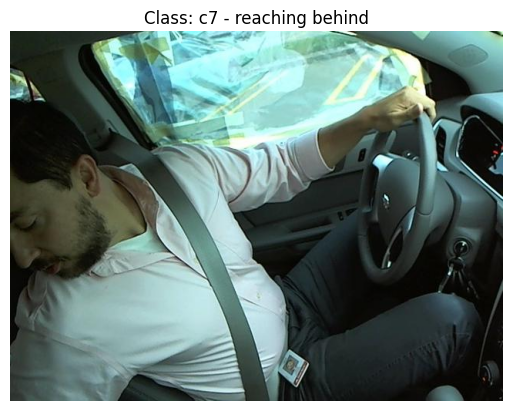

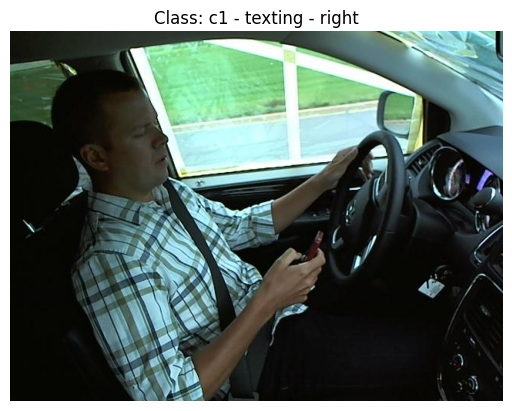

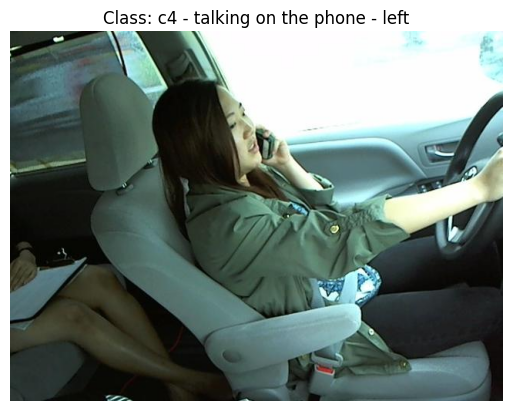

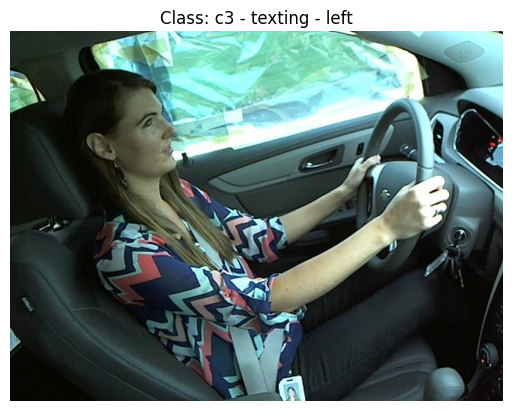

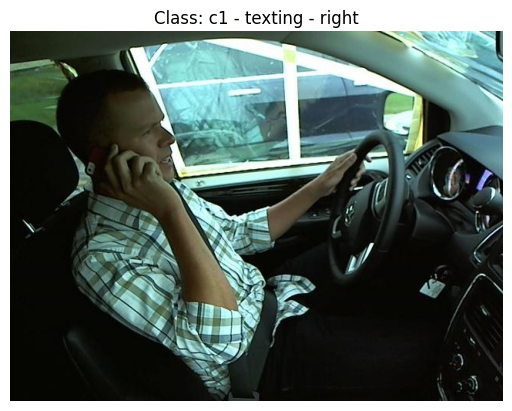

...

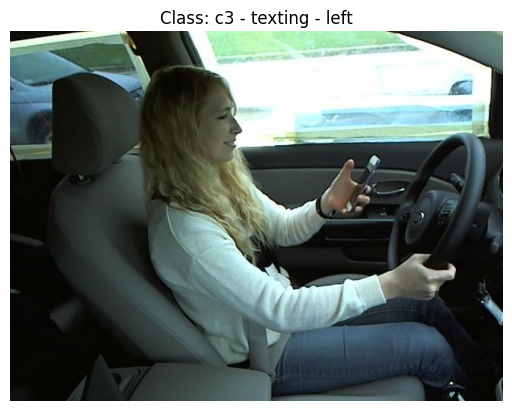

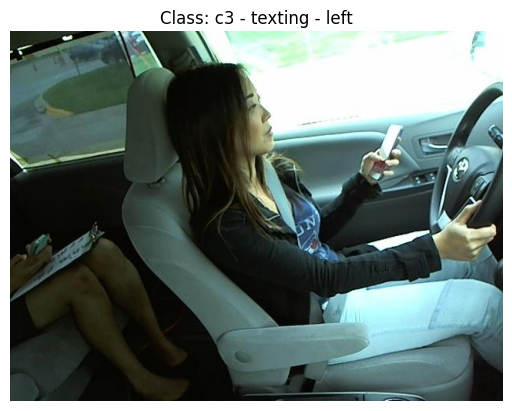

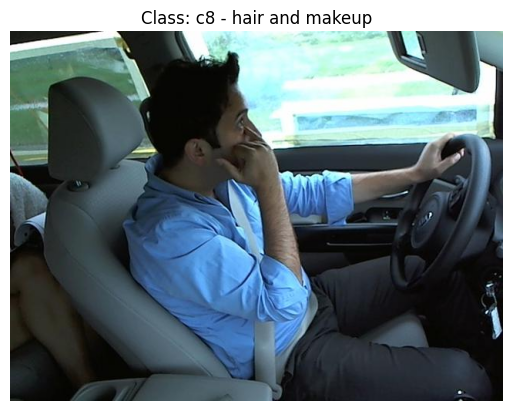

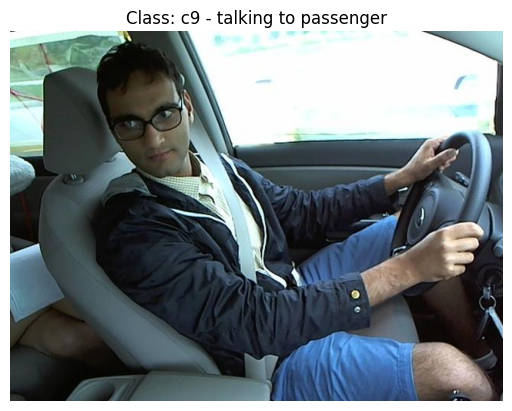

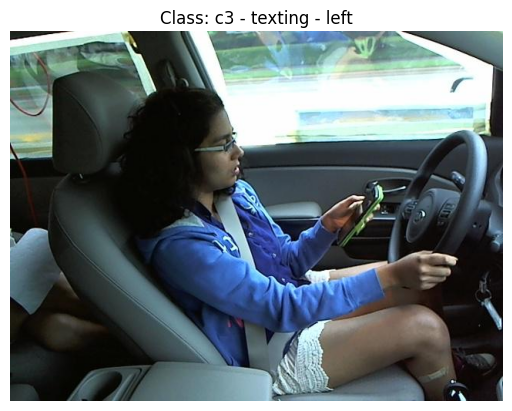

In [24]:
import matplotlib.pyplot as plt
from PIL import Image

samples= results.sample(n=20)

for index, row in samples.iterrows():
    img_path= os.path.join(test_dir, row['img'])

    image= Image.open(img_path)
    predict= row[1:11].apply(pd.to_numeric, errors='coerce')
    class_name= predict.idxmax()
    class_description= class_descriptions[class_name]

    plt.imshow(image)
    plt.title(f'Class: {class_name} - {class_description}')
    plt.axis('off')
    plt.show()